In [1]:
import pandas as pd
import numpy as np
from mlxtend.feature_selection import SequentialFeatureSelector as sfs
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.model_selection import KFold, RepeatedKFold,StratifiedKFold, train_test_split
from scipy.stats import randint as sp_randint
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)
import seaborn as sns
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
%matplotlib inline

#plt.xticks(rotation=60,fontsize=13)

In [2]:
#desc(data)
#plot_confusion_matrix(cm):

def plotLearningCurve(_model,_ColList,_xtrain,_ytrain,_cv=5):
    from sklearn.model_selection import learning_curve
    _LC_output=learning_curve(_model, _xtrain[_ColList], _ytrain, n_jobs=-1, cv=_cv, train_sizes=np.linspace(.1, 1.0, 5), verbose=0)

    _train_sizes, _train_scores, _test_scores =_LC_output[0],_LC_output[1],_LC_output[2]

    _train_scores_mean,_train_scores_std=np.mean(_LC_output[1], axis=1),np.std(_LC_output[1], axis=1)

    _test_scores_mean,_test_scores_std=np.mean(_LC_output[2], axis=1),np.std(_LC_output[2], axis=1)
    plt.figure(figsize=(15,5))
    plt.title("""Learning Curve to Understand wheather model has high bias, high variance or is ideal\n"""+str(_train_sizes))
    #plt.legend(loc="best")
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    plt.gca().invert_yaxis()
    #print()
     # plot the std deviation as a transparent range at each training set size
    plt.fill_between(_train_sizes, _train_scores_mean - _train_scores_std, _train_scores_mean + _train_scores_std, alpha=0.1, color="r")
    plt.fill_between(_train_sizes, _test_scores_mean - _test_scores_std, _test_scores_mean + _test_scores_std, alpha=0.1, color="g")
    #print(train_scores_mean)  
        # plot the average training and test score lines at each training set size
    plt.plot(_train_sizes, _train_scores_mean, 'o-', color="r", label="Training score")
    plt.plot(_train_sizes, _test_scores_mean, 'o-', color="g", label="Cross-validation score")
    
def desc(data):
    from sklearn.preprocessing import normalize
    unique_val=pd.DataFrame(index=data.columns)
    def obtain_variance(data):
        
        if data.dtypes in ('float64','int64'):
             xy1= pd.DataFrame(np.array(data*1.0))
             # variance values less than 0.006 ( threash hold), drop the column
            # If it is categorical binary column and if values 95:5 ratio, you drop the variable.
            #If it is continuous column and variance is less than 0.0066, you drop the variable (remember 0.0066 is value obtained after normalizing the variable).

             return "%3g"%xy1.var()[0]
        elif data.dtypes =='object':
            xy1= pd.DataFrame(data).copy()
            xy1.reset_index()
    def obtain_std(data):
        if data.dtypes in ('float64','int64'):
             return "%3g"%pd.DataFrame(data*1.0).std()[0]
    def obtain_mean(data):
        if data.dtypes in ('float64','int64'):
             return "%3g"%pd.DataFrame(data*1.0).mean()[0]
    def obtain_min(data):
        if data.dtypes in ('float64','int64'):
             return "%3g"%pd.DataFrame(data*1.0).min()[0]
    def obtain_max(data):
        if data.dtypes in ('float64','int64'):
             return "%3g"%pd.DataFrame(data*1.0).max()[0]
    for i in data.columns:
        unique_val.loc[i,'dtypes']=data[i].dtypes
        unique_val.loc[i,'null_count']=data[i].isnull().sum() 
        unique_val.loc[i,'total_count']=data[i].notnull().sum()
        unique_val.loc[i,'unique_count']=data[i].nunique()
        unique_val.loc[i,'missing value ratio']="%0.2g" %(data[i].isnull().sum()/len(data)) +'%'
        unique_val.loc[i,'variance of numerics']= obtain_variance(data[i])
        unique_val.loc[i,'std']= obtain_std(data[i])
        unique_val.loc[i,'mean']= obtain_mean(data[i])
        unique_val.loc[i,'min']= obtain_min(data[i])
        unique_val.loc[i,'mean']= obtain_max(data[i])
    return unique_val.sort_values(by=['unique_count','null_count'])

def plot_confusion_matrix(cm):
    plt.figure(figsize=[9, 6])
  
    df_cm = pd.DataFrame(
        cm, index=['Actual: No','Actual: Yes'], columns=['Predicted: No','Predicted: Yes']
    )
    dd= pd.DataFrame(np.array([['TP','FN'],['FP','TN']]))
    print(dd)
    #sns.heatmap(np.array([['TP','FP'],['FN','TN']]), annot=True, annot_kws={"size": 20},fmt='g', yticklabels=False)
    sns.heatmap(cm, annot=True, annot_kws={"size": 20},fmt='g', yticklabels=False,xticklabels=False)
    #plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.title('Actual False      Actual True', fontsize=18)
    plt.ylabel('Predicted True           Predicted False', fontsize=18)
    
def plot_roc_curve(model,X,Y):
    from sklearn.metrics import roc_curve
    pred = model.predict_proba(X)[:,1]

    fpr, tpr, _ = roc_curve(Y,pred) 
    auc = roc_auc_score(Y, pred) 

    #print(fpr,tpr,auc)
    
    plt.figure(figsize=(12,8)) 
    plt.plot(fpr,tpr,label="Validation AUC-ROC="+str(auc)) 
    x = np.linspace(0, 1, 1000)
    plt.plot(x, x, linestyle='-')
    plt.xlabel('False Positive Rate') 
    plt.ylabel('True Positive Rate') 
    plt.legend(loc=4) 

def plot_pr_curve(model,X,Y):
    fig= plt.figure(figsize=(12,7))
    probas = model_lr.predict_proba(X)[:,1]
    pred = model_lr.predict(X)

    #fpr, tpr, _ = roc_curve(Y,pred) 
    precision, recall, thresholds = precision_recall_curve(Y, probas)
    f1 = f1_score(Y, pred)
    auc_s = auc(recall, precision)
    #f1,auc
    print(recall[:])
    print('Logistic: f1=%.3f auc=%.3f' % (f1, auc_s))
    no_skill=len(Y[Y==1]) / len(Y)
    plt.plot([0, 1], [no_skill, no_skill], marker='^',linestyle='--', label='No Skill')
    plt.plot(recall, precision, marker='.', label='Logistic')
    plt.ylabel('Precison',fontsize=25) 
    plt.xlabel('Recall',fontsize=25)
    plt.legend(loc=4)
    
def classificationModelfit_CV(ml_model,dataframe, Y,cols, rstate = 12, thres = 0.5,  plotROC=0):
    i = 1
    roc_scores = []
    tpr_scores=[]
    fpr_scores=[]
    precision_scores=[]
    recall_scores=[]
    confusion_matrix_scores=[]
    accuracy_scores=[]
    f1_scores=[]
    PRCprecisions=[]
    PRCrecalls=[]
    PRCauc_scores=[]
    Number_of_Trues=[]
    df1 = dataframe.copy()
    df1 = dataframe[cols]
    cv_scoredf=pd.DataFrame()
    # 5 Fold cross validation stratified on the basis of target
    kf = StratifiedKFold(n_splits=5,random_state=rstate,shuffle=True)
    for df_index,test_index in kf.split(df1,Y):
        
        xtr,xvl = df1.loc[df_index],df1.loc[test_index]
        ytr,yvl = Y.loc[df_index],Y.loc[test_index]
        #print(xtr.shape,xvl.shape,ytr.shape,yvl.shape)
            
        # Define model for fitting on the training set for each fold
        model = ml_model
        model.fit(xtr, ytr)
        pred_probs = model.predict_proba(xvl)
        pp = []
        
        #plot_roc_curve(model,xtr,ytr)
        # Use threshold to define the classes based on probability values
        for j in pred_probs[:,1]:
            if j>thres:
                pp.append(1)
            else:
                pp.append(0)
         
        # Calculate scores for each fold and print
        pred_val = pp
        
        # ROC Matrix Data
        fpr, tpr, ROC_Threshholds = roc_curve(yvl,pred_probs[:,1]) 
        roc_score = roc_auc_score(yvl,pred_probs[:,1])
        recall = recall_score(yvl,pred_val)
        precision = precision_score(yvl,pred_val)
        accuracy_score1 = accuracy_score(yvl,pred_val)
        
        # Precession Recall matrix Data
        PRCprecision, PRCrecall, _ = precision_recall_curve(yvl, pred_probs[:,1])
        f1_sc = f1_score(yvl, pred_val)
        Number_of_True=len(yvl[yvl==1]) / len(yvl)
        PRCauc= auc(PRCrecall,PRCprecision)
        
        cm=confusion_matrix(yvl,pred_val)
        if plotROC==3:
            plot_confusion_matrix(cm)
         # Save scores

        roc_scores.append(roc_score)
        fpr_scores.append(fpr)
        tpr_scores.append(tpr)
        recall_scores.append(recall)
        precision_scores.append(precision)
        confusion_matrix_scores.append(cm)
        accuracy_scores.append(accuracy_score1)
        f1_scores.append(f1_sc)
        PRCprecisions.append(PRCprecision)
        PRCrecalls.append(PRCrecall)
        Number_of_Trues.append(Number_of_True)
        PRCauc_scores.append(PRCauc)
        
        i+=1   
    cv_scoredf['fpr_scores'] =fpr_scores
    cv_scoredf['tpr_scores'] =tpr_scores
    cv_scoredf['roc_scores'] =roc_scores
    cv_scoredf['recall_scores'] =recall_scores
    cv_scoredf['precision_scores'] =precision_scores
    cv_scoredf['confusion_matrix_scores']=confusion_matrix_scores
    cv_scoredf['accuracy_scores'] =accuracy_scores
    cv_scoredf['f1_scores'] =f1_scores
    cv_scoredf['PRCprecisions'] =PRCprecisions
    cv_scoredf['PRCrecalls'] =PRCrecalls
    cv_scoredf['Number_of_Trues'] =Number_of_Trues
    cv_scoredf['PRCauc_scores'] =PRCauc_scores
    
    
    if plotROC==1:
        plt.figure(figsize=(26,10))
        plt.title("""   ROC(Reciever Operating) Curve
    (Cross Validation)
    """,color='blue')
        #plt.plot(fpr,tpr,label="Non-CV AUC-ROC="+str("%  0.2f"%auc), linewidth=7,color='magenta') 
        for i in range(5):
            x = np.linspace(0, 1, 1000)
            plt.plot(x, x, linestyle='-')
            
            plt.plot(fpr_scores[i],tpr_scores[i],label="CV set=%i, Accuracy=%0.2f, AUC= %0.2f, Recall=%0.2f, Precison=%0.2f"
                     %(i,accuracy_scores[i],roc_scores[i],recall_scores[i],precision_scores[i])
                     ) 
            plt.legend(loc=4,fontsize=25)
            plt.xlabel('False Positive Rate') 
            plt.ylabel('True Positive Rate')          
    
    elif plotROC==2:  
        plt.figure(figsize=(26,10))
        plt.title("""   Precision Recall Curve
    (Cross Validation)
    """,color='blue')
        plt.plot([0, 1], [Number_of_Trues[0], Number_of_Trues[0]], marker='^',linestyle='--', label='Number of true values=%0.2f' %Number_of_Trues[0])

        for i in range(5):
                #  print("CV set=%i, Accuracy=%0.2f, f1_score=%0.2f, Number_of_Trues=%0.2f, prcAUC_scores=%0.2f "
                #       %(i, accuracy_scores[i], f1_scores[i], Number_of_Trues[i], PRCauc_scores[i]  ))
                
                plt.plot(PRCrecalls[i],PRCprecisions[i], marker='.', 
                         label="CV set=%i, Accuracy=%0.2f, f1_score=%0.2f, prcAUC_scores=%0.2f,Recall=%0.2f, Precison=%0.2f "
                      %(i, accuracy_scores[i], f1_scores[i], PRCauc_scores[i],recall_scores[i],precision_scores[i]  ))
                plt.ylabel('Precison',fontsize=25) 
                plt.xlabel('Recall',fontsize=25)
                plt.legend(loc=4,fontsize=25)         
    else:
        for i in range(5):
            print('\n{} of kfold {}'.format(i,kf.n_splits))
            sufix = ""
            msg = ""
            msg += "CV1 set=%i,Accuracy=%0.2f, AUC= %0.2f, Recall=%0.2f, Precison=%0.2f"%(i,accuracy_scores[i],roc_scores[i],recall_scores[i],precision_scores[i])
            print("{}".format(msg))
            print(confusion_matrix_scores[i])
            print("CV set=%i, Accuracy=%0.2f, f1_score=%0.2f, Number_of_Trues=%0.2f,prcAUC_scores=%0.2f, Recall=%0.2f, Precison=%0.2f"
              %(i,accuracy_scores[i],f1_scores[i],Number_of_Trues[i], PRCauc_scores[i],recall_scores[i],precision_scores[i] ))
            
    return cv_scoredf

def regressionModelfit_CV(alg, cols,  x, y,algo_name):
    #Fit the algorithm on the data
    print('------------      ' + algo_name + '     ------------')
    _list1=[]
    _df=pd.DataFrame(columns=[algo_name])
    from sklearn.model_selection import cross_val_score
    from sklearn.model_selection import cross_validate
    xdata= x[cols]
    ydata=y
    alg.fit(xdata, ydata)
        
    #Predict training set:
    dtrain_predictions = alg.predict(xdata)

    
    cv_score = cross_val_score(alg, xdata, ydata, cv=4,scoring= 'neg_mean_squared_error')
    #Perform cross-validation:
    cv_matrix_score= cross_validate(alg, xdata, ydata, cv=4,scoring=(
                         'r2', 
                         'neg_mean_absolute_error',
                         'neg_mean_squared_error'
                         ),
                         return_train_score=True,verbose=0)
    #return cv_matrix_score
    avg_model_Scores=pd.DataFrame(cv_matrix_score).mean()
    for i in avg_model_Scores.index:
        
        if 'neg' in i :
            score="%s =%0.2f" %(i, np.sqrt(avg_model_Scores[i]*-1) )
            _df.loc[i]=np.sqrt(avg_model_Scores[i]*-1)
            print(score)
        else:
            score="%s =%0.2f" %(i, avg_model_Scores[i] )
            _df.loc[i]=avg_model_Scores[i]
            print(score)
    return _df[algo_name]
    #dtest[target] = alg.predict(dtest[predictors])
    
    #Export submission file:
    #IDcol.append(target)
    #submission = pd.DataFrame({ x: dtest[x] for x in IDcol})
    #submission.to_csv(filename, index=False)

def getLinearModelScore(_model, xTrainingData,yTrainingData,columnlist):
    xTrainingData=xTrainingData[columnlist]
    x_train, x_test, y_train, y_test = train_test_split(xTrainingData,yTrainingData, test_size =0.3)
    _model.fit(x_train, y_train)
    ptrain = _model.predict(x_train)
    ptest = _model.predict(x_test)
    from sklearn.metrics import mean_squared_error
    print("train MSE="%(mean_squared_error(ptrain,y_train)))
    print("test MSE="%(mean_squared_error(ptest,y_test)))
    
    
    

In [3]:
# My Customized wrapper Functions over Matplotlib and SeabornLib
import getPreProcessingFunction as PPM
import BiVEDA_Function as BiVEDA
import UniVEDA_catFunction as catUniVEDA
import UniVEDA_conti_methods as contiUniVEDA

getFuncs()
getFuncs()
getFuncs()
getFuncs()


In [4]:
  print("""Here is quick estimation of influence of categorical variable on SalePrice. For each variable SalePrices are partitioned to distinct sets based on category values. Then check with ANOVA test if sets have similar distributions. If variable has minor impact then set means should be equal. Decreasing pval is sign of increasing diversity in partitions.""")
  

Here is quick estimation of influence of categorical variable on SalePrice. For each variable SalePrices are partitioned to distinct sets based on category values. Then check with ANOVA test if sets have similar distributions. If variable has minor impact then set means should be equal. Decreasing pval is sign of increasing diversity in partitions.


In [5]:
# Bivariaate Analysis
#Conti_Vs_Cat_Cols_BoxPlot(gpByCategroical_Col, contineoua_col_name, dataFrame):
#Conti_Vs_Cat_Cols_MeanValue_barplot(catColList,Contineous_col, dataFrame):
#Bivariate_Ana_Catogorical_over_ContiLabel_Pivotmean(groupColumn, Conti_label_column, Dataframe):
#SNS_ScatterSubplots_Bivariate_conti_cols_with_yConti(conti_col,yColumn,df)

#crossTabHistGramPlotSplit(groupColumn, BinaryValColumn, Dataframe)
#crossTabHistGramPlot(groupColumn, BinaryValColumn, Dataframe):
#Bivariate_numericCol_Distribtion_overLabelClass(numeric_Conti_columnList,LabelColname,dataframe)

#correlation_heatmap(numeric_colList, dataframe)
#Bivariate_ana_conti_vs_Conti_label_scatter(conti_ColList,conti_label_name, dataFrame)

# privotTabHistGramPlot renamed to Bivariate_Ana_Catogorical_over_ContiLabel_Pivotmean


    
def crossTabHistGramPlot(groupColumn, BinaryValColumn, Dataframe):
    plt1 = plt
    i = 430
    j = 1
    fig= plt1.figure(figsize=(30,30))
    plt1.suptitle("Catagorical Cols Analysis with status/label columns " + BinaryValColumn)
    for colname in groupColumn:
        ax1 = plt1.subplot(j+i)
        i = i + 1
        CreditHistory_loanStatus = pd.crosstab(Dataframe[colname], Dataframe[BinaryValColumn])
        CreditHistory_loanStatus.plot(kind='bar', stacked=True, grid=False, ax = ax1)
        plt1.xticks(rotation=12,fontsize=25)
        plt1.xlabel(colname,fontsize=25)
        plt1.ylabel(BinaryValColumn)
        
        plt1.legend(fontsize=20)
        #plt1.title(colname)
    plt1.show()

In [6]:
train_org=pd.read_csv("/Users/keeratjohar2305/Downloads/Dataset/data/AV_trainBigDataMartSales.txt")
test_org=pd.read_csv("/Users/keeratjohar2305/Downloads/Dataset/data/AV_testBigDataMartSales.txt")
train=train_org.copy()
test=test_org.copy()
label_col='Item_Outlet_Sales'
ntest=test.shape[1]
print(train.shape,test.shape)

(8523, 12) (5681, 11)


In [7]:
ntrain=train.shape[0]
ntrain

8523

In [8]:
train_test=pd.concat([train_org,test_org],ignore_index=True)

In [9]:
PPM.desc(test_org)

,dtypes,null_count,total count,unique_count,missing value ratio,variance of numerics,std,mean,min,max,skew,kurt
Outlet_Location_Type,object,0.0,5681.0,3.0,0.00,0.00,0.00,0.00,0.000,0.00,0.000,0.000
Outlet_Size,object,1606.0,4075.0,3.0,28.27,0.00,0.00,0.00,0.000,0.00,0.000,0.000
Outlet_Type,object,0.0,5681.0,4.0,0.00,0.00,0.00,0.00,0.000,0.00,0.000,0.000
Item_Fat_Content,object,0.0,5681.0,5.0,0.00,0.00,0.00,0.00,0.000,0.00,0.000,0.000
Outlet_Establishment_Year,int64,0.0,5681.0,9.0,0.00,70.09,8.37,1997.83,1985.000,2009.00,-0.396,-1.206
Outlet_Identifier,object,0.0,5681.0,10.0,0.00,0.00,0.00,0.00,0.000,0.00,0.000,0.000
Item_Type,object,0.0,5681.0,16.0,0.00,0.00,0.00,0.00,0.000,0.00,0.000,0.000
Item_Weight,float64,976.0,4705.0,410.0,17.18,21.76,4.66,12.70,4.555,21.35,0.130,-1.226
Item_Identifier,object,0.0,5681.0,1543.0,0.00,0.00,0.00,0.00,0.000,0.00,0.000,0.000
Item_MRP,float64,0.0,5681.0,4402.0,0.00,3820.36,61.81,141.02,31.990,266.59,0.136,-0.900


In [10]:
PPM.desc1(train_org,1,label_col)

,dtypes,null_count,total count,unique_count,missing value ratio,variance of numerics,std,mean,min,max,skew,kurt,Numeric pearSonCorr withTarget
Item_Outlet_Sales,float64,0.0,8523.0,3493.0,0.00,2912140.00,1706.50,2181.29,33.290,13087.00,1.178,1.616,1.000000
Item_MRP,float64,0.0,8523.0,5938.0,0.00,3878.18,62.28,140.99,31.290,266.89,0.127,-0.890,0.567574
Item_Visibility,float64,0.0,8523.0,7880.0,0.00,0.00,0.05,0.07,0.000,0.33,1.167,1.679,0.128625
Outlet_Establishment_Year,int64,0.0,8523.0,9.0,0.00,70.09,8.37,1997.83,1985.000,2009.00,-0.397,-1.206,0.049135
Item_Weight,float64,1463.0,7060.0,415.0,17.17,21.56,4.64,12.86,4.555,21.35,0.082,-1.228,0.014123
Outlet_Size,object,2410.0,6113.0,3.0,28.28,0.00,0.00,0.00,0.000,0.00,0.000,0.000,0.000000
Outlet_Location_Type,object,0.0,8523.0,3.0,0.00,0.00,0.00,0.00,0.000,0.00,0.000,0.000,0.000000
Outlet_Type,object,0.0,8523.0,4.0,0.00,0.00,0.00,0.00,0.000,0.00,0.000,0.000,0.000000
Item_Fat_Content,object,0.0,8523.0,5.0,0.00,0.00,0.00,0.00,0.000,0.00,0.000,0.000,0.000000
Outlet_Identifier,object,0.0,8523.0,10.0,0.00,0.00,0.00,0.00,0.000,0.00,0.000,0.000,0.000000


In [11]:
summy=PPM.desc1(train_org,1,label_col)
object_cols=summy[summy['dtypes']=='object'].index
object_cols=set(object_cols).difference(set(['Item_Identifier']))
numeric_cols=summy[summy['dtypes']!='object'].index.drop(label_col)
id=['Item_Identifier','Outlet_Identifier']

 Bar char for Categorial Columns 
{'Outlet_Identifier', 'Outlet_Location_Type', 'Item_Type', 'Outlet_Size', 'Outlet_Type', 'Item_Fat_Content'}


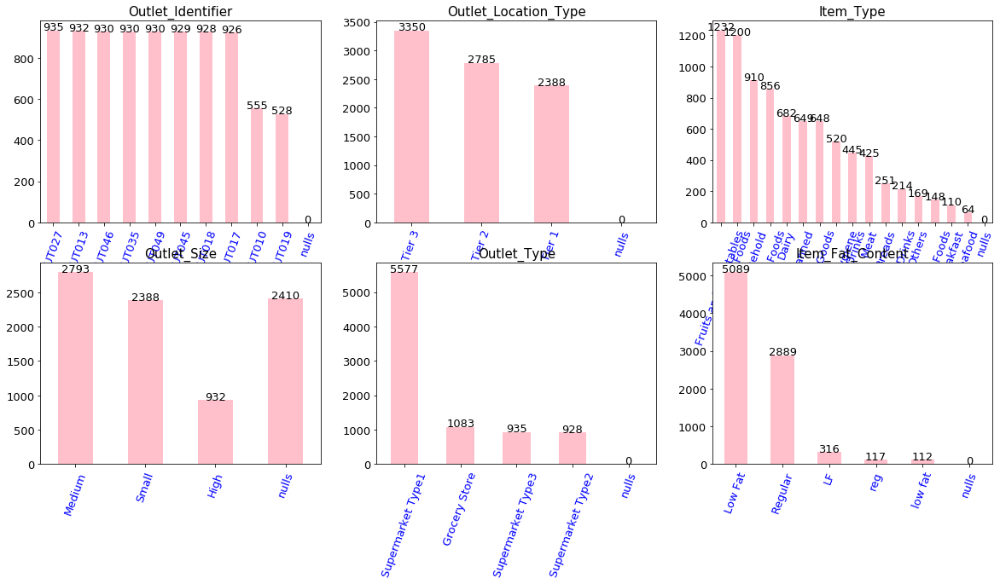

In [12]:
catUniVEDA.UniVEDA_cat_cols_BAR(object_cols,train_org)

In [13]:
# Encoding Item_Fat_Content

In [14]:
# 
#  1) Item Fat content Categories are mis-spelled
#  2) the Item Type , there are many different categories, So it need to merged somehow
#  3) Super market2 and super market 3 can be merged in Outlet type, As sub categrory are not distributed properly.

# We use
print('\nModified Categories for :' , 'Item_Fat_Content')
train_test['Item_Fat_Content'] = train_test['Item_Fat_Content'].replace({'LF': 1,
                                                                         'Low Fat':1,
                                                                         'low fat':1,
                                                                         'reg':2,
                                                                         'Regular':2
                                                                        })



Modified Categories for : Item_Fat_Content


In [15]:
# Imputing Nulls Outlet_Size

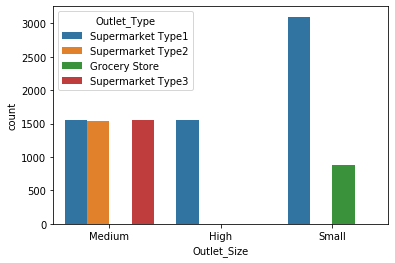

In [16]:
sns.countplot('Outlet_Size',hue='Outlet_Type',data=train_test)


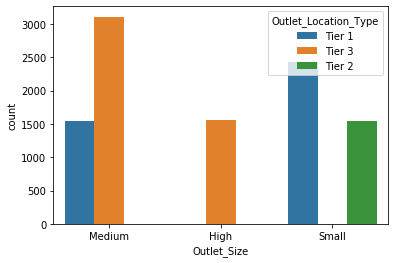

In [17]:
sns.countplot('Outlet_Size',hue='Outlet_Location_Type',data=train_test)

In [18]:
#train_test.pivot_table('Outlet_Size',index='Outlet_Identifier',aggfunc=pd.Series.mode)
train.groupby(['Outlet_Identifier'])['Outlet_Type'].agg(pd.Series.mode)#.mode(np.mode())

Outlet_Identifier
OUT010        Grocery Store
OUT013    Supermarket Type1
OUT017    Supermarket Type1
OUT018    Supermarket Type2
OUT019        Grocery Store
OUT027    Supermarket Type3
OUT035    Supermarket Type1
OUT045    Supermarket Type1
OUT046    Supermarket Type1
OUT049    Supermarket Type1
Name: Outlet_Type, dtype: object

In [19]:
#train_test.pivot_table('Outlet_Size',index='Outlet_Identifier',aggfunc=pd.Series.mode)
test.groupby(['Outlet_Identifier'])['Outlet_Type'].agg(pd.Series.mode)#.mode(np.mode())

Outlet_Identifier
OUT010        Grocery Store
OUT013    Supermarket Type1
OUT017    Supermarket Type1
OUT018    Supermarket Type2
OUT019        Grocery Store
OUT027    Supermarket Type3
OUT035    Supermarket Type1
OUT045    Supermarket Type1
OUT046    Supermarket Type1
OUT049    Supermarket Type1
Name: Outlet_Type, dtype: object

In [20]:
train.groupby(['Outlet_Location_Type'])['Outlet_Size'].agg(pd.Series.mode)#.mode(np.mode())

Outlet_Location_Type
Tier 1     Small
Tier 2     Small
Tier 3    Medium
Name: Outlet_Size, dtype: object

In [21]:
nulls_loc=train[train['Outlet_Size'].isna()]['Outlet_Location_Type'].value_counts().index
print(nulls_loc)
train[train['Outlet_Size'].isna()].groupby(['Outlet_Identifier'])['Outlet_Location_Type'].agg(pd.Series.mode)

Index(['Tier 2', 'Tier 3'], dtype='object')


Outlet_Identifier
OUT010    Tier 3
OUT017    Tier 2
OUT045    Tier 2
Name: Outlet_Location_Type, dtype: object

In [22]:
train.groupby(['Outlet_Location_Type'])['Outlet_Size'].agg(pd.Series.mode)#.mode(np.mode())

Outlet_Location_Type
Tier 1     Small
Tier 2     Small
Tier 3    Medium
Name: Outlet_Size, dtype: object

In [23]:
train.groupby(['Outlet_Location_Type'])['Outlet_Type'].agg(pd.Series.mode)#.mode(np.mode())

Outlet_Location_Type
Tier 1    Supermarket Type1
Tier 2    Supermarket Type1
Tier 3    Supermarket Type3
Name: Outlet_Type, dtype: object

In [24]:
train.groupby(['Outlet_Type'])['Outlet_Size'].agg(pd.Series.mode)#.mode(np.mode())

Outlet_Type
Grocery Store         Small
Supermarket Type1     Small
Supermarket Type2    Medium
Supermarket Type3    Medium
Name: Outlet_Size, dtype: object

In [25]:
cond=(train_test['Outlet_Size'].isna())
train_test.loc[cond & (train_test['Outlet_Identifier']=='OUT010') & (train_test['Outlet_Type']=='Grocery Store'),'Outlet_Size']='Medium'
train_test.loc[cond & (train_test['Outlet_Identifier']=='OUT045') & (train_test['Outlet_Type']=='Supermarket Type1'),'Outlet_Size']='Small'
train_test.loc[cond & (train_test['Outlet_Identifier']=='OUT017') & (train_test['Outlet_Type']=='Supermarket Type1'),'Outlet_Size']='Small'

In [26]:
# Encoding Outlet_Size

In [27]:
train_test['Outlet_Size']=train_test['Outlet_Size'].replace({'Small':1,
                                                            'Medium':2,
                                                            'High':3})

In [28]:
PPM.desc(train_test)

,dtypes,null_count,total count,unique_count,missing value ratio,variance of numerics,std,mean,min,max,skew,kurt
Item_Fat_Content,int64,0.0,14204.0,2.0,0.00,0.23,0.48,1.35,1.000,2.00,0.614,-1.624
Outlet_Location_Type,object,0.0,14204.0,3.0,0.00,0.00,0.00,0.00,0.000,0.00,0.000,0.000
Outlet_Size,int64,0.0,14204.0,3.0,0.00,0.46,0.68,1.61,1.000,3.00,0.655,-0.670
Outlet_Type,object,0.0,14204.0,4.0,0.00,0.00,0.00,0.00,0.000,0.00,0.000,0.000
Outlet_Establishment_Year,int64,0.0,14204.0,9.0,0.00,70.08,8.37,1997.83,1985.000,2009.00,-0.396,-1.206
Outlet_Identifier,object,0.0,14204.0,10.0,0.00,0.00,0.00,0.00,0.000,0.00,0.000,0.000
Item_Type,object,0.0,14204.0,16.0,0.00,0.00,0.00,0.00,0.000,0.00,0.000,0.000
Item_Weight,float64,2439.0,11765.0,415.0,17.17,21.65,4.65,12.79,4.555,21.35,0.101,-1.228
Item_Identifier,object,0.0,14204.0,1559.0,0.00,0.00,0.00,0.00,0.000,0.00,0.000,0.000
Item_Outlet_Sales,float64,5681.0,8523.0,3493.0,40.00,2912140.00,1706.50,2181.29,33.290,13087.00,1.178,1.616


In [29]:
# Imputing nulls in Item_Weight

In [30]:
cond=(train_test['Item_Weight'].isna())
train_test.loc[cond,'Item_Identifier'].nunique()

1559

In [31]:
cond=(train_test['Item_Weight'].isna())
train_test.loc[cond,'Item_Weight']
map1=dict(train_test.groupby(['Item_Identifier'])['Item_Weight'].median())
map1
#pd.pivot_table('Item_Weight',index='Item_Identifier',aggfunc=np.mean())
train_test.loc[cond,'Item_Weight']=train_test.loc[cond,'Item_Identifier'].apply(lambda x :map1[x] )

In [32]:
PPM.desc(train_test)

,dtypes,null_count,total count,unique_count,missing value ratio,variance of numerics,std,mean,min,max,skew,kurt
Item_Fat_Content,int64,0.0,14204.0,2.0,0.0,0.23,0.48,1.35,1.000,2.00,0.614,-1.624
Outlet_Location_Type,object,0.0,14204.0,3.0,0.0,0.00,0.00,0.00,0.000,0.00,0.000,0.000
Outlet_Size,int64,0.0,14204.0,3.0,0.0,0.46,0.68,1.61,1.000,3.00,0.655,-0.670
Outlet_Type,object,0.0,14204.0,4.0,0.0,0.00,0.00,0.00,0.000,0.00,0.000,0.000
Outlet_Establishment_Year,int64,0.0,14204.0,9.0,0.0,70.08,8.37,1997.83,1985.000,2009.00,-0.396,-1.206
Outlet_Identifier,object,0.0,14204.0,10.0,0.0,0.00,0.00,0.00,0.000,0.00,0.000,0.000
Item_Type,object,0.0,14204.0,16.0,0.0,0.00,0.00,0.00,0.000,0.00,0.000,0.000
Item_Weight,float64,0.0,14204.0,415.0,0.0,21.64,4.65,12.79,4.555,21.35,0.100,-1.227
Item_Identifier,object,0.0,14204.0,1559.0,0.0,0.00,0.00,0.00,0.000,0.00,0.000,0.000
Item_Outlet_Sales,float64,5681.0,8523.0,3493.0,40.0,2912140.00,1706.50,2181.29,33.290,13087.00,1.178,1.616


In [33]:
train_test['Item_Visibility'].isna().sum()

0

In [34]:
train[train['Item_Visibility']==0]['Item_Identifier'].nunique()#groupby(['Item_Identifier'])Item_Visibility

446

In [35]:
train_test[train_test['Item_Visibility']>0]['Item_Visibility'].nunique()#groupby(['Item_Identifier'])Item_Visibility

13005

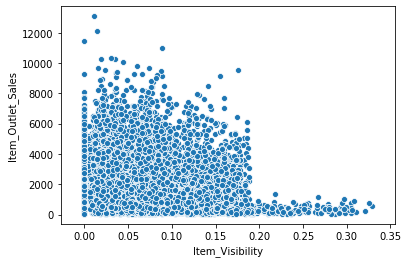

In [36]:
sns.scatterplot(x='Item_Visibility',y=label_col,data=train)

In [37]:
train[train['Item_Visibility']<1.9].head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700
3,FDX07,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
4,NCD19,8.93,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052


In [38]:
itemID_vis_Map=dict(train_test[train_test['Item_Visibility']<1.9].groupby(['Item_Identifier'])['Item_Visibility'].mean().round(6))
#itemID_vis_Map

In [39]:
train.loc[train['Item_Visibility']>0.19,'Item_Visibility'].shape
train_test[:ntrain].loc[train_test[:ntrain]['Item_Visibility']>0.190,'Item_Visibility']=train_test[:ntrain].loc[train_test[:ntrain]['Item_Visibility']>0.190]['Item_Identifier'].apply(lambda x:itemID_vis_Map[x])

In [40]:
train_test[:ntrain].loc[train_test[:ntrain]['Item_Visibility']==0,'Item_Visibility']=train_test[:ntrain].loc[train_test[:ntrain]['Item_Visibility']==0]['Item_Identifier'].apply(lambda x:itemID_vis_Map[x])

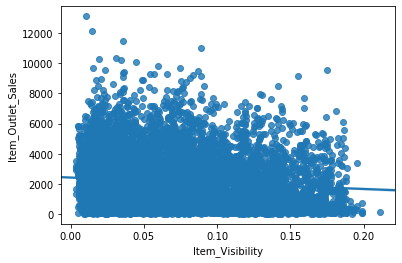

In [41]:
sns.regplot(x='Item_Visibility',y=label_col,data=train_test[:ntrain])

In [42]:
train_test[:ntrain].loc[train_test['Item_Visibility']>0.19,'Item_Visibility']

521     0.191440
854     0.195679
1805    0.198856
2586    0.192577
2677    0.195679
2855    0.211315
3474    0.199054
4382    0.190825
4674    0.191354
5031    0.191354
5150    0.198975
5734    0.195575
6674    0.199054
7388    0.192273
8273    0.194127
Name: Item_Visibility, dtype: float64

In [43]:
ouliers_items=train_test[:ntrain].loc[train_test['Item_Visibility']>0.19,'Item_Identifier']
#.value_counts()

In [44]:
newItemVisiMap=dict(train_test[:ntrain][train_test[:ntrain]['Item_Identifier'].isin(ouliers_items)].groupby('Item_Identifier')['Item_Visibility'].mean().round(5))

In [45]:
ouliers_items_idx=train_test[:ntrain].ix[train_test['Item_Visibility']>0.19,'Item_Identifier'].index
ouliers_items_idx

Int64Index([ 521,  854, 1805, 2586, 2677, 2855, 3474, 4382, 4674, 5031, 5150,
            5734, 6674, 7388, 8273],
           dtype='int64')

In [46]:
train_test.loc[ouliers_items_idx,'Item_Visibility']=train_test.ix[ouliers_items_idx]['Item_Identifier'].apply(lambda x:newItemVisiMap[x])

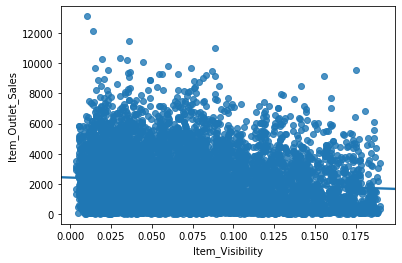

In [47]:
sns.regplot(x='Item_Visibility',y=label_col,data=train_test[:ntrain])

# Feature Engineering test

In [48]:
item_cols=[label_col,'Item_MRP','Item_Visibility']
df=train[item_cols]

In [49]:
df['Item_MRP_+_Visi']=df['Item_MRP'] + df['Item_Visibility']
df['Item_MRP_X_Visi']=df['Item_MRP'] * df['Item_Visibility']

In [50]:
PPM.desc1(df,1,label_col)

,dtypes,null_count,total count,unique_count,missing value ratio,variance of numerics,std,mean,min,max,skew,kurt,Numeric pearSonCorr withTarget
Item_Outlet_Sales,float64,0.0,8523.0,3493.0,0.0,2912140.00,1706.50,2181.29,33.2900,13087.00,1.178,1.616,1.000000
Item_MRP,float64,0.0,8523.0,5938.0,0.0,3878.18,62.28,140.99,31.2900,266.89,0.127,-0.890,0.567574
Item_MRP_+_Visi,float64,0.0,8523.0,8512.0,0.0,3878.18,62.27,141.06,31.3317,267.03,0.127,-0.890,0.567468
Item_MRP_X_Visi,float64,0.0,8523.0,7998.0,0.0,79.15,8.90,9.32,0.0000,82.35,1.773,4.416,0.136787
Item_Visibility,float64,0.0,8523.0,7880.0,0.0,0.00,0.05,0.07,0.0000,0.33,1.167,1.679,0.128625


 Its a kind of scatter plot 
Index(['Item_MRP', 'Item_Visibility', 'Item_MRP_+_Visi', 'Item_MRP_X_Visi'], dtype='object')


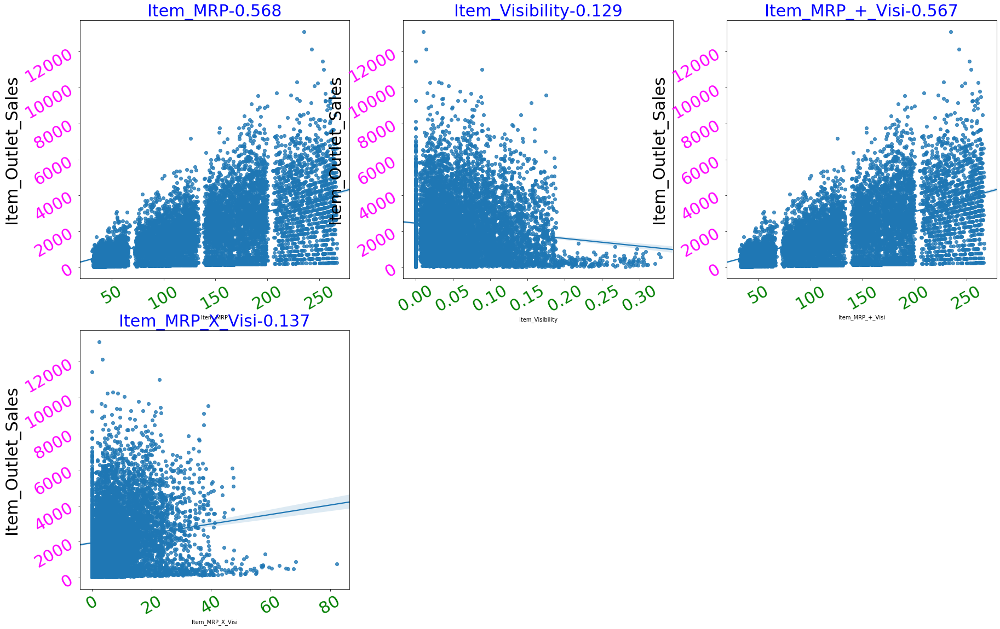

In [51]:
BiVEDA.BiVEDA_conti_cols_regplot_over_yConti(df.columns[1:],label_col, df)
#BiVEDA.All_VEDA_conti_higly_correlation_cols_pairplot_scatterplot(df.columns[1:],label_col, df)

In [52]:
item_cols=[label_col,'Item_MRP','Item_Weight']
df=train[item_cols]

In [53]:
df['Item_MRP_+_Weight']=df['Item_MRP'] + df['Item_Weight']
df['Item_MRP_X_Weight']=df['Item_MRP'] * df['Item_Weight']

 Its a kind of scatter plot 
Index(['Item_MRP', 'Item_Weight', 'Item_MRP_+_Weight', 'Item_MRP_X_Weight'], dtype='object')


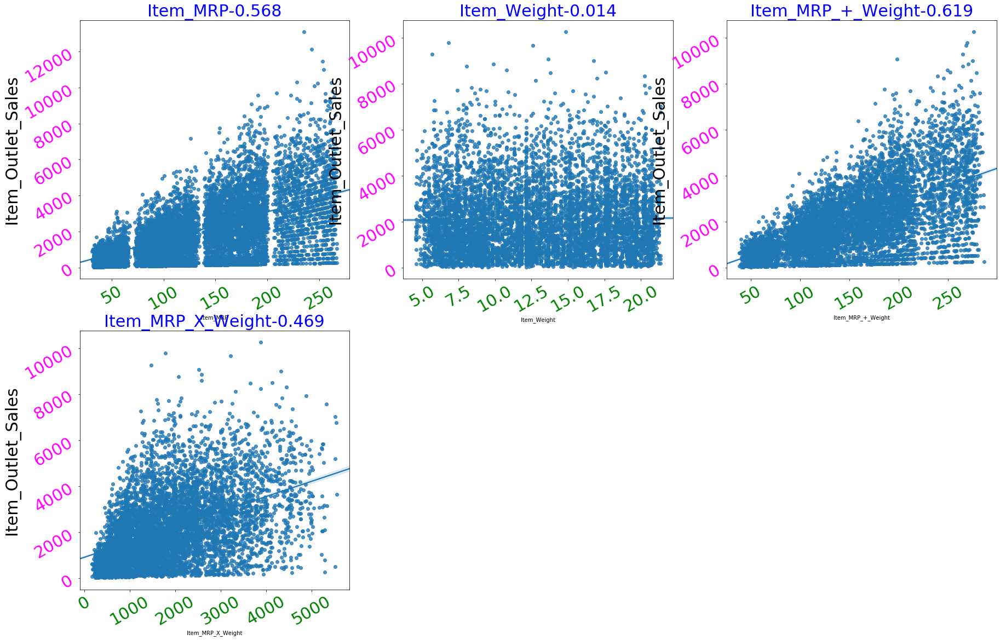

In [54]:
BiVEDA.BiVEDA_conti_cols_regplot_over_yConti(df.columns[1:],label_col, df)
#BiVEDA.All_VEDA_conti_higly_correlation_cols_pairplot_scatterplot(df.columns[1:],label_col, df)

In [55]:
PPM.desc1(train_test,1,label_col)

,dtypes,null_count,total count,unique_count,missing value ratio,variance of numerics,std,mean,min,max,skew,kurt,Numeric pearSonCorr withTarget
Item_Outlet_Sales,float64,5681.0,8523.0,3493.0,40.0,2912140.00,1706.50,2181.29,33.290,13087.00,1.178,1.616,1.000000
Item_MRP,float64,0.0,14204.0,8052.0,0.0,3854.79,62.09,141.00,31.290,266.89,0.131,-0.894,0.567574
Item_Visibility,float64,0.0,14204.0,13384.0,0.0,0.00,0.05,0.07,0.000,0.32,0.978,0.910,0.099271
Outlet_Size,int64,0.0,14204.0,3.0,0.0,0.46,0.68,1.61,1.000,3.00,0.655,-0.670,0.060517
Outlet_Establishment_Year,int64,0.0,14204.0,9.0,0.0,70.08,8.37,1997.83,1985.000,2009.00,-0.396,-1.206,0.049135
Item_Fat_Content,int64,0.0,14204.0,2.0,0.0,0.23,0.48,1.35,1.000,2.00,0.614,-1.624,0.018719
Item_Weight,float64,0.0,14204.0,415.0,0.0,21.64,4.65,12.79,4.555,21.35,0.100,-1.227,0.013261
Outlet_Location_Type,object,0.0,14204.0,3.0,0.0,0.00,0.00,0.00,0.000,0.00,0.000,0.000,0.000000
Outlet_Type,object,0.0,14204.0,4.0,0.0,0.00,0.00,0.00,0.000,0.00,0.000,0.000,0.000000
Outlet_Identifier,object,0.0,14204.0,10.0,0.0,0.00,0.00,0.00,0.000,0.00,0.000,0.000,0.000000


In [56]:
train_test['Outlet_Age']= train_test['Outlet_Establishment_Year'] - (train_test['Outlet_Establishment_Year'].min()-1)

Plot where conti_column scatter  Over Item_Outlet_Sales
cat column list= ['Outlet_Age', 'Outlet_Establishment_Year']
 Bar char for Categorial Columns 
['Outlet_Age', 'Outlet_Establishment_Year']


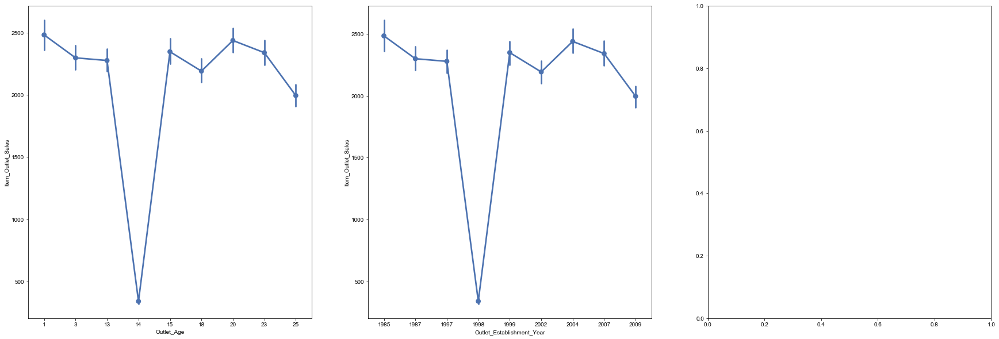

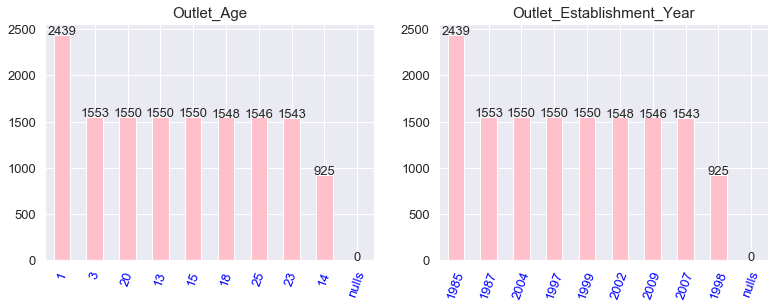

In [57]:
BiVEDA.BiVEDA_cat_cols_SNS_FACTOR_LINE_over_yConti(['Outlet_Age','Outlet_Establishment_Year'],label_col,train_test)
catUniVEDA.UniVEDA_cat_cols_BAR(['Outlet_Age','Outlet_Establishment_Year'],train_test)

In [58]:
#BiVEDA.BiVEDA_cat_cols_SNS_FACTOR_LINE_over_yConti(['Outlet_Age','Outlet_Establishment_Year'],'Item_MRP',train_test)

In [59]:
PPM.desc1(train_test,1,label_col).T

,Item_Outlet_Sales,Item_MRP,Item_Visibility,Outlet_Size,Outlet_Establishment_Year,Outlet_Age,Item_Fat_Content,Item_Weight,Outlet_Location_Type,Outlet_Type,Outlet_Identifier,Item_Type,Item_Identifier
dtypes,float64,float64,float64,int64,int64,int64,int64,float64,object,object,object,object,object
null_count,5681,0,0,0,0,0,0,0,0,0,0,0,0
total count,8523,14204,14204,14204,14204,14204,14204,14204,14204,14204,14204,14204,14204
unique_count,3493,8052,13384,3,9,9,2,415,3,4,10,16,1559
missing value ratio,40,0,0,0,0,0,0,0,0,0,0,0,0
variance of numerics,2.91214e+06,3854.79,0,0.46,70.08,70.08,0.23,21.64,0,0,0,0,0
std,1706.5,62.09,0.05,0.68,8.37,8.37,0.48,4.65,0,0,0,0,0
mean,2181.29,141,0.07,1.61,1997.83,13.83,1.35,12.79,0,0,0,0,0
min,33.29,31.29,0,1,1985,1,1,4.555,0,0,0,0,0
max,13087,266.89,0.32,3,2009,25,2,21.35,0,0,0,0,0


In [60]:
item_col=[label_col,'Item_Fat_Content','Item_Weight']
df=train_test[item_col]

In [61]:
df['Fat_Con_+_Weight']=train_test['Item_Fat_Content']+train_test['Item_Weight']
df['Fat_Con_X_Weight']=train_test['Item_Fat_Content']*train_test['Item_Weight']

 Its a kind of scatter plot 
Index(['Item_Fat_Content', 'Item_Weight', 'Fat_Con_+_Weight',
       'Fat_Con_X_Weight'],
      dtype='object')


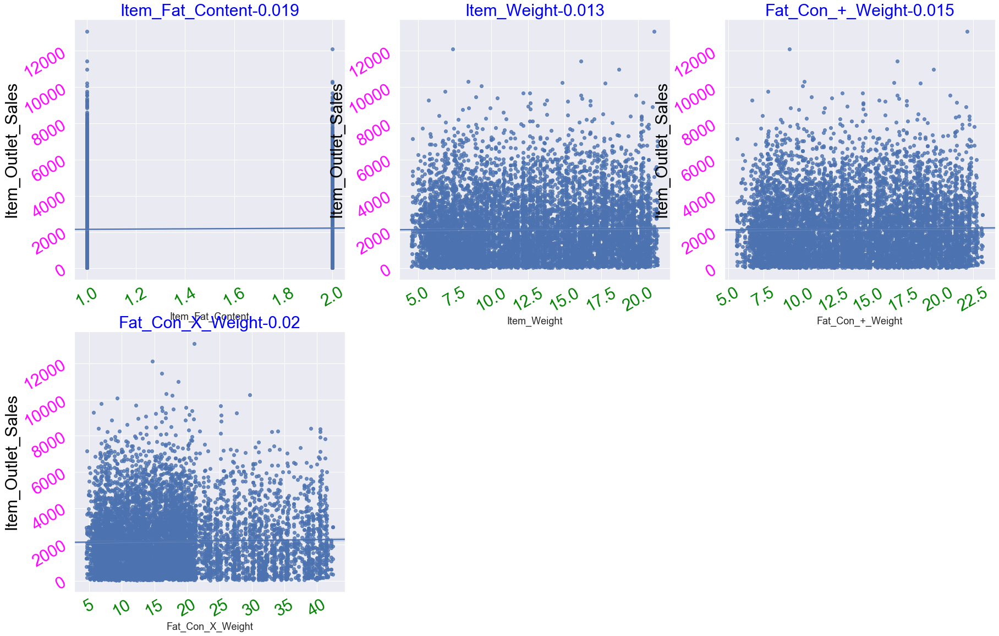

In [62]:
BiVEDA.BiVEDA_conti_cols_regplot_over_yConti(df.columns[1:],label_col, df)

In [63]:
train['Item_Category'] = train['Item_Identifier'].apply(lambda x: x[0:2]).map({'FD':'Food',
                                                              'NC':'Non-Consumable',
                                                              'DR':'Drinks'})
test['Item_Category'] = test['Item_Identifier'].apply(lambda x: x[0:2]).map({'FD':'Food',
                                                              'NC':'Non-Consumable',
                                                              'DR':'Drinks'})
train_test['Item_Category'] = train_test['Item_Identifier'].apply(lambda x: x[0:2]).map({'FD':'Food',
                                                              'NC':'Non-Consumable',
                                                              'DR':'Drinks'})

In [64]:
PPM.desc1(train_test,1,label_col)

,dtypes,null_count,total count,unique_count,missing value ratio,variance of numerics,std,mean,min,max,skew,kurt,Numeric pearSonCorr withTarget
Item_Outlet_Sales,float64,5681.0,8523.0,3493.0,40.0,2912140.00,1706.50,2181.29,33.290,13087.00,1.178,1.616,1.000000
Item_MRP,float64,0.0,14204.0,8052.0,0.0,3854.79,62.09,141.00,31.290,266.89,0.131,-0.894,0.567574
Item_Visibility,float64,0.0,14204.0,13384.0,0.0,0.00,0.05,0.07,0.000,0.32,0.978,0.910,0.099271
Outlet_Size,int64,0.0,14204.0,3.0,0.0,0.46,0.68,1.61,1.000,3.00,0.655,-0.670,0.060517
Outlet_Establishment_Year,int64,0.0,14204.0,9.0,0.0,70.08,8.37,1997.83,1985.000,2009.00,-0.396,-1.206,0.049135
Outlet_Age,int64,0.0,14204.0,9.0,0.0,70.08,8.37,13.83,1.000,25.00,-0.396,-1.206,0.049135
Item_Fat_Content,int64,0.0,14204.0,2.0,0.0,0.23,0.48,1.35,1.000,2.00,0.614,-1.624,0.018719
Item_Weight,float64,0.0,14204.0,415.0,0.0,21.64,4.65,12.79,4.555,21.35,0.100,-1.227,0.013261
Outlet_Location_Type,object,0.0,14204.0,3.0,0.0,0.00,0.00,0.00,0.000,0.00,0.000,0.000,0.000000
Item_Category,object,0.0,14204.0,3.0,0.0,0.00,0.00,0.00,0.000,0.00,0.000,0.000,0.000000


In [65]:
#train_test.drop(['totalPoints','totolPoints'],1,inplace=True)

In [66]:
Outlet_cols=[label_col,'Item_MRP','Item_Visibility','Item_Weight']
df=train_test[:ntrain][Outlet_cols]
df['Total_Points']=df['Item_MRP']*df['Item_Visibility']*df['Item_Weight']


 Its a kind of scatter plot 
Index(['Item_MRP', 'Item_Visibility', 'Item_Weight', 'Total_Points'], dtype='object')


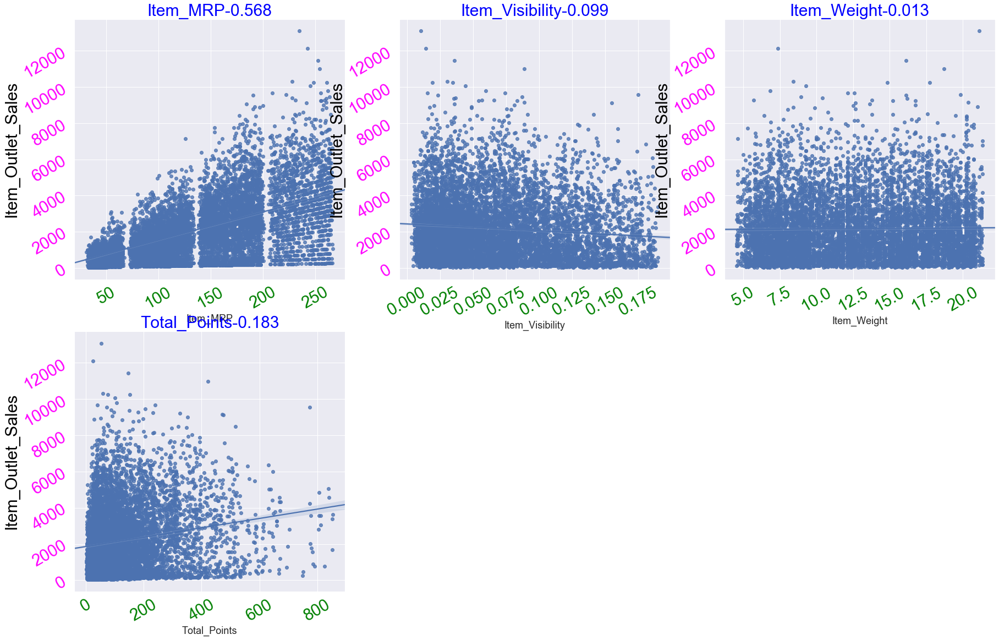

In [67]:
BiVEDA.BiVEDA_conti_cols_regplot_over_yConti(df.columns[1:],label_col, df)

In [68]:
test.groupby('Outlet_Type')['Item_Visibility'].mean()

Outlet_Type
Grocery Store        0.104197
Supermarket Type1    0.059873
Supermarket Type2    0.058417
Supermarket Type3    0.062934
Name: Item_Visibility, dtype: float64

In [69]:
test.groupby('Outlet_Identifier')['Item_Visibility'].mean()

Outlet_Identifier
OUT010    0.102661
OUT013    0.060669
OUT017    0.060790
OUT018    0.058417
OUT019    0.105811
OUT027    0.062934
OUT035    0.060170
OUT045    0.061557
OUT046    0.059764
OUT049    0.056292
Name: Item_Visibility, dtype: float64

In [70]:
order=train_test.groupby('Outlet_Location_Type')['Item_Visibility'].mean().sort_values(ascending=False).index
map1=dict([i for i in zip(order,range(1,len(order)+1))]) 
train_test['Outlet_location_type_wiseVisibility']=train_test['Outlet_Location_Type'].apply(lambda x : map1[x])

In [71]:
order=train_test.groupby('Outlet_Identifier')['Item_Visibility'].mean().sort_values(ascending=True).index
map1=dict([i for i in zip(order,range(1,len(order)+1))]) 
train_test['Outlet_Identifier_wiseVisibility']=train_test['Outlet_Identifier'].apply(lambda x : map1[x])

In [72]:
order=train_test.groupby('Outlet_Type')['Item_Visibility'].mean().sort_values(ascending=True).index
map1=dict([i for i in zip(order,range(1,len(order)+1))]) 
train_test['Outlet_Type_wiseVisibility']=train_test['Outlet_Type'].apply(lambda x : map1[x])

In [73]:
order=train.groupby(['Outlet_Identifier'])['Item_Outlet_Sales'].mean().sort_values(ascending=True).index
map1=dict([i for i in zip(order,range(1,len(order)+1))])
train_test['Outlet_Ranking']=train_test['Outlet_Identifier'].apply(lambda x : map1[x])

In [74]:
order=train.groupby(['Outlet_Identifier'])['Item_Identifier'].count().sort_values(ascending=True).index
map1=dict([i for i in zip(order,range(2,len(order)+2))])
train_test['Outlet_size_ordering']=train_test['Outlet_Identifier'].apply(lambda x : map1[x])

In [75]:
PPM.desc1(train_test,2,label_col)

,dtypes,null_count,total count,unique_count,missing value ratio,variance of numerics,std,mean,min,max,skew,kurt,Oridinals SpearmanCorr withTarget
Item_Outlet_Sales,float64,5681.0,8523.0,3493.0,40.0,2912140.00,1706.50,2181.29,33.290,13087.00,1.178,1.616,1.00000
Item_MRP,float64,0.0,14204.0,8052.0,0.0,3854.79,62.09,141.00,31.290,266.89,0.131,-0.894,0.56299
Outlet_Ranking,int64,0.0,14204.0,10.0,0.0,7.41,2.72,5.87,1.000,10.00,-0.104,-1.104,0.44642
Outlet_Type,object,0.0,14204.0,4.0,0.0,0.00,0.00,0.00,0.000,0.00,0.000,0.000,0.44600
Outlet_size_ordering,int64,0.0,14204.0,10.0,0.0,7.38,2.72,6.87,2.000,11.00,-0.101,-1.108,0.42062
Outlet_Type_wiseVisibility,int64,0.0,14204.0,4.0,0.0,0.63,0.80,2.80,1.000,4.00,-0.926,0.634,0.40629
Outlet_Identifier_wiseVisibility,int64,0.0,14204.0,10.0,0.0,7.37,2.71,5.13,1.000,10.00,0.100,-1.106,0.30973
Outlet_Identifier,object,0.0,14204.0,10.0,0.0,0.00,0.00,0.00,0.000,0.00,0.000,0.000,0.20421
Outlet_location_type_wiseVisibility,int64,0.0,14204.0,3.0,0.0,0.60,0.78,2.05,1.000,3.00,-0.081,-1.343,0.13432
Item_Visibility,float64,0.0,14204.0,13384.0,0.0,0.00,0.05,0.07,0.000,0.32,0.978,0.910,0.10911


In [76]:
train_test['Total_Points']=train_test['Item_MRP']*train_test['Item_Visibility']*train_test['Item_Weight']
train_test['Item_MRP_+_Weight']=train_test['Item_MRP'] + train_test['Item_Weight']
train_test['Item_MRP_+_Visi']=train_test['Item_MRP'] + train_test['Item_Visibility']

In [77]:
train_test['MrpPerUnit']=train_test['Item_MRP']/train_test['Outlet_Size']

In [78]:
summydf=PPM.desc1(train_test[:ntrain],1,label_col)
cols_ordinal=summydf[summydf['dtypes']=='int64'].index
cols_ordinal=cols_ordinal.drop(['Outlet_Establishment_Year','Outlet_Age'])
df=train_test[:ntrain][list(cols_ordinal)+[label_col]]
df['Sum_of_ordinals']=df[cols_ordinal].sum(1)*df['Outlet_Ranking']
#df['product_of_ordinals']= df[cols_ordinal].sum(1)
PPM.desc1(df[:ntrain],1,label_col)

,dtypes,null_count,total count,unique_count,missing value ratio,variance of numerics,std,mean,min,max,skew,kurt,Numeric pearSonCorr withTarget
Item_Outlet_Sales,float64,0.0,8523.0,3493.0,0.0,2912140.00,1706.50,2181.29,33.29,13087.0,1.178,1.616,1.000000
Outlet_Ranking,int64,0.0,8523.0,10.0,0.0,7.41,2.72,5.87,1.00,10.0,-0.104,-1.104,0.410268
Sum_of_ordinals,int64,0.0,8523.0,20.0,0.0,8368.23,91.48,160.19,22.00,330.0,0.220,-0.925,0.405731
Outlet_size_ordering,int64,0.0,8523.0,10.0,0.0,7.38,2.72,6.87,2.00,11.0,-0.101,-1.108,0.385397
Outlet_Type_wiseVisibility,int64,0.0,8523.0,4.0,0.0,0.63,0.80,2.80,1.00,4.0,-0.927,0.634,0.264969
Outlet_Identifier_wiseVisibility,int64,0.0,8523.0,10.0,0.0,7.37,2.71,5.13,1.00,10.0,0.100,-1.106,0.256688
Outlet_location_type_wiseVisibility,int64,0.0,8523.0,3.0,0.0,0.60,0.78,2.05,1.00,3.0,-0.081,-1.343,0.099404
Outlet_Size,int64,0.0,8523.0,3.0,0.0,0.46,0.68,1.61,1.00,3.0,0.655,-0.670,0.060517
Item_Fat_Content,int64,0.0,8523.0,2.0,0.0,0.23,0.48,1.35,1.00,2.0,0.617,-1.620,0.018719


In [79]:
train_test['Sum_of_ordinals']=train_test[cols_ordinal].sum(1)*train_test['Outlet_Ranking']

In [80]:
ItemAvgMRPmap=dict(train_test.groupby(['Item_Identifier'])['Item_MRP'].mean())

In [81]:
train_test['ItemAvgMRPmap']=train_test['Item_Identifier'].apply(lambda x:ItemAvgMRPmap[x] )/train_test['Item_Weight']

In [82]:
train_test[label_col].corr(train_test['Total_Points']*train_test['MrpPerUnit'],'spearman').round(5)#.var() #.drop_duplicates().dropna().sort_values(['Item_Type','Item_MRP'])

0.34396

In [83]:
PPM.desc1(train_test,2,'Item_MRP')[6:]

,dtypes,null_count,total count,unique_count,missing value ratio,variance of numerics,std,mean,min,max,skew,kurt,Oridinals SpearmanCorr withTarget
Total_Points,float64,0.0,14204.0,13850.0,0.0,15339.40,123.85,121.27,0.000,1406.55,2.180,6.960,0.47989
Item_Type,object,0.0,14204.0,16.0,0.0,0.00,0.00,0.00,0.000,0.00,0.000,0.000,0.04950
Item_Weight,float64,0.0,14204.0,415.0,0.0,21.64,4.65,12.79,4.555,21.35,0.100,-1.227,0.03870
Item_Category,object,0.0,14204.0,3.0,0.0,0.00,0.00,0.00,0.000,0.00,0.000,0.000,0.02924
Item_Identifier,object,0.0,14204.0,1559.0,0.0,0.00,0.00,0.00,0.000,0.00,0.000,0.000,0.01239
Item_Fat_Content,int64,0.0,14204.0,2.0,0.0,0.23,0.48,1.35,1.000,2.00,0.614,-1.624,0.00426
Item_Visibility,float64,0.0,14204.0,13384.0,0.0,0.00,0.05,0.07,0.000,0.32,0.978,0.910,0.00174
Outlet_Size,int64,0.0,14204.0,3.0,0.0,0.46,0.68,1.61,1.000,3.00,0.655,-0.670,0.00160
Outlet_Location_Type,object,0.0,14204.0,3.0,0.0,0.00,0.00,0.00,0.000,0.00,0.000,0.000,0.00104
Outlet_Identifier_wiseVisibility,int64,0.0,14204.0,10.0,0.0,7.37,2.71,5.13,1.000,10.00,0.100,-1.106,0.00092


In [84]:
PPM.desc1(train_test,2,label_col)

,dtypes,null_count,total count,unique_count,missing value ratio,variance of numerics,std,mean,min,max,skew,kurt,Oridinals SpearmanCorr withTarget
Item_Outlet_Sales,float64,5681.0,8523.0,3493.0,40.0,2912140.00,1706.50,2181.29,33.29000,13087.00,1.178,1.616,1.00000
Item_MRP,float64,0.0,14204.0,8052.0,0.0,3854.79,62.09,141.00,31.29000,266.89,0.131,-0.894,0.56299
Item_MRP_+_Visi,float64,0.0,14204.0,14199.0,0.0,3854.74,62.09,141.07,31.33170,267.03,0.131,-0.894,0.56290
Item_MRP_+_Weight,float64,0.0,14204.0,12441.0,0.0,3897.08,62.43,153.80,38.46240,286.54,0.127,-0.896,0.56097
Outlet_Ranking,int64,0.0,14204.0,10.0,0.0,7.41,2.72,5.87,1.00000,10.00,-0.104,-1.104,0.44642
Sum_of_ordinals,int64,0.0,14204.0,20.0,0.0,8369.09,91.48,160.20,22.00000,330.00,0.220,-0.925,0.44632
Outlet_Type,object,0.0,14204.0,4.0,0.0,0.00,0.00,0.00,0.00000,0.00,0.000,0.000,0.44600
ItemAvgMRPmap,float64,0.0,14204.0,1559.0,0.0,65.09,8.07,12.80,1.75008,50.43,1.305,2.003,0.44206
Outlet_size_ordering,int64,0.0,14204.0,10.0,0.0,7.38,2.72,6.87,2.00000,11.00,-0.101,-1.108,0.42062
Outlet_Type_wiseVisibility,int64,0.0,14204.0,4.0,0.0,0.63,0.80,2.80,1.00000,4.00,-0.926,0.634,0.40629


# Dummyfication

In [85]:
data=train_test.copy()

In [86]:
data.drop(['Item_Identifier','Outlet_Identifier','Outlet_Establishment_Year'],1,inplace=True)

In [87]:
summy=PPM.desc1(data,2,label_col)
cat_cols=summy[summy['dtypes']=='object'].index

In [88]:
print(data.shape)
data[cat_cols]
dummiedDF=pd.get_dummies(data[cat_cols],cat_cols)
data[dummiedDF.columns]=dummiedDF
data.drop(cat_cols,1,inplace=True)
data.shape

(14204, 22)


(14204, 44)

In [89]:
#dummiedDF
ntrain

8523

# Zero test for train and test data drop lowest variablity data

In [90]:
# Lets drop all the columns in entire data where testing data columns holding single value
zerotest_testing_col=[]
for i in dummiedDF.columns:
    if i in data.columns:
        zerotest_cond=data[i][ntrain:].sum()==0
        if zerotest_cond:
            zerotest_testing_col.append(i)
print(len(zerotest_testing_col),"-",zerotest_testing_col)
if len(zerotest_testing_col) > 0:
   data.drop(zerotest_testing_col,1,inplace=True)
data.shape

0 - []


(14204, 44)

In [91]:
# Lets drop all the columns in entire data where training data columns holding single value
zerotest_training_col=[]
for i in dummiedDF.columns:
    if i in data.columns:
        zerotest_cond=data[i][:ntrain].sum()==0
        if zerotest_cond:
            zerotest_training_col.append(i)
print(len(zerotest_training_col),"-",zerotest_training_col)
if len(zerotest_training_col) > 0:
   data.drop(zerotest_training_col,1,inplace=True)
data.shape

0 - []


(14204, 44)

In [92]:
def max_corrs(label_col,_df,threashold=0.3):

    # Lets create corr dataframe for correlated columns having correaltion > threashold
    corr = _df[_df[label_col]>0].corr()
    top_corr_cols = corr[abs((corr[label_col])>=threashold)][label_col].sort_values(ascending=False).keys()
    _corrDF = corr.loc[top_corr_cols, top_corr_cols]
    dropSelf = np.zeros_like(_corrDF)
    dropSelf[np.triu_indices_from(dropSelf)] = True
    print(_corrDF.shape)
    del top_corr_cols

    """

        To return the best valued corrected columns

        """
    #drop the first columns containing the correlation with label col
    top_corrs_colsN=_corrDF[1:].drop(label_col,1)
    
    #extract the list of columns of correlated DF
    colist=list(top_corrs_colsN.columns)
    #print(colist)
    
    # Create Empy DataFrame To fill using for loop below
    Multi_col_list=pd.DataFrame(columns=['col1','col2','col1_vs_col2-corr','col1_vs_label-corr','col2_vs_label-corr'])
    for i in range(0,len(top_corrs_colsN.index)):
        
        # 1.extract given row[i] of the forloop & round off all corrs upto 3 decimal place
        # 
        corRec=list(top_corrs_colsN.ix[i].round(3))
        #print(colist)

        colist1=colist.copy()
        
        # 2. Name and corr value of the src column
        src_corVal=corRec[i]
        src_colName=colist[i]
        colist1=colist1.copy()
        
        # 3. remove the srce column from the list
        colist1.pop(i)
        corRec.pop(i)
        
        #print(corRec)
        #print(src_colName,src_corVal,colist1,"\n\n")

        # 4. Extract the max value the given list(row) of the for loop
        mx=np.max(corRec).round(3)
        mx_loc=0
        
        # find the location of the max value
        for loc in range(0,len(corRec)):
            if corRec[loc] == mx:
                mx_loc=loc
                break
        #print(src_colName,mx,mx_loc,colist1[mx_loc],corRec)
        #print("corr(",src_colName,",",colist1[mx_loc],")-",mx)
        #print(src_colName,colist1[mx_loc])
        
        # finding the correlation of i) src column and ii) its best correlation column with the label column
        col2_vs_label=abs(_df[[label_col,colist1[mx_loc] ]].corr().head(1).values[0][1].round(3))
        col1_vs_label=abs(_df[[label_col,src_colName ]].corr().head(1).values[0][1].round(3))

        cond=[]
        cond=Multi_col_list[(Multi_col_list['col1']==colist1[mx_loc]) & (Multi_col_list['col2']==src_colName)]
        if(len(cond))>0:
    #        #print(i)
            pass
        else:
            Multi_col_list.loc[i]=[src_colName,colist1[mx_loc],mx,col1_vs_label,col2_vs_label]
    del top_corrs_colsN     
    return Multi_col_list.sort_values(['col1_vs_label-corr','col2_vs_label-corr'],ascending=[False,False])

corr = data[:ntrain].corr()
columns = np.full((corr.shape[0],), True, dtype=bool)
for i in range(corr.shape[0]):
    for j in range(i+1, corr.shape[0]):
        if corr.iloc[i,j] >= 0.515:
            if columns[j]:
                columns[j] = False
selected_columns = data.columns[columns]
print(set(data.columns).difference(set(selected_columns)))
max_corrs(label_col,data[:ntrain],0.001)


{'Outlet_Location_Type_Tier 2', 'Item_Outlet_Sales', 'MrpPerUnit', 'Total_Points', 'Item_MRP_+_Visi', 'Item_Category_Non-Consumable', 'Outlet_Type_wiseVisibility', 'Outlet_Type_Grocery Store', 'Outlet_Type_Supermarket Type3', 'Sum_of_ordinals', 'Item_MRP_+_Weight', 'Outlet_size_ordering', 'ItemAvgMRPmap', 'Outlet_Location_Type_Tier 3', 'Item_Category_Drinks'}
(27, 27)


,col1,col2,col1_vs_col2-corr,col1_vs_label-corr,col2_vs_label-corr
0,Item_MRP,Item_MRP_+_Visi,1.000,0.568,0.568
2,Item_MRP_+_Weight,Item_MRP,0.997,0.566,0.568
3,Outlet_Ranking,Sum_of_ordinals,0.985,0.410,0.406
5,Outlet_size_ordering,Outlet_Ranking,0.697,0.385,0.410
6,ItemAvgMRPmap,Item_MRP,0.683,0.383,0.568
7,MrpPerUnit,Item_MRP,0.735,0.367,0.568
8,Outlet_Type_Supermarket Type3,Sum_of_ordinals,0.627,0.311,0.406
9,Total_Points,Item_MRP_+_Weight,0.495,0.183,0.566
10,Outlet_Type_Supermarket Type1,Outlet_Location_Type_Tier 2,0.506,0.109,0.058
11,Outlet_location_type_wiseVisibility,Outlet_Location_Type_Tier 2,0.854,0.099,0.058


In [93]:
data.drop(['Item_MRP_+_Visi','Item_MRP_+_Weight','Sum_of_ordinals','Outlet_size_ordering'],1,inplace=True)
max_corrs(label_col,data[:ntrain],0.0001)

(23, 23)


,col1,col2,col1_vs_col2-corr,col1_vs_label-corr,col2_vs_label-corr
0,Item_MRP,MrpPerUnit,0.735,0.568,0.367
1,Outlet_Ranking,Outlet_Type_Supermarket Type3,0.533,0.410,0.311
2,ItemAvgMRPmap,Item_MRP,0.683,0.383,0.568
5,Total_Points,Item_MRP,0.469,0.183,0.568
6,Outlet_Type_Supermarket Type1,Outlet_Location_Type_Tier 2,0.506,0.109,0.058
7,Outlet_location_type_wiseVisibility,Outlet_Location_Type_Tier 2,0.854,0.099,0.058
8,Outlet_Size,Outlet_Location_Type_Tier 3,0.794,0.061,0.046
11,Item_Category_Food,Item_Fat_Content,0.423,0.032,0.019
12,Item_Type_Fruits and Vegetables,Item_Category_Food,0.257,0.026,0.032
13,Item_Type_Snack Foods,Item_Category_Food,0.253,0.023,0.032


In [94]:
data.drop(['Outlet_Type_Supermarket Type3','Outlet_Location_Type_Tier 2'],1,inplace=True)
max_corrs(label_col,data[:ntrain],0.0001)

(21, 21)


,col1,col2,col1_vs_col2-corr,col1_vs_label-corr,col2_vs_label-corr
0,Item_MRP,MrpPerUnit,0.735,0.568,0.367
1,Outlet_Ranking,Outlet_Type_Supermarket Type1,0.320,0.410,0.109
2,ItemAvgMRPmap,Item_MRP,0.683,0.383,0.568
4,Total_Points,Item_MRP,0.469,0.183,0.568
6,Outlet_location_type_wiseVisibility,Outlet_Type_Supermarket Type1,0.211,0.099,0.109
7,Outlet_Size,Outlet_Location_Type_Tier 3,0.794,0.061,0.046
9,Item_Category_Food,Item_Fat_Content,0.423,0.032,0.019
10,Item_Type_Fruits and Vegetables,Item_Category_Food,0.257,0.026,0.032
11,Item_Type_Snack Foods,Item_Category_Food,0.253,0.023,0.032
13,Item_Type_Household,Item_Weight,0.048,0.016,0.013


In [95]:
data.drop(['Outlet_Location_Type_Tier 3'],1,inplace=True)
max_corrs(label_col,data[:ntrain],0.0001)

(20, 20)


,col1,col2,col1_vs_col2-corr,col1_vs_label-corr,col2_vs_label-corr
0,Item_MRP,MrpPerUnit,0.735,0.568,0.367
1,Outlet_Ranking,Outlet_Type_Supermarket Type1,0.320,0.410,0.109
2,ItemAvgMRPmap,Item_MRP,0.683,0.383,0.568
4,Total_Points,Item_MRP,0.469,0.183,0.568
6,Outlet_location_type_wiseVisibility,Outlet_Type_Supermarket Type1,0.211,0.099,0.109
7,Outlet_Size,Outlet_Ranking,0.047,0.061,0.410
8,Item_Category_Food,Item_Fat_Content,0.423,0.032,0.019
9,Item_Type_Fruits and Vegetables,Item_Category_Food,0.257,0.026,0.032
10,Item_Type_Snack Foods,Item_Category_Food,0.253,0.023,0.032
12,Item_Type_Household,Item_Weight,0.048,0.016,0.013


In [96]:
#data.groupby(['Item_Weight'])['Item_Weight'].count().sort_values(ascending=False)

# Pair plot ... to understand to distribution,scatter correlation, outliers
    
1. Let’s have a look at the distributions of our features, starting with the most correlated to the target variable
2. Also look at Outliers
3. Recall model Underftting: It usually happens when we have less data to build an accurate model and also when we try to build a linear model with a non-linear data. In such cases the rules of the machine learning model are too easy and flexible to be applied on such a minimal data and therefore the model will probably make a lot of wrong predictions. Underfitting can be avoided by using more data and also reducing the features by feature selection.

    If an algorithm is suffering from high variance:
    
        more data will probably help
        otherwise reduce the model complexity
    If an algorithm is suffering from high bias:

        increase the model complexity

In [97]:
summy=PPM.desc1(train[:ntrain],1,label_col)
summy
high_corr_cols=summy.index[:5]





 Correlated columns Crossing the threashold values(0.2):5 columns 

	[Index(['Item_Outlet_Sales', 'Item_MRP', 'Item_Visibility',
       'Outlet_Establishment_Year', 'Item_Weight'],
      dtype='object')]




,Item_Outlet_Sales,Item_MRP,Item_Visibility,Outlet_Establishment_Year,Item_Weight
Item_Outlet_Sales,1.000000,0.567574,-0.099271,-0.049135,0.013261
Item_MRP,0.567574,1.000000,-0.003893,0.005020,0.026172
Item_Visibility,-0.099271,-0.003893,1.000000,-0.050592,-0.017406
Outlet_Establishment_Year,-0.049135,0.005020,-0.050592,1.000000,-0.012823
Item_Weight,0.013261,0.026172,-0.017406,-0.012823,1.000000


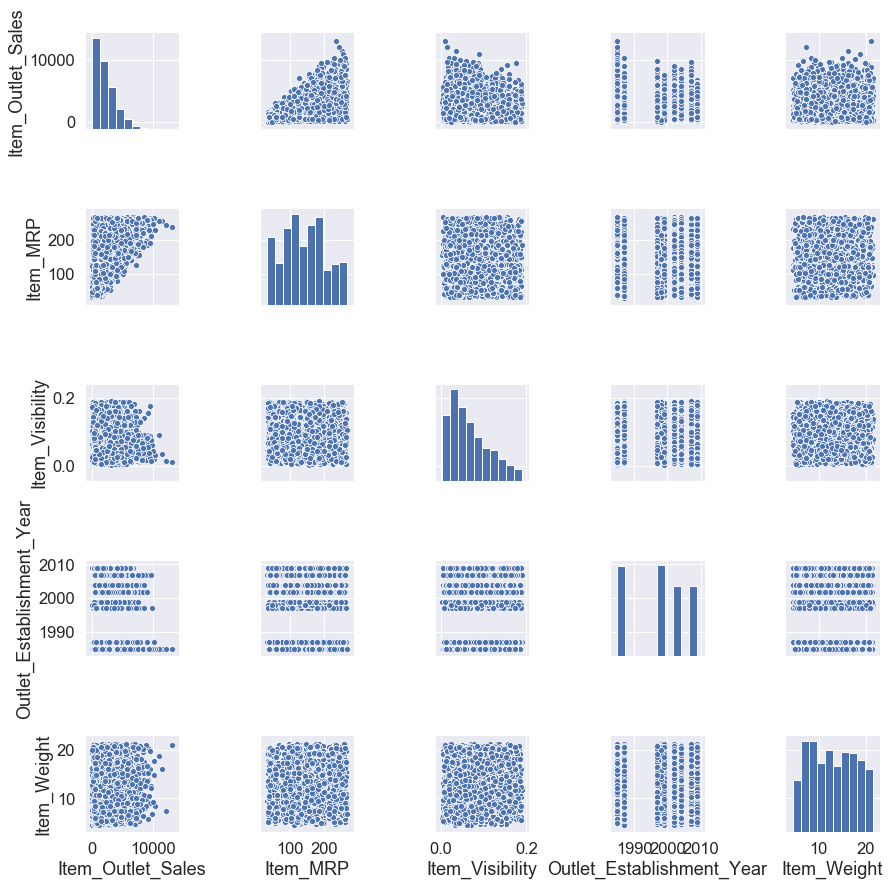

In [98]:
BiVEDA.All_VEDA_conti_higly_correlation_cols_pairplot_scatterplot(high_corr_cols[:10],label_col,train_test[:ntrain],threashold=0.2)

# Evaluate Apply Polynomials by Region Plots on the more Correlated Features

In [99]:
poly_cols=['Item_MRP','Total_Points','Item_Visibility','Item_Weight','MrpPerUnit','ItemAvgMRPmap']


 Its a kind of scatter plot 
['Item_MRP', 'Total_Points', 'Item_Visibility', 'Item_Weight', 'MrpPerUnit', 'ItemAvgMRPmap']


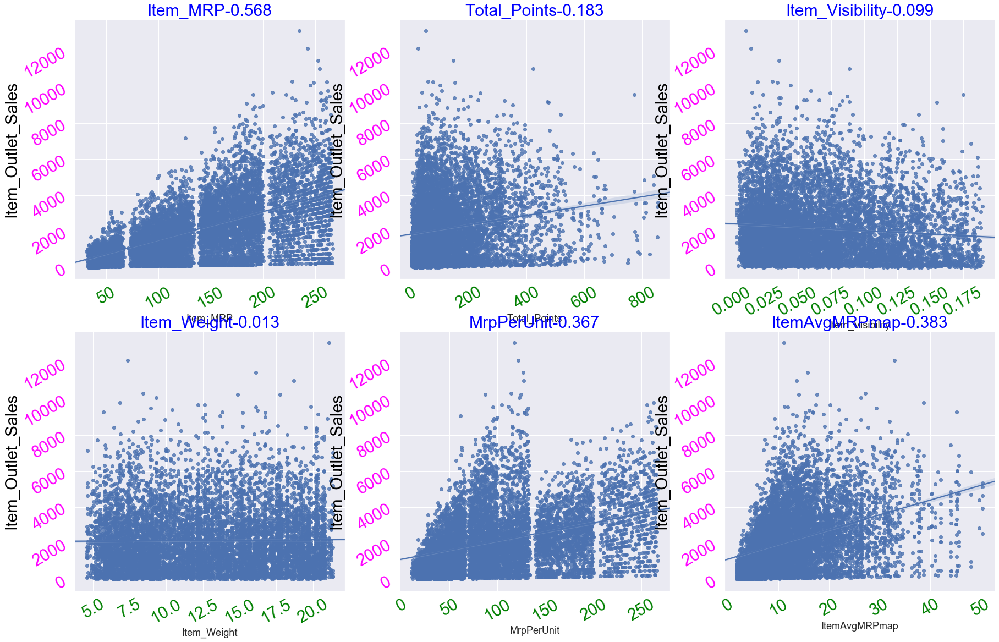

In [100]:
BiVEDA.BiVEDA_conti_cols_regplot_over_yConti(poly_cols,label_col,data[:ntrain])


['Total_Points'] = R2_SQUARE 0.03340729993991576


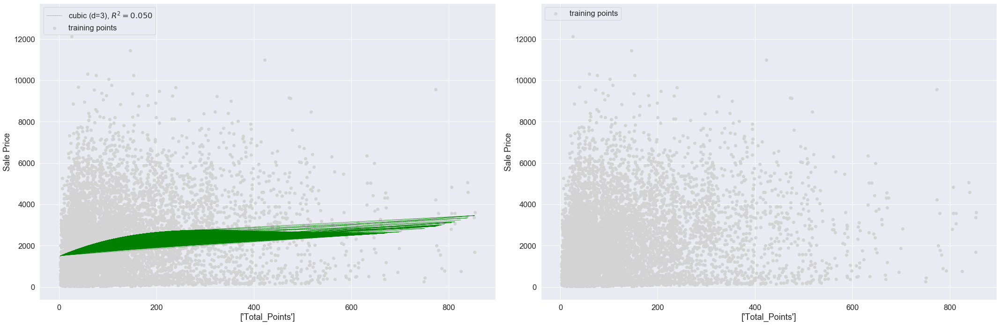

['Item_Visibility'] = R2_SQUARE 0.009854708275707114


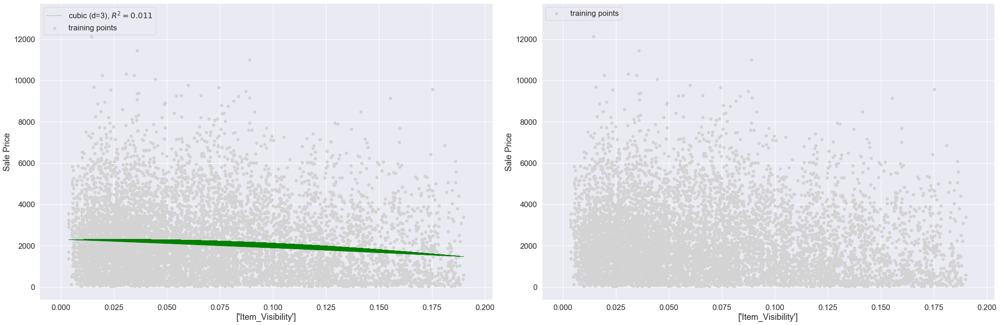

['MrpPerUnit'] = R2_SQUARE 0.134392575625654


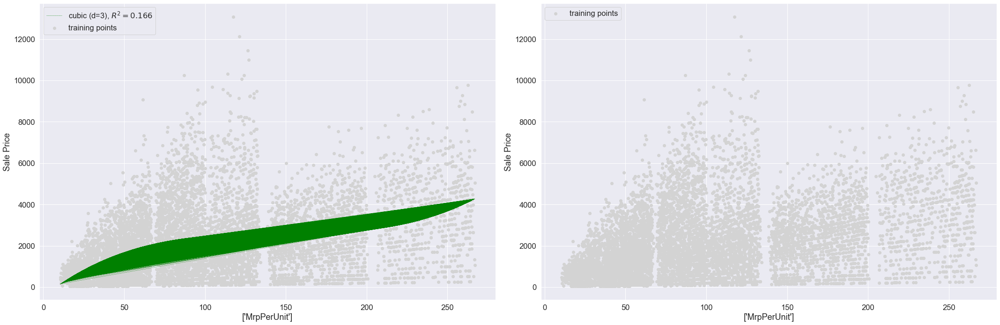

['ItemAvgMRPmap'] = R2_SQUARE 0.14696158988624386


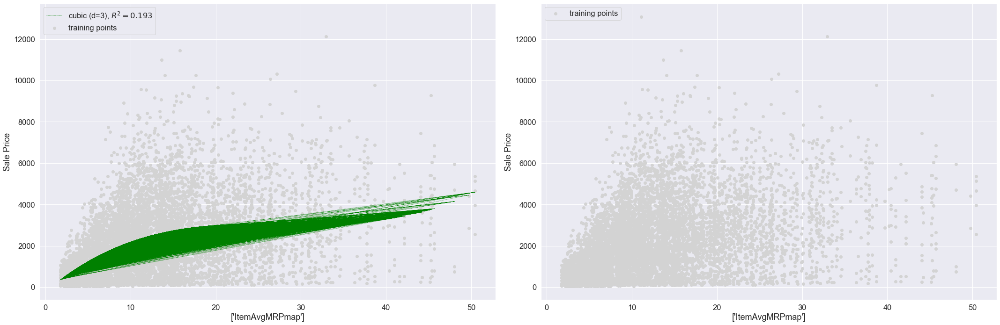

In [101]:
def poly(feat,_df,degree=0,getData=0):
    from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
    
    from sklearn.preprocessing import RobustScaler, PolynomialFeatures, StandardScaler, LabelEncoder
    from sklearn.linear_model import SGDRegressor,LinearRegression,Ridge,Lasso,ElasticNet

    y = _df[_df[label_col]>0][label_col]
    X = _df.loc[_df[label_col]>0, feat] 
    #print(X.shape,y.shape)
   
    # Initializatin of regression models
    regr = LinearRegression()
    regr = regr.fit(X, y)
    y_lin_fit = regr.predict(X)
    linear_r2 = r2_score(y, regr.predict(X))
    print(feat,"= R2_SQUARE",linear_r2)
    
    # create polynomial features
    quadratic = PolynomialFeatures(degree=2, interaction_only=False, include_bias=False)
    cubic = PolynomialFeatures(degree=3, interaction_only=False, include_bias=False)
    fourth = PolynomialFeatures(degree=4, interaction_only=False, include_bias=False)
    fifth = PolynomialFeatures(degree=5, interaction_only=False, include_bias=False)
    X_quad = quadratic.fit_transform(_df[feat])
    X_cubic = cubic.fit_transform(_df[feat])
    X_fourth = fourth.fit_transform(_df[feat])
    X_fifth = fifth.fit_transform(_df[feat])

    if degree==3 and getData==1:
        res = X_cubic
        Degreedpoly=cubic
        target_feature_names = [feature.replace(' ','_') for feature in Degreedpoly.get_feature_names(feat)]
        output_df = pd.DataFrame(res, columns = target_feature_names,  index=_df.index).iloc[:, len(feat):]
        print(feat)
        print("cubic polynomicals of these ", len(feat),'features',"is",output_df.shape)
        return output_df
    # quadratic fit
    regr = regr.fit(X_quad, y)
    y_quad_fit = regr.predict(quadratic.fit_transform(X))
    quadratic_r2 = r2_score(y, y_quad_fit)
    
    # cubic fit
    regr = regr.fit(X_cubic, y)
    y_cubic_fit = regr.predict(cubic.fit_transform(X))
    cubic_r2 = r2_score(y, y_cubic_fit)

    # Fourth fit
    regr = regr.fit(X_fourth, y)
    y_fourth_fit = regr.predict(fourth.fit_transform(X))
    four_r2 = r2_score(y, y_fourth_fit)

    # Fifth fit
    regr = regr.fit(X_fifth, y)
    y_fifth_fit = regr.predict(fifth.fit_transform(X))
    five_r2 = r2_score(y, y_fifth_fit)
    

    
    if len(feat)==1:
        fig = plt.figure(figsize=(30,10))
        # Plot lowest Polynomials
        fig1 = fig.add_subplot(121)
        plt.scatter(X[feat], y, label='training points', color='lightgray')
        if degree==1 or degree==0:
            plt.plot(X[feat], y_lin_fit, label='linear (d=1), $R^2=%.3f$' % linear_r2, color='blue', lw=0.5, linestyle=':')
        if degree==2 or degree==0:
            plt.plot(X[feat], y_quad_fit, label='quadratic (d=2), $R^2=%.3f$' % quadratic_r2, color='red', lw=0.5, linestyle='-')
        if degree==3 or degree==0:
            plt.plot(X[feat], y_cubic_fit, label='cubic (d=3), $R^2=%.3f$' % cubic_r2,  color='green', lw=0.5, linestyle='--')

        plt.xlabel(feat)
        plt.ylabel('Sale Price')
        plt.legend(loc='upper left')

        # Plot higest Polynomials
        fig2 = fig.add_subplot(122)
        plt.scatter(X[feat], y, label='training points', color='lightgray')
        if degree==1 or degree==0:
            plt.plot(X[feat], y_lin_fit, label='linear (d=1), $R^2=%.3f$' % linear_r2, color='blue', lw=2, linestyle=':')
        if degree==5 or degree==0:
            plt.plot(X[feat], y_fifth_fit, label='Fifth (d=5), $R^2=%.3f$' % five_r2, color='yellow', lw=2, linestyle='-')
        if degree==4 or degree==0:
            plt.plot(X[feat], y_fifth_fit, label='Fourth (d=4), $R^2=%.3f$' % four_r2, color='red', lw=2, linestyle=':')

        plt.xlabel(feat)
        plt.ylabel('Sale Price')
        plt.legend(loc='upper left')
    else:
        # Plot initialisation
        fig = plt.figure(figsize=(20,10))
        ax = fig.add_subplot(121, projection='3d')
        ax.scatter(X.iloc[:, 0], X.iloc[:, 1], y, s=40)
        return
        # make lines of the regressors:
        plt.plot(X.iloc[:, 0], X.iloc[:, 1], y_lin_fit, label='linear (d=1), $R^2=%.3f$' % linear_r2, 
                 color='blue', lw=2, linestyle=':')
        plt.plot(X.iloc[:, 0], X.iloc[:, 1], y_quad_fit, label='quadratic (d=2), $R^2=%.3f$' % quadratic_r2, 
                 color='red', lw=0.5, linestyle='-')
        plt.plot(X.iloc[:, 0], X.iloc[:, 1], y_cubic_fit, label='cubic (d=3), $R^2=%.3f$' % cubic_r2, 
                 color='green', lw=0.5, linestyle='--')
        # label the axes
        ax.set_xlabel(X.columns[0])
        ax.set_ylabel(X.columns[1])
        ax.set_zlabel('Sales Price')
        ax.set_title("Poly up to 3 degree")
        plt.legend(loc='upper left')

    plt.tight_layout()
    plt.show()

poly_cols=['Total_Points', 'Item_Visibility', 'MrpPerUnit', 'ItemAvgMRPmap']
#corr_cols_polyDF=poly(poly_cols,all_data,3)    
for i in range(len(poly_cols)):
     poly(poly_cols[i:i+1],data[:ntrain],3,0)   
        


In [102]:
Best_poly_cols=poly_cols
corr_cols_polyDF=poly(Best_poly_cols, data,3,1)

['Total_Points', 'Item_Visibility', 'MrpPerUnit', 'ItemAvgMRPmap'] = R2_SQUARE 0.2579946305953258
['Total_Points', 'Item_Visibility', 'MrpPerUnit', 'ItemAvgMRPmap']
cubic polynomicals of these  4 features is (14204, 30)


In [103]:
data[corr_cols_polyDF.columns]=corr_cols_polyDF

In [104]:
#ntrain
#corr_cols_polyDF[ntrain:].head()

In [105]:
summy=PPM.desc1(data[:ntrain],2,label_col)

In [106]:
conti_col=summy[summy['dtypes']=='float64'].index
conti_col=conti_col.drop(label_col)
conti_col

Index(['Item_MRP', 'MrpPerUnit_ItemAvgMRPmap^2', 'MrpPerUnit_ItemAvgMRPmap',
       'MrpPerUnit^2_ItemAvgMRPmap', 'ItemAvgMRPmap', 'ItemAvgMRPmap^2',
       'ItemAvgMRPmap^3', 'Total_Points_ItemAvgMRPmap^2',
       'Total_Points_MrpPerUnit_ItemAvgMRPmap', 'MrpPerUnit', 'MrpPerUnit^2',
       'MrpPerUnit^3', 'Total_Points_ItemAvgMRPmap',
       'Total_Points_MrpPerUnit^2', 'Total_Points_MrpPerUnit',
       'Item_Visibility_MrpPerUnit_ItemAvgMRPmap',
       'Item_Visibility_ItemAvgMRPmap^2', 'Total_Points^2_ItemAvgMRPmap',
       'Total_Points^2_MrpPerUnit', 'Item_Visibility_MrpPerUnit^2',
       'Total_Points_Item_Visibility_ItemAvgMRPmap', 'Total_Points',
       'Total_Points^2', 'Total_Points^3',
       'Total_Points_Item_Visibility_MrpPerUnit',
       'Item_Visibility_ItemAvgMRPmap', 'Item_Visibility_MrpPerUnit',
       'Total_Points^2_Item_Visibility', 'Item_Visibility',
       'Item_Visibility^2', 'Item_Visibility^3',
       'Total_Points_Item_Visibility', 'Item_Visibility^2_ItemAv

In [107]:
#contiUniVEDA.UniVEDA_conti_cols_HIST(conti_col,data[conti_col])

In [108]:
NORMQUINT_TRANS=PPM.get_conti_cols_transformed(conti_col,data,e=1,type='NQ')
BoxCox_TRANS=PPM.get_conti_cols_transformed(conti_col,data,e=1,type='BC')
YJohnson_TRANS=PPM.get_conti_cols_transformed(conti_col,data,e=1,type='YJ')

Item_MRP
MrpPerUnit_ItemAvgMRPmap^2
MrpPerUnit_ItemAvgMRPmap
MrpPerUnit^2_ItemAvgMRPmap
ItemAvgMRPmap
ItemAvgMRPmap^2
ItemAvgMRPmap^3
Total_Points_ItemAvgMRPmap^2
Total_Points_MrpPerUnit_ItemAvgMRPmap
MrpPerUnit
MrpPerUnit^2
MrpPerUnit^3
Total_Points_ItemAvgMRPmap
Total_Points_MrpPerUnit^2
Total_Points_MrpPerUnit
Item_Visibility_MrpPerUnit_ItemAvgMRPmap
Item_Visibility_ItemAvgMRPmap^2
Total_Points^2_ItemAvgMRPmap
Total_Points^2_MrpPerUnit
Item_Visibility_MrpPerUnit^2
Item_MRP
MrpPerUnit_ItemAvgMRPmap^2
MrpPerUnit_ItemAvgMRPmap
MrpPerUnit^2_ItemAvgMRPmap
ItemAvgMRPmap
ItemAvgMRPmap^2
ItemAvgMRPmap^3
Total_Points_ItemAvgMRPmap^2
Total_Points_MrpPerUnit_ItemAvgMRPmap
MrpPerUnit
MrpPerUnit^2
MrpPerUnit^3
Total_Points_ItemAvgMRPmap
Total_Points_MrpPerUnit^2
Total_Points_MrpPerUnit
Item_Visibility_MrpPerUnit_ItemAvgMRPmap
Item_Visibility_ItemAvgMRPmap^2
Total_Points^2_ItemAvgMRPmap
Total_Points^2_MrpPerUnit
Item_Visibility_MrpPerUnit^2
Item_MRP
MrpPerUnit_ItemAvgMRPmap^2
MrpPerUnit_ItemAvgMR

In [109]:
#contiUniVEDA.UniVEDA_conti_cols_HIST(conti_col,NORMQUINT_TRANS)

In [110]:
#contiUniVEDA.UniVEDA_conti_cols_HIST(conti_col,BoxCox_TRANS)

In [111]:
#contiUniVEDA.UniVEDA_conti_cols_HIST(conti_col,YJohnson_TRANS)

In [112]:
trans_data=pd.DataFrame({#"org_skew":np.abs(summy['skew'].values),
"NORM_QUINT_skew":np.abs(PPM.desc(NORMQUINT_TRANS)['skew'].values),
"BOXCOX_skew":np.abs(PPM.desc(BoxCox_TRANS)['skew'].values),
"YJ_TRANS":np.abs(PPM.desc(YJohnson_TRANS)['skew'].values)
})
print(trans_data.sum())
trans_data

NORM_QUINT_skew    15.019
BOXCOX_skew         0.591
YJ_TRANS            0.629
dtype: float64


,NORM_QUINT_skew,BOXCOX_skew,YJ_TRANS
0,0.013,0.006,0.001
1,0.013,0.012,0.010
2,0.013,0.013,0.013
3,0.009,0.114,0.112
4,0.006,0.040,0.040
5,0.005,0.038,0.037
6,0.005,0.040,0.040
7,1.496,0.043,0.090
8,0.003,0.027,0.027
9,0.001,0.034,0.033


In [113]:
#data[YJohnson_TRANS.columns]
YJ_data=data.copy()
YJ_data[YJohnson_TRANS.columns]=YJohnson_TRANS

NQ_data=data.copy()
NQ_data[NORMQUINT_TRANS.columns]=NORMQUINT_TRANS

BC_data=data.copy()
BC_data[BoxCox_TRANS.columns]=BoxCox_TRANS



In [114]:
xtrain=BC_data[:ntrain].drop(label_col,1)
ytrain=BC_data[:ntrain][label_col]
xtest=BC_data[ntrain:].drop(label_col,1)

In [115]:
xtrainNQ=NQ_data[:ntrain].drop(label_col,1)
ytrainNQ=NQ_data[:ntrain][label_col]
xtestNQ=NQ_data[ntrain:].drop(label_col,1)

In [116]:
print(xtrain.shape,xtest.shape)

(8523, 66) (5681, 66)


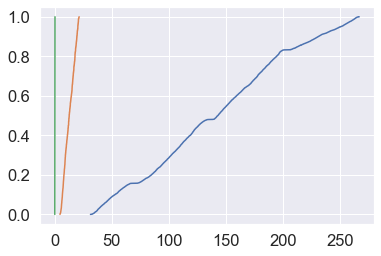

In [117]:
from statsmodels.distributions.empirical_distribution import ECDF
temp_col=['Item_MRP','Item_Weight','Item_Visibility',label_col]
for i in temp_col[:3]:
    _x,_y=ECDF(data[:ntrain][i]).x,ECDF(data[:ntrain][i]).y
    plt.plot(_x,_y)
   
df=data[:ntrain][temp_col]

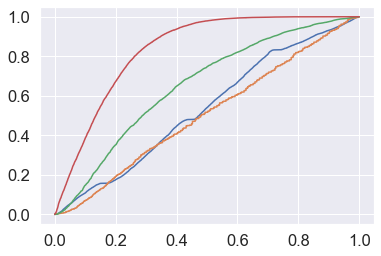

In [118]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(df)  # Don't cheat - fit only on training data
_xtraningData1 = pd.DataFrame(scaler.transform(df),columns=df.columns)
for i in temp_col:
    _x,_y=ECDF(_xtraningData1[i]).x,ECDF(_xtraningData1[i]).y
    plt.plot(_x,_y)

In [119]:
float_cols=xtrain.columns[xtrain.dtypes=='float64']
len(float_cols)
df=xtrain[float_cols]
from sklearn.preprocessing import MinMaxScaler,StandardScaler
scaler = MinMaxScaler()
scaler.fit(df)  # Don't cheat - fit only on training data
_xtraningData1 = pd.DataFrame(scaler.transform(df),columns=df.columns)

-----------------------------Cumulative Distribution plot-------------------


1 . ['Item_MRP', 'Item_Visibility', 'Item_Weight', 'Total_Points', 'MrpPerUnit']
2 . ['ItemAvgMRPmap', 'Total_Points^2', 'Total_Points_Item_Visibility', 'Total_Points_MrpPerUnit', 'Total_Points_ItemAvgMRPmap']
3 . ['Item_Visibility^2', 'Item_Visibility_MrpPerUnit', 'Item_Visibility_ItemAvgMRPmap', 'MrpPerUnit^2', 'MrpPerUnit_ItemAvgMRPmap']
4 . ['ItemAvgMRPmap^2', 'Total_Points^3', 'Total_Points^2_Item_Visibility', 'Total_Points^2_MrpPerUnit', 'Total_Points^2_ItemAvgMRPmap']
5 . ['Total_Points_Item_Visibility^2', 'Total_Points_Item_Visibility_MrpPerUnit', 'Total_Points_Item_Visibility_ItemAvgMRPmap', 'Total_Points_MrpPerUnit^2', 'Total_Points_MrpPerUnit_ItemAvgMRPmap']
6 . ['Total_Points_ItemAvgMRPmap^2', 'Item_Visibility^3', 'Item_Visibility^2_MrpPerUnit', 'Item_Visibility^2_ItemAvgMRPmap', 'Item_Visibility_MrpPerUnit^2']
7 . ['Item_Visibility_MrpPerUnit_ItemAvgMRPmap', 'Item_Visibility_ItemAvgMRPmap^2', 'M

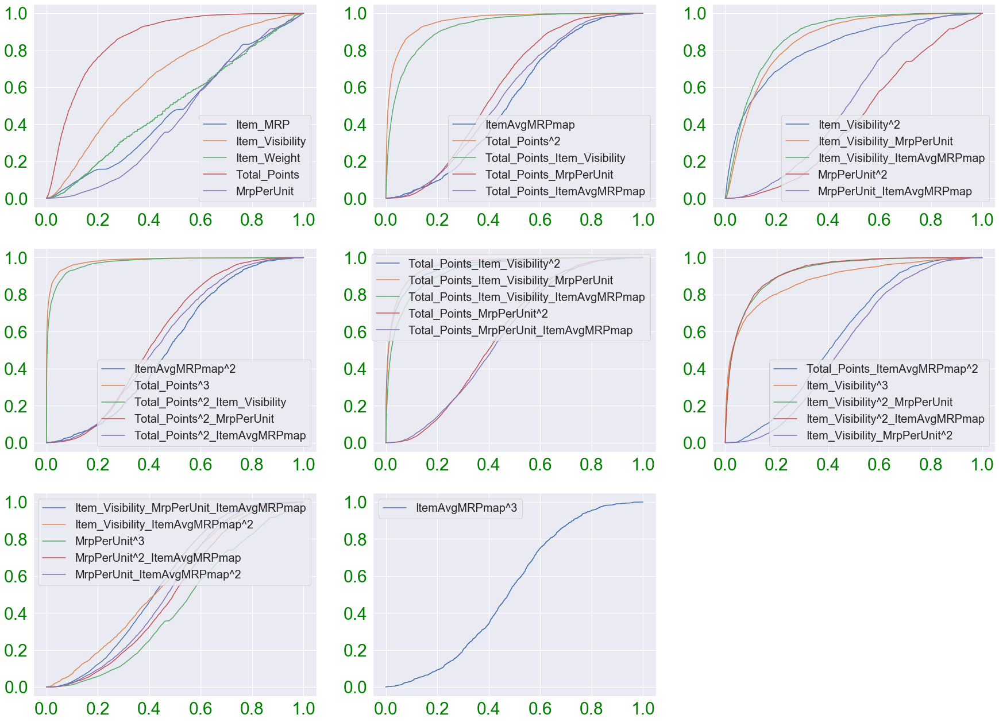

In [120]:
def UniVEDA_conti_cols_CDF_DIST(ColList,_df):
    #print(ColList)
    import math
    from statsmodels.distributions.empirical_distribution import ECDF
    from scipy.stats import norm
    Number_plot=math.ceil(len(ColList)/5)
    k=0
    plt1 = plt
    j = 430
    i = 1
    fig = plt1.figure(figsize=(30, 30))
    plt1.rcParams['font.size'] = 9.0
    plt1.rc('legend',fontsize=20)
    print("-----------------------------Cumulative Distribution plot-------------------\n\n")
    for s in range(Number_plot):
        vars_toPlot=list(ColList[k:k+5])
        k=k+5
        plt1.subplot(j + i)
        
        print(i,".",vars_toPlot)
        i = i + 1
        for colname in vars_toPlot:
            _x,_y=ECDF(_df[colname]).x,ECDF(_df[colname]).y
            #print(colname)
            plt1.plot(_x,_y)
            #plt1.plot(_x, 1. - _y)
            plt1.xticks(fontsize=30,color='green')
            plt1.yticks(fontsize=30,color='green')
            plt1.title('')
            plt1.legend(vars_toPlot)
        
            #plt1.xlabel(fontsize=30,color='brown')
            
        
UniVEDA_conti_cols_CDF_DIST(float_cols,_xtraningData1)   

In [121]:
def generate_submission_file(submission_csv_name,model,org_test,cleaned_test):
    y_pred = model.predict(cleaned_test)

    #Export submission file:
    org_test[label_col]=y_pred
    submission=org_test[['Item_Identifier','Outlet_Identifier',label_col]]
    negRec=len(submission[submission.Item_Outlet_Sales<0])
    if negRec >0:
        print("Output contain Negative records:", negRec)
        submission.to_csv(submission_csv_name, index=False)
        return submission[submission.Item_Outlet_Sales<0]
    else:
        submission.to_csv(submission_csv_name, index=False)
        
    return y_pred

In [122]:
def resilduals_plots(_lr,_colList, _X, _Y, log=False):
    _X=_X[_colList]
    _y_pred = _lr.predict(_X)
    _residual = pd.DataFrame()
    _residual['Predict'] = _y_pred
    _residual['Residual'] = _Y - _y_pred
    _residual['Predicted'] = np.expm1(_residual.Predict)
    _residual['StdResidual'] = np.expm1(_Y) - _residual.Predicted
    _residual.StdResidual = _residual.StdResidual / _residual.StdResidual.std()
    _residual['IDX'] = _X.index
    
    if log:
        fig = plt.figure(figsize=(20,10))
        ax = fig.add_subplot(121)
        g = sns.regplot(y='Residual', x='Predict', data = _residual, order=1, ax = ax) 
        plt.xlabel('Log Predicted Values')
        plt.ylabel('Log Residuals')
        plt.hlines(y=0, xmin=min(_Y)-1, xmax=max(_Y)+1, lw=2, color='red')
        plt.xlim([min(_Y)-1, max(_Y)+1])

        ax = fig.add_subplot(122)
        g = sns.regplot(y='StdResidual', x='Predicted', data = _residual, order=1, ax = ax) 
        plt.xlabel('Predicted Values')
        plt.ylabel('Standardized Residuals')
        plt.hlines(y=0, xmin=np.expm1(min(_Y))-1, xmax=np.expm1(max(_Y))+1, lw=2, color='red')
        plt.xlim([np.expm1(min(_Y))-1, np.expm1(max(_Y))+1])
    else:
        _residual.StdResidual = _residual.Residual / _residual.Residual.std()
        _residual.drop(['Residual', 'Predicted'], axis = 1, inplace=True)
        g = sns.regplot(y='StdResidual', x='Predict', data = _residual, order=1) 
        plt.xlabel('Predicted Values')
        plt.ylabel('Standardized Residuals')
        plt.hlines(y=0, xmin=min(_Y)-1, xmax=max(_Y)+1, lw=2, color='red')
        plt.xlim([min(_Y)-1, max(_Y)+1])

    plt.show()  

    return _residual

In [123]:
from sklearn.linear_model import SGDRegressor,LinearRegression,Ridge,Lasso,ElasticNet
from sklearn.ensemble import GradientBoostingRegressor,RandomForestRegressor,AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from sklearn.compose import TransformedTargetRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

model_dict={} 
model_dict['linear_regression']=LinearRegression()#(penalty = 'l1') #['l1', 'l2']
model_dict['stochastic_gradientDescent_regressor']=SGDRegressor()
model_dict['ridge_regularization']=Ridge() 
model_dict['lasso_regularization']=Lasso()
model_dict['elasticNet_regularization']=ElasticNet() 
model_dict['decision_tree_regressor']=DecisionTreeRegressor(max_depth=20,random_state=46,min_samples_leaf= 29,min_samples_split= 58,
                          max_leaf_nodes= 50)

model_dict['sklearn_gradient_boosting_regressor']=GradientBoostingRegressor(max_depth=20,random_state=46,min_samples_leaf= 29,min_samples_split= 58,
                          max_leaf_nodes= 50,n_estimators=250)
model_dict['xgboost_gradient_boosting_regressor']=XGBRegressor(max_depth=20,random_state=46,min_samples_leaf= 29,min_samples_split= 58,
                          max_leaf_nodes= 50,n_estimators=250)


model_dict['ada_boost_regressor']=AdaBoostRegressor(DecisionTreeRegressor(max_depth=3,min_samples_leaf=500,min_samples_split= 580),random_state=46,n_estimators=500,learning_rate=0.3)
model_dict['random_forest_regressor']=RandomForestRegressor(max_depth=20,random_state=46,min_samples_leaf= 29,min_samples_split= 58,
                          max_leaf_nodes= 50,n_estimators=30,max_features=len(xtrain.columns))

In [124]:
training_scoreDF=pd.DataFrame()
test_predictionDF=pd.DataFrame()
train_predictionDF=pd.DataFrame()
def generate_all_model_score(_xtraningData1,_ytraniningData1,_xtestingData1,tagName):
    import itertools
    from sklearn.preprocessing import MinMaxScaler
    from sklearn.preprocessing import QuantileTransformer, quantile_transform
    for key,val in dict(itertools.islice(model_dict.items(), 0, 10)).items():
        
        model_name=key+'_' + tagName
        model_type=val
        if model_name == 'stochastic_gradientDescent_regressor' + '_' + tagName:
            scaler = MinMaxScaler()
            scaler.fit(_xtraningData1)  # Don't cheat - fit only on training data
            _xtraningData1 = pd.DataFrame(scaler.transform(_xtraningData1),columns=_xtraningData1.columns)
            
        #scaler = MinMaxScaler()
        #scaler.fit(_xtraningData1)  # Don't cheat - fit only on training data
        #_xtraningData1 = pd.DataFrame(scaler.transform(_xtraningData1),columns=_xtraningData1.columns)
        
        #wrapped_model = TransformedTargetRegressor(regressor=model_type, transformer=MinMaxScaler())
        wrapped_model = TransformedTargetRegressor(regressor=model_type, 
                                                    transformer=QuantileTransformer(n_quantiles=300,
                                                     output_distribution='normal'))
        
        training_scoreDF[model_name]=PPM.regressionModelfit_CV(wrapped_model,_xtraningData1.columns,_xtraningData1,_ytraniningData1,model_name,5)
#         from sklearn.metrics import mean_squared_error
#         ptrain=model_type.predict(_xtraningData1)
#         #train_predictionDF[model_name]=xpred
        
#         ptest=model_type.predict(_xtestingData1)
#         #test_predictionDF[model_name]=ptest
#         print("training rmse=",round((mean_squared_error(_ytraniningData1,ptrain)**1/2),2),len(ptest),len(_xtestingData1))
#         return ptest
        #print("test rmse=",mean_squared_error(ytesting,ptest))
#print(xtrainDF.shape,ytrainDF.shape,xtestDF.shape)
generate_all_model_score(xtrain,ytrain,xtest,'with_normalxx')

------------      linear_regression_with_normalxx     ------------
fit_time =0.05
score_time =0.01
test_r2 =0.59
train_r2 =0.60
test_neg_mean_absolute_error =27.51
train_neg_mean_absolute_error =27.37
test_neg_mean_squared_error =1089.64
train_neg_mean_squared_error =1078.28
overFitt_val =  11.359283355775915
------------      stochastic_gradientDescent_regressor_with_normalxx     ------------
fit_time =0.06
score_time =0.01
test_r2 =0.58
train_r2 =0.59
test_neg_mean_absolute_error =27.74
train_neg_mean_absolute_error =27.67
test_neg_mean_squared_error =1100.53
train_neg_mean_squared_error =1095.70
overFitt_val =  4.838551922669467
------------      ridge_regularization_with_normalxx     ------------
fit_time =0.02
score_time =0.01
test_r2 =0.59
train_r2 =0.60
test_neg_mean_absolute_error =27.49
train_neg_mean_absolute_error =27.40
test_neg_mean_squared_error =1088.47
train_neg_mean_squared_error =1080.51
overFitt_val =  7.967681895994701
------------      lasso_regularization_with_nor

# 1. What are the Linear Regression Assumption?

IV = Independent Variable( or label)
DV = Dependent variable ( or input variable)

1.	There exists a linear and additive relationship between dependent (DV) and independent variables (IV).

    By linear, it means that the change in DV by 1 unit change in IV is constant. By additive, it refers to the effect of X on Y is independent of other variables.
2.	There must be no correlation among independent variables. Presence of correlation in independent variables lead to Multicollinearity. If variables are correlated, it becomes extremely difficult for the model to determine the true effect of IVs on DV.
3.	The error terms must possess constant variance. Absence of constant variance leads to heteroskedestacity.
4.	The error terms must be uncorrelated and independent i.e. error at ∈t must not indicate the at error at ∈t+1. Presence of correlation in error terms is known as Autocorrelation. It drastically affects the regression coefficients and standard error values since they are based on the assumption of uncorrelated error terms.
5.	The dependent variable and the error terms must possess a normal distribution.
6. Outliers can also be an issue impacting the model quality by having a disproportionate influence on the estimated model parameters.

Presence of these assumptions make regression quite restrictive. By restrictive I meant, the performance of a regression model is conditioned on fulfillment of these assumptions.

# 2. How do I know these assumptions are violated in my data?

- Graphical methods


    1. Residual vs. Fitted Values Plot
    Ideally, this plot shouldn't show any pattern. But if you see any shape (curve, U shape), it suggests non-linearity in the data set. In addition, if you see a funnel shape pattern, it suggests your data is suffering from heteroskedasticity, i.e. the error terms have non-constant variance, if it is forming cluster, then its non linear relationship

   
   Residual plot are used to analyze the variance of the error of the regressor. If the points are randomly dispersed around the horizontal axis, a linear regression model is usually appropriate for the data; otherwise, a non-linear model is more appropriate.
   

    2. Normality Q-Q Plot
    As the name suggests, this plot is used to determine the normal distribution of errors. It uses standardized values of residuals. Ideally, this plot should show a straight line. If you find a curved, distorted line, then your residuals have a non-normal distribution (problematic situation).


    3. Scale Location Plot
    This plot is also useful to determine heteroskedasticity. Ideally, this plot shouldn't show any pattern. Presence of a pattern determine heteroskedasticity. Don't forget to corroborate the findings of this plot with the funnel shape in residual vs. fitted values.


 
- Non-Graphical methods

    you can also perform quick tests / methods to check assumption violations:


    1.	Durbin Watson Statistic (DW) - This test is used to check autocorrelation. Its value lies between 0 and 4. A DW=2 value shows no autocorrelation. However, a value between 0 < DW < 2 implies positive autocorrelation, while 2 < DW < 4 implies negative autocorrelation.


    2.	Variance Inflation Factor (VIF) - This metric is used to check multicollinearity. VIF <=4 implies no multicollinearity but VIF >=10 suggests high multicollinearity. Alternatively, you can also look at the tolerance (1/VIF) value to determine correlation in IVs. In addition, you can also create a correlation matrix to determine collinear variables.

    3.	Breusch-Pagan / Cook Weisberg Test - This test is used to determine presence of heteroskedasticity. If you find p < 0.05, you reject the null hypothesis and infer tha


# 3. How can you improve the accuracy of a regression model ?
    There is little you can do when your data violates regression assumptions. An obvious solution is to use tree-based algorithms which capture non-linearity quite well. But if you are adamant at using regression, following are some tips you can implement:

1. If your data is suffering from non-linearity, transform the IVs using sqrt, log, square, etc.
2. If your data is suffering from heteroskedasticity, transform the DV using sqrt, log, square, etc. Also, you can use weighted least square method to tackle this problem.
3. If your data is suffering from multicollinearity, use a correlation matrix to check correlated variables. Let's say variables A and B are highly correlated. Now, instead of removing one of them, use this approach: Find the average correlation of A and B with the rest of the variables. Whichever variable has the higher average in comparison with other variables, remove it. Alternatively, you can use penalized regression methods such as lasso, ridge, elastic net, etc.
4. You can do variable selection based on p values. If a variable shows p value > 0.05, we can remove that variable from model since at p> 0.05, we'll always fail to reject null hypothesis.

In [125]:
xtrain.shape

(8523, 66)

In [126]:
def backwardElimination(_df, _ytrain, sl, columns):
    import statsmodels.api as sm
    ini = len(columns)
    numVars = _df.shape[1]
    for i in range(0, numVars):
        regressor = sm.OLS(_ytrain, _df).fit()
        maxVar = max(regressor.pvalues) #.astype(float)
        if maxVar > sl:
            for j in range(0, numVars - i):
                if (regressor.pvalues[j].astype(float) == maxVar):
                    columns = np.delete(columns, j)
                    _df = _df.loc[:, columns]
                    
    print('\nSelect {:d} features from {:d} by best p-values.'.format(len(columns), ini))
    print('The max p-value from the features selecte is {:.3f}.'.format(maxVar))
    print(regressor.summary())
    
    # odds ratios and 95% CI
    conf = np.exp(regressor.conf_int())
    conf['Odds Ratios'] = np.exp(regressor.params)
    conf.columns = ['2.5%', '97.5%', 'Odds Ratios']
    display(conf)
    
    return columns, regressor
SL = 0.051
pv_cols, LR = backwardElimination(xtrain, ytrain, SL, xtrain.columns )



Select 19 features from 66 by best p-values.
The max p-value from the features selecte is 0.029.
                            OLS Regression Results                            
Dep. Variable:      Item_Outlet_Sales   R-squared:                       0.567
Model:                            OLS   Adj. R-squared:                  0.566
Method:                 Least Squares   F-statistic:                     655.5
Date:                Thu, 23 Apr 2020   Prob (F-statistic):               0.00
Time:                        17:03:29   Log-Likelihood:                -71955.
No. Observations:                8523   AIC:                         1.439e+05
Df Residuals:                    8505   BIC:                         1.441e+05
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
--------------

,2.5%,97.5%,Odds Ratios
Item_MRP,inf,inf,inf
Outlet_Size,8.950865e-100,2.925444e-47,1.618186e-73
Outlet_Type_wiseVisibility,inf,inf,inf
Outlet_Ranking,1.531488e+09,1.200614e+24,4.288036e+16
Total_Points,2.248150e+00,5.708609e+01,1.132864e+01
Outlet_Type_Grocery Store,0.000000e+00,0.000000e+00,0.000000e+00
Outlet_Type_Supermarket Type1,0.000000e+00,0.000000e+00,0.000000e+00
Item_Type_Health and Hygiene,1.015272e+22,6.098941e+112,2.488390e+67
Item_Type_Household,2.104734e+13,1.076926e+97,1.505537e+55
Item_Type_Others,8.754099e+06,3.657323e+131,1.789317e+69


# https://www.youtube.com/watch?v=U7D1h5bbpcs 
# Understanding  OLS Summary
1. Rsquare value 0.995)
   That means it signifies how well the model data is fitting 
   is closure to 1  means its a good fit model
   

2. R-squared  , Adj. R-squared  are same No difference
   It means that there is no useless predictor in the model , but if Adj RSqure is less and there difference between
   between Rsquare and AdjRsquare is wide , then there are few or more useless independent variable in the model
   Adj Rquare is calculated by penalize the model with features which are not adding anything.


3. Ftest and p value of ftest ( are used to assess the sigficance of overall model)

    p value of ftest less than 0.05 and F-stat high values 
    will reject the null hypotheis of homoskedasticity and present confidence to evidance that there is no linear relanship among the differece feature and label
    and Or you can say it accept the alternate hypothoses of heteroscadasity.
    there is no multi-collinearity

4. T-test - 

      this is performed betwee the target and each feature seperatly and generated coefficeint values
      null hypotheses says that the coefficient values is zero 
      Alternate hypothesis say that coeffiencet value is greater than zero
      Higher value of T-test value is good and reject the null  hypothesie(accept the alternate hypothese)
      and conforming that coeffecient value is non zero
      For  value of coeffecient closure to zero, you may observe low value of T-stats, higher value of p values (> 0.05) from that table 
      here you can delete the feature ( as you are accepting the null hypothesis)
  
  
5. Durbin Watson Statistic (DW) - 

    This test is used to check autocorrelation. Its value lies between 0 and 4. A DW=2 value shows no autocorrelation. However, a value between 0 < DW < 2 implies positive autocorrelation, while 2 < DW < 4 implies negative autocorrelation.


6. The Jarque-Bera (JB) test is a test for normality. 

    This test is usually used for large data sets,
    because other tests like Q-Q Plots can become unreliable when your sample size is large.

    the Jarque–Bera test is a goodness-of-fit test of whether sample data have the skewness and kurtosis matching a normal distribution.

    The null hypothesis is a joint hypothesis of the skewness being zero and the excess kurtosis being zero
    i. e data is noramally distributed

    JB(PValue>0.05)= Accept Ho (Normal Distribution)
    JB(PValue<0.05)= Reject Ho (Non-Normal Distribution)

    Here is how you use JB in statsmodels. A JB value of roughly 6 or higher indicates that errors are not normally distributed. In other words, this means that the normality null hypothesis has been rejected at the $5\%$ significance level. A value close to 0 on the contrary, indicates the data $is$ normally distributed. We have already seen the JB test using model.summary(). The code below shows you how to run this test on its own.

    Example 1
    [('Jarque-Bera', 0.6688077048615619),

    ('Prob', 0.7157646605518615),

    ('Skew', -0.08863202396577206),

    ('Kurtosis', 2.779014973597054)]

     We have a JB value = 0.67, which is pretty low (and in favor of normality), But But But the p-value of 0.71 is quite high to reject the null hypothesis for normality. Additionally, the kurtosis is below 3, where a kurtosis higher than 3 indicates heavier tails than a normal distribution. The skewness values however show that underlying data is moderately skewed.

    Example 2

     [('Jarque-Bera', 21.90969546280269),

     ('Prob', 1.74731047370758e-05),

     ('Skew', -0.7636952540480038),

     ('Kurtosis', 3.5442808937621666)]

     the JB results considerably worse. More-over, a JB p-value much smaller than 0.05 indicates that the normality assumption should definitely be rejected.
     
     
5. RMSE / MSE / MAE - Error metric is the crucial evaluation number we must check. Since all these are errors, lower the number, better the model. Let's look at them one by one:
   - MSE - This is mean squared error. It tends to amplify the impact of outliers on the model's accuracy. For example, suppose the actual y is 10 and predictive y is 30, the resultant MSE would be (30-10)² = 400.
   - MAE - This is mean absolute error. It is robust against the effect of outliers. Using the previous example, the resultant MAE would be (30-10) = 20
   - RMSE - This is root mean square error. It is interpreted as how far on an average, the residuals are from zero. It nullifies squared effect of MSE by square root and provides the result in original units as data. Here, the resultant RMSE would be √(30-10)² = 20. Don't get baffled when you see the same value of MAE and RMSE. Usually, we calculate these numbers after summing overall values (actual - predicted) from the data.
  
6. AIC/BIC -Akaike information criterion/Bayesian information criterion - Penalizer and rewarders
     The concept of model complexity can be used to create measures aiding in model selection. There are a few measures which explicitly deal with this trade-off between goodness of fit and model simplicity, for instance the Akaike information criterion (AIC) and the Bayesian information criterion (BIC). Both penalize the number of model parameters but reward goodness of fit on the training set, hence the best model is the one with lowest AIC/BIC. BIC penalizes model complexity stronger and hence favors models which are “more wrong” but simpler. While this allows to do model selection without a validation set, it can be strictly applied only for models which are linear in their parameters, even though it typically also works in more general cases, e.g. for general linear models such as logistic regression. For a more detailed discussion, see e.g. Ref. 

In [127]:
print("No of featured selected by OLS regression:", len(pv_cols))
pred = LR.predict(xtrain[pv_cols])

#df_copy['proba'] = pred

y_pred = pred.apply(lambda x: 1 if x > 0.5 else 0)
print('Fvalue: {:.6f}'.format(LR.fvalue))
print('MSE total on the train data: {:.4f}'.format(np.sqrt(LR.mse_total)))

No of featured selected by OLS regression: 19
Fvalue: 655.525153
MSE total on the train data: 1706.4996


# 1.  Normality test - Error terms(residual) from Linear regression

- Purpose:
    The purpose is to check if the residuals are normally distributed or not.
    
    
    We can understand and detect the non-normality of the residual using following methods or plots

## -   1.1. using QQ plot 
## -   1.2. using hist plot
## -   1.4. Statistical methods


- Bad linear model yeild , Non-Normal residual:
    - root cause of Non -normal residual
    - potential reasons could include the linearity assumption being violated or outliers affecting our model.

##### Solution to Normality Issue:
    - If the errors are not normally distributed, non – linear transformation of the variables (response or predictors) can bring improvement in the model.
    - Excluding specific variables (such as long-tailed variables), or removing outliers may solve this problem.

### 1.1. QQ plot 

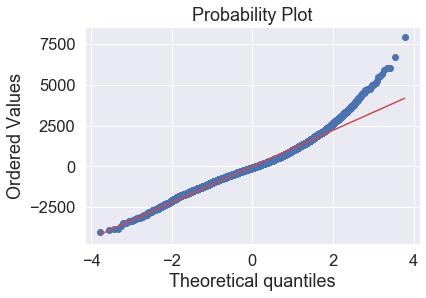

In [128]:
# 1.1 QQ plot
import scipy as sp
#plt.legend(['r'])
_, (__, ___, r)=sp.stats.probplot(LR.resid, plot=plt,fit=True)

QQ plot Conti columns
      
['resid']


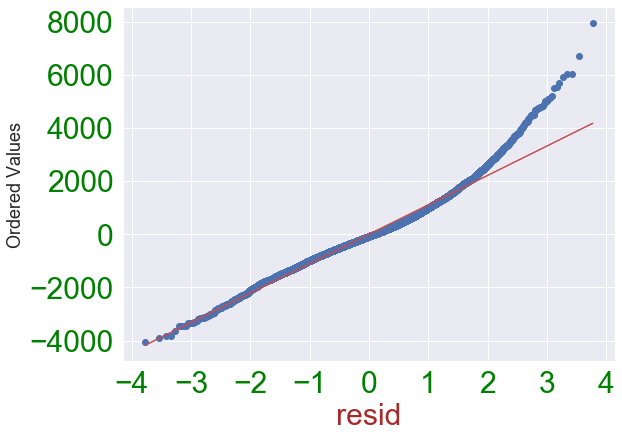

In [129]:
# QQ plot
residDF=pd.DataFrame(LR.resid,columns=['resid'])
contiUniVEDA.UniVEDA_conti_cols_PROBPLOT(['resid'],residDF)


### 1.2 Histogram to test resiudal noramality

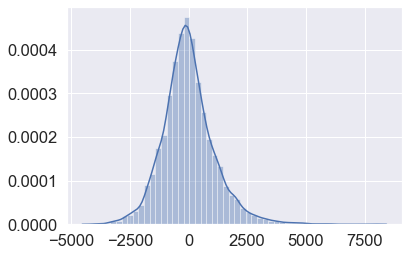

In [130]:

sns.distplot(LR.resid)

### 1.3 The Jarque-Bera (JB) and other test to check normality of Residuals

This test is usually used for large data sets,
because other tests like Q-Q Plots can become unreliable when your sample size is large.

the Jarque–Bera test is a goodness-of-fit test of whether sample data have the skewness and kurtosis matching a normal distribution.

The null hypothesis is a joint hypothesis of the skewness being zero and the excess kurtosis being zero
i. e data is noramally distributed

    JB(PValue>0.05)= Accept Ho (Normal Distribution)
    JB(PValue<0.05)= Reject Ho (Non-Normal Distribution)
    
    if p > 0.05:
        print('Sample looks Gaussian (fail to reject H0)-Accept Ho')
    else:
        print('Sample does not look Gaussian (reject H0)')


Here is how you use JB in statsmodels. A JB value of roughly 6 or higher indicates that errors are not normally distributed. In other words, this means that the normality null hypothesis has been rejected at the $5\%$ significance level. A value close to 0 on the contrary, indicates the data $is$ normally distributed. We have already seen the JB test using model.summary(). The code below shows you how to run this test on its own.

Example 1
[('Jarque-Bera', 0.6688077048615619),

('Prob', 0.7157646605518615),

('Skew', -0.08863202396577206),

('Kurtosis', 2.779014973597054)]
 
 We have a JB value = 0.67, which is pretty low (and in favor of normality), But But But the p-value of 0.71 is quite high to reject the null hypothesis for normality. Additionally, the kurtosis is below 3, where a kurtosis higher than 3 indicates heavier tails than a normal distribution. The skewness values however show that underlying data is moderately skewed.

Example 2

 [('Jarque-Bera', 21.90969546280269),
 
 ('Prob', 1.74731047370758e-05),
 
 ('Skew', -0.7636952540480038),
 
 ('Kurtosis', 3.5442808937621666)]
 
 the JB results considerably worse. More-over, a JB p-value much smaller than 0.05 indicates that the normality assumption should definitely be rejected.

In [131]:
#sm.stats.linear_rainbow(res)
from scipy.stats import shapiro,normaltest,chi2,kstest#,linear_harvey_collier
import statsmodels.stats.api as sms
from statsmodels.stats.diagnostic import normal_ad
JBname = ['Jarque-Bera','Chi^2 two-tail Prob.','Skew', 'Kurtosis']
ONname = ['Omni-Norm-Chi^2', 'Two-tail prob.']

#for i in df.columns:
print("\n--------Noramality test of Linear Regression Residuals-------\n")
print("\t1.  shiproTest:", shapiro(LR.resid))
print("\t2. "  ,normaltest(LR.resid))
print("\t3. " ,kstest(LR.resid,'norm'))
print("\t4. ",dict(zip(JBname, sms.jarque_bera(LR.resid))))
print("\t5. ",dict(zip(ONname, sms.omni_normtest(LR.resid))))
print("\t6.  Anderson-Darling" ,normal_ad(LR.resid))
#sms.linear_rainbow(LR)


--------Noramality test of Linear Regression Residuals-------

	1.  shiproTest: (0.9710742831230164, 3.007456674784979e-38)
	2.  NormaltestResult(statistic=963.9190251715559, pvalue=4.8712810070705525e-210)
	3.  KstestResult(statistic=0.5362252323566491, pvalue=0.0)
	4.  {'Jarque-Bera': 2350.066749482678, 'Chi^2 two-tail Prob.': 0.0, 'Skew': 0.6624395577724959, 'Kurtosis': 5.205055902533405}
	5.  {'Omni-Norm-Chi^2': 963.9190251715559, 'Two-tail prob.': 4.8712810070705525e-210}
	6.  Anderson-Darling (52.04885570501574, 0.0)


# 2. Durbin Watson Statistic (DW -  autocorrelation test) 

    Auto Correlation is also called serial correlation.
    This test is used to check autocorrelation in residuals or error terms. Its value lies between 0 and 4. 
    DW=2  means no autocorrelation. However
    0 < DW < 2 implies positive autocorrelation
    2 < DW < 4 implies negative autocorrelation.
    Null hypothese of DW test say , there in no auto-correlation in the error trems
    DW test is also called AR(1) serieal correlation test 
    


In [132]:
from statsmodels.stats.stattools import durbin_watson
print("DW test Value (Auto-Correlation value) over linearn regression residuals:", durbin_watson(LR.resid))

DW test Value (Auto-Correlation value) over linearn regression residuals: 2.0052818073583385


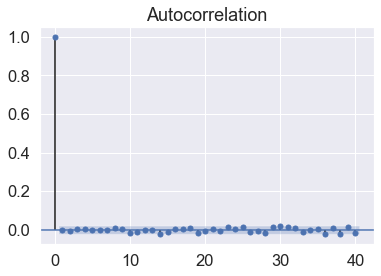

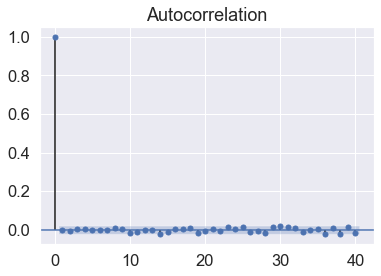

In [133]:
dir(LR) #dta.values.squeeze()
import statsmodels.api as sm
sm.graphics.tsa.plot_acf(LR.resid.values.squeeze(), lags=40)

In [134]:
from scipy.stats import ks_2samp
print(ks_2samp(data[:ntrain]['Item_MRP'],data[:ntrain][label_col]))
#print(kstest(train_org[:ntrain]['Item_MRP'],'norm'))
#print(kstest(xtrain[:ntrain]['Item_MRP'],'norm'))


Ks_2sampResult(statistic=0.9218585005279831, pvalue=0.0)


In [135]:
pv_cols

Index(['Item_MRP', 'Outlet_Size', 'Outlet_Type_wiseVisibility',
       'Outlet_Ranking', 'Total_Points', 'Outlet_Type_Grocery Store',
       'Outlet_Type_Supermarket Type1', 'Item_Type_Health and Hygiene',
       'Item_Type_Household', 'Item_Type_Others', 'Item_Category_Drinks',
       'Item_Category_Food', 'Item_Category_Non-Consumable',
       'Total_Points_Item_Visibility', 'Item_Visibility^2',
       'Item_Visibility_ItemAvgMRPmap', 'Total_Points^2_MrpPerUnit',
       'Total_Points_ItemAvgMRPmap^2', 'ItemAvgMRPmap^3'],
      dtype='object')

# 3. Linearity Test
This assumes that there is a linear relationship between the predictors (e.g. independent variables or features) and the response variable (e.g. dependent variable or label). This also assumes that the predictors are additive.

1. Usefullness of this test
    To Evaluate if linear regression would be a good fitting estimator (pun intended) for your data

2. Impact of ignoring this test:

    your model predictions will be extremely inaccurate because our model is underfitting. This is a serious violation that should not be ignored.
    
    You keep on struggle tuning you model, but it will always underfit... finally answer - test linearity of the data if the data deserve to be fitted with linear model or non linear model
    
#### How to fix Linearity issue: 
    Either adding polynomial terms to some of the predictors or applying nonlinear transformations . If those do not work, try adding additional variables to help capture the relationship between the predictors and the label.
    
    Linearity: Assumes that there is a linear relationship between the predictors and
           the response variable. If not, either a quadratic term or another
           algorithm should be used.
           
# How to test linearity
    regplot or scatter plot between predicted and actual value
    pair plot between label col and feature  with high correlation

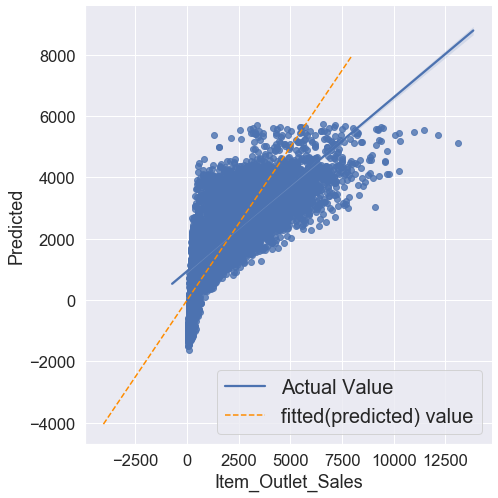

In [136]:
df11=pd.DataFrame(data[:ntrain][label_col],columns=[label_col])
df11['Predicted']=LR.fittedvalues#abs(LR.predict(xtrain[pv_cols]))
df11
#PPM.desc1(df11,2)
sns.lmplot(x=label_col, y='Predicted', data=df11, fit_reg=True,size=7)
line_coords = np.arange(LR.resid.min().min(), LR.resid.max().max())
plt.plot(line_coords, line_coords,  # X and y points
         color='darkorange', linestyle='--')
plt.legend(['Actual Value','fitted(predicted) value'])


Text(0.5, 1.0, 'residual vs predicted/fitted values\n')

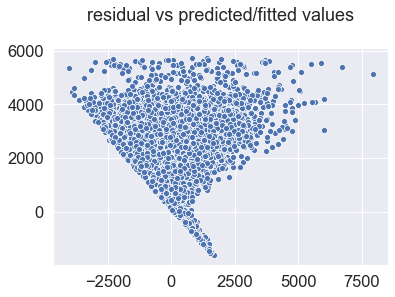

In [137]:
# residual plot between actual value and residuals # LR.resid
sns.scatterplot(LR.resid,LR.fittedvalues)
plt.title('residual vs predicted/fitted values\n')

In [138]:
# Observe above prediction 

# 4. Homoscedasticity/Homogeneity of Variance/Assumption of Equal Variance

    - Homoscedasticity, Data points shows same scatters called fanning effect
    - heterocedasticity, data points shows different scatter called funnel effect/pattern

Linear model does good when there is no heterocedasticity i.e there should not be any trend in the variance of the error terms or residuals; means the variance should be constant.

There are two major things which you should learn:

1. If there exist any pattern (may be, a parabolic shape) in this plot, consider it as signs of non-linearity in the data. It means that the model doesn’t capture non-linear effects.


2. If a funnel shape is evident in the plot, consider it as the signs of non constant variance i.e. heteroskedasticity.


##### 1. scipy statistical test to check zero variance
    Use following test to check equal variance in the data
        1. the Quandt-Goldfeld (no longer used), and 
        2. the Breusch-Pagan and 
        3. White tests (the mainstays).
        4. F statistic in OLS.summary
        Bartlett’s Test
        2. Box’s M Test
        3. Brown-Forsythe Test
        4. Hartley’s Fmax test
        5. Levene’s Test
        
##### 2. Via Residual plots      
    Use residual plot
    We can easily check this by looking at residual vs fitted values plot. If heteroskedasticity exists, the plot would exhibit a funnel shape pattern as shown above. This indicates signs of non linearity in the data which has not been captured by the model. I would highly recommend going through this article for a detailed understanding of assumptions and interpretation of regression plots.
    In order to capture this non-linear effects, we have another type of regression known as polynomial regression. So let us now understand it.

##### 3. 3. Scale Location Plot

##### Solution to Heteroskedasticty:

    The presence of non-constant variance in the error terms results in heteroskedasticity. We can clearly see that the variance of error terms(residuals) is not constant. Generally, non-constant variance arises in presence of outliers or extreme leverage values or non linearity These values get too much weight, thereby disproportionately influencing the model’s performance. When this phenomenon occurs, the confidence interval for out of sample prediction tends to be unrealistically wide or narrow.
    
    To overcome the issue of non-linearity, you can do a non linear transformation of predictors such as log (X), √X or X² transform the dependent variable. To overcome heteroskedasticity, a possible way is to transform the response variable such as log(Y) or √Y. Also, you can use weighted least square method to tackle heteroskedasticity


In [139]:
from statsmodels.stats.diagnostic import het_breuschpagan, het_goldfeldquandt
# het_breuschpagan test is recommended to check homoskedasticity
bpLabels = ['LM Statistic', 'LM-Test p-value', 'F-Statistic', 'F-Test p-value']

# het_white is time taking test to check homoskedasticity
from statsmodels.stats.diagnostic import het_white 

# het_goldfeldquandt test is recommended to check homoskedasticity
gqLabels = ['F statistic', 'p-value']
# het_goldfeldquandt test is recommended to check homoskedasticity

# from  scipy.stats import bartlett
# bartlett(LR.resid,xtrain.values)
print("1. het_breuschpagan-BP test is recommended to check homoskedasticity\n\n\t",
dict(zip(bpLabels,het_breuschpagan(LR.resid,xtrain.values))))

print( "\n2. het_goldfeldquandt-GQ test is recommended to check homoskedasticity\n\n\t",
dict(zip(gqLabels,het_goldfeldquandt(LR.resid,xtrain.values))))

#print(sms.linear_harvey_collier())

1. het_breuschpagan-BP test is recommended to check homoskedasticity

	 {'LM Statistic': 1366.9337055145736, 'LM-Test p-value': 6.641660413465634e-243, 'F-Statistic': 26.064642385018438, 'F-Test p-value': 2.8283287022450806e-269}

2. het_goldfeldquandt-GQ test is recommended to check homoskedasticity

	 {'F statistic': 0.9971840610227011, 'p-value': 0.5363937727718207}


In [140]:
df11=pd.DataFrame(LR.resid,columns=['resid'])

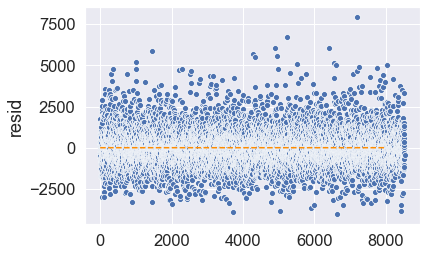

In [141]:
sns.scatterplot(df11.index,df11.resid)
plt.plot(np.repeat(0, LR.resid.max()), color='darkorange', linestyle='--')

------------      LinearREgression     ------------
fit_time =0.06
score_time =0.01
test_r2 =0.56
train_r2 =0.57
test_neg_mean_absolute_error =28.97
train_neg_mean_absolute_error =28.82
test_neg_mean_squared_error =1131.04
train_neg_mean_squared_error =1118.83
overFitt_val =  12.213078572987115


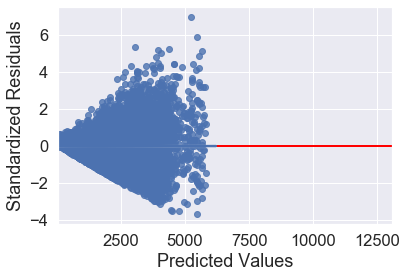

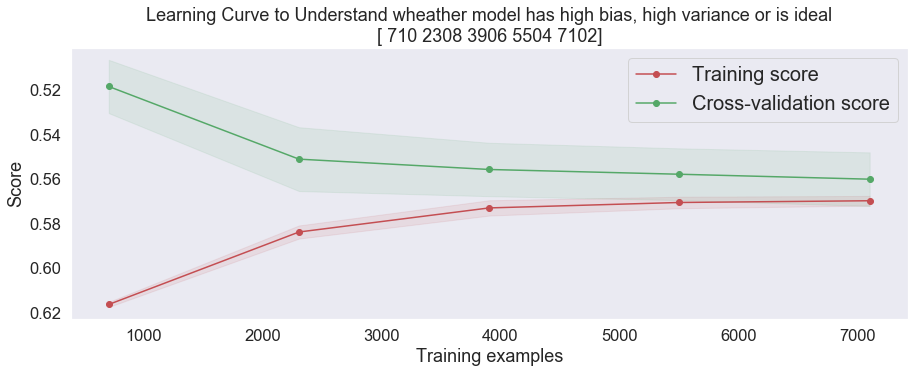

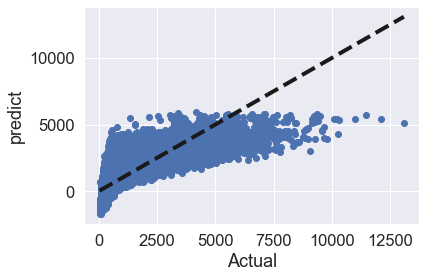

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)


In [142]:


def plotLearningCurve(_model,_ColList,_xtrain,_ytrain,_cv=5):
    from sklearn.model_selection import learning_curve
    _LC_output=learning_curve(_model, _xtrain[_ColList], _ytrain, n_jobs=-1, cv=_cv, train_sizes=np.linspace(.1, 1.0, 5), verbose=0)

    _train_sizes, _train_scores, _test_scores =_LC_output[0],_LC_output[1],_LC_output[2]

    _train_scores_mean,_train_scores_std=np.mean(_LC_output[1], axis=1),np.std(_LC_output[1], axis=1)

    _test_scores_mean,_test_scores_std=np.mean(_LC_output[2], axis=1),np.std(_LC_output[2], axis=1)
    plt.figure(figsize=(15,5))
    plt.title("""Learning Curve to Understand wheather model has high bias, high variance or is ideal\n"""+str(_train_sizes))
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    plt.gca().invert_yaxis()
    print()
    # plot the std deviation as a transparent range at each training set size
    plt.fill_between(_train_sizes, _train_scores_mean - _train_scores_std, _train_scores_mean + _train_scores_std, alpha=0.1, color="r")
    plt.fill_between(_train_sizes, _test_scores_mean - _test_scores_std, _test_scores_mean + _test_scores_std, alpha=0.1, color="g")
    #print(train_scores_mean)  
        # plot the average training and test score lines at each training set size
    plt.plot(_train_sizes, _train_scores_mean, 'o-', color="r", label="Training score",)
    plt.plot(_train_sizes, _test_scores_mean, 'o-', color="g", label="Cross-validation score")
    plt.grid()
    plt.legend(loc="best")
    plt.show()
    
    from sklearn.model_selection import cross_val_predict
    _ptrain=cross_val_predict(_model,_xtrain,_ytrain,cv=_cv)
    fig, ax = plt.subplots()
    ax.scatter(x=_ytrain, y=_ptrain)
    ax.plot([_ytrain.min(), _ytrain.max()], [_ytrain.min(), _ytrain.max()], 'k--', lw=4)
    ax.set_xlabel('Actual')
    ax.set_ylabel('predict')
    plt.show()

# Method 1 - score with all default features in the dataset
LinReg_best=LinearRegression()

#e=PPM.regressionModelfit_CV(LinReg,data[:ntrain].drop(label_col,1).columns, data[:ntrain].drop(label_col,1), data[:ntrain][label_col],'LinearREgression',5)
e=PPM.regressionModelfit_CV(LinReg_best,xtrain.columns, xtrain, ytrain,'LinearREgression',5)

# residual plots
Outputresidual=resilduals_plots(LinReg_best,xtrain.columns,xtrain,ytrain,False)

# learning Curve and 
plotLearningCurve(LinReg_best,xtrain.columns,xtrain,ytrain,6)

LinReg=LinearRegression()
print(LinReg)

In [143]:
#Method 2 OLS Backward feature Elimination 
e=PPM.regressionModelfit_CV(LinReg,pv_cols, xtrain, ytrain,'LinearREgression',5)

------------      LinearREgression     ------------
fit_time =0.01
score_time =0.01
test_r2 =0.56
train_r2 =0.57
test_neg_mean_absolute_error =28.88
train_neg_mean_absolute_error =28.84
test_neg_mean_squared_error =1125.47
train_neg_mean_squared_error =1122.35
overFitt_val =  3.126099557560792


In [144]:
# Method 3 - score with all features select via VIF in the dataset
def getVIF(input_data):
    import statsmodels.formula.api as sm
    from statsmodels.stats.outliers_influence import variance_inflation_factor 
    x_vars=input_data#.drop([dependent_col], axis=1)
    scale = StandardScaler(with_std=False)
    cols = x_vars.columns
    #x_vars1 = pd.DataFrame(scale.fit_transform(x_vars), columns= cols)
    """
    VIF value 
        1 = not correlated.
        Between 1 and 5 = moderately correlated.
        Greater than 5 = highly correlated.
    """
    xvar_names=x_vars.columns
    #cols=[]
    vifL=[]
    variable_IF=[]
    for i in range(0,xvar_names.shape[0]):
        y=x_vars[xvar_names[i]] 
        x=x_vars[xvar_names.drop(xvar_names[i])]
        rsq=sm.ols(formula="y~x", data=x_vars).fit().rsquared  
        ##_variable_IF = variance_inflation_factor(x_vars1.values, i) 
        ##variable_IF.append(_variable_IF)
        vif=round(1/(1-rsq),2)
        ##cols.append(xvar_names[i])
        vifL.append(vif)
    return pd.DataFrame({"vif factor": vifL,  "cols":x_vars.columns}).sort_values('vif factor',ascending=False)

VIF_o=getVIF(xtrain)
vif_cols=VIF_o[VIF_o['vif factor']!=VIF_o['vif factor'].max()]['cols'].values
print(len(vif_cols))
LinReg=LinearRegression()
print(LinReg)
e=PPM.regressionModelfit_CV(LinReg,vif_cols, xtrain, ytrain,'LinearREgression',5)


49
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
------------      LinearREgression     ------------
fit_time =0.05
score_time =0.01
test_r2 =0.56
train_r2 =0.57
test_neg_mean_absolute_error =28.94
train_neg_mean_absolute_error =28.83
test_neg_mean_squared_error =1129.29
train_neg_mean_squared_error =1120.26
overFitt_val =  9.03323295187215


In [145]:
# Method 3 - score with selected features from OLS backward Elimation
LinReg=LinearRegression(normalize=True)
print(LinReg)
e=PPM.regressionModelfit_CV(LinReg,pv_cols, xtrain, ytrain,'LinearREgression',9)
LinRegPred=generate_submission_file('n.csv',LinReg,test_org,xtest[pv_cols])
from sklearn.model_selection import learning_curve
LC_output=learning_curve(LinReg, xtrain[pv_cols], xtrain, n_jobs=-1, cv=6, train_sizes=np.linspace(.1, 1.0, 5), verbose=0)
train_sizes, train_scores, test_scores =LC_output[0],LC_output[1],LC_output[2]


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True)
------------      LinearREgression     ------------
fit_time =0.02
score_time =0.01
test_r2 =0.56
train_r2 =0.57
test_neg_mean_absolute_error =28.88
train_neg_mean_absolute_error =28.84
test_neg_mean_squared_error =1125.21
train_neg_mean_squared_error =1122.52
overFitt_val =  2.6930149635334146
Output contain Negative records: 255


In [146]:
# Method 4 - score with selected features after elimination correlated features
corr = data[:ntrain].corr()
columns = np.full((corr.shape[0],), True, dtype=bool)
for i in range(corr.shape[0]):
    for j in range(i+1, corr.shape[0]):
        if corr.iloc[i,j] >= 0.52:
            if columns[j]:
                columns[j] = False
selected_columns = data.columns[columns]
print(LinReg)
e=PPM.regressionModelfit_CV(LinReg,selected_columns, xtrain, ytrain,'LinearREgression',5)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True)
------------      LinearREgression     ------------
fit_time =0.01
score_time =0.01
test_r2 =0.53
train_r2 =0.54
test_neg_mean_absolute_error =29.53
train_neg_mean_absolute_error =29.44
test_neg_mean_squared_error =1168.93
train_neg_mean_squared_error =1162.98
overFitt_val =  5.94284700876733


In [147]:
# Method 5 - manual feature selection , by removing high coefficient and low coefficient columns
coef = pd.Series(LinReg_best.coef_,xtrain.columns).sort_values()
coef=coef.abs()#
coeff_cols=coef[(coef<5000) & (coef>700)].index
print(len(coeff_cols))
e=PPM.regressionModelfit_CV(LinReg,coeff_cols, xtrain, ytrain,'LinearREgression',5)
#coef.plot(kind='bar', title='Modal Coefficients',figsize=(25,15))

11
------------      LinearREgression     ------------
fit_time =0.01
score_time =0.01
test_r2 =0.56
train_r2 =0.57
test_neg_mean_absolute_error =28.90
train_neg_mean_absolute_error =28.87
test_neg_mean_squared_error =1127.41
train_neg_mean_squared_error =1125.21
overFitt_val =  2.1995318050069272


In [148]:
PPM.desc1(data[[label_col]+list(coeff_cols)],1,label_col)

,dtypes,null_count,total count,unique_count,missing value ratio,variance of numerics,std,mean,min,max,skew,kurt,Numeric pearSonCorr withTarget
Item_Outlet_Sales,float64,5681.0,8523.0,3493.0,40.0,2.912140e+06,1706.50,2181.29,33.2900,13087.00,1.178,1.616,1.000000
Item_MRP,float64,0.0,14204.0,8052.0,0.0,3.854790e+03,62.09,141.00,31.2900,266.89,0.131,-0.894,0.567574
ItemAvgMRPmap^2,float64,0.0,14204.0,1559.0,0.0,9.469370e+04,307.72,228.95,3.0628,2542.78,3.040,12.309,0.302951
Total_Points_MrpPerUnit_ItemAvgMRPmap,float64,0.0,14204.0,13851.0,0.0,1.274480e+11,356999.00,220038.00,0.0000,3953590.00,3.350,15.378,0.265779
Outlet_Type_wiseVisibility,int64,0.0,14204.0,4.0,0.0,6.300000e-01,0.80,2.80,1.0000,4.00,-0.926,0.634,0.264969
Item_Visibility_MrpPerUnit_ItemAvgMRPmap,float64,0.0,14204.0,13851.0,0.0,2.338170e+04,152.91,105.30,0.0000,2035.77,3.508,18.837,0.204537
Item_Visibility_MrpPerUnit^2,float64,0.0,14204.0,13851.0,0.0,2.243880e+06,1497.96,971.87,0.0000,16115.00,3.102,12.761,0.185779
Item_Visibility_ItemAvgMRPmap^2,float64,0.0,14204.0,13700.0,0.0,6.941200e+02,26.35,15.30,0.0000,336.21,4.152,23.835,0.182647
Item_Visibility,float64,0.0,14204.0,13384.0,0.0,0.000000e+00,0.05,0.07,0.0000,0.32,0.978,0.910,0.099271
Outlet_Size,int64,0.0,14204.0,3.0,0.0,4.600000e-01,0.68,1.61,1.0000,3.00,0.655,-0.670,0.060517


['Outlet_Age'] = R2_SQUARE 0.0024142453202204983


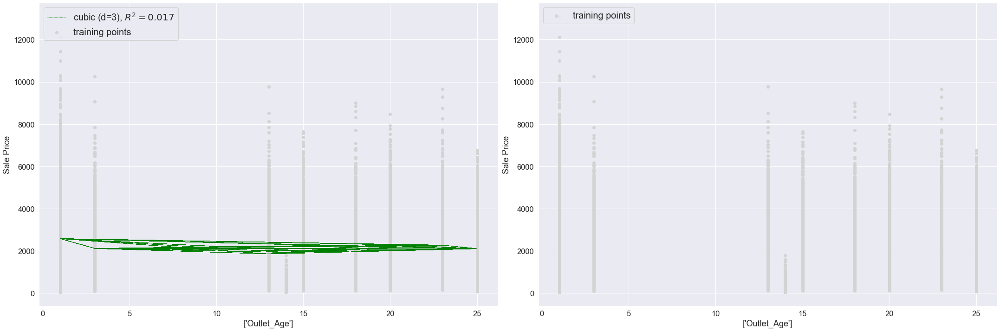

In [149]:
#poly(xtrain,ytrain,'Item_MRP')
poly_cols=['Outlet_Age']
#corr_cols_polyDF=poly(poly_cols,all_data,3)    
for i in range(len(poly_cols)):
     poly(poly_cols[i:i+1],data[:ntrain],3) 

In [150]:
def evaluateColumn_Polynomial(_feature,_label_col,_df,_degree=0,_numCol=3):
    from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
    from sklearn.preprocessing import RobustScaler, PolynomialFeatures, StandardScaler, LabelEncoder
    from sklearn.linear_model import SGDRegressor,LinearRegression,Ridge,Lasso,ElasticNet
   
    # Initializatin of regression models
    regr = LinearRegression()
    def extractData(feat):
        #print("ddd")
        y = _df[_df[_label_col]>0][_label_col]
        X = _df.loc[_df[_label_col]>0, [feat]]
        return (X,y)
    
    def getFeatureR2(_model,feat):
        X,y=extractData(feat)
        _model = _model.fit(X, y)
        y_lin_fit = _model.predict(X)
        #print(r2_score(y, y_lin_fit))
        return r2_score(y, y_lin_fit)


    def getPolyDF(_model,_degree,_feat):
        X,y=extractData(_feat)
        _polyType = PolynomialFeatures(degree=_degree, interaction_only=False, include_bias=False)
        _fittedPoly = _polyType.fit_transform(_df[[feat]])
        target_feature_names = [feature.replace(' ','_') for feature in _polyType.get_feature_names(feat)]
        output_df = pd.DataFrame(_fittedPoly, columns = target_feature_names,  index=_df.index).iloc[:,0:]
        
        _fitted_model = _model.fit(output_df, y)
        _polyPrediction = _model.predict(output_df)
        poly_r2 = r2_score(y, _polyPrediction)
        linear_r2 =getFeatureR2(regr,feat).round(4)
        return ( linear_r2.round(4),poly_r2.round(4),output_df.shape[1])
    _cols=['colname','col_R2_val1','col_poly_R2_val2','diff(val2,val1)','colCount']
    FeaturePoly_r2DF=pd.DataFrame(columns=_cols)

    for feat in _feature:
            r2VAL1,r2VAL2,cnt= getPolyDF(regr,_degree,feat)
            #print(feat,r2VAL1,r2VAL2,r2VAL2-r2VAL1)
            _ser1={'colname':feat,'col_R2_val1':r2VAL1,'col_poly_R2_val2':r2VAL2,'diff(val2,val1)':r2VAL2-r2VAL1,'colCount':cnt}
            FeaturePoly_r2DF=FeaturePoly_r2DF.append(_ser1,ignore_index=True)

    return FeaturePoly_r2DF.sort_values('diff(val2,val1)',ascending=False)

df = ['Outlet_Type_wiseVisibility','Outlet_Identifier_wiseVisibility','MrpPerUnit_ItemAvgMRPmap^2']
poly_cols=['Total_Points', 'Item_Visibility', 'MrpPerUnit', 'ItemAvgMRPmap','Item_MRP']
poly_cols=data.columns
best_Polies=evaluateColumn_Polynomial(poly_cols,label_col,data[:ntrain],2,3).head(5).colname.values
evaluateColumn_Polynomial(list(coeff_cols)+['Outlet_Ranking'],label_col,data[:ntrain],2,3)

,colname,col_R2_val1,col_poly_R2_val2,"diff(val2,val1)",colCount
4,Outlet_Type_wiseVisibility,0.0702,0.2209,0.1507,2
9,Total_Points_MrpPerUnit_ItemAvgMRPmap,0.0706,0.1202,0.0496,2
10,ItemAvgMRPmap^2,0.0918,0.1304,0.0386,2
8,Item_Visibility_MrpPerUnit_ItemAvgMRPmap,0.0418,0.0708,0.0290,2
5,Item_Visibility_ItemAvgMRPmap^2,0.0334,0.0596,0.0262,2
0,Item_Visibility_MrpPerUnit^2,0.0345,0.0531,0.0186,2
11,Outlet_Ranking,0.1683,0.1746,0.0063,2
7,Item_Visibility,0.0099,0.0113,0.0014,2
3,Outlet_Size,0.0037,0.0044,0.0007,2
6,Item_MRP,0.3221,0.3222,0.0001,2


In [151]:
# df=data[:ntrain][[label_col]+list(best_Polies)]
# df['I_1']=df['MrpPerUnit_ItemAvgMRPmap'] + df['Total_Points_ItemAvgMRPmap^2']
# df['I_4']=df['Outlet_Type_wiseVisibility'] / df['Total_Points_ItemAvgMRPmap^2']
# df['I_2']=df['Outlet_Identifier_wiseVisibility'] / df['Total_Points_ItemAvgMRPmap^2']
# #df['I_3']=df['MrpPerUnit_ItemAvgMRPmap'] + df['Total_Points_ItemAvgMRPmap^2']
# PPM.desc1(df,1,label_col)
# evaluateColumn_Polynomial(df.columns,label_col,df,2,3)

In [152]:
def getPolyR2(_feature,_label_col,_df,_degree=3,_retDF=0):
    from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
    from sklearn.preprocessing import RobustScaler, PolynomialFeatures, StandardScaler, LabelEncoder
    from sklearn.linear_model import SGDRegressor,LinearRegression,Ridge,Lasso,ElasticNet
   
    # Initializatin of regression models
    regr = LinearRegression()
    def extractData(feat):
        #print("ddd")
        y = _df[_df[_label_col]>0][_label_col]
        X = _df.loc[_df[_label_col]>0, feat]
        return (X,y)
    
    def getFeatureR2(_model,feat):
        X,y=extractData(feat)
        _model = _model.fit(X, y)
        y_lin_fit = _model.predict(X)
        #print(r2_score(y, y_lin_fit))
        print("----")
        return r2_score(y, y_lin_fit)
    def getPolyDF(_model,_degree,_feat):
        X,y=extractData(_feat)
        _polyType = PolynomialFeatures(degree=_degree, interaction_only=False, include_bias=False)
        _fittedPoly = _polyType.fit_transform(_df[_feat])
        _polyType.get_feature_names(_feat)
        target_feature_names = [feature.replace(' ','_') for feature in _polyType.get_feature_names(_feat)]
        output_df = pd.DataFrame(_fittedPoly, columns = target_feature_names,  index=_df.index).iloc[:, 0:]
        if _retDF==1:
            return output_df
        
        _fitted_model = _model.fit(output_df, y)
        _polyPrediction = _model.predict(output_df)
        poly_r2 = r2_score(y, _polyPrediction)
        linear_r2 =getFeatureR2(regr,_feat).round(4)
        retVal=( linear_r2.round(4),poly_r2.round(4),output_df.shape[1])
        #print(retVal)
        return retVal
    return getPolyDF(regr,_degree,_feature)
    #print(getFeatureR2(regr,_feature))


In [153]:
myCol=set(['Outlet_Ranking','Item_Weight','Item_MRP','Outlet_Type_Grocery Store']).union(set(coeff_cols))
df=data[:ntrain][[label_col]+list(myCol)]

PPM.desc1(df,1,label_col)
baseR2,polyR2,polyDF=getPolyR2(list(myCol),label_col,df,2)
baseR2,polyR2,polyDF

----


(0.5664, 0.6123, 104)

In [154]:
summydf=PPM.desc1(data[:ntrain],1,label_col)
intCols=data.columns[data.dtypes == 'int64']
intdf=data[:ntrain][[label_col,'Item_MRP']+list(intCols)]
evaluateColumn_Polynomial(intdf.drop(label_col,1).columns,label_col,intdf,9,)[['col_R2_val1','col_poly_R2_val2','diff(val2,val1)']].sum(0)
#getRegressionR2(intdf.drop(label_col,1).columns,label_col,intdf)
baseR2,polyR2,polyDF=getPolyR2(intdf.drop(label_col,1).columns,label_col,intdf,2)
baseR2,polyR2,polyDF

----


(0.5348, 0.6028, 44)

In [155]:
list(set(coeff_cols).union(set(intCols))) 

['Item_Visibility',
 'Outlet_Type_Supermarket Type2',
 'Item_Visibility_ItemAvgMRPmap^2',
 'Item_MRP',
 'Item_Visibility_MrpPerUnit_ItemAvgMRPmap',
 'Outlet_Identifier_wiseVisibility',
 'Outlet_Ranking',
 'Outlet_location_type_wiseVisibility',
 'ItemAvgMRPmap^2',
 'Outlet_Age',
 'Outlet_Type_wiseVisibility',
 'Outlet_Type_Grocery Store',
 'Outlet_Size',
 'Total_Points_MrpPerUnit_ItemAvgMRPmap',
 'Item_Visibility_MrpPerUnit^2',
 'Item_Fat_Content']

In [156]:
summydf=PPM.desc1(data[:ntrain],1,label_col)
intCols=data.columns[data.dtypes == 'int64']
intCols=list(set(coeff_cols).union(set(intCols)))
intdf=data[:ntrain][[label_col]+list(intCols)]
#evaluateColumn_Polynomial(intdf.drop(label_col,1).columns,label_col,intdf,9,)[['col_R2_val1','col_poly_R2_val2','diff(val2,val1)']].sum(0)
#getRegressionR2(intdf.drop(label_col,1).columns,label_col,intdf)
iCol=intdf.drop(label_col,1).columns#[9:]
print(len(iCol))
baseR2,polyR2,polyDF=getPolyR2(iCol,label_col,intdf,2)
baseR2,polyR2,polyDF

16
----


(0.5667, 0.6136, 152)

In [157]:
polyDF=getPolyR2(iCol,label_col,data,2,1)
polyDF.shape

(14204, 152)

In [158]:
# generate_all_model_score(xtrain[pv_cols],ytrain,xtest[pv_cols],'with_normal')
# olstab=pd.DataFrame({ "colname": LR.params.index,
# "coeff": LR.params.values.round(4),
# "tval":LR.tvalues.values.round(4),
# "pval":LR.pvalues.values.round(4)})
# olstab.head()

In [159]:
e=PPM.regressionModelfit_CV(LinReg,polyDF.columns, polyDF[:ntrain], ytrain,'LinearREgression',5)
LinReg.fit(polyDF[:ntrain],ytrain)
#LinReg.predict(polyDF[ntrain:])
generate_submission_file('n1.csv',LinReg,test_org,polyDF[ntrain:])

------------      LinearREgression     ------------
fit_time =0.10
score_time =0.01
test_r2 =0.60
train_r2 =0.62
test_neg_mean_absolute_error =27.56
train_neg_mean_absolute_error =27.26
test_neg_mean_squared_error =1084.54
train_neg_mean_squared_error =1057.94
overFitt_val =  26.59425434657146
Output contain Negative records: 16


,Item_Identifier,Outlet_Identifier,Item_Outlet_Sales
78,DRP47,OUT019,-36.620423
242,FDJ10,OUT010,-411.858725
474,FDV28,OUT019,-275.247573
930,DRC01,OUT010,-40.870839
1191,FDB03,OUT019,-1079.696798
1616,DRF51,OUT010,-23.746240
2179,FDQ47,OUT019,-242.790328
2609,NCE31,OUT019,-315.830907
3231,FDX10,OUT019,-14.812302
3378,FDJ10,OUT019,-69.479262


In [160]:
# Bagging of Linear Regressor 
from sklearn.ensemble import BaggingRegressor
BgingRegr = BaggingRegressor(base_estimator=LinReg, n_estimators=1000, random_state=0)
BgingRegr.fit(polyDF[:ntrain], ytrain)
ptrain=BgingRegr.predict(polyDF[:ntrain])
rmse=np.sqrt(np.mean((ptrain - ytrain)*(ptrain - ytrain)))
print("\nBagging RMSE-",rmse)
baggingRegressionSubmissions=generate_submission_file('n.csv',BgingRegr,test_org,polyDF[ntrain:])
#e=PPM.regressionModelfit_CV(BgingRegr,polyDF.columns, polyDF[:ntrain], ytrain,'BaggingLinearRegression',5)



Bagging RMSE- 1060.5353205815275
Output contain Negative records: 16


In [161]:
e=generate_submission_file('n.csv',BgingRegr,test_org,polyDF[ntrain:])

Output contain Negative records: 16


# Decision Tree Tuning

In [162]:
# I prefer Manual tuning Dectison tree hypertuning parameter

In [163]:
paramDT={     "criterion": "mse",
              "min_samples_split": 20,#[i for i in range(3,500,10)],
              "max_depth": 20,# [i for i in range(2,,3)],
             "min_samples_leaf": 10,#[i for i in range(1,500,20)],
              "max_leaf_nodes": 300,#[i for i in range(2,100,20)],
              "max_features":42# ['auto', 'sqrt', 'log2'],
              }
dt_DefaultModel= DecisionTreeRegressor(**paramDT)
e=PPM.regressionModelfit_CV(dt_DefaultModel,xtrain.columns, xtrain, ytrain,'DeciTree',5)


------------      DeciTree     ------------
fit_time =0.32
score_time =0.01
test_r2 =0.48
train_r2 =0.74
test_neg_mean_absolute_error =29.21
train_neg_mean_absolute_error =24.86
test_neg_mean_squared_error =1234.40
train_neg_mean_squared_error =877.68
overFitt_val =  356.7231761574494


In [773]:
paramDT={     "criterion": "mse",
              "min_samples_split": 200,#[i for i in range(3,500,10)],
              "max_depth": 12,# [i for i in range(2,,3)],
             "min_samples_leaf": 40,#[i for i in range(1,500,20)],
              "max_leaf_nodes": 100,#[i for i in range(2,100,20)],
              "max_features":150# ['auto', 'sqrt', 'log2'],

              }
paramDT2={     "criterion": "mse",
              "min_samples_split": 500,#[i for i in range(3,500,10)],
              "max_depth": 8,# [i for i in range(2,,3)],
              "min_samples_leaf": 6,#[i for i in range(1,500,20)],
              "max_leaf_nodes": 100,#[i for i in range(2,100,20)],
              "max_features":'auto'# ['auto', 'sqrt', 'log2'],


              }
#print(goodcols)
dt_DefaultModel= DecisionTreeRegressor(**paramDT2,random_state=49)
e=PPM.regressionModelfit_CV(dt_DefaultModel,polyDF.columns, polyDF[:ntrain], ytrain,'LinearREgression',2)
#dt_DefaultModel.fit(polyDF[:ntrain],ytrain)
dtPred=generate_submission_file('n1.csv',dt_DefaultModel,test_org,polyDF[ntrain:])


------------      LinearREgression     ------------
fit_time =0.27
score_time =0.01
test_r2 =0.56
train_r2 =0.59
test_neg_mean_absolute_error =28.17
train_neg_mean_absolute_error =27.75
test_neg_mean_squared_error =1128.30
train_neg_mean_squared_error =1092.86
overFitt_val =  35.43597762773538


# RandomizedSearchCV for Decision Tree ( i having used it )

In [165]:
# print(xtrain.shape)

# # 6 Decision_Tree_param_grid 
# Decision_Tree_param_grid = {"criterion": ["mse"],
#               "max_depth": [6],#[i for i in range(1,20,1)],
#               "max_features":[57],#['auto', 'sqrt', 'log2'], 
#               "min_samples_split":[i for i in range(3,500,10)],#[180],
#               "min_samples_leaf": [i for i in range(1,50,2)],
#               "max_leaf_nodes": [i for i in range(2,100,2)],
              
#               }
# from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
# dt_model= DecisionTreeRegressor(random_state=46)

# dt_esti = RandomizedSearchCV(estimator = dt_model, param_distributions = Decision_Tree_param_grid,
#                              n_iter = 100, 
#                             cv = 6,verbose=0, random_state=42, n_jobs = -1,scoring='neg_mean_squared_error')
# dt_esti.fit(xtrain,ytrain)
# print(dt_esti.best_params_,"\n\nRMSE-",np.sqrt(dt_esti.best_score_*-1))
# dt_param=dt_esti.best_params_
# model_RFE= DecisionTreeRegressor(**dt_param)
# e=PPM.regressionModelfit_CV(model_RFE,xtrain.columns, xtrain, ytrain,'DeciTree',5)
# generate_submission_file('n.csv',model_RFE,test_org,xtest)

# high variance and Overfitting is the curse in Decision tree

    - Random Forest Vs BaggingRegressor
    The fundamental difference is that in Random forests, only a subset of features are selected at random out of the total and the best split feature from the subset is used to split each node in a tree, unlike in bagging where all features are considered for splitting a node.
    
    The second Major difference is that the prediction from diffrent estimators in Random forest are less correlated  ( reason you know - because the each estimator is using different set of feature for node split) while prediction from different estimator in BaggingRegressor is correlated ( reason you know - because the each estimator is same set of features for node split) 
    
    These two are Bagging(BootStrap aggregation) used to address the High variance or overfitting issue of the Decision tree (as you know Decision Tree always overfit with default parameter that allows the individual DT model to go deep without pruning)

### 1. Address high variance in decision tree using bagging regressor


overfitting happens when our model captures the noise along with the underlying pattern in data. It happens when we train our model a lot over noisy dataset. These models have low bias and high variance. These models are very complex like Decision trees which are prone to overfitting

The larger the variance, the more sensitive are the predictions for x to small changes in the training set. 

In [166]:
# Bagging regressor On top of manual tuned decision tree

In [766]:
from sklearn.ensemble import BaggingRegressor
BgingRegr = BaggingRegressor(base_estimator=dt_DefaultModel, n_estimators=1500, random_state=0)
BgingRegr.fit(polyDF[:ntrain], ytrain)
ptrain=BgingRegr.predict(polyDF[:ntrain])
rmse=np.sqrt(np.mean((ptrain - ytrain)*(ptrain - ytrain)))
print("\nBagging RMSE-",rmse)
#e=PPM.regressionModelfit_CV(BgingRegr,xtrain.columns, xtrain, ytrain,'DeciTree',5)
baggPred=generate_submission_file('n1.csv',BgingRegr,test_org,polyDF[ntrain:])
[baggPred,dtPred]



Bagging RMSE- 1066.3519010055497


[array([1699.66145133, 1490.96311735,  491.93868241, ..., 1740.03489026,
        4031.24087586, 1334.23422041]),
 array([1693.57637063, 1330.7066481 ,  569.31422765, ..., 1764.34183927,
        4080.42188   , 1270.26630376])]

In [169]:
# from sklearn.ensemble import BaggingRegressor
# BgingRegr = BaggingRegressor(base_estimator=model_RFE, n_estimators=300, random_state=0)
# BgingRegr.fit(xtrain, ytrain)
# ptrain=BgingRegr.predict(xtrain)
# rmse=np.sqrt(np.mean((ptrain - ytrain)*(ptrain - ytrain)))
# print("\nBagging RMSE-",rmse)
# e=PPM.regressionModelfit_CV(BgingRegr,xtrain.columns, xtrain, ytrain,'DeciTree',5)


# Random Forest

1. The Random Forest algorithm does overfit without changing the bias
Adding more tree will reduce the variance

2. The single decision tree is very sensitive to data variations. It can easily overfit to noise in the data. The Random Forest with only one tree will overfit to data as well because it is the same as a single decision tree. When we add trees to the Random Forest then the tendency to overfitting should decrease (thanks to bagging and random feature selection). However, the generalization error will not go to zero.

3. A random forest is like a black box and works as mentioned in above answer. It's a forest you can build and control. You can specify the number of trees you want in your forest(n_estimators) and also you can specify max num of features to be used in each tree. But you cannot control the randomness, you cannot control which feature is part of which tree in the forest, you cannot control which data point is part of which tree. Accuracy keeps increasing as you increase the number of trees, but becomes constant at certain point.

#### Advantages of Random Forest
1. One of benefits of Random forest which excites me most is, the power of handle large data set with higher dimensionality. It can handle thousands of input variables and identify most significant variables so it is considered as one of the dimensionality reduction methods. Further, the model outputs Importance of variable, which can be a very handy feature (on some random data set).

2. It has an effective method for estimating missing data and maintains accuracy when a large proportion of the data are missing.

3. It has methods for balancing errors in data sets where classes are imbalanced.

4. The capabilities of the above can be extended to unlabeled data, leading to unsupervised clustering, data views and outlier detection.

5. Random Forest involves sampling of the input data with replacement called as bootstrap sampling. Here one third of the data is not used for training and can be used to testing. These are called the out of bag samples. Error estimated on these out of bag samples is known as out of bag error. Study of error estimates by Out of bag, gives evidence to show that the out-of-bag estimate is as accurate as using a test set of the same size as the training set. Therefore, using the out-of-bag error estimate removes the need for a set aside test set.
 

#### Disadvantages of Random Forest
    It surely does a good job at classification but not as good as for regression problem as it does not give precise continuous nature predictions. In case of regression, it doesn’t predict beyond the range in the training data, and that they may over-fit data sets that are particularly noisy.
    Random Forest can feel like a black box approach for statistical modelers – you have very little control on what the model does. You can at best – try different parameters and random seeds!

In [170]:
#got 1150 score

In [794]:
paramDT1={     "criterion": "mse",
              "min_samples_split": 250,#[i for i in range(3,500,10)],
              "max_depth": 10,# [i for i in range(2,,3)],
              "min_samples_leaf": 7,#[i for i in range(1,500,20)],
              "max_leaf_nodes": 130,#[i for i in range(2,100,20)],
              "max_features":'auto',# ['auto', 'sqrt', 'log2'],
              "n_estimators":100

              }

rf= RandomForestRegressor(**paramDT1,random_state=45)

rf.fit(polyDF[:ntrain], ytrain)
ptrain=rf.predict(polyDF[:ntrain])
rmse=np.sqrt(np.mean((ptrain - ytrain)*(ptrain - ytrain)))
print("\nBagging RMSE-",rmse)
rfPred=generate_submission_file('n2.csv',rf,test_org,polyDF[ntrain:])
#e=PPM.regressionModelfit_CV(rf,polyDF.columns, polyDF[:ntrain], ytrain,'randomForest',5)
# submission score is 1157



Bagging RMSE- 1037.1732432997887


##### {'criterion': 'mse', 'min_samples_split': 200, 'max_depth': 12, 'min_samples_leaf': 40, 'max_leaf_nodes': 100,
 'max_features': 150, 'n_estimators': 5}
fit_time =86.27
score_time =1.48
test_r2 =0.60
train_r2 =0.66
test_neg_mean_absolute_error =27.50
train_neg_mean_absolute_error =26.38
test_neg_mean_squared_error =1083.29
train_neg_mean_squared_error =995.74

Total Columns= 151
Number of selected good_columns= 76  with threshold= 0.0001

Bagging RMSE- 1044.9732417685427


<Figure size 1440x1080 with 0 Axes>

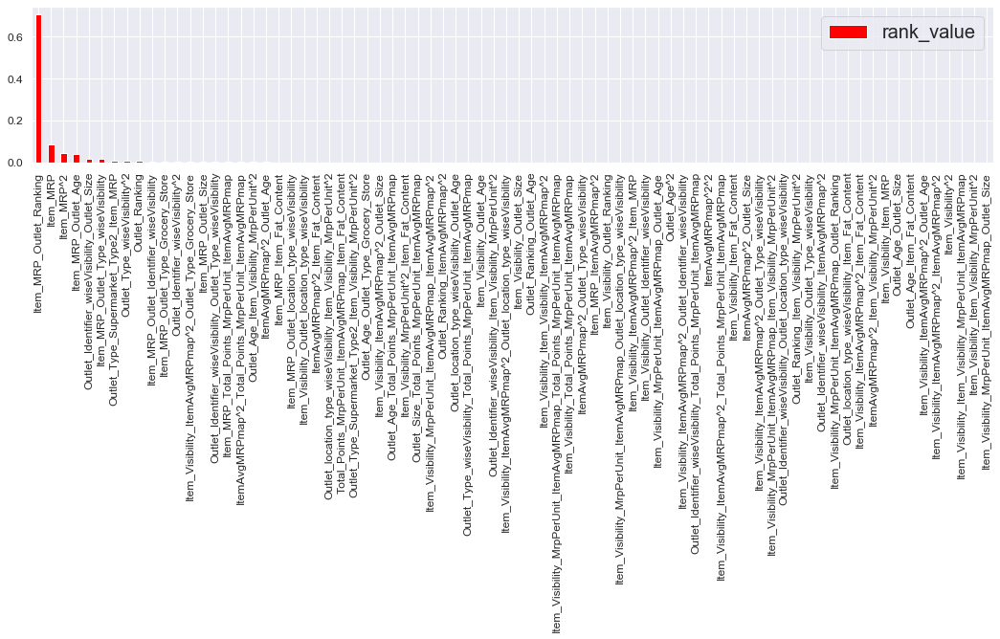

In [714]:
imp_feature=rf.feature_importances_

def featureImportance_BAR(_imp_features,_df1,rank_threshold=0.0001):
    _df=pd.DataFrame({'rank_value':imp_feature,'feature_name':_df1.columns},index=_df1.columns).sort_values('rank_value',ascending=False)
    _df=_df[_df['rank_value']>rank_threshold]
    fig=plt.figure(figsize=(20,15))
    #print(_df.tail())
    _df.plot.bar(figsize=(18,3),fontsize=12,color='red')
    print('Total Columns=',_df1.shape[1])
    print('Number of selected good_columns=',len(_df)," with threshold=",rank_threshold)
    return _df.index


paramDT1={     "criterion": "mse",
              "min_samples_split": 300,#[i for i in range(3,500,10)],
              "max_depth": 10,# [i for i in range(2,,3)],
              "min_samples_leaf": 7,#[i for i in range(1,500,20)],
              "max_leaf_nodes": 130,#[i for i in range(2,100,20)],
              "max_features":'auto',# ['auto', 'sqrt', 'log2'],
              "n_estimators":10

              }

rf2= RandomForestRegressor(**paramDT1,random_state=45)
goodcols=featureImportance_BAR(imp_feature,polyDF[:ntrain],0.0001)
rf2.fit(polyDF[:ntrain][goodcols], ytrain)
ptrain=rf2.predict(polyDF[:ntrain][goodcols])
rmse=np.sqrt(np.mean((ptrain - ytrain)*(ptrain - ytrain)))
print("\nBagging RMSE-",rmse)
rfPred=generate_submission_file('n2.csv',rf2,test_org,polyDF[ntrain:][goodcols])
#e=PPM.regressionModelfit_CV(rf2,goodcols, polyDF[:ntrain], ytrain,'randomForest',5)


In [173]:
# Randamization parameter tuning

# # # 7.Random_forest_random_grid
# rf= RandomForestRegressor(random_state=46)
# Random_forest_random_grid = {
#              "criterion": ["mse"],
#               "min_samples_split": [2,4,7,9],
#               "max_depth":  [2,5,10,14],
#               "min_samples_leaf": [10,20,50,70],
#               "max_leaf_nodes": [2,5,10],
#               "max_features": ['auto']#, 'sqrt', 'log2'],
#               "n_estimators":[10,30,60]
#                }
# rf_random11 = RandomizedSearchCV(estimator = rf, param_distributions = Random_forest_random_grid, n_iter = 150,
#                                cv = 7,
#                                verbose=0, random_state=42, n_jobs = -1,scoring='neg_mean_squared_error')
# #model_type_wise_hyperParams_grid_dict['random_forest_regressor']=Random_forest_random_grid
# rf_random11.fit(polyDF[:ntrain],ytrain)
# xfb_Bestmodel=rf_random.best_estimator_
# e2=PPM.regressionModelfit_CV(xfb_Bestmodel,goodcols[:20], xtrain, ytrain,'xgb',6)
# # from sklearn.metrics import mean_squared_error
# imp_feature=xfb_Bestmodel.feature_importances_

# def featureImportance_BAR(_imp_features,_df1):
#     _df=pd.DataFrame({'rank_value':imp_feature,'feature_name':_df1.columns},index=_df1.columns).sort_values('rank_value',ascending=False)
#     _df=_df[_df['rank_value']>0.0001]
#     fig=plt.figure(figsize=(20,15))
#     #print(_df.tail())
#     _df.plot.bar(figsize=(18,3),fontsize=12,color='red')
#     print('Total Columns=',len(_df1))
#     print('Number_of_good_columns=',len(_df))
#     return _df.index
# goodcols=featureImportance_BAR(imp_feature,xtrain)
# #generate_submission_file('n.csv',rf_estim,test_org,xtest)
# goodcols


# xGB boost


XGBoost-XGBM/Light GBM are two open source implementation of the GBDT concept(scikit-learn has another version of GBDT algorithm, but XGBoost is faster and many other technical advantages.)

#####  how xgb boosting works

In order to train the model, we need to define the  ###  --- ['objective function'] --- ### to measure how well the model fit the training data.

A salient characteristic of objective functions is that they consist two parts: 
    - training loss function or gradient coefficient that is optimized with each subsequent model building 
    - regularization term:

object function is the sum of training loss function and regurlarisation function

Where 
1. 𝐿 is the training loss function,  A common choice of 𝐿 is the mean squared error,
2. Ω is the regularization term.

Xgbm is additive algorithm that train Week learners or estimators with low bias and high variance and its predicton pass on to next subsequent week learning is build in order to minimize loss function (like MSE) or regularize the loss function and its predicton are added to previous week learner and it repeats with each iteration until  minumam and best coeffiects and that how it forms strong learner.

The important thing to note here is that computing the best split/coefficients requires the model to go through various splits and compute the criterion for each split. There is no analytical solution for determining the best split at each stage.

Unlike Adaboost where we are assigning or increments the weight of incorrect predictions instead Gradient descent tries to optimize the cost function.

Gradient boosting helps in predicting the optimal gradient for the additive model, unlike classical gradient descent techniques which reduce error in the output at each iteration.

#### What is Boosting Algorithm 

As you know, a single decision tree is prone to overfitting and is unlikely to generalize well.
On other hand, if we reduce the flexibility of a decision tree, such as by limiting its depth, but those methods then cause the decision tree to underfit. To address both these limitation we use boosting.

It’s a boosting algorithm in which their bases models (learner/estimator) are of same type and are built sequentially and each subsequent model is built over the errors of previous learner in order to reduces error and correct the predictions.


The each subsequent model performance is boosted because it works on the mistakes of the previous model and try to understand the pattern of error.


The base learners in boosting are weak learners in which the bias is high, and the predictive power is just a tad better than random guessing. Each of these weak learners contributes some vital information for prediction, enabling the boosting technique to produce a strong learner by effectively combining these weak learners. The final strong learner brings down both the bias and the variance.

In contrast to bagging techniques like Random Forest, in which trees are grown to their maximum extent, boosting makes use of trees with fewer splits or short trees

###### When to use a boosted trees model?
Different kinds of models have different advantages. The boosted trees model is very good at handling tabular data with numerical features, or categorical features with fewer than hundreds of categories. Unlike linear models, the boosted trees model are able to capture non-linear interaction between the features and the target.

##### restrication on tree based model?
One important note is that tree based models are not designed to work with very sparse features. When dealing with sparse input data (e.g. categorical features with large dimension), we can either pre-process the sparse features to generate numerical statistics, or switch to a linear model, which is better suited for such scenarios.

###### ADA vs GBM
ADA boost the performance by providing higher wieght to wrong predicton while GBM boost the perform bossting by optimizing the cost function

Both Gradient boost and Ada boost work with decision trees however, Trees in Gradient Boost are larger than trees in Ada Boost.

Both Gradient boost and Ada boost scales decision trees however, Gradient boost scales all trees by same amount unlike Ada boost.

GBM  offers 
    Better accuracy,
    Less pre-processing,
    Higher flexibility with many hyper-parameter and loss functions,
    handles the missing data on its own and does not require us to handle it explicitly


Note: GBM focus on cost function that is optimised on residuals unlike linear regression which focus on loss function on residual square (that usually offers less control and does not essentially correspond with real world applications.)




# Note on Xgboosting Tuning

Xgbm also called additive model as it add weak learners to minimize the loss function.

1. max_leaf_nodes
The maximum number of terminal nodes or leaves in a tree.
Can be defined in place of max_depth. Since binary trees are created, a depth of ‘n’ would produce a maximum of 2^n leaves.
If this is defined, GBM will ignore max_depth.

2. max_depth: Determines how deeply each tree is allowed to grow during any boosting round. [default=6]

2. n_estimators:
    xgb.XGBRegressor is the xgb implementation in scikit , So num_boost_round and n_estimators are same
    its low value cause underfitting, high value cause over fitting-  Typical values range from 100-1000
3. early_stopping_rounds: 
    It's smart to set a high value for n_estimators and then use early_stopping_rounds to find the optimal time to stop iterating ideal value early_stopping_rounds = 5

4. Learning rate-important trick: also called shrinkage or weighting factor. As we know, xgboost lineup week unit length trees(stump) in a sequence and it pass on the predicted residual from one to next tree in order the correct the prediction. learning rate value should be less than 0.3 is considered good

its common called Step size shrinkag.

Instead of getting predictions by simply adding up the predictions from each component model, we will multiply the predictions from each model by a small number before adding them in. This means each tree we add to the ensemble helps us less. In practice, this reduces the model's propensity to overfit.

In general small value of learning rate and large value of n_estimater give you optimal model

5. n_jobs : to parallelize model 

6. colsample_bytree: Percentage of features used per tree. High value can lead to overfitting. [default=1]
Similar to max_features in GBM. Denotes the fraction of columns to be randomly samples for each tree.
Typical values: 0.5-1

7. subsample: Percentage of samples used per tree. Low value can lead to underfitting.[default=1]
Same as the subsample of GBM. Denotes the fraction of observations to be randomly samples for each tree.
Lower values make the algorithm more conservative and prevents overfitting but too small values might lead to under-fitting.
Typical values: 0.5-1


9 min_child_weight: Minimum sum of instance weight (hessian) needed in a child. The larger min_child_weight is, the more conservative the algorithm will be. [default=1]

10 reg_alpha: L1 regularization term on weights. Increasing this value will make model more conservative.[default=0]
    L1 regularization term on weight (analogous to Lasso regression)
Can be used in case of very high dimensionality so that the algorithm runs faster when implemented

11 reg_lambda: L2 regularization term on weights. Increasing this value will make model more conservative.[default=1]
    L2 regularization term on weights (analogous to Ridge regression)
This used to handle the regularization part of XGBoost. Though many data scientists don’t use it often, it should be explored to reduce overfitting.

12 gamma: Controls whether a given node will split based on the expected reduction in loss after the split. A higher value leads to fewer splits.

13 silent: 0 means printing running messages, 1 means silent mode.[default=0]

14 nthread: Number of parallel threads used to run XGBoost[If -1, uses maximum threads available on the system]

15. random_state: Random number seed. (replaces seed)

15. Increasing eta, descreases the number of round, hence makes computation faster but does not make reaching the best optimum.

 Decreasing eta , increases the number of round,hence makes computation slower but makes easier reaching the best optimum.
 
 
# Guide lines for GradientBoosting Regressor
1. Choose a relatively high learning rate. Generally the default value of 0.1 works but somewhere between 0.05 to 0.2 should work for different problems


2. Determine the optimum number of trees for this learning rate. This should range around 40-70. Remember to choose a value on which your system can work fairly fast. This is because it will be used for testing various scenarios and determining the tree parameters.

3. Tune tree-specific parameters for decided learning rate and number of trees. Note that we can choose different parameters to define a tree and I’ll take up an example here.

4. Lower the learning rate and increase the estimators proportionally to get more robust models.

# Important parameters to tune
Although there are many hyperparameters to tune, perhaps the most important are as follows:

- The number of trees or estimators in the model.
- The learning rate of the model.
- The row and column sampling rate for stochastic models.
- The maximum tree depth.
- The minimum tree weight.
- The regularization terms alpha and lambda.

In [174]:
dupCol=[]

print("before col len",len(polyDF.columns))
for i in polyDF.columns:
    if i in dupCol:
        print(i)
    dupCol.append(i)
dupColDF=polyDF['Item_Visibility_ItemAvgMRPmap^2'].iloc[:,1:]
polyDF=polyDF.drop('Item_Visibility_ItemAvgMRPmap^2',1)
polyDF['Item_Visibility_ItemAvgMRPmap^2']=dupColDF
print("after col len",len(polyDF.columns))


before col len 152
Item_Visibility_ItemAvgMRPmap^2
after col len 151


In [175]:
xxtrain, xxVali, yytrain, yyVali = train_test_split(polyDF[:ntrain],ytrain , test_size=0.30, random_state=101)

In [703]:
import xgboost as xgb
from xgboost import XGBRegressor,plot_importance

param_grid2 = {
    # Parameters that we are going to tune.
    'silent':1,
    #'eta':1111111111,  # use less
    'njobs':-1,
   # 'subsample':0.5,
    # Other parameters
   'early_stopping_rounds':3,
   'n_estimators' : 1000,#135,
   'learning_rate': .07, # negativity correlated with n_estimators
    
    #'objective': 'reg:linear',#'reg:tweedie','reg:gamma'],
    'max_depth' :11,    
    "min_child_weight" : 255,
    #'max_leaf_nodes': 20  # enabling this will disable max_depth
    "reg_lambda":3000,  # ridge
    "reg_alpha":3000,  # lasso
    #"gamma" : 0.01,  #impactless
    "colsample_bytree" : 1,  # max features,
    "seed":45   
}
XGBReg_estimator = xgb.XGBRegressor(**param_grid2,random_state=25)
XGBReg_estimator.fit(xxtrain, yytrain)
#rf2.fit(polyDF[:ntrain][goodcols], ytrain)
ptrain=XGBReg_estimator.predict(xxtrain)
pVali=XGBReg_estimator.predict(xxVali)
Train_rmse=np.sqrt(np.mean((ptrain - yytrain)*(ptrain - yytrain)))
Test_rmse=np.sqrt(np.mean((pVali - yyVali)*(pVali - yyVali)))
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
Train_r2_sqV=r2_score(yytrain, ptrain)
test_r2_sqV=r2_score(yyVali, pVali)
print("\ntrain R2:",Train_r2_sqV,"\nTest R2:",test_r2_sqV)
print("\ntrain rmse:",Train_rmse,"\nTest Rmse:",Test_rmse)
xgbPred=generate_submission_file('n2.csv',XGBReg_estimator,test_org,polyDF[ntrain:])
imp_feature=XGBReg_estimator.feature_importances_





train R2: 0.6711704971436745 
Test R2: 0.5943234221715936

train rmse: 993.8979628929648 
Test Rmse: 1043.9809846978096


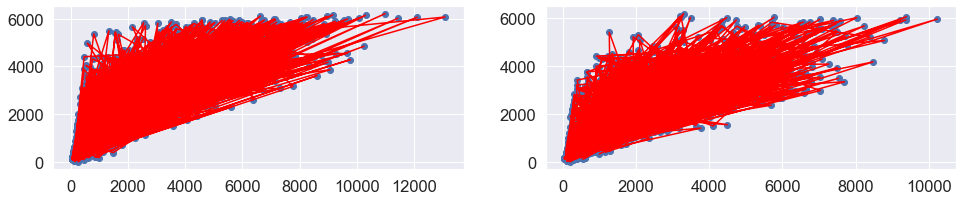

In [177]:
#e=PPM.regressionModelfit_CV(XGBReg_estimator,polyDF[ntrain:].columns, polyDF[:ntrain], ytrain,'xgb',2)
plt.figure(figsize=(25,3))
fig = plt.subplot(131)
plt.scatter(yytrain, ptrain)
plt.plot(yytrain, ptrain,color='red')
fig = plt.subplot(132)
plt.scatter(yyVali, pVali)
plt.plot(yyVali, pVali,color='red')


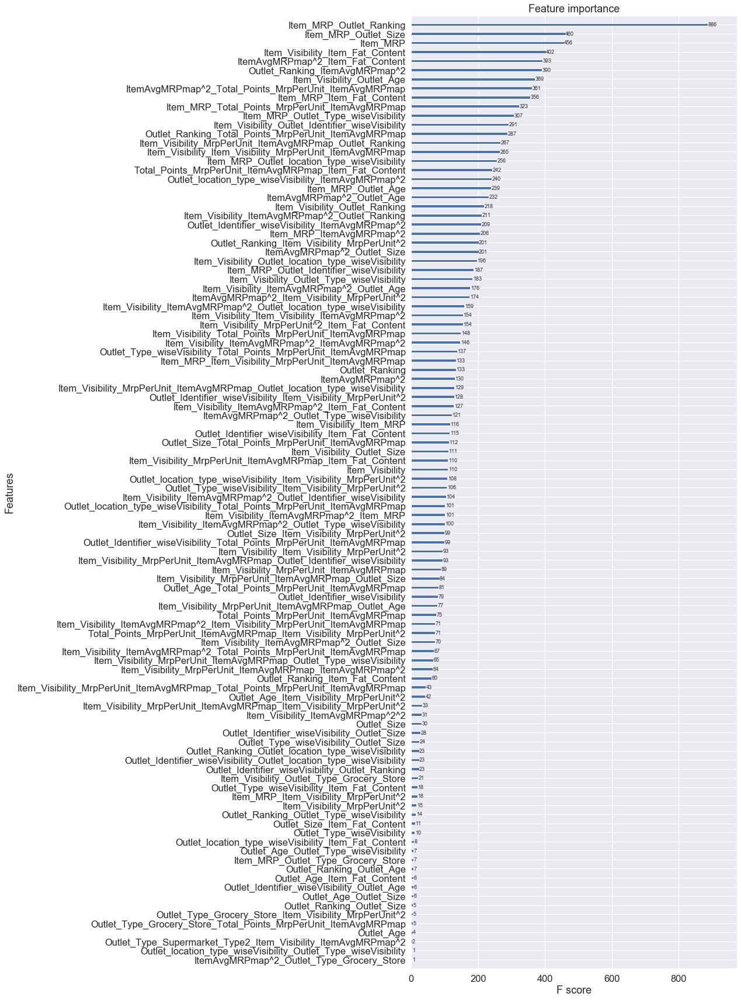

In [178]:
fig, ax = plt.subplots(1,1,figsize=(10,30))
# plot_importance(booster=booster, ax=ax, **kwargs)
g = plot_importance(XGBReg_estimator,ax=ax, height=.3)
#ax3.yticks(fontsize=12)

In [179]:
def featureImportance_BAR(_imp_features,_df1,show=1):
    _df=pd.DataFrame({'rank_value':imp_feature,'feature_name':_df1.columns},index=_df1.columns).sort_values('rank_value',ascending=False)
    _df=_df[_df['rank_value']>0.0001]
    if show==1:
        fig=plt.figure(figsize=(20,15))
        _df.plot.bar(figsize=(18,3),fontsize=12,color='red')
    print('Total Columns=',len(_df1))
    print('Number_of_good_columns=',len(_df))
    #print(_df['feature_name'])
    return _df

xbg_feat_importDF=featureImportance_BAR(imp_feature,xxtrain,0)

xgbm_best_col=list(xbg_feat_importDF[:70].feature_name.index)

XGBReg_estimator1 = xgb.XGBRegressor(**param_grid2,random_state=25)
XGBReg_estimator1.fit(xxtrain[xgbm_best_col], yytrain)
#rf2.fit(polyDF[:ntrain][goodcols], ytrain)
ptrain=XGBReg_estimator1.predict(xxtrain[xgbm_best_col])
pVali=XGBReg_estimator1.predict(xxVali[xgbm_best_col])
Train_rmse=np.sqrt(np.mean((ptrain - yytrain)*(ptrain - yytrain)))
Test_rmse=np.sqrt(np.mean((pVali - yyVali)*(pVali - yyVali)))
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
Train_r2_sqV=r2_score(yytrain, ptrain)
test_r2_sqV=r2_score(yyVali, pVali)
print("\ntrain R2:",Train_r2_sqV,"\nTest R2:",test_r2_sqV)
print("\ntrain rmse:",Train_rmse,"\nTest Rmse:",Test_rmse)

Total Columns= 5966
Number_of_good_columns= 102

train R2: 0.6705254439516668 
Test R2: 0.5941564623831614

train rmse: 994.8723325005919 
Test Rmse: 1044.1957924086512


# ADA boost (introduced in 1995 by Freund and Schapire)
One thing that can be confusing is the difference between xgboost, lightGBM and Gradient Boosting Decision Trees (which we will henceforth refer to as GBDTs). Xgboost and lightGBM are both subtypes/specific instances of the GBDT algorithm

There are many boosting technique

1. GentleBoost

2. Gradient Boosting (Always my first choice for any Kaggle problem) (scikit GBDT differenct from xgbm)

3.  LPBoost

4. BrownBoost

5. Adaboost

It used one of ensemble method used for binary classification rather than regression.

It uses very short week learner called stump.

It also converts a set of weak classifiers into a strong classifier.

Unlike GBM( little more tree depth), the week learners have high bias and low variance.

It initializes default weight to each observation in the first iteration and makes the prediction and provide higher weight to incorrect predictions and pass on the next

The most essential difference between Boosting and bagging is that Boosting does not treat the basic model consistently. Instead, he tries to select the "elite" through constant testing and screening, and then gives the elite more voting rights. The poorly performing basic model gives Less voting rights, then combined with everyone's vote to get the final result


Following ideas combined together to invent adaptive boosting
1.	Types of Decision tree used in ADABOOST ensemble technique are stump types that means they have only one node and two leaves.
Stumps are also called weak learner.
2.	Variable for stump node is chosen by compare the weight gini score or entropy score of all the variables of dataset.
3.	Each stump are trained sequentially over weighted prediction of previous tree where higher weight is provided to incorrect predictions.
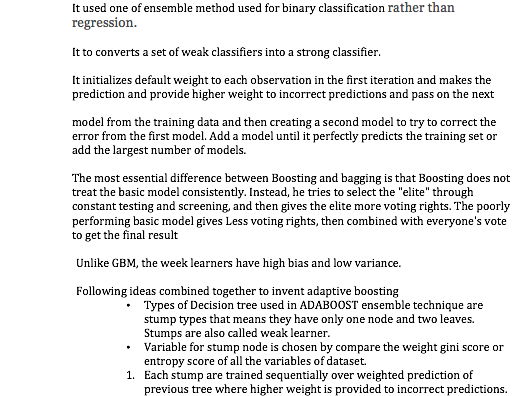

#### Tuning parameter
The number of weak learners is controlled by the parameter n_estimators. 

The learning_rate parameter controls the contribution of the weak learners in the final combination.

By default, weak learners are decision stumps. Different weak learners can be specified through the base_estimator parameter. The main parameters to tune to obtain good results are n_estimators and the complexity of the base estimators (e.g., its depth max_depth or minimum required number of samples to consider a split min_samples_split).

##### Controlling the tree size¶

If you specify max_depth=h then complete binary trees of depth h will be grown. Such trees will have (at most) 2**h leaf nodes and 2**h - 1 split nodes.

Alternatively, you can control the tree size by specifying the number of leaf nodes via the parameter max_leaf_nodes. In this case, trees will be grown using best-first search where nodes with the highest improvement in impurity will be expanded first. A tree with max_leaf_nodes=k has k - 1 split nodes and thus can model interactions of up to order max_leaf_nodes - 1 .

We found that max_leaf_nodes=k gives comparable results to max_depth=k-1 but is significantly faster to train at the expense of a slightly higher training error. The parameter max_leaf_nodes corresponds to the variable J in the chapter on gradient boosting in [F2001] and is related to the parameter interaction.depth in R’s gbm package where max_leaf_nodes == interaction.depth + 1



In [702]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
dic1={'min_samples_split': 45, 'min_samples_leaf': 10, 
       'max_leaf_nodes': 45, 'max_features': 'sqrt',
       'max_depth': 10, 'criterion': 'mse'}
ada={'base_estimator': DecisionTreeRegressor(**dic1), #(default=None)
      'n_estimators': 300, #(default=50)
      'learning_rate': 0.0006, #(default=1.)
      'loss': 'exponential',#},'linear',#'square', #
       'random_state':45}
AdaRegr=AdaBoostRegressor(**ada)
AdaRegr.fit(xxtrain, yytrain)
ptrain=AdaRegr.predict(xxtrain)
pVali=AdaRegr.predict(xxVali)
Train_rmse=np.sqrt(np.mean((ptrain - yytrain)*(ptrain - yytrain)))
Test_rmse=np.sqrt(np.mean((pVali - yyVali)*(pVali - yyVali)))
Train_r2_sqV=r2_score(yytrain, ptrain)
test_r2_sqV=r2_score(yyVali, pVali)
print("\ntrain R2:",Train_r2_sqV,"\nTest R2:",test_r2_sqV)
print("\ntrain rmse:",Train_rmse,"\nTest Rmse:",Test_rmse)
adaPred=generate_submission_file('n2.csv',AdaRegr,test_org,polyDF[ntrain:])




train R2: 0.6467053527834344 
Test R2: 0.6063486720944483

train rmse: 1030.2080550916135 
Test Rmse: 1028.3915080836073


In [363]:
# dic1={'min_samples_split': 45, 'min_samples_leaf': 10, 
#        'max_leaf_nodes': 45, 'max_features': 'sqrt',
#        'max_depth': 10, 'criterion': 'mse'}
# dtr= DecisionTreeRegressor(**dic1)

# Random_forest_random_grid = {
#                'n_estimators':[1000],
#                'learning_rate':  np.linspace(0.0000007,0.0006,20),
#                 'loss': ['exponential'],#'loss' : ['linear', 'square', 'exponential'],
#                 'random_state':[45]
#                 }
# rf1= RandomForestRegressor(random_state=46,**dic1)

# regr_2 = AdaBoostRegressor(dtr,
#                            random_state=10)

# regr_ada = RandomizedSearchCV(estimator = regr_2, param_distributions = Random_forest_random_grid, n_iter = 100, cv = 2,
#                                verbose=2, random_state=42, n_jobs = -1,scoring='neg_mean_squared_error')
# regr_ada.fit(xxtrain, yytrain)
# regr_ada_Bestmodel=regr_ada.best_estimator_
# ptrain=regr_ada_Bestmodel.predict(xxtrain)
# pVali=regr_ada_Bestmodel.predict(xxVali)
# Train_rmse=np.sqrt(np.mean((ptrain - yytrain)*(ptrain - yytrain)))
# Test_rmse=np.sqrt(np.mean((pVali - yyVali)*(pVali - yyVali)))
# Train_r2_sqV=r2_score(yytrain, ptrain)
# test_r2_sqV=r2_score(yyVali, pVali)
# print("\ntrain R2:",Train_r2_sqV,"\nTest R2:",test_r2_sqV)
# print("\ntrain rmse:",Train_rmse,"\nTest Rmse:",Test_rmse)
# xgbPred=generate_submission_file('n2.csv',regr_ada_Bestmodel,test_org,polyDF[ntrain:])

# light XGBM or Histogram based Gradient Boosting Regressor

XGBoost-XGBM/Light GBM are two open source implementation of the GBDT concept(scikit-learn has another version of GBDT algorithm, but XGBoost is faster and many other technical advantages.)

Although many engineering optimizations have been adopted Light GBM, the efficiency and scalability are still unsatisfactory when the feature dimension is high and data size is large.

Light GBM is different from Xgbm in terms of the way the tree grows.

XGBM employs level wise tree split strategy while light GBM employs leaf wise split strategy.


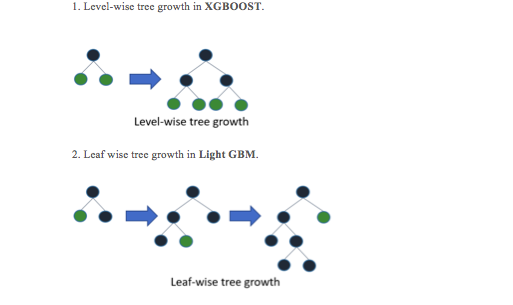
  
The level-wise strategy maintains a balanced tree, whereas the leaf-wise strategy splits the leaf that reduces the loss the most.

While other algorithms grow trees horizontally, Light GBM grows tree vertically meaning that Light GBM grows tree leaf-wise while other algorithms grow level-wise. It, in order to grow, will choose the leaf that has a max delta loss. When growing the same leaf, Leaf-wise algorithm can reduce more loss when compared to a level-wise algorithm.

Leaf wise splits lead to increase in complexity and may lead to overfitting and it can be overcome by specifying another parameter max-depth which specifies the depth to which splitting will occur while Level-wise training can be seen as a form of regularized training and do not overfit easily and considered reliable even with huge dataset.

Light GBM uses histogram-based algorithms while XGBM use pre-sort-based algorithms (easy but tough to optimize)!

light GBM tree has more depth as compared with XGBM when the number of leaves are same.

While if we set the max_Depth same for both algorithms, it will result in vastly different tree structure and complexity for both alogrithm



- https://lightgbm.readthedocs.io/en/latest/

##### why Light is faster  as employ histogram approach to evaluate and select best split.
    The amount of time it takes to build a tree is proportional to the number of splits that have to be evaluated. Often, small changes in the split don't make much of a difference in the performance of the tree. Histogram-based methods take advantage of this fact by grouping features into a set of bins and perform splitting on the bins instead of the features. This is equivalent to subsampling the number of splits that the model evaluates. Since the features can be binned before building each tree, this method can greatly speed up training, reducing the computational complexity


##### Tree balacing/ Accuracy / histogram binning
    Though conceptually simple, histogram-based methods present several choices that the user has to make. Firstly the number of bins creates a trade-off between speed and accuracy: the more bins there are, the more accurate the algorithm is, but the slower it is as well. Secondly, how to divide the features into discrete bins is a non-trivial problem: dividing the bins into equal intervals (the most simple method) can often result in an unbalanced allocation of data. Though the details are beyond the scope of this post, the "most balanced" method of dividing the bins actually depends on the gradient statistics. Xgboost offers the option tree_method=approx, which computes a new set of bins at each split using the gradient statistics. LightGBM and xgboost with the tree_method set to hist will both compute the bins at the beginning of training and reuse the same bins throughout the entire training process.

##### Ignoring sparse inputs (xgboost and lightGBM) and handling missing value
    Xgboost and lightGBM tend to be used on tabular data or text data that has been vectorized. Therefore, the inputs to xgboost and lightGBM tend to be sparse. Since the vast majority of the values will be 0, having to look through all the values of a sparse feature is wasteful. Xgboost proposes to ignore the 0 features when computing the split, then allocating all the data with missing values to whichever side of the split reduces the loss more. This reduces the number of samples that have to be used when evaluating each split, speeding up the training process.

    Though lightGBM does not enable ignoring zero values by default, it has an option called zero_as_missing which, if set to True, will regard all zero values as missing while in xgboost, we need to set parameter 'use_missing' to True 

##### Subsampling the data: Gradient-based One-Side Sampling (lightGBM)
    This is a method that is employed exclusively in lightGBM. The essential observation behind this method is that not all data points contribute equally to training; data points with small gradients tend to be more well trained (close to a local minima). This means that it is more efficient to concentrate on data points with larger gradients.

    The most straightforward way to use this observation is to simply ignore data points with small gradients when computing the best split. However, this has the risk of leading to biased sampling, changing the distribution of data. For instance, if data that belonged to the "young" age group tended to be less well trained, the sampled data will have a much younger age distribution. This means that the split is likely to be younger than the optimal value.

    In order to mitigate this problem, lightGBM also randomly samples from data with small gradients. This results in a sample that is still biased towards data with large gradients, so lightGBM increases the weight of the samples with small gradients when computing their contribution to the change in loss (this is a form of importance sampling, a technique for efficient sampling from an arbitrary distribution).

#### Advantages of Light GBM
1.	Faster training speed and higher efficiency: Light GBM use histogram based algorithm i.e it buckets continuous feature values into discrete bins which fasten the training procedure.
2.	Lower memory usage: Replaces continuous values to discrete bins which result in lower memory usage.
3.	Better accuracy than any other boosting algorithm: It produces much more complex trees by following leaf wise split approach rather than a level-wise approach which is the main factor in achieving higher accuracy. However, it can sometimes lead to overfitting which can be avoided by setting the max_depth parameter.
4.	Compatibility with Large Datasets: It is capable of performing equally good with large datasets with a significant reduction in training time as compared to XGBOOST.
5.	Parallel learning supported.


#### Important Parameters of light GBM
1. task : default value = train ; options = train , prediction ; Specifies the task we wish to perform which is either train or prediction.
2. application: default=regression, type=enum, options= options :
    o	regression : perform regression task
    o	binary : Binary classification
    o	multiclass: Multiclass Classification
    o	lambdarank : lambdarank application
3.	data: type=string; training data , LightGBM will train from this data
4.	num_iterations: number of boosting iterations to be performed ; default=100; type=int
5.	num_leaves : number of leaves in one tree ; default = 31 ; type =int
6.	device : default= cpu ; options = gpu,cpu. Device on which we want to train our model. Choose GPU for faster training.
7.	max_depth: Specify the max depth to which tree will grow. This parameter is used to deal with overfitting.
8.	min_data_in_leaf: Min number of data in one leaf.
9.	feature_fraction: default=1 ; specifies the fraction of features to be taken for each iteration
10.	bagging_fraction: default=1 ; specifies the fraction of data to be used for each iteration and is generally used to speed up the training and avoid overfitting.
11.	min_gain_to_split: default=.1 ; min gain to perform splitting
12.	max_bin : max number of bins to bucket the feature values.
13.	min_data_in_bin : min number of data in one bin
14.	num_threads: default=OpenMP_default, type=int ;Number of threads for Light GBM.
15.	label : type=string ; specify the label column
16.	categorical_feature : type=string ; specify the categorical features we want to use for training our model
17.	num_class: default=1 ; type=int ; used only for multi-class classification

# Implementation/Tuning of Light GBM 
GBM implementation is quite easy, the only thing that turns out to be complicated is parameter tuning. Light GBM covers more than 100 parameters and It is very important for an implementer to know at least some basic parameters of Light GBM.


#### leaf-wise tree, these are some important parameters:

    num_leaves. This is the main parameter to control the complexity of the tree model. Theoretically, we can set num_leaves = 2^(max_depth) to obtain the same number of leaves as depth-wise tree. However, this simple conversion is not good in practice. The reason is that a leaf-wise tree is typically much deeper than a depth-wise tree for a fixed number of leaves. Unconstrained depth can induce over-fitting. Thus, when trying to tune the num_leaves, we should let it be smaller than 2^(max_depth). For example, when the max_depth=7 the depth-wise tree can get good accuracy, but setting num_leaves to 127 may cause over-fitting, and setting it to 70 or 80 may get better accuracy than depth-wise.

    min_data_in_leaf. This is a very important parameter to prevent over-fitting in a leaf-wise tree. Its optimal value depends on the number of training samples and num_leaves. Setting it to a large value can avoid growing too deep a tree, but may cause under-fitting. In practice, setting it to hundreds or thousands is enough for a large dataset.

    max_depth. You also can use max_depth to limit the tree depth explicitly.

#### For Faster Speed
    Use bagging by setting bagging_fraction and bagging_freq

    Use feature sub-sampling by setting feature_fraction

    Use small max_bin

    Use save_binary to speed up data loading in future learning

    Use parallel learning, refer to Parallel Learning Guide

#### For Better Accuracy
    Use large max_bin (may be slower)

    Use small learning_rate with large num_iterations

    Use large num_leaves (may cause over-fitting)

    Use bigger training data

    Try dart

#### Deal with Over-fitting
    Use small max_bin

    Use small num_leaves

    Use min_data_in_leaf and min_sum_hessian_in_leaf

    Use bagging by set bagging_fraction and bagging_freq

    Use feature sub-sampling by set feature_fraction

    Use bigger training data

    Try lambda_l1, lambda_l2 and min_gain_to_split for regularization

    Try max_depth to avoid growing deep tree

Try extra_trees

In the LightGBM model, there are two was of feature importance
   - 'split', result contains numbers of times the feature is used in a model, 
   - 'gain', result contains total gains of splits which uses the feature.

On the XGBoost model the importance is calculated by:

- 'weight': the number of times a feature is used to split the data across all trees.
- 'gain': the average gain across all splits the feature is used in.
- 'cover': the average coverage across all splits the feature is used in.
- 'total_gain': the total gain across all splits the feature is used in.
- 'total_cover': the total coverage across all splits the feature is used in.

First measure is split-based and is very similar with the one given by for Gini Importance. But it doesn't take the number of samples into account.

The second measure is gain-based. It's basically the same as the Gini Importance implemented in R packages and in scikit-learn with Gini impurity replaced by the objective used by the gradient boosting model.

The cover, implemented exclusively in XGBoost, is counting the number of samples affected by the splits based on a feature.

- get_score(fmap='', importance_type='weight'): Get feature importance of each feature. 



In [374]:
from lightgbm import LGBMRegressor
# Save the move 
#   bst.save_model('model.txt')
# read the model back
#   bst = lgb.Booster(model_file='model.txt')  # init model
#lgb.cv(param, train_data, num_round, nfold=5)
#bst.best_iteration:

In [517]:
param_LGBM = {
  #num_leaves=10 # This is the main parameter to control the complexity of the tree model. Theoretically, we can set
            #num_leaves = 2^(max_depth) to obtain the same number of leaves as depth-wise tree. 
            #However, this simple conversion is not good in practice. The reason is that a leaf-wise tree 
        #is typically much deeper than a depth-wise tree for a fixed number of leaves.
    # Unconstrained depth can induce over-fitting. Thus, when trying to tune the num_leaves, 
    #we should let it be smaller than 2^(max_depth). For example, when the max_depth=7 the depth-wise tree 
    #can get good accuracy, but setting num_leaves to 127 may cause over-fitting, and setting it to 70 or 80
    #may get better accuracy than depth-wise. 
    
#min_data_in_leaf = #. This is a very important parameter to prevent 
    #over-fitting in a leaf-wise tree. Its optimal value depends on the number of training samples and num_leaves.
    #Setting it to a large value can avoid growing too deep a tree, but may cause under-fitting. 
    #In practice, setting it to hundreds or thousands is enough for a large dataset.
#'max_depth':10,
#'num_leaves':10
# For Faster Speed-----------------
#   Use bagging by setting 
  #  bagging_fraction= 
  #  bagging_freq=

# Use feature sub-sampling by setting 
   # feature_fraction=

#Use small 
    #max_bin=

#  to speed up data loading in future learning
    #save_binary=

#Use parallel learning, refer to Parallel Learning Guide

# For Better Accuracy ------------------
#Use large (may be slower)
    #max_bin =

# Use small learning_rate with large num_iterations
#learning_rate=
#num_iterations=

# Use large num_leaves (may cause over-fitting)
#num_leaves=
#Use bigger training data

# Try dart

# Deal with Over-fitting ----------------
#Use small max_bin

#Use small num_leaves

#Use min_data_in_leaf and min_sum_hessian_in_leaf

#Use bagging by set bagging_fraction and bagging_freq

#Use feature sub-sampling by set feature_fraction

#Use bigger training data

#Try lambda_l1, lambda_l2 and min_gain_to_split for regularization

#Try max_depth to avoid growing deep tree

#Try extra_trees
#'boosting_type':'dart',Default='gbdt'
'max_depth':[3,5,10,20],
'num_leaves':[4,5,10,20],
'min_data_in_leaf':[20,50,150,300],
'n_estimators':[550],# (int, optional (default=100))
'learning_rate':[0.04,0.5,0.1,0.2]# (default=0.1))
#    'cv':5
}
LGBM_Reg_estimator =  LGBMRegressor(**param_LGBM,random_state=25)
#print(LGBM_Reg_estimator)
regr_lgbm = RandomizedSearchCV(estimator = LGBM_Reg_estimator, param_distributions = param_LGBM, n_iter = 100, cv = 2,
                                verbose=2, random_state=42, n_jobs = -1,scoring='neg_mean_squared_error')

regr_lgbm.fit(xxtrain, yytrain)
#LGBM_Reg_estimator.fit(polyDF[:ntrain][goodcols], ytrain)
LGBM_Reg_estimator=regr_lgbm.best_estimator_
ptrain=LGBM_Reg_estimator.predict(xxtrain)
pVali=LGBM_Reg_estimator.predict(xxVali)
Train_rmse=np.sqrt(np.mean((ptrain - yytrain)*(ptrain - yytrain)))
Test_rmse=np.sqrt(np.mean((pVali - yyVali)*(pVali - yyVali)))
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
Train_r2_sqV=r2_score(yytrain, ptrain)
test_r2_sqV=r2_score(yyVali, pVali)
print("\ntrain R2:",Train_r2_sqV,"\nTest R2:",test_r2_sqV)
print("\ntrain rmse:",Train_rmse,"\nTest Rmse:",Test_rmse)
LxgbPredx=generate_submission_file('n2.csv',LGBM_Reg_estimator,test_org,polyDF[ntrain:])



Fitting 2 folds for each of 100 candidates, totalling 200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   52.2s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:  4.9min finished



train R2: 0.6390167192915805 
Test R2: 0.6017718695429162

train rmse: 1041.3577568103356 
Test Rmse: 1034.352548621275
Output contain Negative records: 1


In [886]:
best_lgb={
 'learning_rate': 0.01,
 'n_estimators': 550,
 'max_depth': 12,
 'num_leaves': 20,
 'min_data_in_leaf': 15,
'feature_fraction':0.9,
'min_sum_hessian_in_leaf':90,
'lambda_l2':26,
'lambda_l1':.0005,
'boosting_type':'gbdt',
'subsample_for_bin':6800,
'min_gain_to_split':22000
 #'max_bin':2000
 #'bagging_fraction':.9
}
regr_lgbm1 =  LGBMRegressor(**best_lgb,random_state=25)
regr_lgbm1.fit(xxtrain, yytrain)
ptrain=regr_lgbm1.predict(xxtrain)
pVali=regr_lgbm1.predict(xxVali)
Train_rmse=np.sqrt(np.mean((ptrain - yytrain)*(ptrain - yytrain)))
Test_rmse=np.sqrt(np.mean((pVali - yyVali)*(pVali - yyVali)))
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
Train_r2_sqV=r2_score(yytrain, ptrain)
test_r2_sqV=r2_score(yyVali, pVali)
print("\ntrain R2:",Train_r2_sqV,"\nTest R2:",test_r2_sqV)
print("\ntrain rmse:",Train_rmse,"\nTest Rmse:",Test_rmse)
LxgbPred=generate_submission_file('n2.csv',regr_lgbm1,test_org,polyDF[ntrain:])



train R2: 0.6784330085115697 
Test R2: 0.5987517912538274

train rmse: 982.861093249218 
Test Rmse: 1038.2672964503145


# Random forest boosting with ADAboost
    Random forest reduces variance
    boosting reducess bias
    always week random forest learner

In [872]:
dic1={'criterion': 'mse',
     'max_depth': 5,
      'min_samples_leaf': 5,
      #'min_samples_split': 3, 
      # 'max_leaf_nodes': 46, 
      #'max_features': 'log2', 
      'n_estimators': 45,
       #     'learning_rate': 0.0006, #(default=1.)
      #'loss': 'exponential',#},'linear',#'square', #
     }
rf1= RandomForestRegressor(random_state=46,**dic1)
regr_Ada_withRF = AdaBoostRegressor(rf1,random_state=10,n_estimators=55,learning_rate=0.0003)
regr_Ada_withRF.fit(xxtrain, yytrain)
ptrain=regr_Ada_withRF.predict(xxtrain)
pVali=regr_Ada_withRF.predict(xxVali)
Train_rmse=np.sqrt(np.mean((ptrain - yytrain)*(ptrain - yytrain)))
Test_rmse=np.sqrt(np.mean((pVali - yyVali)*(pVali - yyVali)))
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
Train_r2_sqV=r2_score(yytrain, ptrain)
test_r2_sqV=r2_score(yyVali, pVali)
print("\ntrain R2:",Train_r2_sqV,"\nTest R2:",test_r2_sqV)
print("\ntrain rmse:",Train_rmse,"\nTest Rmse:",Test_rmse)
regr_Ada_withRFPred=generate_submission_file('n2.csv',regr_Ada_withRF,test_org,polyDF[ntrain:])



train R2: 0.6291239718219601 
Test R2: 0.6073440039228879

train rmse: 1055.5305175953931 
Test Rmse: 1027.0905615682573


In [ ]:
# dic1={'n_estimators': 70, 'min_samples_split': 3, 
#       'min_samples_leaf': 6, 'max_leaf_nodes': 76, 
#       'max_features': 'log2', 'max_depth': 7, 
#       'criterion': 'mse'}
# Random_forest_random_grid = {
#                'learning_rate': np.linspace(0.00000007,1.5,100),
#                 'loss' : ['exponential']#['linear', 'square', ,
#                 'n_estimators': [i for i in range(10,200,50)],
#                 }
# rf1= RandomForestRegressor(random_state=46,**dic1)

# regr_2 = AdaBoostRegressor(rf,
#                            random_state=10)

# regr_2_random = RandomizedSearchCV(estimator = regr_2, param_distributions = Random_forest_random_grid, n_iter = 20, cv = 6,
#                                verbose=2, random_state=42, n_jobs = -1,scoring='neg_mean_squared_error')
# #model_type_wise_hyperParams_grid_dict['random_forest_regressor']=Random_forest_random_grid
# regr_2_random.fit(xtrain,ytrain)
# print(regr_2_random.best_params_)
# print("Best: %f using %s" % (np.sqrt(-1*regr_2_random.best_score_), regr_2_random.best_params_))
# print(regr_2_random.best_estimator_)
# #regressionModelfit_CV(regr_2_random.best_estimator_,xtrain.columns, xtrain, ytrain,'modelname',6)


In [904]:
avg_Pred=pd.DataFrame({
                      # "bagged":baggPred,
                       "DT":dtPred,
                      # "RF":rfPred,
                       "XGB":xgbPred,
                       "ADA":adaPred,
                       "LXGB":LxgbPred,
                        #"Ada_withRF":regr_Ada_withRFPred
                      }).mean(1)
def generate_submission_file_avg(submission_csv_name,org_test,yAvgPred):
#Export submission file:
    org_test['Item_Outlet_Sales']=yAvgPred
    submission=org_test[['Item_Identifier','Outlet_Identifier','Item_Outlet_Sales']]
    submission.to_csv(submission_csv_name, index=False)
    return yAvgPred
e=generate_submission_file_avg('n1.csv',test_org,avg_Pred)

In [ ]:
paramDTStack={     "criterion": "mse",
              "min_samples_split": 10,#[i for i in range(3,500,10)],
              "max_depth": 6,# [i for i in range(2,,3)],
              #"min_samples_leaf": 4 ,#[i for i in range(1,500,20)],
              #"max_leaf_nodes": 30,#[i for i in range(2,100,20)],
              "max_features":'auto'# ['auto', 'sqrt', 'log2'],
              }

from mlxtend.regressor import StackingRegressor ,StackingCVRegressor
#from sklearn.ensemble import StackingRegressor
estimators = [     ('dt', dt_DefaultModel)#,
#                    ('baggDT', BgingRegr),
#                    ('rf',rf),
#                    ('XGBReg',XGBReg_estimator),
#                    ('AdaRegr',AdaRegr),
#                    ('LGBM',regr_lgbm1),
#                    ('Ada_withRFPred',regr_Ada_withRF),
             ]
#estimators
regStack = StackingRegressor(
      regressors=(XGBReg_estimator,AdaRegr,regr_lgbm1,regr_Ada_withRF),
      meta_regressor=DecisionTreeRegressor(**paramDTStack)
    #RandomForestRegressor(n_estimators=10,random_state=42)
     )
regStack.fit(xxtrain, yytrain)
ptrain=regStack.predict(xxtrain)
pVali=regStack.predict(xxVali)
Train_rmse=np.sqrt(np.mean((ptrain - yytrain)*(ptrain - yytrain)))
Test_rmse=np.sqrt(np.mean((pVali - yyVali)*(pVali - yyVali)))
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
Train_r2_sqV=r2_score(yytrain, ptrain)
test_r2_sqV=r2_score(yyVali, pVali)
print("\ntrain R2:",Train_r2_sqV,"\nTest R2:",test_r2_sqV)
print("\ntrain rmse:",Train_rmse,"\nTest Rmse:",Test_rmse)
regStack_Pred=generate_submission_file('n2.csv',regStack,test_org,polyDF[ntrain:])


In [920]:
3

3

# Ridge - Regularizer
##### (L2->penalise the model by multiple coeffcient with sum of square Error )
##### reduces the model complexity by reducing the impact of useless features
1. alpha{float, ndarray of shape (n_targets,)}, default=1.0
        - Regularization strength; must be a positive float. Regularization improves the conditioning of the problem and reduces the variance of the estimates. Larger values specify stronger regularization. Alpha corresponds to C^-1 in other linear models such as LogisticRegression or LinearSVC. If an array is passed, penalties are assumed to be specific to the targets. Hence they must correspond in number.
        
2. max_iter-int, default=None
        - Maximum number of iterations for conjugate gradient solver. For ‘sparse_cg’ and ‘lsqr’ solvers, the default value is determined by scipy.sparse.linalg. For ‘sag’ solver, the default value is 1000.
       
3. tol{float}, default=1e-3
        - Precision of the solution
        
4. random_stateint, RandomState instance, default=None      
 

In [916]:
1e-3

0.001

In [917]:
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error

RigScores=[]
def myRighe(alphas):
    from sklearn.linear_model import Ridge
    from sklearn.preprocessing import QuantileTransformer, quantile_transform
    from sklearn.compose import TransformedTargetRegressor
    Ridge_m=Ridge()
    #alphas = np.logspace(-4, -0.5, 30)
    #alphas =np.linspace(100,4000,10)
    
    from sklearn.preprocessing import MinMaxScaler
    tuned_parameters = {'alpha': [alphas], #[9]
                         'tol': [100000000000,10000,10,.1,.0001,.000001,0.000000001],# np.linspace(0.005,3,30),#[2]
                         'max_iter' : [100,500,10000000],
                        'normalize':[False,True]}
    scaler = MinMaxScaler()
    scaler.fit(xtrain)  # Don't cheat - fit only on training data
    
    
        
    
    _xtraningData1 = pd.DataFrame(scaler.transform(xtrain),columns=xtrain.columns)
    Rig_esti = RandomizedSearchCV(Ridge_m, tuned_parameters, verbose=0,cv=6, n_iter=10000,refit=False,scoring = 'neg_mean_squared_error')
    Rig_esti.fit(_xtraningData1,ytrain)
    Rig_best_model = Ridge(**Rig_esti.best_params_)
    Rig_esti.fit(_xtraningData1,ytrain)
    
    wrapped_model = TransformedTargetRegressor(regressor=Rig_best_model, 
                                                transformer=QuantileTransformer(n_quantiles=300,
                                                 output_distribution='normal'))

    
    e2=PPM.regressionModelfit_CV( wrapped_model,xtrain.columns, _xtraningData1, ytrain,'Ridge',6)
    #lso_esti.predict
    return wrapped_model

alphas=[250]#[i for i in range(70,1000,20)]
for alpha in alphas:
    print("---------------------------__")
    print("\t Alpha: \t",alpha)
    __model=myRighe(alpha)
    
    #__model=score[1]
    #score=score[0]
    #print(__model)
    #print(alpha,score)
    generate_submission_file('n.csv',__model,test_org,xtest)
    #RigScores.append(score)

---------------------------__
	 Alpha: 	 250


KeyboardInterrupt: 

# Tuning Lasso (Least Absolute Shrinkage and Selection Operator)
In general, we decrease the model complexity by reducing number of predictors via forward or backward selection. for this, but that way we would not be able to tell anything about the removed variables' effect on the response.

    Per Ridge concept, Removing predictors from the model can be seen as settings their coefficients to zero. Instead of forcing them to be exactly zero, it perform L2 regularization or penalization (their of squared coefficients) on them if they are too far from zero, thus enforcing them to be small in a continuous way. This way, we decrease model complexity while keeping all variables in the model. This, basically, is what Ridge Regression does.
But now a days, instead of Ridhge , [Lasso](http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Lasso.html is widely used.

    Prior to lasso, the most widely used method for choosing which covariates to include was stepwise selection, which only improves prediction accuracy in certain cases, such as when only a few covariates have a strong relationship with the outcome. However, in other cases, it can make prediction error worse. Also, at the time, ridge regression was the most popular technique for improving prediction accuracy. Ridge regression improves prediction error by shrinking large regression coefficients in order to reduce overfitting, but it does not perform covariate selection and therefore does not help to make the model more interpretable.

    Per Lasso concept, in order to improve the prediction accuracy and interpretability of regression models by L1 regularizer or penalizer and altering the model fitting process to select only a subset of the provided covariates for use in the final model rather than using all of them.

    Lasso is able to achieve both of these goals by forcing the sum of the absolute value of the regression coefficients to be less than a fixed value, which depending on the regularization strength, certain weights can become zero, which makes the Lasso also useful as a supervised feature selection technique, by effectively choosing a simpler model that does not include those coefficients. However, a limitation of the Lasso is that it selects at most n variables if m > n.

    This idea is similar to ridge regression, in which the sum of the squares of the coefficients is forced to be less than a fixed value, though in the case of ridge regression, this only shrinks the size of the coefficients, it does not set any of them to zero.

    The optimization objective for Lasso is: (1 / (2 * n_samples)) * ||y - Xw||^2_2 + alpha * ||w||_1

    Technically the Lasso model is optimizing the same objective function as the Elastic Net with l1_ratio=1.0, no L2 penalty.

This characteristics turn Lasso a interesting alternative approach that can lead to sparse models.

From sklearn.LASSO its most important parameters are:

1. alpha: Constant that multiplies the L1 term. Defaults to 1.0. alpha = 0 is equivalent to an ordinary least square, solved by the LinearRegression object. For numerical reasons, using alpha = 0 with the Lasso object is not advised. Given this, you should use the LinearRegression object.

2. max_iter: The maximum number of iterations

3. selection: If set to 'random', a random coefficient is updated every iteration rather than looping over features sequentially by default. This (setting to 'random') often leads to significantly faster convergence especially when tol is higher than 1e-4.

4. tol: The tolerance for the optimization: if the updates are smaller than tol, the optimization code checks the dual gap for optimality and continues until it is smaller than tol.

   So, I run many times my model, with different parameters, selection features, reduction or not and with and without log1P transformation of Sales Price. Below I preserve the code with the best options and with few possibilities for you can see the grid search cv in action, but I encourage you to make changes and see for yourself.

In [ ]:
def myLasso(alphas):
    lasso = Lasso(random_state=25)
    #alphas = np.logspace(-4, -0.5, 30)
    #alphas =np.linspace(100,4000,10)
    tuned_parameters = {'alpha': [alphas], #[9]
                         'tol': np.linspace(0.005,3,30),#[2]
                         'max_iter' : [100,50],
                         'positive':[True]#,False]
                        }
    #xtrainVal=xtrain
    
    #ytrain
    lso_esti = RandomizedSearchCV(lasso, tuned_parameters, verbose=0,cv=6, n_iter=150,refit=False,scoring = 'neg_mean_squared_error')
    lso_esti.fit(xtrain,ytrain)
    lasso = Lasso(**lso_esti.best_params_)
    e2=PPM.regressionModelfit_CV(lasso,xtrain.columns, xtrain, ytrain,'xgb',6)
    #lso_esti.predict
    return np.sqrt(lso_esti.best_score_*-1),lasso

#lasso = Lasso(**lso_esti.best_params_)
alphas = np.logspace(-1, 2, 30) #[i for i in range(0,3000,100)]#
alphas=[0.0005,0.05,0.12,0.3,0.5,0.55,0.8,1.2,1.6,2.5,3.6,7.6,12.8,20.6,30.6,40.6,45.7,60.6]
alphas=[0.0005,0.05,0.12,0.3,0.5,0.55,0.8,1.2,1.6,2.5,3.6,7.6,12.8,20.6,30.6,40.6,45.7,60.6]
alphas = np.linspace(17, 200, 5) #[i for i in range(0,3000,100)]#
lso_esti=[1,5,10,50,200]
#Model=Model
scores = []
for alpha in alphas:
    score=myLasso(alpha)
    
    model_lso=score[1]
    score=score[0]
    print(alpha,score)
    generate_submission_file('n.csv',model_lso,test_org,xtest)
    scores.append(score)


In [ ]:
LSO_best_param=model_lso.get_params()
#lasso_model = Lasso(**LSO_best_param)

In [ ]:
from sklearn.feature_selection import f_regression, mutual_info_regression, SelectKBest, RFECV, SelectFromModel
lasso_model = Lasso(**LSO_best_param)
rfecv = RFECV(estimator=lasso_model, n_jobs = -1, step=1, scoring = 'neg_mean_squared_error' ,cv=5)
rfecv.fit(xtrain, ytrain)

select_features_rfecv = rfecv.get_support()
#RFEcv = train.columns[select_features_rfecv]
#print('{:d} Features Select by RFEcv:\n{:}'.format(rfecv.n_features_, RFEcv.values))

In [ ]:
#print(rfecv.ranking_)
#print(rfecv.grid_scores_)
#print(np.absolute(rfecv.estimator_.coef_))
columns_ranking=[sorted(zip(map(lambda x: round(x, 4), rfecv.grid_scores_),xtrain.columns), reverse=False)]
best_20_cols=[i[1] for i in columns_ranking[0]][:23]
generate_all_model_score(xtrain[best_20_cols],ytrain,xtest[best_20_cols],'with_normal')

In [ ]:
from itertools import combinations
from sklearn.base import BaseEstimator, TransformerMixin, RegressorMixin, clone
class SBS():
    from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
    from sklearn.base import BaseEstimator, TransformerMixin, RegressorMixin, clone
    
    
    def __init__(self, estimator, k_features, scoring=r2_score, test_size=0.25, random_state=101):
        self.scoring = scoring
        self.estimator = clone(estimator)
        self.k_features = k_features
        self.test_size = test_size
        self.random_state = random_state

    def fit(self, X, y):
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=self.test_size, random_state=self.random_state)
        dim = X_train.shape[1]
        self.indices_ = list(range(dim))
        self.subsets_ = [self.indices_]
        score = self._calc_score(X_train, y_train, X_test, y_test, self.indices_)
        self.scores_ = [score]
        
        while dim > self.k_features:
            scores = []
            subsets = []
            for p in combinations(self.indices_, r=dim-1):
                score = self._calc_score(X_train, y_train, X_test, y_test, list(p))
                scores.append(score)
                subsets.append(list(p))
                
            best = np.argmax(scores)
            self.indices_ = subsets[best]
            self.subsets_.append(self.indices_)
            dim -= 1
            self.scores_.append(scores[best])
            
        self.k_score_ = self.scores_[-1]
        return self

    def transform(self, X):
        return X.iloc[:, self.indices_]
    
    def _calc_score(self, X_train, y_train, X_test, y_test, indices):
        self.estimator.fit(X_train.iloc[:, indices], y_train)
        y_pred = self.estimator.predict(X_test.iloc[:, indices])
        score = self.scoring(y_test, y_pred)
        return score
score = r2_score

lasso_model = Lasso(**LSO_best_param)
sbs = SBS(lasso_model, k_features=1, scoring= score)
sbs.fit(xtrain, ytrain)
k_feat = [len(k) for k in sbs.subsets_]
fig = plt.figure(figsize=(10,35))
plt.plot(sbs.scores_,k_feat,  marker='^')
plt.ylim([1, len(sbs.subsets_)])
plt.yticks(np.arange(1, len(sbs.subsets_)+1),fontsize=9)
plt.xlabel('R2 Score')
plt.ylabel('Number of features')
plt.grid(b=1)
plt.show()

print('Best Score: {:2.2%}\n'.format(max(sbs.scores_)))
print('Best score with:{0:2d}.\n'.\
      format(len(list(xtrain.columns[sbs.subsets_[np.argmax(sbs.scores_)]]))))
SBS = list(xtrain.columns[list(sbs.subsets_[max(np.arange(0, len(sbs.scores_))[(sbs.scores_==max(sbs.scores_))])])])
print('\nBest score with {0:2d} features:\n{1:}'.format(len(SBS), SBS))

In [288]:
print('\nBest score with {0:2d} features:\n{1:}'.format(len(SBS), SBS))


Best score with  4 features:
['Item_MRP', 'Outlet_location_type_wiseVisibility', 'Outlet_Identifier_wiseVisibility', 'Outlet_Type_wiseVisibility']


In [289]:
generate_all_model_score(xtrain[SBS],ytrain,xtest[SBS],'with_normal')

------------      linear_regression_with_normal     ------------
fit_time =0.01
score_time =0.01
test_r2 =0.40
train_r2 =0.40
test_neg_mean_absolute_error =30.62
train_neg_mean_absolute_error =30.61
test_neg_mean_squared_error =1326.18
train_neg_mean_squared_error =1325.39
overFitt_val =  0.7946903916690644
------------      stochastic_gradientDescent_regressor_with_normal     ------------
fit_time =0.03
score_time =0.01
test_r2 =0.40
train_r2 =0.40
test_neg_mean_absolute_error =30.72
train_neg_mean_absolute_error =30.70
test_neg_mean_squared_error =1325.11
train_neg_mean_squared_error =1324.22
overFitt_val =  0.8957053901103791
------------      ridge_regularization_with_normal     ------------
fit_time =0.01
score_time =0.01
test_r2 =0.40
train_r2 =0.40
test_neg_mean_absolute_error =30.62
train_neg_mean_absolute_error =30.61
test_neg_mean_squared_error =1326.20
train_neg_mean_squared_error =1325.41
overFitt_val =  0.790069268999332
------------      lasso_regularization_with_normal  

ValueError: max_features must be in (0, n_features]

In [315]:
# Sequential Backward Selection
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
lasso_model = Lasso(random_state=24)
#lr = LinearRegression()

mlextend_sbs = SFS(estimator = lasso_model, k_features = 15, forward= False, floating = False, scoring = 'neg_mean_squared_error', 
          cv = 7, n_jobs = -1)
mlextend_sbs = mlextend_sbs.fit(xtrain.values, ytrain.values)

print('\nSequential Backward Selection:')
print(mlextend_sbs.k_feature_idx_)
print('\nCV Score:', np.sqrt(mlextend_sbs.k_score_*-1))


Sequential Backward Selection:
(0, 1, 2, 3, 4, 6, 8, 9, 10, 11, 12, 13, 14, 15, 16)

CV Score: 1130.6251659391962


In [316]:
mlextend_sbs.k_feature_names_

('0',
 '1',
 '2',
 '3',
 '4',
 '6',
 '8',
 '9',
 '10',
 '11',
 '12',
 '13',
 '14',
 '15',
 '16')

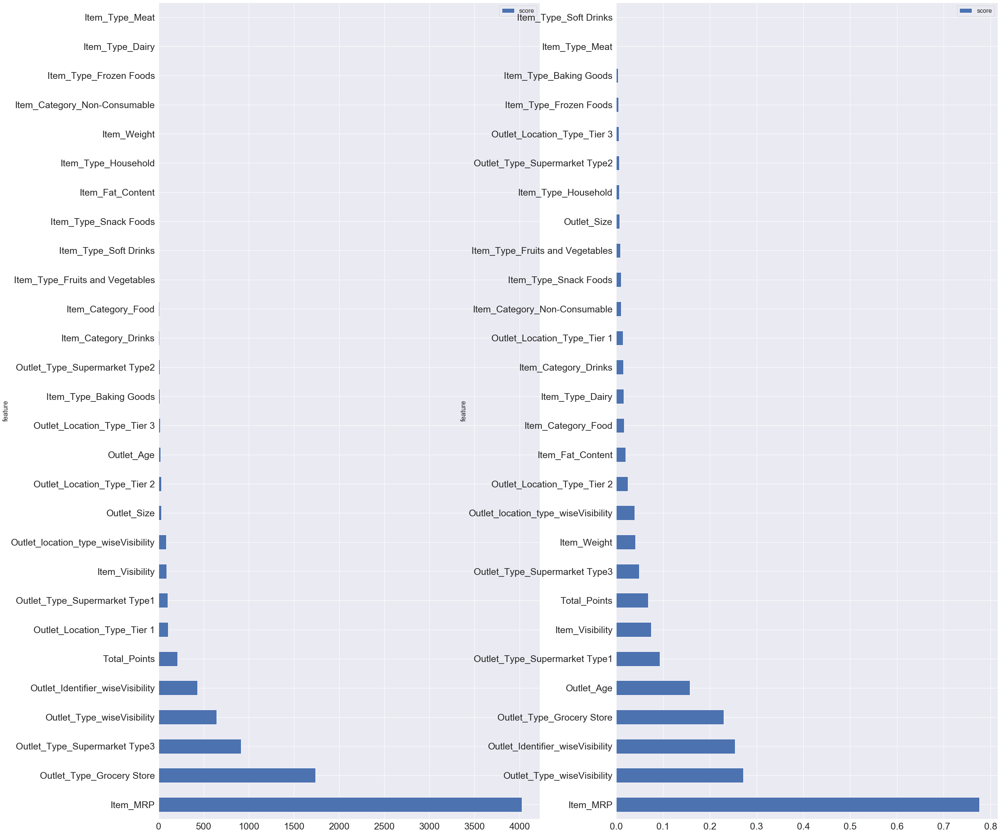

In [324]:
# f_regression
skb = SelectKBest(score_func=f_regression, k=28)
skb.fit(xtrain, ytrain)
select_features_kbest = skb.get_support()
kbest_FR = xtrain.columns[select_features_kbest]
scores = skb.scores_[select_features_kbest]
feature_scores = pd.DataFrame([(item, score) for item, score in zip(kbest_FR, scores)], 
                              columns=['feature', 'score'])

fig = plt.figure(figsize=(40,40))
f1 = fig.add_subplot(121)
feature_scoresFR=feature_scores.sort_values(by='score', ascending=False)
feature_scoresFR.plot(y = 'score', x = 'feature', kind='barh', 
                                                             ax = f1, fontsize=25, grid=True) 
#mutual_info_regression
skb = SelectKBest(score_func=mutual_info_regression, k=28)
skb.fit(xtrain, ytrain)
select_features_kbest = skb.get_support()
kbest_MIR = xtrain.columns[select_features_kbest]
scores = skb.scores_[select_features_kbest]

feature_scores = pd.DataFrame([(item, score) for item, score in zip(kbest_FR, scores)], columns=['feature', 'score'])
f2 = fig.add_subplot(122)
feature_scoresMIR=feature_scores.sort_values(by='score', ascending=False)

feature_scoresMIR.plot(y = 'score', x = 'feature', kind='barh', 
                                                            ax = f2, fontsize=25, grid=True) 
plt.show()

In [339]:

#xtrain[]
generate_all_model_score(xtrain[feature_scoresMIR[:15].feature],ytrain,xtest[feature_scoresMIR[:15].feature],'with_normal')

------------      linear_regression_with_normal     ------------
fit_time =0.01
score_time =0.01
test_r2 =0.59
train_r2 =0.60
test_neg_mean_absolute_error =27.52
train_neg_mean_absolute_error =27.48
test_neg_mean_squared_error =1087.72
train_neg_mean_squared_error =1084.92
overFitt_val =  2.7984890837185503
------------      stochastic_gradientDescent_regressor_with_normal     ------------
fit_time =0.03
score_time =0.01
test_r2 =0.59
train_r2 =0.59
test_neg_mean_absolute_error =27.58
train_neg_mean_absolute_error =27.56
test_neg_mean_squared_error =1092.97
train_neg_mean_squared_error =1091.59
overFitt_val =  1.3806708428812726
------------      ridge_regularization_with_normal     ------------
fit_time =0.01
score_time =0.01
test_r2 =0.59
train_r2 =0.60
test_neg_mean_absolute_error =27.52
train_neg_mean_absolute_error =27.48
test_neg_mean_squared_error =1087.93
train_neg_mean_squared_error =1085.15
overFitt_val =  2.7767769977695025
------------      lasso_regularization_with_normal 

ValueError: max_features must be in (0, n_features]

In [341]:
generate_all_model_score(xtrain[feature_scoresFR[:10].feature],ytrain,xtest[feature_scoresFR[:15].feature],'with_normal')

------------      linear_regression_with_normal     ------------
fit_time =0.03
score_time =0.01
test_r2 =0.59
train_r2 =0.60
test_neg_mean_absolute_error =27.52
train_neg_mean_absolute_error =27.49
test_neg_mean_squared_error =1087.35
train_neg_mean_squared_error =1085.46
overFitt_val =  1.8852957852798227
------------      stochastic_gradientDescent_regressor_with_normal     ------------
fit_time =0.03
score_time =0.01
test_r2 =0.59
train_r2 =0.59
test_neg_mean_absolute_error =27.57
train_neg_mean_absolute_error =27.55
test_neg_mean_squared_error =1090.61
train_neg_mean_squared_error =1089.11
overFitt_val =  1.4989560770868593
------------      ridge_regularization_with_normal     ------------
fit_time =0.01
score_time =0.01
test_r2 =0.59
train_r2 =0.60
test_neg_mean_absolute_error =27.52
train_neg_mean_absolute_error =27.50
test_neg_mean_squared_error =1087.57
train_neg_mean_squared_error =1085.70
overFitt_val =  1.8677314712394946
------------      lasso_regularization_with_normal 

ValueError: max_features must be in (0, n_features]

In [567]:

lasso = Lasso(random_state=25)
alphas = np.logspace(-4, -0.5, 30)
alphas =np.linspace(100,4000,10)
tuned_parameters = {'alpha': alphas, #[9]
                     'tol': np.linspace(.00008,1000,20000),#[2]
                     'max_iter' : [850,1000,1500,2000],
                     'positive':[True]
                    }
                   
n_folds = 5

lso_esti = RandomizedSearchCV(lasso, tuned_parameters, verbose=0,cv=n_folds, n_iter=1000,refit=False,scoring = 'neg_mean_squared_error')
#print(lso_esti.get_params())  # RandomizedSearchCV, GridSearchCV
lso_esti.fit(xtrain,ytrain)
#best_lso_est=lso_esti.best_estimators_
print("\n\n",lso_esti.best_params_,"\n rmse:  ",np.sqrt(lso_esti.best_score_*-1))
lasso = Lasso(**lso_esti.best_params_)
e2=PPM.regressionModelfit_CV(lasso,xtrain.columns, xtrain, ytrain,'xgb',6)



 {'tol': 617.1308871723587, 'positive': True, 'max_iter': 1000, 'alpha': 100.0} 
 rmse:   1212.0956295908566
------------      xgb     ------------
fit_time =0.00
score_time =0.01
test_r2 =-7.91
train_r2 =0.80
test_neg_mean_absolute_error =32.62
train_neg_mean_absolute_error =22.86
test_neg_mean_squared_error =1265.58
train_neg_mean_squared_error =641.81
overFitt_val =  623.772081719304


In [181]:
class select_features(object): # BaseEstimator, TransformerMixin, 
    def __init__(self, select_cols):
        self.select_cols_ = select_cols
    
    def fit(self, X, Y ):
        print('Recive {0:2d} features...'.format(X.shape[1]))
        return self

    def transform(self, X):
        print('Select {0:2d} features'.format(X.loc[:, self.select_cols_].shape[1]))
        return X.loc[:, self.select_cols_]    

    def fit_transform(self, X, Y):
        self.fit(X, Y)
        df = self.transform(X)
        return df 
        #X.loc[:, self.select_cols_]    

    def __getitem__(self, x):
        return self.X[x], self.Y[x]

    
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.decomposition import PCA, KernelPCA
from sklearn.preprocessing import MinMaxScaler,MaxAbsScaler,RobustScaler,Normalizer


model = Pipeline([
        ('pca', PCA(random_state = 101)),
        ('model', Lasso(random_state = 101))]) 


#SEL = list(set(RFEcv).union(set(colsP)))
SEL=xtrain.columns #28
n_components =[None,8,5,3,2,1 ] #[len(SEL)-5, len(SEL)-3, len(SEL)] 
whiten = [False, True]
max_iter = [5] #, 10, 100, 200, 300, 400, 500, 600]  
alpha = [0.0003, 0.0007, 0.0005, 0.05, 0.5, 1.0]
selection = ['random', 'cyclic'] 
tol = [2e-03, 0.003, 0.001, 0.0005]

param_grid = dict(
                  model__alpha = [0.0003, 0.0007, 0.0005, 0.05, 0.5, 1.0],
                  model__max_iter = [5, 10, 100, 200, 300, 400, 500, 600],
                  model__selection = ['random', 'cyclic'],
                  model__tol = [2e-03, 0.003, 0.001, 0.0005],
                  pca__n_components = [None,8,5,3,1 ],
                  pca__whiten = [True] 
                ) 

gs = GridSearchCV(estimator = model, param_grid = param_grid, refit = 'neg_mean_squared_error' #, iid=False
                   , scoring=list(['neg_mean_squared_error' , 'neg_mean_absolute_error', 'r2']) 
                   ,cv=5, verbose=1, n_jobs=4)

lasso = Pipeline([
        ('sel', select_features(select_cols=SEL)), 
        ('scl', RobustScaler()),
        ('gs', gs)
 ])
e2=PPM.regressionModelfit_CV(lasso,xtrain.columns, xtrain, ytrain,'modelname',6)

#results = get_results(lasso, 'lasso Lg1', log=True)
# display(results.loc[:, 'Scorer' : 'MeanScoreStd'])
r = resilduals_plots(lasso, train, ytrain, log=false)

------------      modelname     ------------
Recive 28 features...
Select 28 features
Fitting 5 folds for each of 4608 candidates, totalling 23040 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 128 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:   12.4s
[Parallel(n_jobs=4)]: Done 1728 tasks      | elapsed:   28.9s
[Parallel(n_jobs=4)]: Done 3128 tasks      | elapsed:   51.4s
[Parallel(n_jobs=4)]: Done 4928 tasks      | elapsed:  1.4min
[Parallel(n_jobs=4)]: Done 7128 tasks      | elapsed:  2.0min
[Parallel(n_jobs=4)]: Done 9728 tasks      | elapsed:  2.7min
[Parallel(n_jobs=4)]: Done 12728 tasks      | elapsed:  3.6min
[Parallel(n_jobs=4)]: Done 16128 tasks      | elapsed:  4.5min
[Parallel(n_jobs=4)]: Done 19928 tasks      | elapsed:  5.6min
[Parallel(n_jobs=4)]: Done 23040 out of 23040 | elapsed:  6.4min finished


Select 28 features
Recive 28 features...
Select 28 features
Fitting 5 folds for each of 4608 candidates, totalling 23040 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 744 tasks      | elapsed:   10.9s
[Parallel(n_jobs=4)]: Done 1744 tasks      | elapsed:   25.7s
[Parallel(n_jobs=4)]: Done 3144 tasks      | elapsed:   46.5s
[Parallel(n_jobs=4)]: Done 4944 tasks      | elapsed:  1.3min
[Parallel(n_jobs=4)]: Done 7144 tasks      | elapsed:  1.9min
[Parallel(n_jobs=4)]: Done 9744 tasks      | elapsed:  2.6min
[Parallel(n_jobs=4)]: Done 12744 tasks      | elapsed:  3.5min
[Parallel(n_jobs=4)]: Done 16144 tasks      | elapsed:  4.3min
[Parallel(n_jobs=4)]: Done 19944 tasks      | elapsed:  5.4min
[Parallel(n_jobs=4)]: Done 23040 out of 23040 | elapsed:  6.2min finished


Select 28 features
Select 28 features
Select 28 features
Select 28 features
Select 28 features
Select 28 features
Recive 28 features...
Select 28 features
Fitting 5 folds for each of 4608 candidates, totalling 23040 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 744 tasks      | elapsed:   11.7s
[Parallel(n_jobs=4)]: Done 1744 tasks      | elapsed:   27.5s
[Parallel(n_jobs=4)]: Done 3144 tasks      | elapsed:   48.8s
[Parallel(n_jobs=4)]: Done 4944 tasks      | elapsed:  1.3min
[Parallel(n_jobs=4)]: Done 7144 tasks      | elapsed:  2.0min
[Parallel(n_jobs=4)]: Done 9744 tasks      | elapsed:  2.8min
[Parallel(n_jobs=4)]: Done 12744 tasks      | elapsed:  3.7min
[Parallel(n_jobs=4)]: Done 16144 tasks      | elapsed:  4.7min
[Parallel(n_jobs=4)]: Done 19944 tasks      | elapsed:  5.8min
[Parallel(n_jobs=4)]: Done 23040 out of 23040 | elapsed:  6.6min finished


Select 28 features
Select 28 features
Select 28 features
Select 28 features
Select 28 features
Select 28 features
Recive 28 features...
Select 28 features
Fitting 5 folds for each of 4608 candidates, totalling 23040 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 744 tasks      | elapsed:   12.4s
[Parallel(n_jobs=4)]: Done 1744 tasks      | elapsed:   27.9s
[Parallel(n_jobs=4)]: Done 3144 tasks      | elapsed:   51.4s
[Parallel(n_jobs=4)]: Done 4944 tasks      | elapsed:  1.4min
[Parallel(n_jobs=4)]: Done 7144 tasks      | elapsed:  2.0min
[Parallel(n_jobs=4)]: Done 9744 tasks      | elapsed:  2.7min
[Parallel(n_jobs=4)]: Done 12744 tasks      | elapsed:  3.5min
[Parallel(n_jobs=4)]: Done 16144 tasks      | elapsed:  4.4min
[Parallel(n_jobs=4)]: Done 19944 tasks      | elapsed:  5.4min
[Parallel(n_jobs=4)]: Done 23040 out of 23040 | elapsed:  6.3min finished


Select 28 features
Select 28 features
Select 28 features
Select 28 features
Select 28 features
Select 28 features
Recive 28 features...
Select 28 features
Fitting 5 folds for each of 4608 candidates, totalling 23040 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 744 tasks      | elapsed:   14.2s
[Parallel(n_jobs=4)]: Done 1744 tasks      | elapsed:   30.6s
[Parallel(n_jobs=4)]: Done 3144 tasks      | elapsed:   53.9s
[Parallel(n_jobs=4)]: Done 4944 tasks      | elapsed:  1.4min
[Parallel(n_jobs=4)]: Done 7144 tasks      | elapsed:  2.1min
[Parallel(n_jobs=4)]: Done 9744 tasks      | elapsed:  2.8min
[Parallel(n_jobs=4)]: Done 12744 tasks      | elapsed:  3.6min
[Parallel(n_jobs=4)]: Done 16144 tasks      | elapsed:  4.6min
[Parallel(n_jobs=4)]: Done 19944 tasks      | elapsed:  5.7min
[Parallel(n_jobs=4)]: Done 23040 out of 23040 | elapsed:  6.7min finished


Select 28 features
Select 28 features
Select 28 features
Select 28 features
Select 28 features
Select 28 features
Recive 28 features...
Select 28 features
Fitting 5 folds for each of 4608 candidates, totalling 23040 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 744 tasks      | elapsed:   13.7s
[Parallel(n_jobs=4)]: Done 1744 tasks      | elapsed:   34.3s
[Parallel(n_jobs=4)]: Done 3144 tasks      | elapsed:   58.1s
[Parallel(n_jobs=4)]: Done 4944 tasks      | elapsed:  1.5min
[Parallel(n_jobs=4)]: Done 7144 tasks      | elapsed:  2.1min
[Parallel(n_jobs=4)]: Done 9744 tasks      | elapsed:  2.9min
[Parallel(n_jobs=4)]: Done 12744 tasks      | elapsed:  3.8min
[Parallel(n_jobs=4)]: Done 16144 tasks      | elapsed:  4.7min
[Parallel(n_jobs=4)]: Done 19944 tasks      | elapsed:  5.9min
[Parallel(n_jobs=4)]: Done 23040 out of 23040 | elapsed:  6.7min finished


Select 28 features
Select 28 features
Select 28 features
Select 28 features
Select 28 features
Select 28 features
Recive 28 features...
Select 28 features
Fitting 5 folds for each of 4608 candidates, totalling 23040 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 744 tasks      | elapsed:   12.9s
[Parallel(n_jobs=4)]: Done 1744 tasks      | elapsed:   30.6s
[Parallel(n_jobs=4)]: Done 3144 tasks      | elapsed:   56.6s
[Parallel(n_jobs=4)]: Done 4944 tasks      | elapsed:  1.5min
[Parallel(n_jobs=4)]: Done 7144 tasks      | elapsed:  2.1min
[Parallel(n_jobs=4)]: Done 9744 tasks      | elapsed:  2.9min
[Parallel(n_jobs=4)]: Done 12744 tasks      | elapsed:  3.9min
[Parallel(n_jobs=4)]: Done 16144 tasks      | elapsed:  4.8min
[Parallel(n_jobs=4)]: Done 19944 tasks      | elapsed:  5.9min
[Parallel(n_jobs=4)]: Done 23040 out of 23040 | elapsed:  6.7min finished


Select 28 features
Select 28 features
Select 28 features
Select 28 features
Select 28 features
Select 28 features
fit_time =393.56
score_time =0.03
test_r2 =0.56
train_r2 =0.56
test_neg_mean_absolute_error =28.96
train_neg_mean_absolute_error =28.90
test_neg_mean_squared_error =1133.06
train_neg_mean_squared_error =1128.76
overFitt_val =  4.299938423112053


NameError: name 'y_train' is not defined

Select 28 features


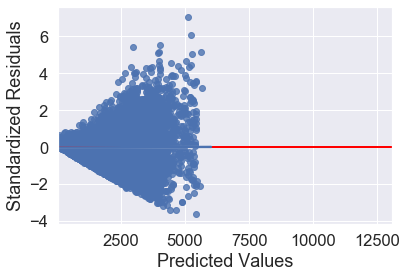

Select 28 features
Output contain Negative records: 265


In [182]:
r = resilduals_plots(lasso, xtrain, ytrain, log=False)
generate_submission_file('n.csv',lasso,test_org,xtest)
#xtrain.values

In [ ]:
XGB boosting and ensembling

In [348]:
import xgboost as xgb
from xgboost import XGBRegressor,plot_importance
param_grid2 = {
    # Parameters that we are going to tune.

    #'eta':[.3],
    'subsample': np.linspace(0.1,1,10),
    # Other parameters
    'n_estimators' : [i for i in range(10,600,50)],
    'objective':['reg:linear','reg:tweedie','reg:gamma'],
    'max_depth' :[i for i in range(1,10)],
    'learning_rate': np.linspace(0.0001,0.02,200),
    "min_child_weight" : [i for i in range(1,9)],
    "gamma"            : np.linspace(0.0001,0.4,300) +[0],
    "colsample_bytree" : np.linspace(0.1,.99,5000),
    "reg_alpha":np.linspace(0.001,5,100),
    "reg_lambda":np.linspace(0.0001,5,100),
    'silent':[1]
}
XGBReg_estimator = xgb.XGBRegressor()
print(XGBReg_estimator.get_params().keys())
grid_search = RandomizedSearchCV(XGBReg_estimator, param_grid2, scoring="neg_mean_squared_error", n_jobs=-1, cv=5,n_iter=30,
                                random_state=1001)
grid_result = grid_search.fit(xtrain, ytrain)
print("Best: %f using %s" % (np.sqrt(-1*grid_result.best_score_), grid_result.best_params_))
xfb_Bestmodel=grid_result.best_estimator_
e2=PPM.regressionModelfit_CV(xfb_Bestmodel,xtrain.columns, xtrain, ytrain,'xgb',6)
# from sklearn.metrics import mean_squared_error
imp_feature=xfb_Bestmodel.feature_importances_

def featureImportance_BAR(_imp_features,_df1):
    _df=pd.DataFrame({'rank_value':imp_feature,'feature_name':_df1.columns},index=_df1.columns).sort_values('rank_value',ascending=False)
    _df=_df[_df['rank_value']>0.0001]
    fig=plt.figure(figsize=(20,15))
    #print(_df.tail())
    _df.plot.bar(figsize=(18,3),fontsize=12,color='red')
    print('Total Columns=',len(_df1))
    print('Number_of_good_columns=',len(_df))
    return _df.index
goodcols=featureImportance_BAR(imp_feature,xtrain)
goodcols

dict_keys(['base_score', 'booster', 'colsample_bylevel', 'colsample_bytree', 'gamma', 'learning_rate', 'max_delta_step', 'max_depth', 'min_child_weight', 'missing', 'n_estimators', 'n_jobs', 'nthread', 'objective', 'random_state', 'reg_alpha', 'reg_lambda', 'scale_pos_weight', 'seed', 'silent', 'subsample'])


Pipeline(memory=None,
         steps=[('pca',
                 PCA(copy=True, iterated_power='auto', n_components=None,
                     random_state=101, svd_solver='auto', tol=0.0,
                     whiten=False)),
                ('model',
                 Lasso(alpha=1.0, copy_X=True, fit_intercept=True,
                       max_iter=1000, normalize=False, positive=False,
                       precompute=False, random_state=101, selection='cyclic',
                       tol=0.0001, warm_start=False))],
         verbose=False)


Index(['Item_MRP', 'Outlet_Identifier_wiseVisibility', 'Outlet_Age',
       'Total_Points', 'Item_Weight', 'Item_Visibility',
       'Outlet_Type_Supermarket Type3', 'Outlet_Type_Supermarket Type1',
       'Outlet_Type_wiseVisibility', 'Outlet_Size',
       'Item_Type_Fruits and Vegetables', 'Item_Type_Meat', 'Item_Fat_Content',
       'Item_Type_Household', 'Item_Type_Frozen Foods',
       'Item_Type_Snack Foods', 'Item_Type_Soft Drinks',
       'Item_Category_Drinks', 'Item_Type_Dairy', 'Item_Category_Food',
       'Item_Category_Non-Consumable', 'Item_Type_Baking Goods',
       'Outlet_Location_Type_Tier 3', 'Outlet_location_type_wiseVisibility',
       'Outlet_Location_Type_Tier 2'],
      dtype='object')

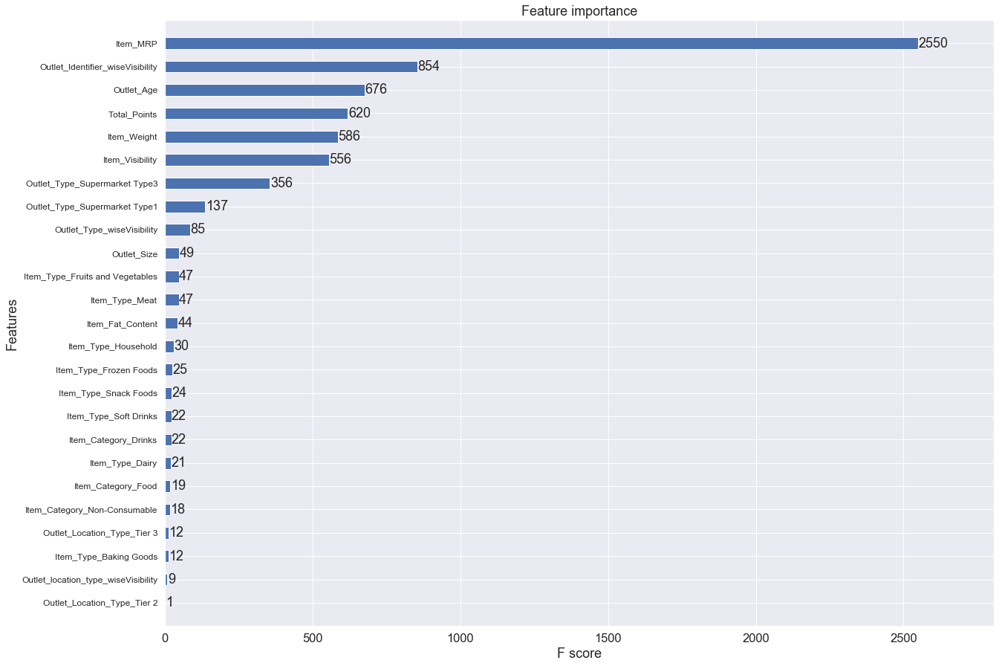

In [356]:
from xgboost import XGBRegressor,plot_importance
fig=plt.figure(figsize=(20,15))

ax = fig.add_subplot(111)
g = plot_importance(xfb_Bestmodel, height=0.5, ax=ax)
plt.yticks(fontsize=12)
print(model)

# # Using each unique importance as a threshold
# #XGB_FI_thresholds = np.sort(np.unique(model.feature_importances_)) 
# best = 1e36
# colsbest = 31
# xfb_Bestmodel = grid_result.best_estimator_
# threshold = 0
goodcols

In [360]:
generate_all_model_score(xtrain[goodcols[:20]],ytrain,xtest[goodcols[:12]],'with_normal')

------------      linear_regression_with_normal     ------------
fit_time =0.01
score_time =0.01
test_r2 =0.59
train_r2 =0.60
test_neg_mean_absolute_error =27.53
train_neg_mean_absolute_error =27.47
test_neg_mean_squared_error =1089.03
train_neg_mean_squared_error =1084.57
overFitt_val =  4.459764389446946
------------      stochastic_gradientDescent_regressor_with_normal     ------------
fit_time =0.03
score_time =0.01
test_r2 =0.58
train_r2 =0.59
test_neg_mean_absolute_error =27.70
train_neg_mean_absolute_error =27.66
test_neg_mean_squared_error =1102.50
train_neg_mean_squared_error =1099.01
overFitt_val =  3.4837436013267506
------------      ridge_regularization_with_normal     ------------
fit_time =0.02
score_time =0.01
test_r2 =0.59
train_r2 =0.60
test_neg_mean_absolute_error =27.53
train_neg_mean_absolute_error =27.48
test_neg_mean_squared_error =1089.29
train_neg_mean_squared_error =1084.87
overFitt_val =  4.42184975374812
------------      lasso_regularization_with_normal    

ValueError: max_features must be in (0, n_features]

Fitting 6 folds for each of 20 candidates, totalling 120 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  5.2min


KeyboardInterrupt: 

In [106]:

def createModelDict(n_esti=130,learnRate=0.3,rnd_state=46,minleaf=60,minsample=32):
    model_dict={} 
    model_dict['Ada_boost_regressor']=AdaBoostRegressor(DecisionTreeRegressor(max_depth=1, min_samples_leaf=minleaf,min_samples_split=minsample),n_estimators=n_esti, learning_rate=learnRate,random_state=rnd_state)
    model_dict['random_forest_regressor']=RandomForestRegressor(n_estimators=n_esti,max_depth=15,  min_samples_split=32,min_samples_leaf=60,n_jobs=-1,random_state=rnd_state)
    model_dict['decision_tree_regressor']=DecisionTreeRegressor(max_depth=15, min_samples_split=32,min_samples_leaf=60,random_state=rnd_state)
    model_dict['linear_regression']=LinearRegression()
    model_dict['stochastic_gradientDescent_regressor']=SGDRegressor(random_state=rnd_state)
    model_dict['ridge_regularization']=Ridge() 
    model_dict['lasso_regularization']=Lasso()
    model_dict['elasticNet_regularization']=ElasticNet() 
    model_dict['gradient_boosting_regressor']=GradientBoostingRegressor(n_estimators=n_esti, max_depth=5,min_samples_split=minleaf,min_samples_leaf=minsample,learning_rate=learnRate, loss='ls',random_state=rnd_state)
    return model_dict
model_dict=createModelDict()

def createRandomSearchCV_iterDict():
    RandomSearchCV_iterDict={} 
    RandomSearchCV_iterDict['Ada_boost_regressor']=40
    RandomSearchCV_iterDict['random_forest_regressor']=40
    RandomSearchCV_iterDict['decision_tree_regressor']=100
    RandomSearchCV_iterDict['linear_regression']=500
    RandomSearchCV_iterDict['stochastic_gradientDescent_regressor']=100
    RandomSearchCV_iterDict['ridge_regularization']=100
    RandomSearchCV_iterDict['lasso_regularization']=100
    RandomSearchCV_iterDict['elasticNet_regularization']=100
    RandomSearchCV_iterDict['gradient_boosting_regressor']=50
    return RandomSearchCV_iterDict
model_dict=createModelDict()

NameError: name 'AdaBoostRegressor' is not defined

In [287]:
train_test=pd.concat([train,test], ignore_index=True)
#data=train_test.copy()
train.shape,test.shape,train_test.shape

((8523, 12), (5681, 11), (14204, 12))

In [15]:
print(BiVEDA.getFuncs())
print(catUniVEDA.getFuncs())
print(PPM.getFuncs())
print(contiUniVEDA.getFuncs())


    Use Followind Methods:

        1. BiVEDA_cat_cols_KDEPLOT_over_yConti(cat_col_list, conti_label_colname, DataFrame)
        2. BiVEDA_Conti_cols_over_cat_cols_mean_CheckOrdinality(ContiList, CatList,DataFrame)
        3. BiVEDA_conti_cols_KDEPLOT_over_yCat(conti_col_list, cat_label_colname, DataFrame)
        4. BiVEDA_conti_cols_scatterplot_over_yConti(conti_col,yColumn,df)
        5. Allconti_cols_scatter_over_yConti(conti_ColList,conti_label_name, dataFrame)
      5.1  BiVEDA_conti_cols_regplot_over_yConti(_conti_cols,yConti, dataFrame)
        6. Allcols_correlation_heatmap(numeric_colList, dataframe)
        7. BiVEDA_conti_and_cat_cols_SPEARSMAN_CORRELATION_with_yConti(conti_cat_list, yConti_col ,_df)
        8. BiVEDA_cat_cols_IMPACTCHECK_Over_yConti_via_OneWay_anovaTest(Cat_col_list,yConti,frame)
        9. BiVEDA_cat_cols_SNS_FACTOR_over_yConti(conti_col,yColumn,df)
       10. BiVEDA_both_conti_cat_cols_PAIRPLOT_over_yConti(ColList,yConti_column,_df)
       11. All_VEDA_

In [289]:
#BiVEDA.Allcols_correlation_heatmap(train.columns,train_test)

# Problem Statement
###### The data scientists at BigMart have collected 2013 sales data for 1559 products across 10 stores in different cities. 
###### Also, certain attributes of each product and store have been defined. The aim is to build a predictive model and 
###### find out the sales of each product at a particular store.

###### Using this model, BigMart will try to understand the properties of products and stores which play a key role in 
###### increasing sales.

######   Please note that the data may have missing values as some stores might not report all the data due to technical
######   glitches. Hence, it will be required to treat them accordingly.


# Hypothises 
### 1. Hypothetically  sales depends on stores with following parameters (without Looking data Data)
######            City, Density of population,  store location, store capacity, marketing, competeters, Ambiance, customer behaviour
   

### 2. Hypothetically sales depends on product with following parameters (without Looking at Data)
##### Brand, display area, packaging, promotion offer, utility, return policy, advertisment


In [290]:
# Lets now explore Data, and list the columns and observe whether if all our hypothesis are
desc(train)

# Now  
# (Outlet_Location_Type,Outlet_Type,Outlet_Type ) are part of our Ist Hypotheis(location, city,capacity) 

# Outlet_Establishment_Year  are not part of Hypothesis
# Outlet_Identifier = ID Variance
# (Item_Type,Item_Visibility,Item_Fat_Content) are part of 2nd hypthesis ( Utility -Dialy use items, Display area)

# Item_Identifier - ID variable ( initial two charator are FD,NC,DR)
# where
#      'FD':'Food',
#      'NC':'Non-Consumable',
#      'DR':'Drinks'


# 3 variables ( Item_MRP,Outlet_Establishment_Year,Item_Weight) are not there in hypothesis.


#So, Some much of data hypothesize that matches with acutal data we recieve in train and test


,dtypes,null_count,total_count,unique_count,missing value ratio,variance of numerics,std,mean,min
Outlet_Location_Type,object,0.0,8523.0,3.0,0%,None,None,None,None
Outlet_Size,object,2410.0,6113.0,3.0,0.28%,None,None,None,None
Outlet_Type,object,0.0,8523.0,4.0,0%,None,None,None,None
Item_Fat_Content,object,0.0,8523.0,5.0,0%,None,None,None,None
Outlet_Establishment_Year,int64,0.0,8523.0,9.0,0%,70.0864,8.37176,2009,1985
Outlet_Identifier,object,0.0,8523.0,10.0,0%,None,None,None,None
Item_Type,object,0.0,8523.0,16.0,0%,None,None,None,None
Item_Weight,float64,1463.0,7060.0,415.0,0.17%,21.5617,4.64346,21.35,4.555
Item_Identifier,object,0.0,8523.0,1559.0,0%,NaN,NaN,NaN,NaN
Item_Outlet_Sales,float64,0.0,8523.0,3493.0,0%,2.91214e+06,1706.5,13087,33.29


In [291]:
desc(test)

,dtypes,null_count,total_count,unique_count,missing value ratio,variance of numerics,std,mean,min
Outlet_Location_Type,object,0.0,5681.0,3.0,0%,None,None,None,None
Outlet_Size,object,1606.0,4075.0,3.0,0.28%,None,None,None,None
Outlet_Type,object,0.0,5681.0,4.0,0%,None,None,None,None
Item_Fat_Content,object,0.0,5681.0,5.0,0%,None,None,None,None
Outlet_Establishment_Year,int64,0.0,5681.0,9.0,0%,70.0947,8.37226,2009,1985
Outlet_Identifier,object,0.0,5681.0,10.0,0%,None,None,None,None
Item_Type,object,0.0,5681.0,16.0,0%,None,None,None,None
Item_Weight,float64,976.0,4705.0,410.0,0.17%,21.7608,4.66485,21.35,4.555
Item_Identifier,object,0.0,5681.0,1543.0,0%,NaN,NaN,NaN,NaN
Item_MRP,float64,0.0,5681.0,4402.0,0%,3820.36,61.8091,266.588,31.99


In [292]:
data_org=pd.concat([train,test],ignore_index=True)
data=pd.concat([train,test],ignore_index=True)
data.shape

(14204, 12)

In [293]:
train.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700
3,FDX07,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
4,NCD19,8.93,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052


In [294]:
# Understand Categorical and contineos columns
categorial_features = data.select_dtypes(include=[np.object])
categorial_features.head(2)

,Item_Fat_Content,Item_Identifier,Item_Type,Outlet_Identifier,Outlet_Location_Type,Outlet_Size,Outlet_Type
0,Low Fat,FDA15,Dairy,OUT049,Tier 1,Medium,Supermarket Type1
1,Regular,DRC01,Soft Drinks,OUT018,Tier 3,Medium,Supermarket Type2


In [295]:
numerical_features = data.select_dtypes(include=[np.number])
numerical_features.head(2)

,Item_MRP,Item_Outlet_Sales,Item_Visibility,Item_Weight,Outlet_Establishment_Year
0,249.8092,3735.1380,0.016047,9.30,1999
1,48.2692,443.4228,0.019278,5.92,2009


In [296]:
cat_id_cols = ['Outlet_Identifier']
cat_nominal_cols= ['Outlet_Location_Type','Outlet_Type','Item_Type']
cat_ordinal_cols =  ['Item_Fat_Content','Outlet_Size','Outlet_Establishment_Year']

cat_num_cols =['Outlet_Establishment_Year']
cat_nulls_cols = ['Outlet_Size']

cat_cols = cat_id_cols + cat_nominal_cols + cat_ordinal_cols 


conti_id_cols=['Item_Identifier']
conti_num_cols= ['Item_Visibility','Item_MRP','Item_Weight']
conti_nulls_cols = ['Item_Weight']
conti_cols= conti_id_cols +  conti_num_cols

label_col='Item_Outlet_Sales'

# 1. Imputing Missing values and  UNIVEDA for CAT cols
### First thing first ( Missing values)

Index(['Outlet_Size'], dtype='object')

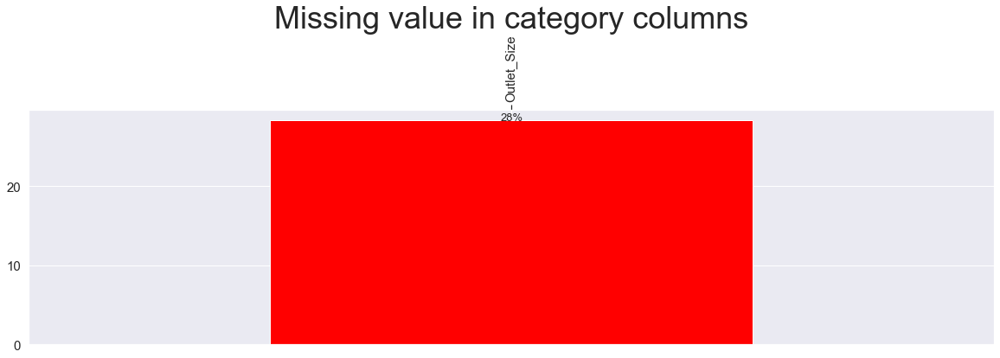

In [297]:
PPM.getMissingCategoryColumns(17,train)

In [298]:
#crossTabHistGramPlot(cat_cols,'Outlet_Size',data)

In [299]:
# outlet size   has also Missing value, lets fill

# categrorize the data with Outlet_Type with mode on outlet size

Outlet_Type_wise_outletSize=train_test.pivot_table('Outlet_Size',index='Outlet_Type',aggfunc=pd.Series.mode)
print(Outlet_Type_wise_outletSize.Outlet_Size['Supermarket Type1'])
Outlet_Type_wise_outletSize.head(5)

Small


,Outlet_Size
Outlet_Type,
Grocery Store,Small
Supermarket Type1,Small
Supermarket Type2,Medium
Supermarket Type3,Medium


In [300]:
train['Outlet_Size'][train['Outlet_Size'].isnull()]=train[train['Outlet_Size'].isnull()]['Outlet_Type'].apply(lambda x: Outlet_Type_wise_outletSize.
                                                                                                              [x])
desc(train)

,dtypes,null_count,total_count,unique_count,missing value ratio,variance of numerics,std,mean,min
Outlet_Size,object,0.0,8523.0,3.0,0%,None,None,None,None
Outlet_Location_Type,object,0.0,8523.0,3.0,0%,None,None,None,None
Outlet_Type,object,0.0,8523.0,4.0,0%,None,None,None,None
Item_Fat_Content,object,0.0,8523.0,5.0,0%,None,None,None,None
Outlet_Establishment_Year,int64,0.0,8523.0,9.0,0%,70.0864,8.37176,2009,1985
Outlet_Identifier,object,0.0,8523.0,10.0,0%,None,None,None,None
Item_Type,object,0.0,8523.0,16.0,0%,None,None,None,None
Item_Weight,float64,1463.0,7060.0,415.0,0.17%,21.5617,4.64346,21.35,4.555
Item_Identifier,object,0.0,8523.0,1559.0,0%,NaN,NaN,NaN,NaN
Item_Outlet_Sales,float64,0.0,8523.0,3493.0,0%,2.91214e+06,1706.5,13087,33.29


# Lets Perform cat Univariate Analysis

In [301]:
# Univariate Categorical columns plots

    # makeUnivariateCategoricalplotBARV(catColList, dataFrame):
    # makeUnivariateCategoricaPlotPIE(catColList, dataFrame):
    #crossTabHistGramPlotSplit(CatColList, BinaryValColumn, Dataframe):
    #Bivariate_ContiList_over_CataList_mean_CheckOrdinality(ContiList, CatList,DataFrame)
    #crossTabHistGramPlot(CatColList, BinaryValColumn, Dataframe)

cat_cols=[str(i) for i in cat_cols]
cat_cols=cat_cols[1:]

desc(data[cat_cols])

,dtypes,null_count,total_count,unique_count,missing value ratio,variance of numerics,std,mean,min
Outlet_Location_Type,object,0.0,14204.0,3.0,0%,NaN,NaN,NaN,NaN
Outlet_Size,object,4016.0,10188.0,3.0,0.28%,NaN,NaN,NaN,NaN
Outlet_Type,object,0.0,14204.0,4.0,0%,NaN,NaN,NaN,NaN
Item_Fat_Content,object,0.0,14204.0,5.0,0%,NaN,NaN,NaN,NaN
Outlet_Establishment_Year,int64,0.0,14204.0,9.0,0%,70.0848,8.37166,2009,1985
Item_Type,object,0.0,14204.0,16.0,0%,NaN,NaN,NaN,NaN


In [302]:
# Encoding 

In [303]:
# Action 3 New Feature Created
train['Item_Category'] = train['Item_Identifier'].apply(lambda x: x[0:2]).map({'FD':'Food',
                                                              'NC':'Non-Consumable',
                                                              'DR':'Drinks'})
test['Item_Category'] = test['Item_Identifier'].apply(lambda x: x[0:2]).map({'FD':'Food',
                                                              'NC':'Non-Consumable',
                                                              'DR':'Drinks'})
print(train['Item_Category'].value_counts())
cat_nominal_cols = cat_nominal_cols + ['Item_Category']
cat_cols = cat_cols  + ['Item_Category']

Food              6125
Non-Consumable    1599
Drinks             799
Name: Item_Category, dtype: int64


In [304]:
train['Outlet_Establishment_Year']=(train['Outlet_Establishment_Year'] - train['Outlet_Establishment_Year'].min())
test['Outlet_Establishment_Year']=(test['Outlet_Establishment_Year'] - test['Outlet_Establishment_Year'].min())

In [305]:
train['Outlet_Establishment_Year'].value_counts()

0     1463
2      932
14     930
12     930
19     930
17     929
24     928
22     926
13     555
Name: Outlet_Establishment_Year, dtype: int64

In [306]:
test['Outlet_Establishment_Year'].value_counts()

0     976
2     621
19    620
14    620
12    620
17    619
24    618
22    617
13    370
Name: Outlet_Establishment_Year, dtype: int64

In [307]:
# train Data

 PIE plot for categorical columns showing the % of records against subcategory of column data 
{'Outlet_Identifier', 'Outlet_Location_Type', 'Item_Type', 'Outlet_Size', 'Outlet_Type', 'Item_Fat_Content'}


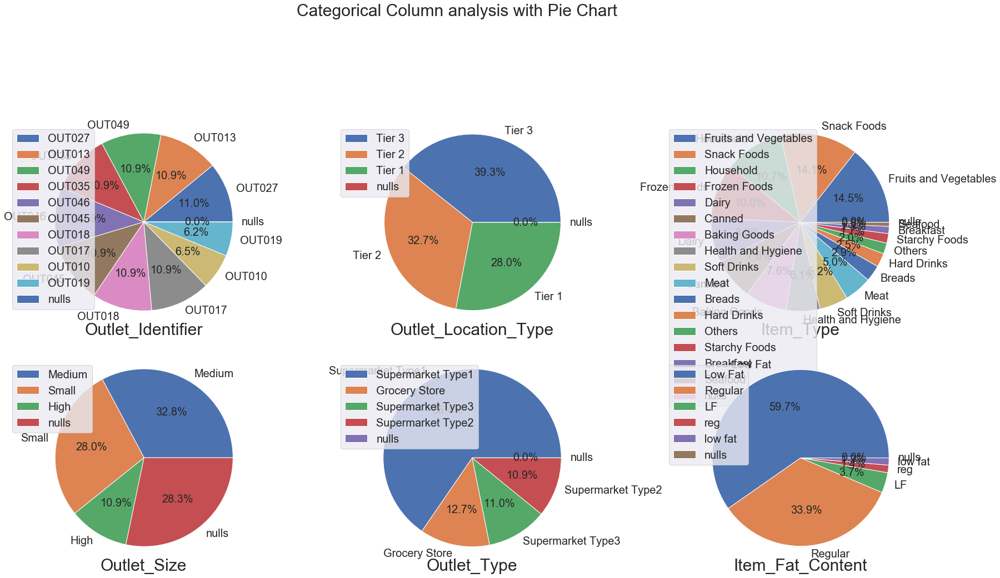

In [76]:
catUniVEDA.UniVEDA_cat_cols_PIE(object_cols,train)

# Feature transformation (categorical Vars)
### 1. should be done based on input taken from univariate analysis on categorical columns 
#### Note:  Feature Transformation is one of the Feature Engineering technique

In [309]:
# 
#  1) Item Fat content Categories are mis-spelled
#  2) the Item Type , there are many different categories, So it need to merged somehow
#  3) Super market2 and super market 3 can be merged in Outlet type, As sub categrory are not distributed properly.

# We use
print('\nModified Categories for :' , 'Item_Fat_Content')
train['Item_Fat_Content'] = train['Item_Fat_Content'].replace({'LF':'Low Fat',
                                                            'reg':'Regular',
                                                            'low fat':'Low Fat'})
test['Item_Fat_Content'] = test['Item_Fat_Content'].replace({'LF':'Low Fat',
                                                            'reg':'Regular',
                                                            'low fat':'Low Fat'})


Modified Categories for : Item_Fat_Content


In [310]:
catUniVEDA.getFuncs()

1. UniVEDA_cat_cols_BAR(_cat_col_list,dataFrame)
    
                BAR plot for categorical columns showing the number of records in each BAR
    
2. UniVEDA_cat_cols_PIE(_cat_col_list,dataFrame)
    
                PIE plot for categorical columns showing the % of records against subcategory of column data
    


 PIE plot for categorical columns showing the % of records against subcategory of column data 
['Item_Fat_Content']


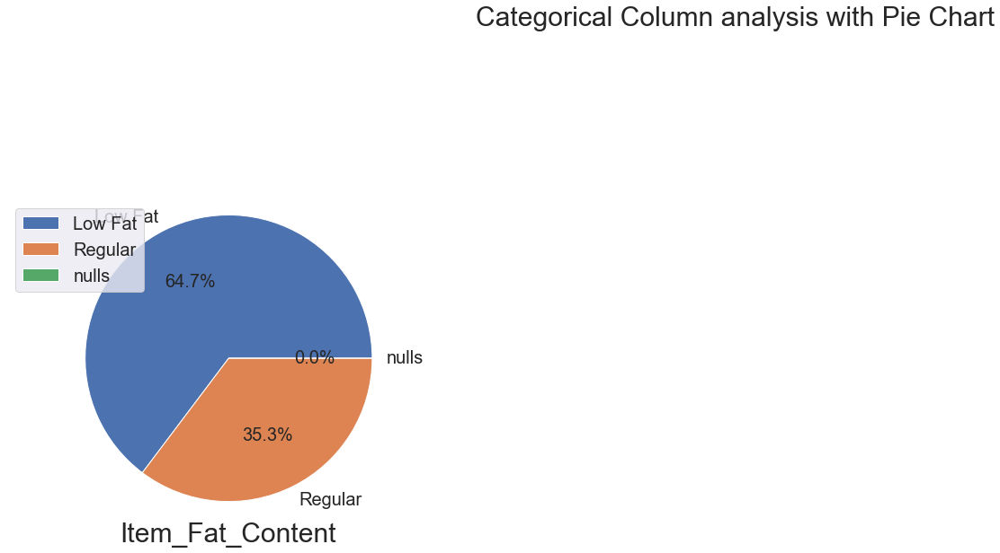

In [311]:
catUniVEDA.UniVEDA_cat_cols_PIE(['Item_Fat_Content'],train)

In [312]:
#BiVEDA.getFuncs()

mean value of Contineous Columns over each category of cat columns


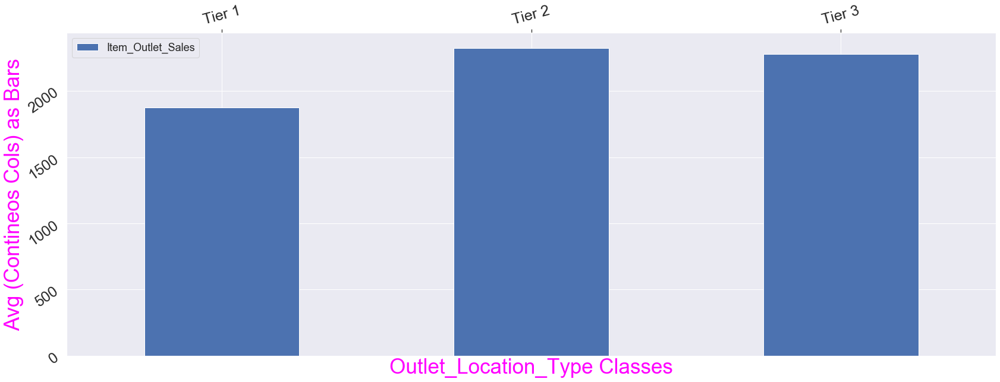

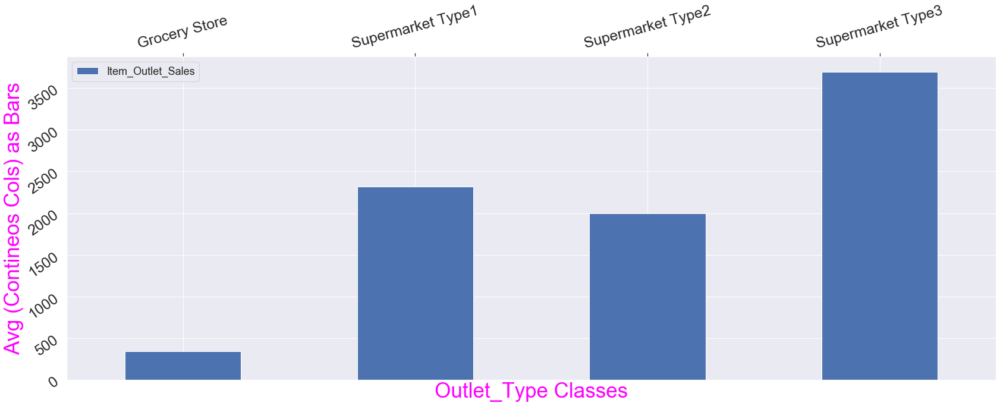

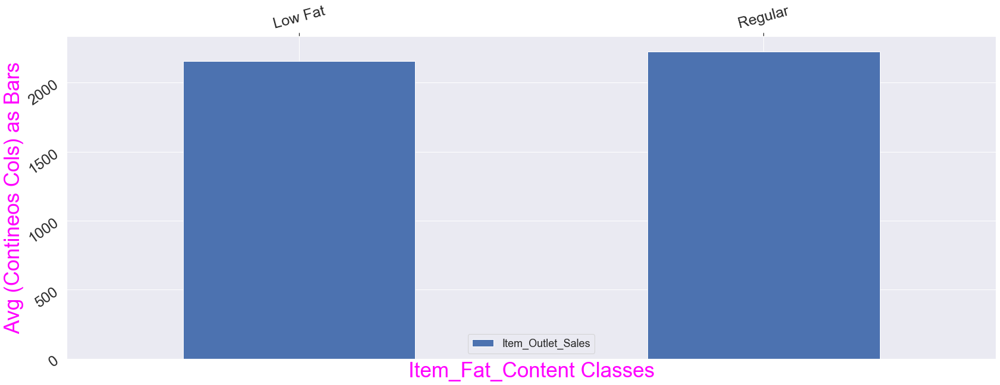

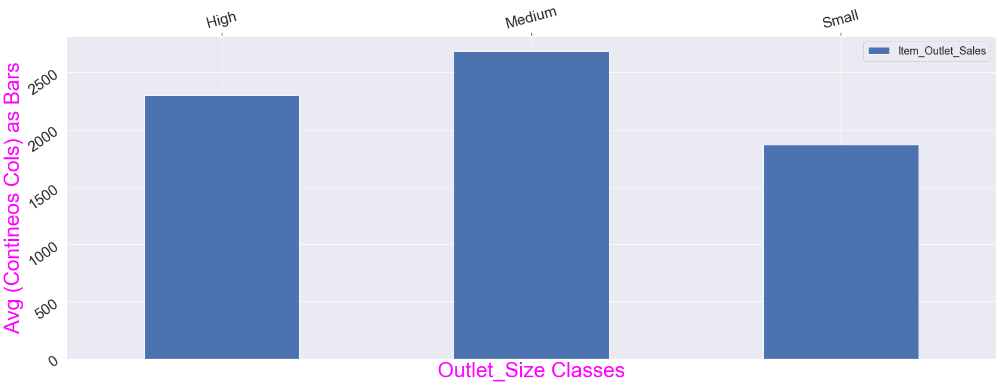

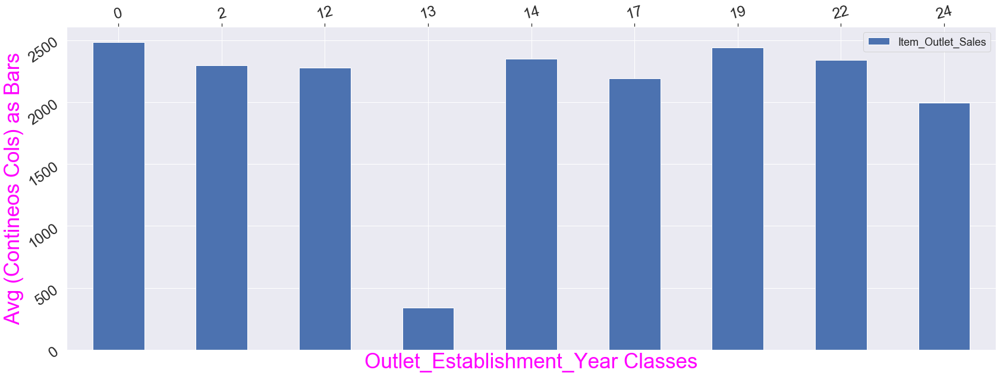

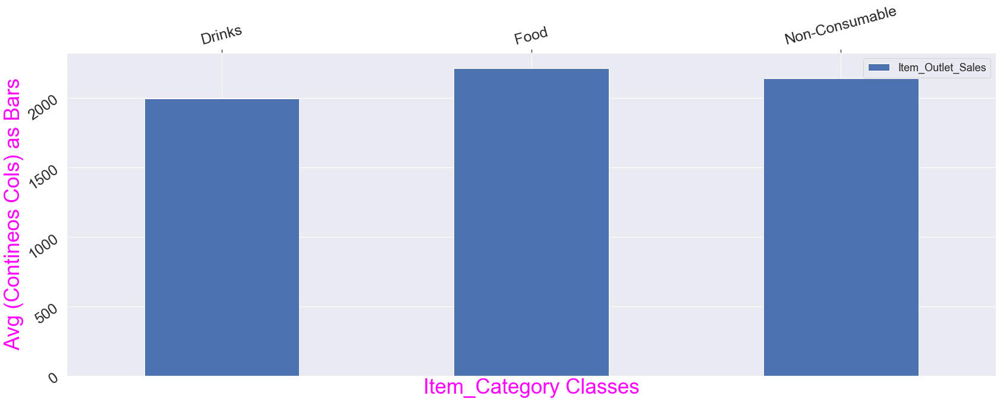

In [313]:
#Bivariate_ContiList_over_CataList_mean_CheckOrdinality(ContiList, CatList,train)
BiVEDA.BiVEDA_Conti_cols_over_cat_cols_mean_CheckOrdinality(['Item_Outlet_Sales'], cat_cols,train)

In [314]:
#  2) the Item Type , there are many different categories, So it need to merged somehow
# # But is that a good idea? A quick way to check that could be to analyze the mean sales by type of store. 
# If they have similar sales, then keeping them separate won’t help much.
train.pivot_table('Item_Outlet_Sales',index=['Item_Type']).head(4)

#See the average sale is same, we can merge them But lets not do this as AV tutorial doing anything on it.


,Item_Outlet_Sales
Item_Type,
Baking Goods,1952.971207
Breads,2204.132226
Breakfast,2111.808651
Canned,2225.194904


In [315]:

#  3) Super market2 and super market 3 can be merged in Outlet type, As sub categrory are not distributed properly.
#During exploration, we decided to consider combining the Supermarket Type2 and Type3 variables. 
# But is that a good idea? A quick way to check that could be to analyze the mean sales by type of store. 
# If they have similar sales, then keeping them separate won’t help much.


train.pivot_table('Item_Outlet_Sales',index=['Outlet_Type'])

# Observer
# This shows significant difference between them and we’ll leave them as it is. Note that this is just one way 
# of doing this, you can perform some other analysis in different situations and also do the same for other features


,Item_Outlet_Sales
Outlet_Type,
Grocery Store,339.828500
Supermarket Type1,2316.181148
Supermarket Type2,1995.498739
Supermarket Type3,3694.038558


In [316]:
import BiVEDA_Function as BiVEDA
BiVEDA.getFuncs()


    Use Followind Methods:

        1. BiVEDA_cat_cols_KDEPLOT_over_yConti(cat_col_list, conti_label_colname, DataFrame)
        2. BiVEDA_Conti_cols_over_cat_cols_mean_CheckOrdinality(ContiList, CatList,DataFrame)
        3. BiVEDA_conti_cols_KDEPLOT_over_yCat(conti_col_list, cat_label_colname, DataFrame)
        4. BiVEDA_conti_cols_scatterplot_over_yConti(conti_col,yColumn,df)
        5. Allconti_cols_scatter_over_yConti(conti_ColList,conti_label_name, dataFrame)
        6. Allcols_correlation_heatmap(numeric_colList, dataframe)
        7. BiVEDA_conti_and_cat_cols_SPEARSMAN_CORRELATION_with_yConti(conti_cat_list, yConti_col ,_df)
        8. BiVEDA_cat_cols_IMPACTCHECK_Over_yConti_via_OneWay_anovaTest(Cat_col_list,yConti,frame)
        9. BiVEDA_cat_cols_SNS_FACTOR_over_yConti(conti_col,yColumn,df)
       10. BiVEDA_both_conti_cat_cols_PAIRPLOT_over_yConti(ColList,yConti_column,_df)
       11. All_VEDA_conti_higly_correlation_cols_pairplot_scatterplot(numeric_colList, _df)
       1

# 2. Missing Value transformation and UniVEDA for conti Column
 Univaricate Contineous columns plots

In [317]:
contiUniVEDA.getFuncs()


    1. UniVEDA_conti_cols_HIST(catColList, dataFrame,kde=1)
    2. UniVEDA_conti_cols_BOX(catColList, dataFrame):
    3. UniVEDA_conti_cols_SNS_BOX(conti_col,df)
    4. UniVEDA_conti_cols_SNS_DIST(conti_col,df)
    5. UniVEDA_conti_cols_QQPLOT(cat_col_list, DataFrame):
    6. UniVEDA_conti_cols_PROBPLOT(conti_cols, dataFrame):
    


In [318]:
#PPM.getFuncs()
#PPM.getMissingContineosColumns(17,train)

In [319]:
# Item_Weight has missing value (lets fill)


# It has missing values , it contineous type variable, can be avg out, instead of mode
# Lets take Item_Identifier which has very high distint value , So we use it inference the missing value.
# averging out weight with respect to Item_Identifier using pivot table
# then fill out missing weight on the basis of join on Item_Identifier

item_avg_weight=train_test.pivot_table(values='Item_Weight', index='Item_Identifier',aggfunc=np.mean)
print(item_avg_weight.Item_Weight.head(5))

#print(item_avg_weight.Item_Weight['DRA12'])
train.loc[train['Item_Weight'].isnull(),'Item_Weight'] = train.loc[train['Item_Weight'].isnull(),'Item_Identifier'].apply(lambda x: item_avg_weight.Item_Weight[x])
#desc(train)

Item_Identifier
DRA12    11.600
DRA24    19.350
DRA59     8.270
DRB01     7.390
DRB13     6.115
Name: Item_Weight, dtype: float64


In [320]:
PPM.desc(train)
#PPM.getMissingContineosColumns(17,train)
#getFuncs()

,dtypes,null_count,total_count,unique_count,missing value ratio,variance of numerics,std,mean,min,max,skew
Item_Fat_Content,object,0.0,8523.0,2.0,0%,0.00,0.00,0.00,0.000,0.00,0.000
Outlet_Size,object,0.0,8523.0,3.0,0%,0.00,0.00,0.00,0.000,0.00,0.000
Outlet_Location_Type,object,0.0,8523.0,3.0,0%,0.00,0.00,0.00,0.000,0.00,0.000
Item_Category,object,0.0,8523.0,3.0,0%,0.00,0.00,0.00,0.000,0.00,0.000
Outlet_Type,object,0.0,8523.0,4.0,0%,0.00,0.00,0.00,0.000,0.00,0.000
Outlet_Establishment_Year,int64,0.0,8523.0,9.0,0%,70.09,8.37,12.83,0.000,24.00,-0.397
Outlet_Identifier,object,0.0,8523.0,10.0,0%,0.00,0.00,0.00,0.000,0.00,0.000
Item_Type,object,0.0,8523.0,16.0,0%,0.00,0.00,0.00,0.000,0.00,0.000
Item_Weight,float64,0.0,8523.0,603.0,0%,21.58,4.65,12.87,4.555,21.35,0.071
Item_Identifier,object,0.0,8523.0,1559.0,0%,0.00,0.00,0.00,0.000,0.00,0.000


In [321]:
train[conti_cols].head(2)
#SNS_BoxSubplots_univaricate_Contineous(conti_cols+['Outlet_Establishment_Year'],data)

,Item_Identifier,Item_Visibility,Item_MRP,Item_Weight
0,FDA15,0.016047,249.8092,9.30
1,DRC01,0.019278,48.2692,5.92


 Lets create Vertical Multi HISTOGRAM plot for column 
['Item_Visibility', 'Item_MRP', 'Item_Weight', 'Outlet_Establishment_Year']


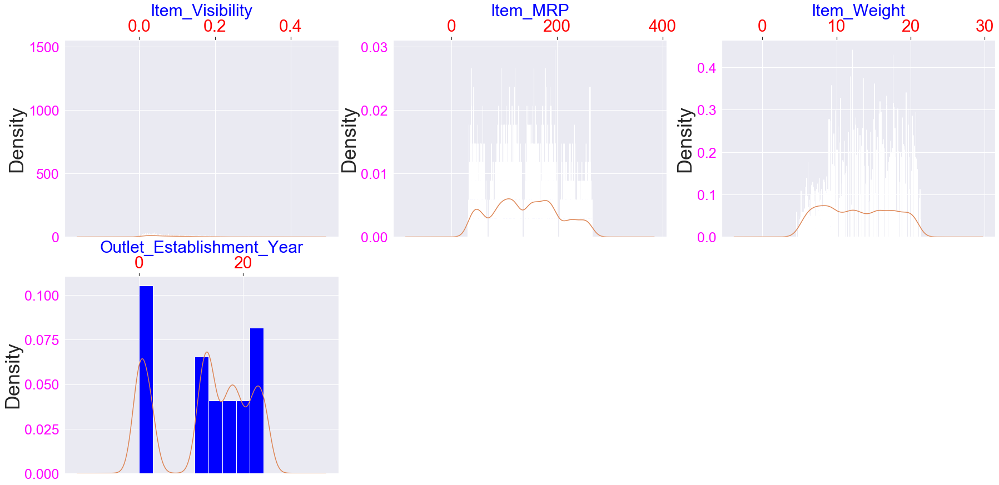

In [322]:
contiUniVEDA.UniVEDA_conti_cols_HIST(conti_cols[1:]+['Outlet_Establishment_Year'],train,1)

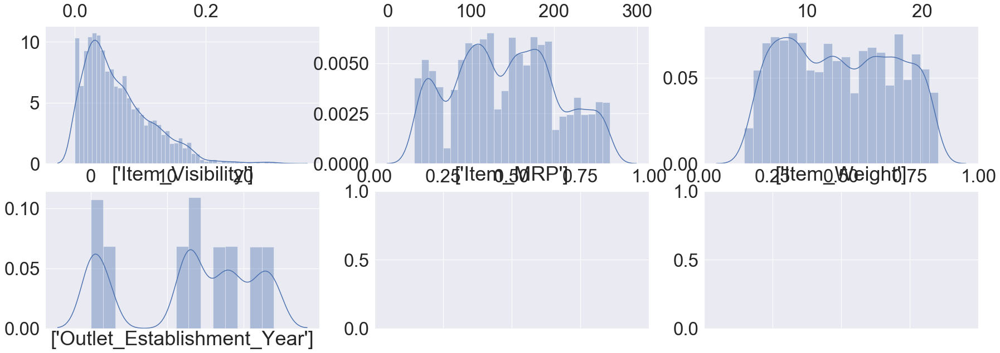

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

In [323]:
contiUniVEDA.UniVEDA_conti_cols_SNS_DIST(conti_cols[1:]+['Outlet_Establishment_Year'],train)

 Lets create Vertical Multi HISTOGRAM plot for column 
['Item_Visibility', 'Item_MRP', 'Item_Weight', 'Outlet_Establishment_Year']


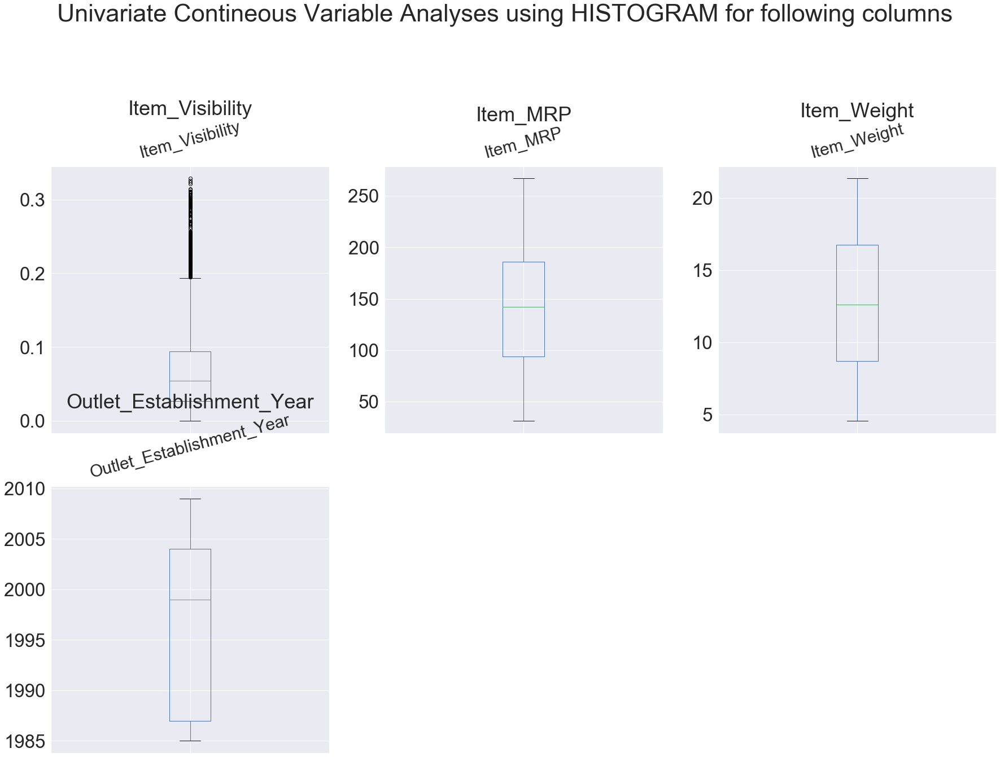

In [324]:
contiUniVEDA.UniVEDA_conti_cols_BOX(conti_cols[1:]+['Outlet_Establishment_Year'],data)

Item_Visibility
Item_MRP
Item_Weight
 Lets create Vertical Multi HISTOGRAM plot for column 
['Item_Visibility', 'Item_MRP', 'Item_Weight']


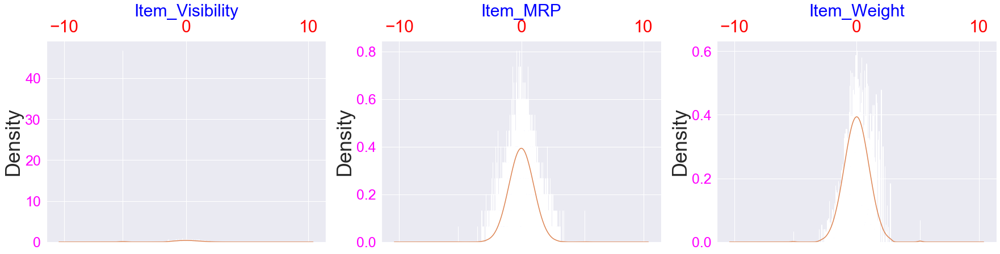

In [325]:
_conti_cols_transformed_data=PPM.get_conti_cols_transformed(conti_cols[1:],train,0.5)
contiUniVEDA.UniVEDA_conti_cols_HIST(conti_cols[1:],_conti_cols_transformed_data)
#train[['Item_MRP','Item_Weight']] = _conti_cols_transformed_data[['Item_MRP','Item_Weight']]

In [326]:
# Observation of Univariate Analysis are
# Item_visibility are right skewed ( lot of outliers) options are nth root or log
# Item_Weight is not  skewed
# Item_MRP is not skewed

# Observation of Univariate Analysis are
# Item_visibility are right skewed ( lot of outliers) options are nth root or log

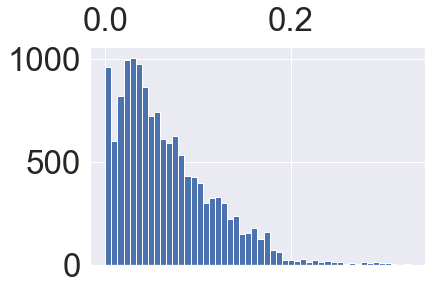

In [327]:
data.Item_Visibility.hist(bins=50)

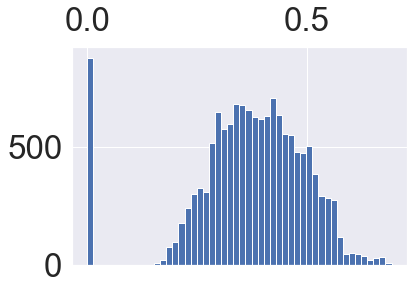

In [328]:
np.power(data.Item_Visibility*1,0.33).hist(bins=50)  
# Addressed using cube root

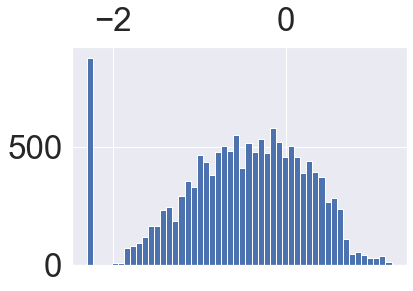

In [329]:
np.log(data.Item_Visibility*10 + 0.1).hist(bins=50)  
# Observe the data is not perfectly become symmetterical after apply log
# Note: 0.1 is added because we have zero observation in this feature , adding constant will change any distribution


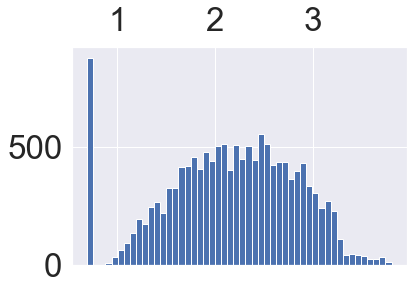

In [330]:
# Let multiple feature by 100 to change the scale
np.log(data.Item_Visibility*130+2).hist(bins=50) 

In [331]:
# Item_Weight

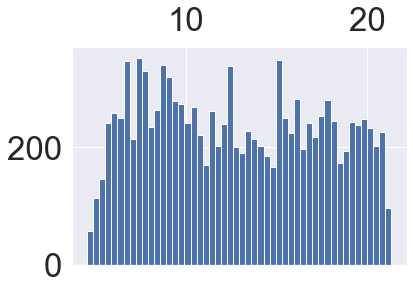

In [332]:
data.Item_Weight.hist(bins=50)

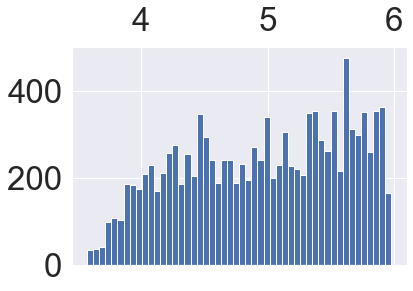

In [333]:
np.power(data.Item_Weight*10,1/3).hist(bins=50)

In [334]:
# Item_MRP

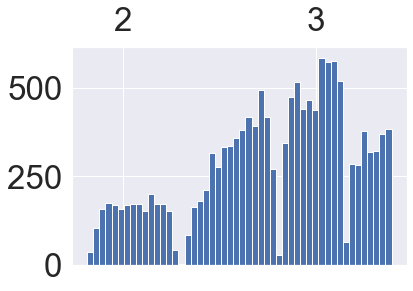

In [335]:
np.log(data.Item_MRP*0.1+3).hist(bins=50)

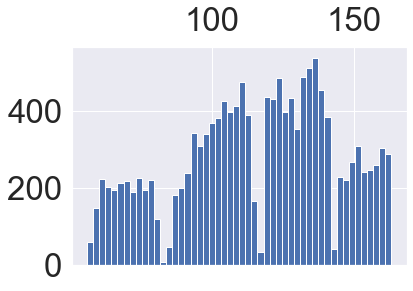

In [336]:
np.power(data.Item_MRP*100,1/2).hist(bins=50)

# Feature transformation  on  Contineous Variable
#### 1.       Should be done after performing Univariate Analysis on  Contineous Variable
#### Note:  Feature Transformation is one of the Feature Engineering technique

In [337]:
"hi"

'hi'

In [338]:
#visibility_avg.head()

In [339]:
# Action 1  on Item_Visibility
# We noticed that the minimum value here is 0, which makes no practical sense. 
# Lets consider it like missing information and impute it with mean visibility of that product.
# Determine average visibility of a product
visibility_avg = data.pivot_table(values='Item_Visibility', index='Item_Identifier')

#Impute 0 values with mean visibility of that product:
miss_bool = (data['Item_Visibility'] == 0)

print ('Number of 0 values initially: %d'%sum(miss_bool))
train.loc[miss_bool,'Item_Visibility'] = train.loc[miss_bool,'Item_Identifier'].apply(lambda x: visibility_avg.Item_Visibility[x])
print ('Number of 0 values after modification: %d'%sum(train['Item_Visibility'] == 0))
conti_num_cols

Number of 0 values initially: 879
Number of 0 values after modification: 0


['Item_Visibility', 'Item_MRP', 'Item_Weight']

In [340]:
#So, let replace the feature with log value
#train['Item_Visibility']=np.power(train.Item_Visibility*1,0.33)

In [341]:
#train['Item_Visibility'].head(3)

Item_Visibility
Item_MRP
Item_Weight
 Lets create Vertical Multi HISTOGRAM plot for column 
['Item_Visibility', 'Item_MRP', 'Item_Weight']


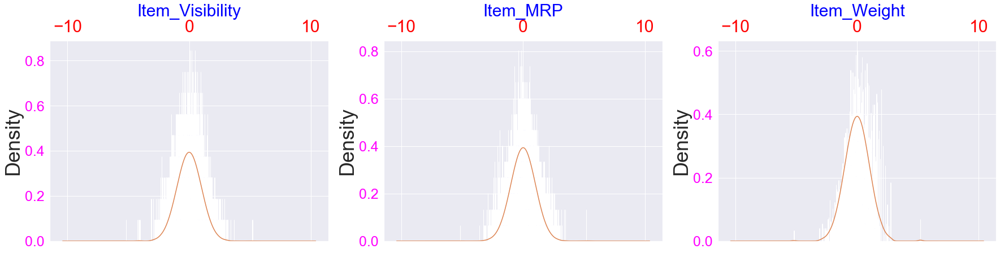

XColumns = ['Item_Visibility', 'Item_MRP', 'Item_Weight'] 




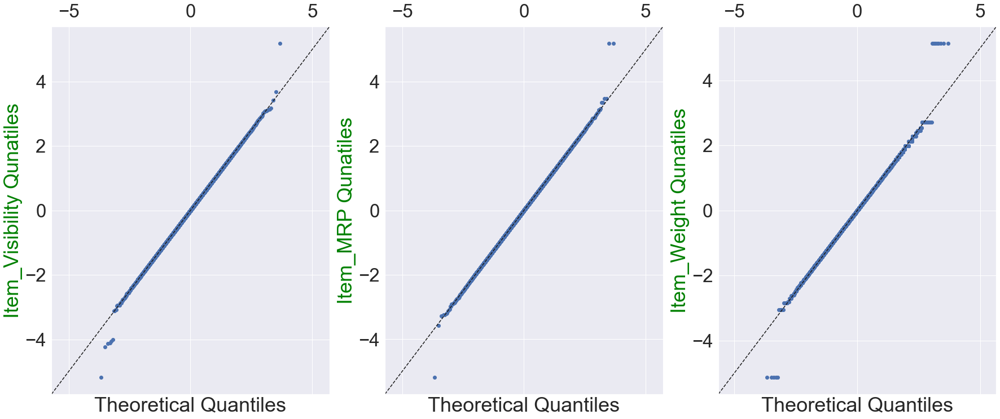

In [342]:
_conti_cols_transformed_data=PPM.get_conti_cols_transformed(conti_cols[1:],train,0.5)
contiUniVEDA.UniVEDA_conti_cols_HIST(conti_cols[1:],_conti_cols_transformed_data)
contiUniVEDA.UniVEDA_conti_cols_QQPLOT(conti_cols[1:],_conti_cols_transformed_data)
#train[['Item_MRP','Item_Weight']] = _conti_cols_transformed_data[['Item_MRP','Item_Weight']]

In [343]:
#contiUniVEDA.UniVEDA_conti_Cols_Multi_Trans_QQPLOT(['Item_Visibility'],train)
train[conti_cols[1:]]=_conti_cols_transformed_data

In [344]:
#contiUniVEDA.UniVEDA_conti_cols_SNS_DIST(conti_cols[1:2],pd.DataFrame(np.power(train.Item_Visibility)))

In [345]:
visibility_avg.head(4)

,Item_Visibility
Item_Identifier,
DRA12,0.034938
DRA24,0.045646
DRA59,0.133384
DRB01,0.079736


In [346]:
# Action 2 on New feature (Item_Visibility) created
data['Item_Visibility_MeanRatio']=data.apply(lambda x: x['Item_Visibility']/visibility_avg.Item_Visibility[x['Item_Identifier']], axis=1)
#Univariate_conti_var_Histogram(conti_cols,data)
#cat_cols = cat_cols + ['Item_Visibility_MeanRatio']
#makeUnivariateCategoricaPlotPIE(cat_cols,data)
#data['Item_Visibility_MeanRatio'].values_count()

In [356]:
# Imputing null value of numberical colls test['Item_Weight'].fillna(-9999)
test['Item_Weight']=test['Item_Weight'].fillna(-9999)

In [357]:
# Transforming test data ( conti columns)

Item_Visibility
Item_MRP
Item_Weight
 Lets create Vertical Multi HISTOGRAM plot for column 
['Item_Visibility', 'Item_MRP', 'Item_Weight']


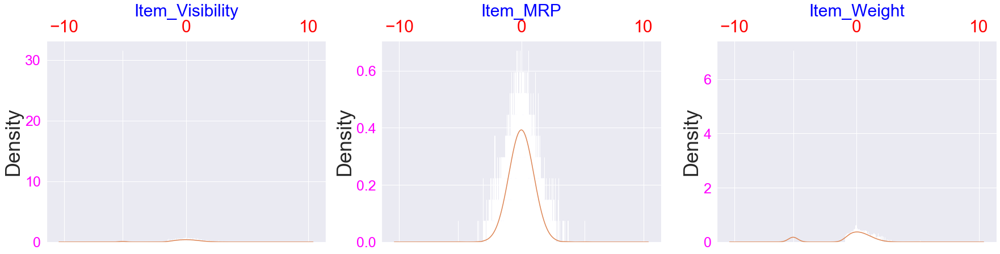

XColumns = ['Item_Visibility', 'Item_MRP', 'Item_Weight'] 




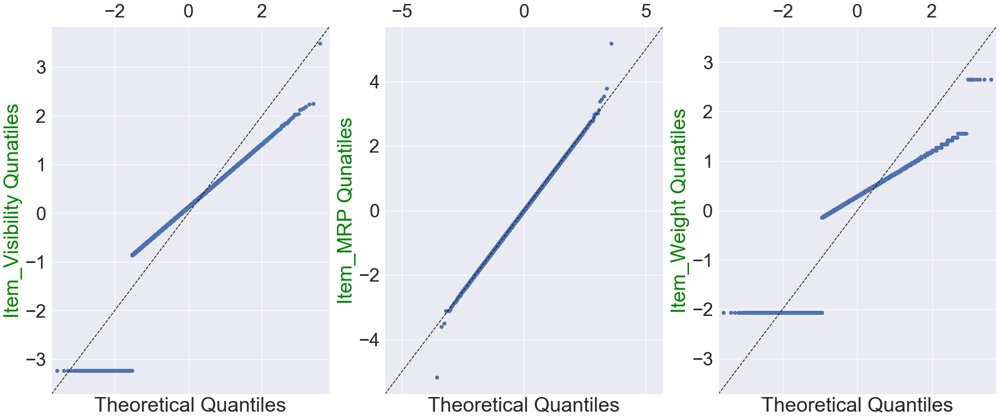

In [358]:
_conti_cols_transformed_data=PPM.get_conti_cols_transformed(conti_cols[1:],test,0.5)
contiUniVEDA.UniVEDA_conti_cols_HIST(conti_cols[1:],_conti_cols_transformed_data)
contiUniVEDA.UniVEDA_conti_cols_QQPLOT(conti_cols[1:],_conti_cols_transformed_data)

In [359]:
test[conti_cols[1:]]=_conti_cols_transformed_data

# 3. Bivariate Analysis 
### Independent categorical columns vs target contineous variable

In [360]:
BiVEDA.getFuncs()


    Use Followind Methods:

        1. BiVEDA_cat_cols_KDEPLOT_over_yConti(cat_col_list, conti_label_colname, DataFrame)
        2. BiVEDA_Conti_cols_over_cat_cols_mean_CheckOrdinality(ContiList, CatList,DataFrame)
        3. BiVEDA_conti_cols_KDEPLOT_over_yCat(conti_col_list, cat_label_colname, DataFrame)
        4. BiVEDA_conti_cols_scatterplot_over_yConti(conti_col,yColumn,df)
        5. Allconti_cols_scatter_over_yConti(conti_ColList,conti_label_name, dataFrame)
        6. Allcols_correlation_heatmap(numeric_colList, dataframe)
        7. BiVEDA_conti_and_cat_cols_SPEARSMAN_CORRELATION_with_yConti(conti_cat_list, yConti_col ,_df)
        8. BiVEDA_cat_cols_IMPACTCHECK_Over_yConti_via_OneWay_anovaTest(Cat_col_list,yConti,frame)
        9. BiVEDA_cat_cols_SNS_FACTOR_over_yConti(conti_col,yColumn,df)
       10. BiVEDA_both_conti_cat_cols_PAIRPLOT_over_yConti(ColList,yConti_column,_df)
       11. All_VEDA_conti_higly_correlation_cols_pairplot_scatterplot(numeric_colList, _df)
       1

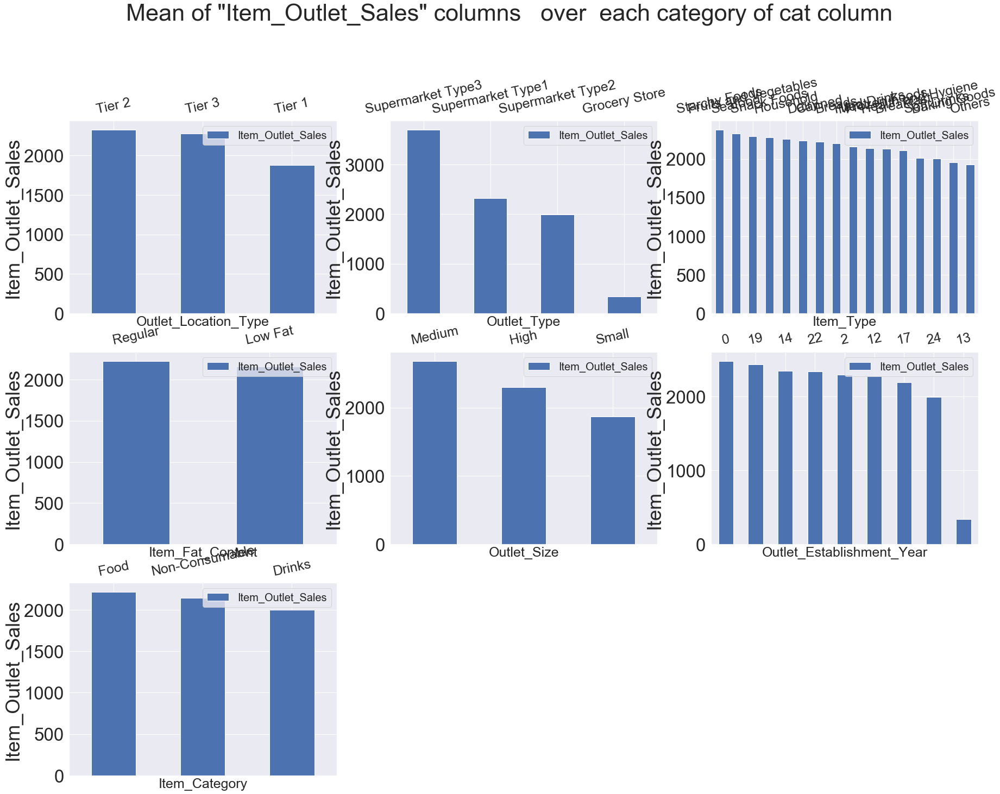

 Bar char for Categorial Columns 
['Outlet_Location_Type', 'Outlet_Type', 'Item_Type', 'Item_Fat_Content', 'Outlet_Size', 'Outlet_Establishment_Year', 'Item_Category']


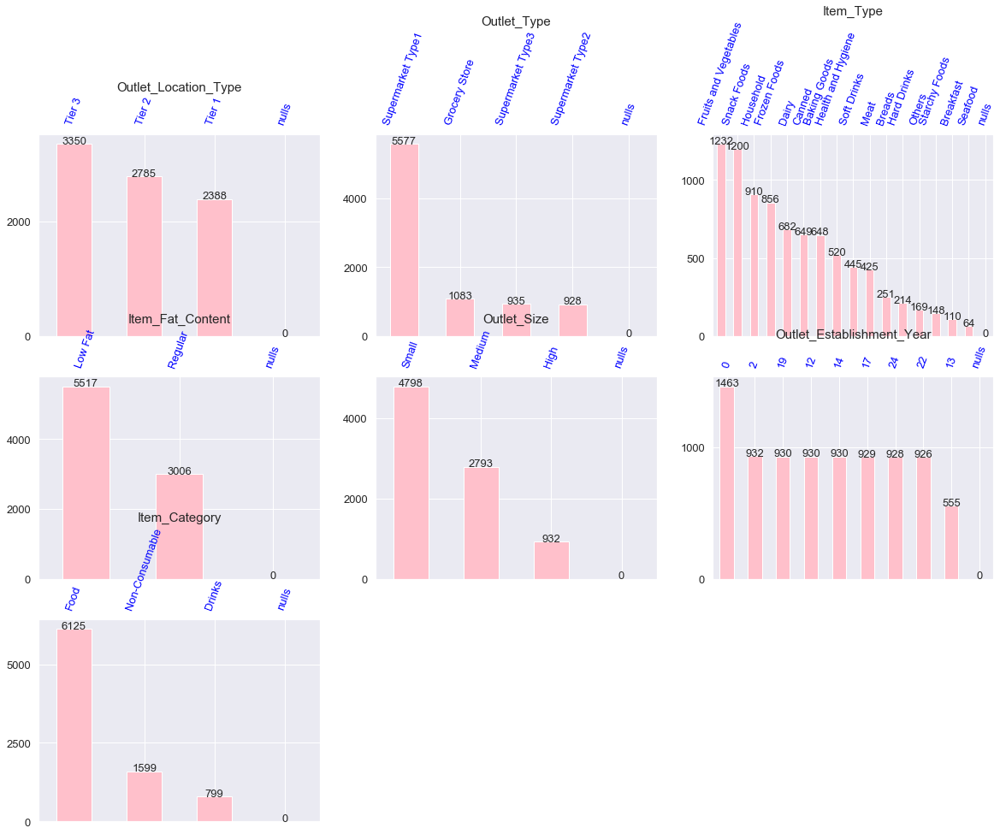

In [361]:
BiVEDA.BiVEDA_cat_cols_BARPLOT_over_yConti_forMean_ofEachCategory(cat_cols,'Item_Outlet_Sales',train)
catUniVEDA.UniVEDA_cat_cols_BAR(cat_cols,train)
#cat_nominal_cols
#train.pivot_table(label_col,index=['Outlet_Size'],aggfunc=np.mean).sort_values([label_col],ascending=True)

# Correlation with Label Column
### We should all the contineous columns which are correlated with label

In [362]:
desc(data)

,dtypes,null_count,total_count,unique_count,missing value ratio,variance of numerics,std,mean,min
Outlet_Location_Type,object,0.0,14204.0,3.0,0%,None,None,None,None
Outlet_Size,object,4016.0,10188.0,3.0,0.28%,None,None,None,None
Outlet_Type,object,0.0,14204.0,4.0,0%,None,None,None,None
Item_Fat_Content,object,0.0,14204.0,5.0,0%,NaN,NaN,NaN,NaN
Outlet_Establishment_Year,int64,0.0,14204.0,9.0,0%,70.0848,8.37166,2009,1985
Outlet_Identifier,object,0.0,14204.0,10.0,0%,None,None,None,None
Item_Type,object,0.0,14204.0,16.0,0%,None,None,None,None
Item_Weight,float64,2439.0,11765.0,415.0,0.17%,21.6458,4.6525,21.35,4.555
Item_Identifier,object,0.0,14204.0,1559.0,0%,NaN,NaN,NaN,NaN
Item_Outlet_Sales,float64,5681.0,8523.0,3493.0,0.4%,2.91214e+06,1706.5,13087,33.29


In [363]:
train_test[['Item_Weight','Item_MRP',label_col,'Item_Visibility']].corr()

,Item_Weight,Item_MRP,Item_Outlet_Sales,Item_Visibility
Item_Weight,1.000000,0.036236,0.014123,-0.015901
Item_MRP,0.036236,1.000000,0.567574,-0.006351
Item_Outlet_Sales,0.014123,0.567574,1.000000,-0.128625
Item_Visibility,-0.015901,-0.006351,-0.128625,1.000000


show Only those correlated columns where correlation> 0.3
['Item_Visibility', 'Item_MRP', 'Item_Weight', 'Item_Outlet_Sales']


 Following highly correlated column Crossing the threashold values(0.5):
                                                ['Item_Outlet_Sales']




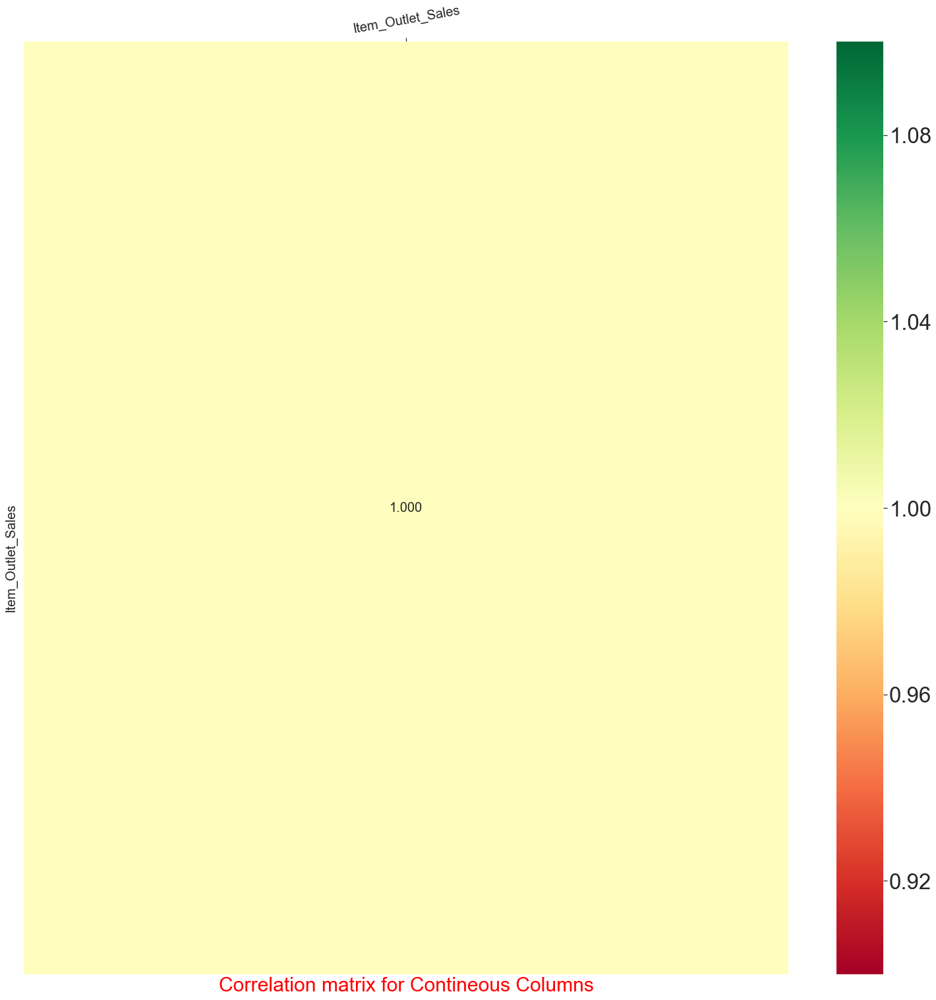

In [364]:
#import seaborn as sns 
BiVEDA.Allcols_correlation_heatmap(conti_cols[1:]+[label_col],train)

# Bivariate Analysis 
### independent Contineous variable and Contineos variable ( label column)

 Lets create Vertical Multi HISTOGRAM plot for column 
['Item_Identifier', 'Item_Visibility', 'Item_MRP', 'Item_Weight']


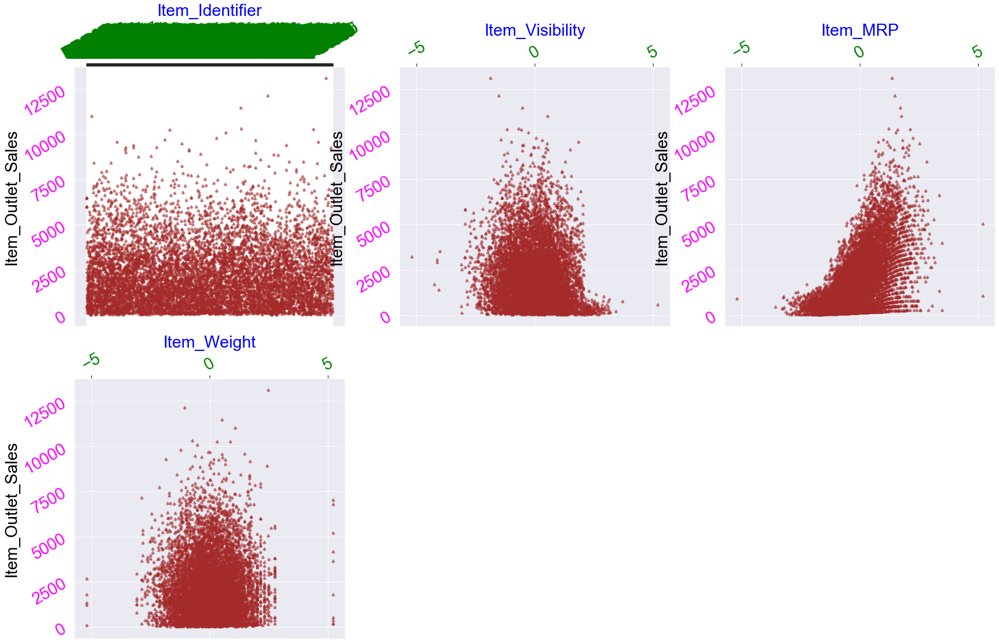

In [365]:
BiVEDA.BiVEDA_conti_cols_scatterplot_over_yConti(conti_cols,label_col,train)

In [366]:
# lets drop columns Item_MRP as it is correlated with label columns sales
#data=data.drop('Item_MRP',1)

In [367]:
#conti_cols.remove('Item_MRP')


# target Variable distribution

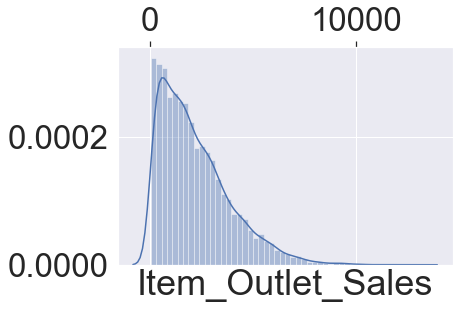

In [368]:
ytrainDF=train.Item_Outlet_Sales[:train.shape[0]]
train=train.drop(['Item_Outlet_Sales'],1)
sns.distplot(ytrainDF)

# 1. Data Preprocessing 

In [369]:
# 1 Dummying the Categorical Cols
cat_nominal_cols

['Outlet_Location_Type', 'Outlet_Type', 'Item_Type', 'Item_Category']

In [370]:
#dummyDF = pd.get_dummies(data[cat_nominal_cols])
#data.shape, dummyDF.shape

In [371]:
#cat_nominal_cols

In [372]:
#data=pd.concat([data,dummyDF], axis=1)

In [373]:
#data.drop(cat_nominal_cols,axis=1, inplace=True)
test.shape,test.columns

((5681, 12),
 Index(['Item_Identifier', 'Item_Weight', 'Item_Fat_Content', 'Item_Visibility',
        'Item_Type', 'Item_MRP', 'Outlet_Identifier',
        'Outlet_Establishment_Year', 'Outlet_Size', 'Outlet_Location_Type',
        'Outlet_Type', 'Item_Category'],
       dtype='object'))

In [374]:
train.shape,train.columns

((8523, 12),
 Index(['Item_Identifier', 'Item_Weight', 'Item_Fat_Content', 'Item_Visibility',
        'Item_Type', 'Item_MRP', 'Outlet_Identifier',
        'Outlet_Establishment_Year', 'Outlet_Size', 'Outlet_Location_Type',
        'Outlet_Type', 'Item_Category'],
       dtype='object'))

# Standardizing Contineos columns

In [375]:
#Univariate_conti_var_Histogram(conti_cols[1:],np.log(data[conti_cols[1:]]))

In [376]:
#data_org=data.copy()
#data_org=data.copy()
#std_scale=StandardScaler()
#scaled = std_scale.fit_transform(np.log(data[conti_cols[1:]]))
#scaled = std_scale.fit_transform(data[conti_cols[1:]])
#scaled = pd.DataFrame(scaled,columns=conti_cols[1:])

#Univariate_conti_var_Histogram(conti_cols[1:],scaled)
#data.drop(conti_cols[1:],axis=1,inplace=True)


In [377]:
#Univariate_conti_var_Histogram(conti_cols[1:],scaled)
#data=pd.concat([data,scaled],1)

#data[['Item_Weight','Item_MRP']]=scaled[['Item_MRP','Item_Visibility']]
#conti_cols

In [378]:
#data.columns

In [379]:
#data_org.columns

In [380]:
#Univariate_conti_var_Histogram(conti_cols,data_org)

In [381]:
#data[['Outlet_Location_Type','Outlet_Type','Item_Type','Item_Category']].head(5)

In [382]:
#data=pd.concat([data,scaled],axis=1)
#data.shape,data_org.shape
#data[cat_cols].head(6)

In [383]:
desc(train)

,dtypes,null_count,total_count,unique_count,missing value ratio,variance of numerics,std,mean,min
Item_Fat_Content,object,0.0,8523.0,2.0,0%,None,None,None,None
Outlet_Size,object,0.0,8523.0,3.0,0%,None,None,None,None
Outlet_Location_Type,object,0.0,8523.0,3.0,0%,None,None,None,None
Item_Category,object,0.0,8523.0,3.0,0%,None,None,None,None
Outlet_Type,object,0.0,8523.0,4.0,0%,None,None,None,None
Outlet_Establishment_Year,int64,0.0,8523.0,9.0,0%,70.0864,8.37176,24,0
Outlet_Identifier,object,0.0,8523.0,10.0,0%,None,None,None,None
Item_Type,object,0.0,8523.0,16.0,0%,None,None,None,None
Item_Weight,float64,0.0,8523.0,606.0,0%,1.02627,1.01305,5.19934,-5.19934
Item_Identifier,object,0.0,8523.0,1559.0,0%,NaN,NaN,NaN,NaN


# Feature Engineering

In [384]:
data_org1=train.copy()

In [385]:
#train=data_org1.copy()

In [386]:
dict1={}
#data_org1[cat_cols].head()
Outlet_Identifier_Item_type_AvgMRP=data[['Outlet_Identifier','Item_Type','Item_MRP']].groupby(['Outlet_Identifier','Item_Type']).mean()
Outlet_Identifier_Item_type_AvgMRP=Outlet_Identifier_Item_type_AvgMRP.reset_index()
Outlet_Identifier_Item_type_AvgMRP.iloc[0]
for i in range(len(Outlet_Identifier_Item_type_AvgMRP)):
    iv1=Outlet_Identifier_Item_type_AvgMRP.iloc[i][0]
    iv2=Outlet_Identifier_Item_type_AvgMRP.iloc[i][1]
    mergedIV=iv1+iv2
    dict1[mergedIV]=Outlet_Identifier_Item_type_AvgMRP.iloc[i][2].round(0)
train['newMRP']=train[['Item_Type','Outlet_Identifier']].apply(lambda x: dict1[x.Outlet_Identifier + x.Item_Type], axis=1)
# #x[x['Item_Type']=='Baking Goods']#.drop_duplicates()

In [387]:
test['newMRP']=test[['Item_Type','Outlet_Identifier']].apply(lambda x: dict1[x.Outlet_Identifier + x.Item_Type], axis=1)

In [388]:
# featuretools for automated feature engineering
import featuretools as ft

# create Empty Entity set with id applications
es = ft.EntitySet(id = 'clients')

# Lets add add dataset to empty dataset
es.entity_from_dataframe(entity_id = 'app', dataframe = train, index = 'index') #variable_types = app_types
#make_index=True
es

# use DFS-Deep Feature Synthesis to create to new features
# It return two things ( feature list and feature definations)
feature_list, feature_defs = ft.dfs(entityset=es, target_entity='app',max_depth=2,
                                   trans_primitives=['add_numeric','multiply_numeric'])
#print(feature_defs)
#feature_list.head(10)

# xfeature_list = feature_list[:train.shape[0]]
# yfeature_list = feature_list[train.shape[0]:]

2020-03-18 14:09:23,531 featuretools.entityset - WARNING    index index not found in dataframe, creating new integer column


In [389]:
desc(test)

,dtypes,null_count,total_count,unique_count,missing value ratio,variance of numerics,std,mean,min
Item_Fat_Content,object,0.0,5681.0,2.0,0%,None,None,None,None
Outlet_Location_Type,object,0.0,5681.0,3.0,0%,None,None,None,None
Item_Category,object,0.0,5681.0,3.0,0%,None,None,None,None
Outlet_Size,object,1606.0,4075.0,3.0,0.28%,None,None,None,None
Outlet_Type,object,0.0,5681.0,4.0,0%,None,None,None,None
Outlet_Establishment_Year,int64,0.0,5681.0,9.0,0%,70.0947,8.37226,24,0
Outlet_Identifier,object,0.0,5681.0,10.0,0%,None,None,None,None
Item_Type,object,0.0,5681.0,16.0,0%,None,None,None,None
newMRP,float64,0.0,5681.0,26.0,0%,43.7754,6.6163,160,122
Item_Weight,float64,0.0,5681.0,427.0,0%,4.85499,2.2034,5.19934,-5.19934


In [390]:
# featuretools for automated feature engineering
import featuretools as ft

# create Empty Entity set with id applications
es = ft.EntitySet(id = 'clients')

# Lets add add dataset to empty dataset
es.entity_from_dataframe(entity_id = 'app', dataframe = test, index = 'index') #variable_types = app_types
#make_index=True
es

# use DFS-Deep Feature Synthesis to create to new features
# It return two things ( feature list and feature definations)
feature_list_test, feature_defs_test = ft.dfs(entityset=es, target_entity='app',max_depth=2,
                                   trans_primitives=['add_numeric','multiply_numeric'])
#print(feature_defs)
#feature_list.head(10)

# xfeature_list = feature_list[:train.shape[0]]
# yfeature_list = feature_list[train.shape[0]:]

2020-03-18 14:09:24,422 featuretools.entityset - WARNING    index index not found in dataframe, creating new integer column


In [391]:
feature_list.shape,feature_list_test.shape

((8523, 128), (5681, 128))

In [392]:
train['Item_Category'].head()

0              Food
1            Drinks
2              Food
3              Food
4    Non-Consumable
Name: Item_Category, dtype: object

In [393]:


# get dummies
nomi_cols=['Outlet_Location_Type','Outlet_Type','Item_Type','Item_Category']
dummies_data=pd.get_dummies(train[nomi_cols])
train = train.drop(nomi_cols,1)
train=pd.concat([train,dummies_data], axis=1)



In [394]:
dummies_data=pd.get_dummies(test[nomi_cols])
test = test.drop(nomi_cols,1)
test=pd.concat([test,dummies_data], axis=1)

In [395]:
data.head(5)

,Item_Fat_Content,Item_Identifier,Item_MRP,Item_Outlet_Sales,Item_Type,Item_Visibility,Item_Weight,Outlet_Establishment_Year,Outlet_Identifier,Outlet_Location_Type,Outlet_Size,Outlet_Type,Item_Visibility_MeanRatio
0,Low Fat,FDA15,249.8092,3735.1380,Dairy,0.016047,9.30,1999,OUT049,Tier 1,Medium,Supermarket Type1,0.931078
1,Regular,DRC01,48.2692,443.4228,Soft Drinks,0.019278,5.92,2009,OUT018,Tier 3,Medium,Supermarket Type2,0.933420
2,Low Fat,FDN15,141.6180,2097.2700,Meat,0.016760,17.50,1999,OUT049,Tier 1,Medium,Supermarket Type1,0.960069
3,Regular,FDX07,182.0950,732.3800,Fruits and Vegetables,0.000000,19.20,1998,OUT010,Tier 3,NaN,Grocery Store,0.000000
4,Low Fat,NCD19,53.8614,994.7052,Household,0.000000,8.93,1987,OUT013,Tier 3,High,Supermarket Type1,0.000000


In [396]:
# get dummies
nomi_cols=['Outlet_Location_Type','Outlet_Type','Item_Type','Item_Category']
dummies_data=pd.get_dummies(feature_list[nomi_cols])
feature_data = feature_list.drop(nomi_cols,1)
feature_data=pd.concat([feature_data,dummies_data], axis=1)


In [397]:
feature_data.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,newMRP,Item_MRP + Item_Weight,...,Item_Type_Household,Item_Type_Meat,Item_Type_Others,Item_Type_Seafood,Item_Type_Snack Foods,Item_Type_Soft Drinks,Item_Type_Starchy Foods,Item_Category_Drinks,Item_Category_Food,Item_Category_Non-Consumable
index,,,,,,,,,,,,,,,,,,,,,
0,FDA15,-0.533636,Low Fat,-1.377376,1.621246,OUT049,14,Medium,148.0,1.087611,...,0,0,0,0,0,0,0,0,1,0
1,DRC01,-1.666592,Regular,-1.210137,-1.403337,OUT018,24,Medium,135.0,-3.069929,...,0,0,0,0,0,1,0,1,0,0
2,FDN15,0.769761,Low Fat,-1.334206,-0.020677,OUT049,14,Medium,141.0,0.749084,...,0,1,0,0,0,0,0,0,1,0
3,FDX07,1.207532,Regular,-1.279875,0.605460,OUT010,13,Small,139.0,1.812992,...,0,0,0,0,0,0,0,0,1,0
4,NCD19,-0.634851,Low Fat,-1.986493,-1.256329,OUT013,2,High,150.0,-1.891180,...,1,0,0,0,0,0,0,0,0,1


In [398]:
data.shape

(14204, 13)

# Label Encoding cat cols

In [399]:
train['Outlet_Size']=train['Outlet_Size'].map({'Small':1,
                         'Medium':2,
                         'High':3})
test['Outlet_Size']=test['Outlet_Size'].map({'Small':1,
                         'Medium':2,
                         'High':3,
                          np.nan:-9999})

In [400]:
train.head()

,index,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,newMRP,...,Item_Type_Household,Item_Type_Meat,Item_Type_Others,Item_Type_Seafood,Item_Type_Snack Foods,Item_Type_Soft Drinks,Item_Type_Starchy Foods,Item_Category_Drinks,Item_Category_Food,Item_Category_Non-Consumable
0,0,FDA15,-0.533636,Low Fat,-1.377376,1.621246,OUT049,14,2,148.0,...,0,0,0,0,0,0,0,0,1,0
1,1,DRC01,-1.666592,Regular,-1.210137,-1.403337,OUT018,24,2,135.0,...,0,0,0,0,0,1,0,1,0,0
2,2,FDN15,0.769761,Low Fat,-1.334206,-0.020677,OUT049,14,2,141.0,...,0,1,0,0,0,0,0,0,1,0
3,3,FDX07,1.207532,Regular,-1.279875,0.605460,OUT010,13,1,139.0,...,0,0,0,0,0,0,0,0,1,0
4,4,NCD19,-0.634851,Low Fat,-1.986493,-1.256329,OUT013,2,3,150.0,...,1,0,0,0,0,0,0,0,0,1


In [401]:
# ecoding "Item_Fat_Content" columns

In [402]:
train['Item_Fat_Content']=train['Item_Fat_Content'].map({'Low Fat':1,
                         'Regular':2,
                         np.nan:-9999})
test['Item_Fat_Content']=test['Item_Fat_Content'].map({'Low Fat':1,
                         'Regular':2,
                         np.nan:-9999})

In [403]:
# "Item_Weight" contais null values

In [404]:
#data_org=data.copy()

In [405]:
# conti_cols
# train=train.drop(['Outlet_Identifier'],1)
# test=test.drop(['Outlet_Identifier'],1)


In [406]:
conti_cols
train=train.drop(['Item_Identifier','Outlet_Identifier'],1)
test=test.drop(['Item_Identifier','Outlet_Identifier'],1)


In [407]:
desc(test)

,dtypes,null_count,total_count,unique_count,missing value ratio,variance of numerics,std,mean,min
Item_Fat_Content,int64,0.0,5681.0,2.0,0%,0.228823,0.478355,2,1
Outlet_Location_Type_Tier 1,uint8,0.0,5681.0,2.0,0%,None,None,None,None
Outlet_Location_Type_Tier 2,uint8,0.0,5681.0,2.0,0%,None,None,None,None
Outlet_Location_Type_Tier 3,uint8,0.0,5681.0,2.0,0%,None,None,None,None
Outlet_Type_Grocery Store,uint8,0.0,5681.0,2.0,0%,None,None,None,None
Outlet_Type_Supermarket Type1,uint8,0.0,5681.0,2.0,0%,None,None,None,None
Outlet_Type_Supermarket Type2,uint8,0.0,5681.0,2.0,0%,None,None,None,None
Outlet_Type_Supermarket Type3,uint8,0.0,5681.0,2.0,0%,None,None,None,None
Item_Type_Baking Goods,uint8,0.0,5681.0,2.0,0%,None,None,None,None
Item_Type_Breads,uint8,0.0,5681.0,2.0,0%,None,None,None,None


In [408]:
train.shape,test.shape

((8523, 34), (5681, 34))

In [409]:
#data[train.shape[0]:].head(1)

In [410]:
#trainDF=data[:train.shape[0]]
#Train_feature_data=feature_data[:train.shape[0]]

In [411]:
#testDF=data[train.shape[0]:]
#test_org=data_org[train.shape[0]:]
#Test_feature_data=feature_data[train.shape[0]:]

In [412]:
#data[train.shape[0]:].head(1)
#testDF.head()

In [413]:
#data_org=data.copy()
#data=data.drop(['Item_Identifier'],1)

In [414]:
#trainDF.shape,testDF.shape,ytrainDF.shape

In [415]:
#Train_feature_data.shape,Test_feature_data.shape

# 4. Model Building

In [416]:
# Bench mark Score
#Mean based:
mean_sales = ytrainDF.mean()
print("Mean sale of Train Data = %0.2f" %mean_sales)
#Define a dataframe with IDs for submission:
base1 = train_org[['Item_Identifier','Outlet_Identifier']]
base1['Item_Outlet_Sales'] = mean_sales

Mean sale of Train Data = 2181.29


In [417]:
pred_all=pd.DataFrame()
pred_all_test=pd.DataFrame()
def generate_submission_file(submission_csv_name,model,org_test,cleaned_test):
    y_pred = model.predict(cleaned_test)

#Export submission file:
    org_test['Item_Outlet_Sales']=y_pred
    submission=org_test[['Item_Identifier','Outlet_Identifier','Item_Outlet_Sales']]
    submission.to_csv(submission_csv_name, index=False)
    return y_pred
def getTranindDataPrediction(model,yTrainingData):
    y_pred = model.predict(yTrainingData)
    return pd.Series(y_pred)
def generate_submission_file_avg(submission_csv_name,org_test,yAvgPred):
#Export submission file:
    org_test['Item_Outlet_Sales']=yAvgPred
    submission=org_test[['Item_Identifier','Outlet_Identifier','Item_Outlet_Sales']]
    submission.to_csv(submission_csv_name, index=False)
    return yAvgPred

In [418]:
#trainDF.shape,testDF.shape,ytrainDF.shape,label_col

In [419]:
train.columns

Index(['index', 'Item_Weight', 'Item_Fat_Content', 'Item_Visibility',
       'Item_MRP', 'Outlet_Establishment_Year', 'Outlet_Size', 'newMRP',
       'Outlet_Location_Type_Tier 1', 'Outlet_Location_Type_Tier 2',
       'Outlet_Location_Type_Tier 3', 'Outlet_Type_Grocery Store',
       'Outlet_Type_Supermarket Type1', 'Outlet_Type_Supermarket Type2',
       'Outlet_Type_Supermarket Type3', 'Item_Type_Baking Goods',
       'Item_Type_Breads', 'Item_Type_Breakfast', 'Item_Type_Canned',
       'Item_Type_Dairy', 'Item_Type_Frozen Foods',
       'Item_Type_Fruits and Vegetables', 'Item_Type_Hard Drinks',
       'Item_Type_Health and Hygiene', 'Item_Type_Household', 'Item_Type_Meat',
       'Item_Type_Others', 'Item_Type_Seafood', 'Item_Type_Snack Foods',
       'Item_Type_Soft Drinks', 'Item_Type_Starchy Foods',
       'Item_Category_Drinks', 'Item_Category_Food',
       'Item_Category_Non-Consumable'],
      dtype='object')

In [420]:

def ScoringSGB(_conti_cols,_xtraining_DF,_ytraining_DF,_offsetPercetage=15):
    
    import xgboost as xgb
    #from xgboost import XGBRegressor
    from sklearn.utils import shuffle
    x,y=shuffle(_xtraining_DF[_conti_cols],_ytraining_DF,random_state=30)
    
    offset=int(_xtraining_DF.shape[0]*_offsetPercetage/100)

    xxtrain=x[:offset]
    xytrain=y[:offset]

    xxtest=x[offset:]
    xytest=y[offset:]

    xxtrain=_xtraining_DF
    xytrain=_ytraining_DF
    param_grid = {
        # Parameters that we are going to tune.
        'min_child_weight': [i for i in range(1,150,2)],
        'subsample': np.linspace(0.1,1,10),
        'colsample_bytree': np.linspace(0.1,5,10),
        'n_estimators' : [i for i in range(50,500,50)],
        'objective':['reg:linear','reg:tweedie','reg:gamma'],
        'max_depth' :[i for i in range(1,15,2)],
        'learning_rate': np.linspace(0.01,0.4,30),
        "min_child_weight" : [ 1, 3, 5, 7 ],
        "gamma"            : np.linspace(0.01,0.4,30) +[0],
        "colsample_bytree" : [ 0.3, 0.4, 0.5 , 0.7 ],
        "reg_alpha":np.linspace(0.01,100,100),
        "reg_lambda":np.linspace(0.01,100,100),
        'silent':[1]
    }
    XGBReg_estimator = xgb.XGBRegressor()
    print(XGBReg_estimator.get_params().keys())
    grid_search = RandomizedSearchCV(XGBReg_estimator, param_grid, scoring="neg_mean_squared_error", n_jobs=-1, cv=5,n_iter=30)
    grid_result = grid_search.fit(xxtrain, xytrain)
    print("\n \n \n Best: %f using %s" % (np.sqrt(-1*grid_result.best_score_), grid_result.best_params_))

#     from sklearn.metrics import mean_squared_error

#     ptest=grid_result.best_estimator_.predict(xxtest)
#     xytest1=xytest.reset_index()[label_col]
#     print('testScore=',np.sqrt(mean_squared_error(ptest,xytest1)))

#     ptrain=grid_result.best_estimator_.predict(xxtrain)
#     xytrain1=xytrain.reset_index()[label_col]
#     print('trainScore=',np.sqrt(mean_squared_error(ptrain,xytrain1)))
    imp_feature=grid_result.best_estimator_.feature_importances_
    best_params=grid_result.best_params_
    def featureImportance_BAR(_imp_features,_df1):
        _df=pd.DataFrame({'rank_value':imp_feature,'feature_name':_df1.columns},index=_df1.columns).sort_values('rank_value',ascending=False)
        _df=_df[_df['rank_value']>0.0]
        #print(_df.tail())
        _df.plot.bar(figsize=(18,3),fontsize=12,color='red')
        print('Total Columns=',len(_df1))
        print('Number_of_good_columns=',len(_df))
        return _df.index
    goodcols=featureImportance_BAR(imp_feature,xxtrain)
    return (grid_result,goodcols,_conti_cols)


In [421]:
def getDT_and_RF_Score(_conti_cols_,_xTrainingData,_yTrainingData,algo='RF'):    
    from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
    from sklearn.ensemble import GradientBoostingRegressor,RandomForestRegressor
    from sklearn.tree import DecisionTreeRegressor
    
    _xTrainingData=_xTrainingData[_conti_cols_]
    def featureImportance_BAR(_imp_features,_df1):
        _df=pd.DataFrame({'rank_value':imp_feature,'feature_name':_df1.columns},index=_df1.columns).sort_values('rank_value',ascending=False)
        _df=_df[_df['rank_value']>0.0]
        #print(_df.tail())
        _df.plot.bar(figsize=(18,3),fontsize=12,color='red')
        print('Total Columns=',len(_df1.columns))
        print('Number_of_good_columns=',len(_df))
        return _df.index
    
    if algo == 'DT':
        # Decision_Tree_param_grid 
        Decision_Tree_param_grid = {
                      "criterion": ["mse"],
                      "min_samples_split": [i for i in range(3,200,3)],
                      "max_depth":  [i for i in range(2,100,3)],
                      "min_samples_leaf": [i for i in range(2,200,2)],
                      "max_leaf_nodes": [i for i in range(2,200,1)],
                      "max_features": [i for i in range(2,len(_xTrainingData.columns),2)]
                      }
        dt_model= DecisionTreeRegressor(random_state=46)
        dt_estimator = RandomizedSearchCV(estimator = dt_model, param_distributions = Decision_Tree_param_grid, n_iter = 100, cv = 8,
                                       verbose=0, random_state=42, n_jobs = -1,scoring='neg_mean_squared_error')
        dt_estimator.fit(_xTrainingData,_yTrainingData)
        print("\nDecision Tree Best Score: %f using following param\n\n %s" % (np.sqrt(-1*dt_estimator.best_score_),dt_estimator.best_params_))

        imp_feature=dt_estimator.best_estimator_.feature_importances_
        goodcols=featureImportance_BAR(imp_feature,_xTrainingData)     
        return (dt_estimator, goodcols, _conti_cols_)
    elif algo=='RF':  
        # Random Forest Grid
        Random_forest_random_grid = {
                      'n_estimators': [i for i in range(3,1000,3)],
                      "max_features": [i for i in range(4,len(_xTrainingData.columns),5)]+['sqrt','auto'],
                      "min_samples_split": [i for i in range(3,1000,3)],
                      "max_depth":  [i for i in range(1,300,3)],
                      "min_samples_leaf": [i for i in range(1,400,3)],
                      "max_leaf_nodes": [i for i in range(1,1000,3)],
                      "max_features": ['auto', 'sqrt', 'log2'],
                       }
        rf_model= RandomForestRegressor()
        rf_estimator = RandomizedSearchCV(estimator = rf_model, param_distributions = Random_forest_random_grid, n_iter = 50, cv = 8,
                                       verbose=2, random_state=42, n_jobs = -1,scoring='neg_mean_squared_error')
        rf_estimator.fit(_xTrainingData,_yTrainingData)

        print("\nRandom Forest Best score: %f using following param\n\n %s" % (np.sqrt(-1*rf_estimator.best_score_), rf_estimator.best_params_))
        imp_feature=rf_estimator.best_estimator_.feature_importances_
  
        goodcols=featureImportance_BAR(imp_feature,_xTrainingData)
        return (rf_estimator,goodcols,_conti_cols_)



In [422]:
train.head(4)

,index,Item_Weight,Item_Fat_Content,Item_Visibility,Item_MRP,Outlet_Establishment_Year,Outlet_Size,newMRP,Outlet_Location_Type_Tier 1,Outlet_Location_Type_Tier 2,...,Item_Type_Household,Item_Type_Meat,Item_Type_Others,Item_Type_Seafood,Item_Type_Snack Foods,Item_Type_Soft Drinks,Item_Type_Starchy Foods,Item_Category_Drinks,Item_Category_Food,Item_Category_Non-Consumable
0,0,-0.533636,1,-1.377376,1.621246,14,2,148.0,1,0,...,0,0,0,0,0,0,0,0,1,0
1,1,-1.666592,2,-1.210137,-1.403337,24,2,135.0,0,0,...,0,0,0,0,0,1,0,1,0,0
2,2,0.769761,1,-1.334206,-0.020677,14,2,141.0,1,0,...,0,1,0,0,0,0,0,0,1,0
3,3,1.207532,2,-1.279875,0.605460,13,1,139.0,0,0,...,0,0,0,0,0,0,0,0,1,0


In [423]:
test['Item_Weight'].notna().sum()

5681

dict_keys(['base_score', 'booster', 'colsample_bylevel', 'colsample_bytree', 'gamma', 'learning_rate', 'max_delta_step', 'max_depth', 'min_child_weight', 'missing', 'n_estimators', 'n_jobs', 'nthread', 'objective', 'random_state', 'reg_alpha', 'reg_lambda', 'scale_pos_weight', 'seed', 'silent', 'subsample'])

 
 
 Best: 1077.484535 using {'subsample': 1.0, 'silent': 1, 'reg_lambda': 84.85000000000001, 'reg_alpha': 9.1, 'objective': 'reg:gamma', 'n_estimators': 450, 'min_child_weight': 5, 'max_depth': 1, 'learning_rate': 0.1713793103448276, 'gamma': 0.31931034482758625, 'colsample_bytree': 0.7}
Total Columns= 8523
Number_of_good_columns= 9


array([1656.6652, 1356.4354,  592.9211, ..., 1909.6014, 3529.    ,
       1310.8356], dtype=float32)

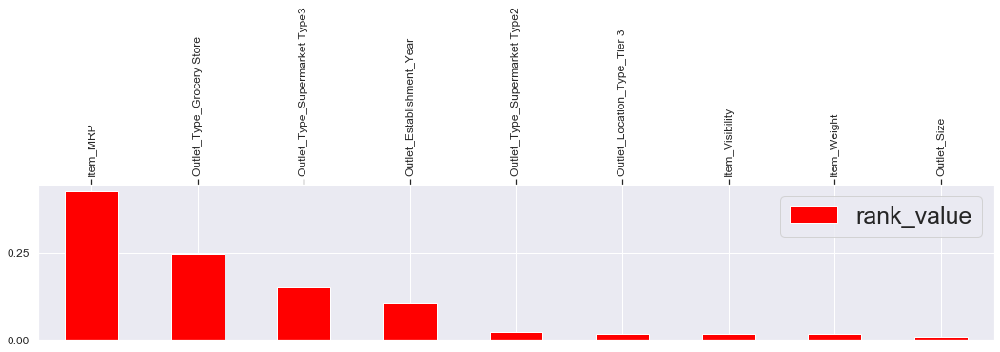

In [427]:
# model_dt,goodcols_dt,orig_cols=getDT_and_RF_Score(train.columns,train,ytrainDF,'DT')
# generate_submission_file('DT_AV_BigMartSale_v1.csv',model_dt,test_org,test)
# model_rf,goodcols_dt,orig_cols=getDT_and_RF_Score(train.columns,train,ytrainDF,'RF')
# generate_submission_file('RF_AV_BigMartSale_v1.csv',model_rf,test_org,test)
#_model_xgb,_goodcols,org_cols=ScoringSGB(train.columns,train,ytrainDF)
#generate_submission_file('xgb_AV_BigMartSale_v1.csv',_model_xgb,test_org,test)

In [481]:
all_test_pred=pd.DataFrame()
all_train_pred=pd.DataFrame()
jj='pred'
j=0
for i in [model_dt,model_rf,_model_xgb]:
    ptest=i.predict(test)
    ptrain=i.predict(train)
    all_test_pred[jj+str(j)]=ptest
    all_train_pred[jj+str(j)]=ptrain
    j=j+1
#generate_submission_file_avg('AVG_PRED.csv',test_org,all_test_pred.mean(1))

In [618]:
from sklearn.ensemble import BaggingRegressor
#alg3 = DecisionTreeRegressor(max_depth=15, min_samples_split=100)
ensemble = BaggingRegressor(base_estimator=model_rf,
                                bootstrap=True,
                                random_state=54,
                                n_estimators = 20,n_jobs=-1,
                                verbose=2).fit( train, ytrainDF)

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


ValueError: max_leaf_nodes 1 must be either None or larger than 1

In [ ]:
#_model1,_goodcols1,_orig_cols1=ScoringSGB(trainDF.columns,trainDF,ytrainDF)
generate_submission_file('xgbRegBagging_AV_BigMartSale.csv',ensemble,test_org,test)

In [614]:
from sklearn.metrics import mean_squared_error
all_test_pred
all_train_pred
w=[.2,.3,.5]
all_train_pred1=all_train_pred.copy()
all_train_pred1['pred0']=all_train_pred['pred0']*0.1
all_train_pred1['pred1']=all_train_pred['pred1']*0.5
all_train_pred1['pred2']=all_train_pred['pred2']*0.4
newMean=pd.DataFrame()
print(np.sqrt(mean_squared_error(all_train_pred1.mean(1),ytrainDF)))
j=0
for i in all_train_pred.columns:
    #print(i)
    print(np.sqrt(mean_squared_error(all_train_pred[i],ytrainDF)))
    j=j+1


2011.8290765779655
1070.7072466292236
1042.3778490574139
1067.025305352642


In [601]:
1070.7 + 1042.3 + 1067.0

3180.0

In [491]:
1070.7/3180.0,1042.3/3180.0,1067.0/3180.0

(0.33669811320754717, 0.32776729559748424, 0.33553459119496853)

In [468]:
all_train_pred.head()

,pred0,pred1,pred2
0,8.636460,2.253773,0.195847
1,1.348340,0.389868,0.032964
2,4.105708,1.262570,0.105117
3,0.965236,0.261301,0.023849
4,1.950618,0.467763,0.046111


In [ ]:
all_test_pred=pd.DataFrame()
all_train_pred=pd.DataFrame()

# Linear regularization
##### Ridge Regression, which penalizes sum of squared coefficients (L2 penalty).
##### Lasso Regression, which penalizes the sum of absolute values of the coefficients (L1 penalty).
##### Elastic Net, a convex combination of Ridge and Lasso.

In [116]:
from sklearn.linear_model import SGDRegressor,LinearRegression,Ridge,Lasso,ElasticNet
from sklearn.ensemble import GradientBoostingRegressor,RandomForestRegressor,AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor

In [117]:

def createModelDict(n_esti=130,learnRate=0.3,rnd_state=46,minleaf=60,minsample=32):
    model_dict={} 
    model_dict['Ada_boost_regressor']=AdaBoostRegressor(DecisionTreeRegressor(max_depth=1, min_samples_leaf=minleaf,min_samples_split=minsample),n_estimators=n_esti, learning_rate=learnRate,random_state=rnd_state)
    model_dict['random_forest_regressor']=RandomForestRegressor(n_estimators=n_esti,max_depth=15,  min_samples_split=32,min_samples_leaf=60,n_jobs=-1,random_state=rnd_state)
    model_dict['decision_tree_regressor']=DecisionTreeRegressor(max_depth=15, min_samples_split=32,min_samples_leaf=60,random_state=rnd_state)
    model_dict['linear_regression']=LinearRegression()
    model_dict['stochastic_gradientDescent_regressor']=SGDRegressor(random_state=rnd_state)
    model_dict['ridge_regularization']=Ridge() 
    model_dict['lasso_regularization']=Lasso()
    model_dict['elasticNet_regularization']=ElasticNet() 
    model_dict['gradient_boosting_regressor']=GradientBoostingRegressor(n_estimators=n_esti, max_depth=5,min_samples_split=minleaf,min_samples_leaf=minsample,learning_rate=learnRate, loss='ls',random_state=rnd_state)
    return model_dict
model_dict=createModelDict()

def createRandomSearchCV_iterDict():
    RandomSearchCV_iterDict={} 
    RandomSearchCV_iterDict['Ada_boost_regressor']=40
    RandomSearchCV_iterDict['random_forest_regressor']=40
    RandomSearchCV_iterDict['decision_tree_regressor']=100
    RandomSearchCV_iterDict['linear_regression']=500
    RandomSearchCV_iterDict['stochastic_gradientDescent_regressor']=100
    RandomSearchCV_iterDict['ridge_regularization']=100
    RandomSearchCV_iterDict['lasso_regularization']=100
    RandomSearchCV_iterDict['elasticNet_regularization']=100
    RandomSearchCV_iterDict['gradient_boosting_regressor']=50
    return RandomSearchCV_iterDict
model_dict=createModelDict()

In [118]:
[i for i in range(70,1000,200)]

[70, 270, 470, 670, 870]

In [119]:
model_type_wise_hyperParams_grid_dict={}
# 6 Decision_Tree_param_grid 
Decision_Tree_param_grid = {"criterion": ["mse"],
              "min_samples_split": [i for i in range(4,500,50)],
              "max_depth":  [i for i in range(4,500,50)],
              "min_samples_leaf": [i for i in range(4,500,50)],
              "max_leaf_nodes": [i for i in range(4,500,50)]
              }
model_type_wise_hyperParams_grid_dict['decision_tree_regressor']=Decision_Tree_param_grid


# 8.Gradient_booster_random_grid


Gradient_booster_random_grid = {
               'max_features': ['ls', 'lad', 'huber', 'quantile'],
               'learning_rate': np.linspace(0.0000005,1.5,100),
               'n_estimators': [i for i in range(4,1500,50)],
               'max_depth': [4,8,12,16,20],
               'min_samples_split':[i for i in range(4,500,50)],
               'min_samples_leaf':[i for i in range(4,500,50)],
               'max_features':['auto','sqrt'],
               'alpha':np.linspace(0.0000005,0.99,100),
               #'colsample_bytree': [0.7, 0.8],
                'subsample': [0.7, 0.8, 0.9]
               }
model_type_wise_hyperParams_grid_dict['gradient_boosting_regressor']=Gradient_booster_random_grid

Adaboost_forest_random_grid = {
               'n_estimators': [i for i in range(50,1000,200)],
               'learning_rate': np.linspace(0.00000007,0.6,10),
                #'loss' : ['linear', 'square', 'exponential']
               }
model_type_wise_hyperParams_grid_dict['Ada_boost_regressor']=Adaboost_forest_random_grid

# 7.Random_forest_random_grid
Random_forest_random_grid = {
              "criterion": ["mse"],
              "min_samples_split": [i for i in range(4,500,50)],
              "max_depth":  [i for i in range(4,500,50)],
              "min_samples_leaf": [i for i in range(4,500,50)],
              "max_leaf_nodes": [i for i in range(4,500,50)],
              "max_features": [i for i in range(4,len(data.columns),5)],
              'n_estimators': [i for i in range(4,1500,50)]
               }
model_type_wise_hyperParams_grid_dict['random_forest_regressor']=Random_forest_random_grid

# 1. linear_model_param_grid
Linear_model_param_grid = {
    'fit_intercept': [True,False],
    'normalize': [True,False],
    

}
model_type_wise_hyperParams_grid_dict['linear_regression']=Linear_model_param_grid  

# 2.Stochastic_gradientDescent_regressor_param_grid
Stochastic_gradientDescent_regressor_param_grid = {
    'alpha': [0.5,1,5,10],
    'loss': ['squared_loss', 'huber', 'epsilon_insensitive'],
    'penalty': ['l2', 'l1', 'elasticnet'],
    'learning_rate': ['constant', 'optimal', 'invscaling'],
}
model_type_wise_hyperParams_grid_dict['stochastic_gradientDescent_regressor']=Stochastic_gradientDescent_regressor_param_grid


# 3. ridge_regularization_param_dist
ridge_regularization_param_dist = {"alpha": [1,0.8,0.5,0.1,0.01,0.001,0.0001,3,5,10,11,12,15,20,20, 25,26, 35, 50],
              'fit_intercept': [True,False],
              'normalize': [True,False]
              }
model_type_wise_hyperParams_grid_dict['ridge_regularization']=ridge_regularization_param_dist


# 4. lasso_regulasation_param_dist
lasso_regulasation_param_dist = {"alpha": [1,0.8,0.5,0.1,0.01,0.001,0.0001,3,5,10,11,12,15],
              'fit_intercept': [True,False],
              'normalize': [True,False],
              'tol':[.001,.002,.005,.008],
              'max_iter':[500,1000],
              'selection':['cyclic','random']
              }
model_type_wise_hyperParams_grid_dict['lasso_regularization']=lasso_regulasation_param_dist

# 5.ElasticNet_param_dist
ElasticNet_param_dist = {"alpha": [1,0.8,0.5,0.1,0.01,0.001,0.0001,3,5,10,11,12,15],
              'fit_intercept': [True,False],
              'normalize': [True,False],
              'tol':[.001,.002,.005,.008],
              'max_iter':[500,1000],
              'selection':['cyclic','random']
              }
model_type_wise_hyperParams_grid_dict['elasticNet_regularization']=ElasticNet_param_dist





#lr_clf = GridSearchCV(linear_model, param_grid,verbose=1,n_jobs=-1)
#model_types_params_grid

In [120]:
#test_predictionDF['avg']=test_predictionDF[['decision_tree_regressor_plan_data','decision_tree_regressor_plan_data']].mean(1)
#test_predictionDF
#training_scoreDF['avg']=training_scoreDF.mean(1)
#training_scoreDF
#.to_csv('avg_predictionDF1.csv', index=False)

#training_scoreDF.to_csv('training_scoreDF1.csv', index=False)
#test_predictionDF.to_csv('test_predictionDF1.csv', index=False)
#Strain_predictionDF.to_csv('train_predictionDF1.csv', index=False)


# Averaging out the  hyper tuned predictions
### ( Tuning  method 1)
#####  avg of multiple model predictions are taken ( that these are selected best hyper tuned model )
##### 1152 is the mse score is obtained

In [121]:
model_done=[]
best_mode_type_hyperTuned={}
training_scoreDF=pd.DataFrame()
test_predictionDF=pd.DataFrame()
train_predictionDF=pd.DataFrame()


In [122]:

def generate_all_model_score_with_hyperparam_tuning(_xtraningData1,_ytraniningData1,_xtestingData1,tagName):
    import itertools
    model_dict=createModelDict(5,1.2,46,500,500)
    RandomSearchCVDict=createRandomSearchCV_iterDict()
    for key,val in dict(itertools.islice(model_type_wise_hyperParams_grid_dict.items(), 0, 10)).items():
        
        if key in model_done:
            pass
        else:
            #print(key)
            model_name=key+'_' + tagName

            model_param_grid=val
            basic_model_type=model_dict[key]
            nIter=RandomSearchCVDict[key]
            if key == 'gradient_boosting_regressor':
                model_estimator,_goodcols1,_orig_cols1=ScoringSGB(_xtraningData1.columns,_xtraningData1,_ytraniningData1)
            elif  key == 'random_forest_regressor':
                model_estimator,goodcols_dt,orig_cols=getDT_and_RF_Score(_xtraningData1.columns,_xtraningData1,_ytraniningData1,'RF')
            elif  key == 'decision_tree_regressor':
                print('DT')
                model_estimator,goodcols_dt,orig_cols=getDT_and_RF_Score(_xtraningData1.columns,_xtraningData1,_ytraniningData1,'DT')
            else:
                model_estimator=RandomizedSearchCV(estimator=basic_model_type, param_distributions=model_param_grid,cv=5,n_jobs=-1,verbose=2,n_iter=nIter)
                model_estimator.fit(_xtraningData1,_ytraniningData1)
            model_type=model_estimator.best_estimator_
            best_mode_type_hyperTuned[key]=model_type
            if model_name == 'stochastic_gradientDescent_regressor' + '_' + tagName:
                scaler = StandardScaler()
                scaler.fit(_xtraningData1)  # Don't cheat - fit only on training data
                _xtraningData1 = pd.DataFrame(scaler.transform(_xtraningData1),columns=_xtraningData1.columns)

#                 scaler = StandardScaler()
#                 scaler.fit(_xtestingData1)  # Don't cheat - fit only on training data
#                 _xtestingData1 = pd.DataFrame(scaler.transform(_xtestingData1),columns=_xtestingData1.columns)

            training_scoreDF[model_name]=regressionModelfit_CV(model_type,_xtraningData1.columns,_xtraningData1,_ytraniningData1,model_name)
            train_predictionDF[model_name]=model_type.predict(_xtraningData1)
            test_predictionDF[model_name]=model_type.predict(_xtestingData1)
            model_done.append(key)
            print(key + "completed")
#generate_all_model_score_with_hyperparam_tuning(Train_feature_data,ytrainDF,Test_feature_data,'with_feature_tools_and_hyperParameter_Tuning')


DT

Decision Tree Best Score: 1090.561787 using following param

 {'min_samples_split': 153, 'min_samples_leaf': 46, 'max_leaf_nodes': 22, 'max_features': 34, 'max_depth': 44, 'criterion': 'mse'}
Total Columns= 35
Number_of_good_columns= 8
------------      decision_tree_regressor_plan_data_and_hyperParameter_tuning     ------------
fit_time =0.03
score_time =0.01
test_r2 =0.59
train_r2 =0.61
test_neg_mean_absolute_error =27.74
train_neg_mean_absolute_error =27.40
test_neg_mean_squared_error =1092.40
train_neg_mean_squared_error =1064.89
decision_tree_regressorcompleted
dict_keys(['base_score', 'booster', 'colsample_bylevel', 'colsample_bytree', 'gamma', 'learning_rate', 'max_delta_step', 'max_depth', 'min_child_weight', 'missing', 'n_estimators', 'n_jobs', 'nthread', 'objective', 'random_state', 'reg_alpha', 'reg_lambda', 'scale_pos_weight', 'seed', 'silent', 'subsample'])

 
 
 Best: 1080.799299 using {'subsample': 0.5, 'silent': 1, 'reg_lambda': 42.43, 'reg_alpha': 10.11, 'objective

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   14.1s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:  2.0min finished


------------      Ada_boost_regressor_plan_data_and_hyperParameter_tuning     ------------
fit_time =0.49
score_time =0.05
test_r2 =0.27
train_r2 =0.28
test_neg_mean_absolute_error =33.70
train_neg_mean_absolute_error =33.63
test_neg_mean_squared_error =1456.92
train_neg_mean_squared_error =1449.65
Ada_boost_regressorcompleted
Fitting 8 folds for each of 50 candidates, totalling 400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   40.9s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 400 out of 400 | elapsed: 10.5min finished



Random Forest Best score: 1081.652103 using following param

 {'n_estimators': 681, 'min_samples_split': 78, 'min_samples_leaf': 61, 'max_leaf_nodes': 73, 'max_features': 'auto', 'max_depth': 52}
Total Columns= 35
Number_of_good_columns= 25
------------      random_forest_regressor_plan_data_and_hyperParameter_tuning     ------------
fit_time =12.65
score_time =0.44
test_r2 =0.60
train_r2 =0.62
test_neg_mean_absolute_error =27.56
train_neg_mean_absolute_error =27.06
test_neg_mean_squared_error =1084.55
train_neg_mean_squared_error =1045.82
random_forest_regressorcompleted
Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:    0.3s finished


------------      linear_regression_plan_data_and_hyperParameter_tuning     ------------
fit_time =0.01
score_time =0.01
test_r2 =0.56
train_r2 =0.56
test_neg_mean_absolute_error =29.01
train_neg_mean_absolute_error =28.91
test_neg_mean_squared_error =1135.38
train_neg_mean_squared_error =1126.80
linear_regressioncompleted
Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 118 tasks      | elapsed:   12.5s
[Parallel(n_jobs=-1)]: Done 243 tasks      | elapsed:   33.1s
[Parallel(n_jobs=-1)]: Done 446 tasks      | elapsed:   58.3s
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  1.0min finished
/Users/keeratjohar2305/anaconda2/lib/python3.6/site-packages/sklearn/model_selection/_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


------------      stochastic_gradientDescent_regressor_plan_data_and_hyperParameter_tuning     ------------
fit_time =3.34
score_time =0.01
test_r2 =-1.61
train_r2 =-1.61
test_neg_mean_absolute_error =46.53
train_neg_mean_absolute_error =46.53
test_neg_mean_squared_error =2756.66
train_neg_mean_squared_error =2756.67
stochastic_gradientDescent_regressorcompleted
Fitting 5 folds for each of 76 candidates, totalling 380 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 380 out of 380 | elapsed:    5.6s finished


------------      ridge_regularization_plan_data_and_hyperParameter_tuning     ------------
fit_time =0.01
score_time =0.01
test_r2 =0.56
train_r2 =0.56
test_neg_mean_absolute_error =29.00
train_neg_mean_absolute_error =28.90
test_neg_mean_squared_error =1135.33
train_neg_mean_squared_error =1126.88
ridge_regularizationcompleted
Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done 336 tasks      | elapsed:   19.7s
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:   30.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


------------      lasso_regularization_plan_data_and_hyperParameter_tuning     ------------
fit_time =0.01
score_time =0.00
test_r2 =0.56
train_r2 =0.56
test_neg_mean_absolute_error =28.93
train_neg_mean_absolute_error =28.90
test_neg_mean_squared_error =1131.62
train_neg_mean_squared_error =1128.97
lasso_regularizationcompleted
Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Done 155 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 468 tasks      | elapsed:   23.9s
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:   24.4s finished


------------      elasticNet_regularization_plan_data_and_hyperParameter_tuning     ------------
fit_time =0.36
score_time =0.01
test_r2 =0.56
train_r2 =0.56
test_neg_mean_absolute_error =29.01
train_neg_mean_absolute_error =28.90
test_neg_mean_squared_error =1135.33
train_neg_mean_squared_error =1126.83
elasticNet_regularizationcompleted


,decision_tree_regressor_plan_data_and_hyperParameter_tuning,gradient_boosting_regressor_plan_data_and_hyperParameter_tuning,Ada_boost_regressor_plan_data_and_hyperParameter_tuning,random_forest_regressor_plan_data_and_hyperParameter_tuning,linear_regression_plan_data_and_hyperParameter_tuning,stochastic_gradientDescent_regressor_plan_data_and_hyperParameter_tuning,ridge_regularization_plan_data_and_hyperParameter_tuning,lasso_regularization_plan_data_and_hyperParameter_tuning,elasticNet_regularization_plan_data_and_hyperParameter_tuning
fit_time,0.029887,1.557466,0.485980,12.654366,0.012115,3.338165,0.008963,0.010088,0.359022
score_time,0.008066,0.040254,0.049154,0.437682,0.007958,0.006332,0.006598,0.004880,0.005466
test_r2,0.589311,0.596067,0.270444,0.595304,0.556434,-1.613418,0.556495,0.559518,0.556490
train_r2,0.610484,0.614498,0.278261,0.624310,0.563876,-1.610185,0.563813,0.562200,0.563849
test_neg_mean_absolute_error,27.740970,27.510212,33.697993,27.560107,29.009587,46.529975,29.003244,28.928837,29.005178
train_neg_mean_absolute_error,27.398272,27.186084,33.633980,27.060697,28.905421,46.529999,28.900814,28.901540,28.902180
test_neg_mean_squared_error,1092.397508,1083.643673,1456.923210,1084.551505,1135.383023,2756.664983,1135.328177,1131.618676,1135.327167
train_neg_mean_squared_error,1064.885345,1059.365705,1449.654998,1045.819800,1126.799501,2756.665047,1126.879926,1128.966621,1126.833902


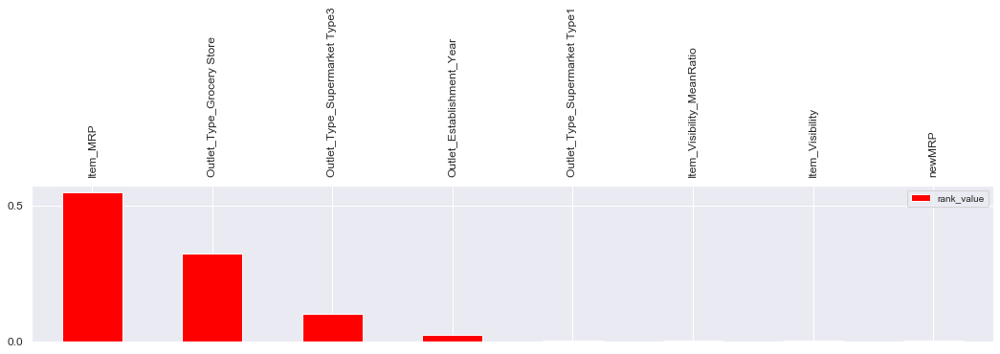

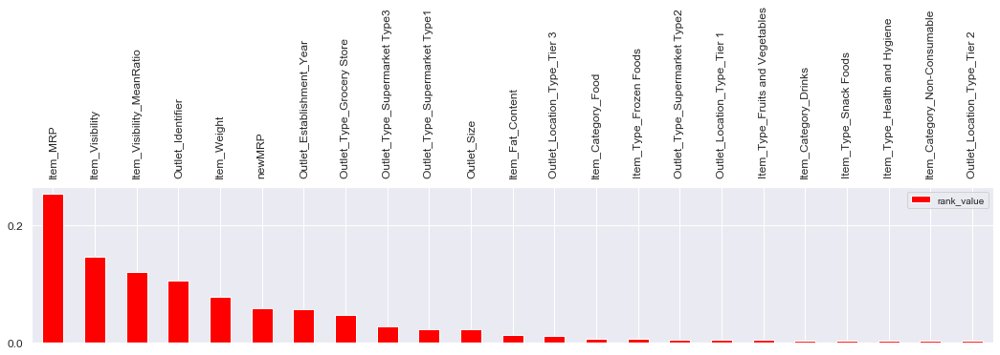

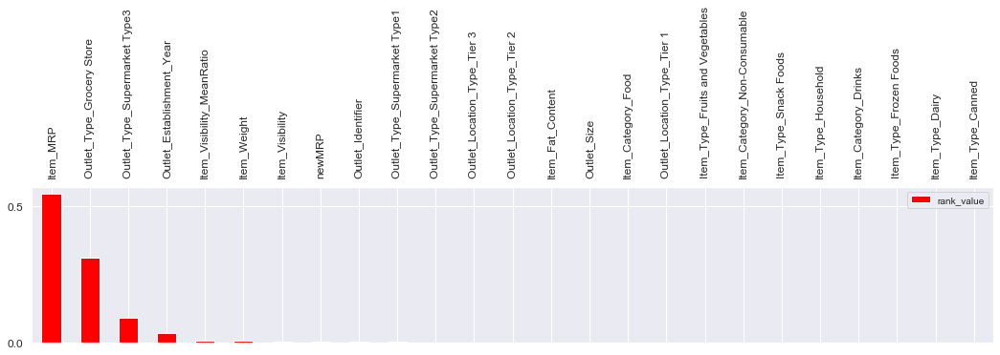

In [123]:
generate_all_model_score_with_hyperparam_tuning(trainDF,ytrainDF,testDF,'plan_data_and_hyperParameter_tuning')
training_scoreDF_R1=training_scoreDF.copy()
test_predictionDF_R1=test_predictionDF.copy()
train_predictionDF_R1=train_predictionDF.copy()
training_scoreDF_R1

In [799]:
good_scores_col=['random_forest_regressor_plan_data_and_hyperParameter_tuning','decision_tree_regressor_plan_data_and_hyperParameter_tuning','gradient_boosting_regressor_plan_data_and_hyperParameter_tuning']
training_scoreDF_R1[good_scores_col]

,random_forest_regressor_plan_data_and_hyperParameter_tuning,decision_tree_regressor_plan_data_and_hyperParameter_tuning,gradient_boosting_regressor_plan_data_and_hyperParameter_tuning
fit_time,12.654366,0.029887,1.557466
score_time,0.437682,0.008066,0.040254
test_r2,0.595304,0.589311,0.596067
train_r2,0.624310,0.610484,0.614498
test_neg_mean_absolute_error,27.560107,27.740970,27.510212
train_neg_mean_absolute_error,27.060697,27.398272,27.186084
test_neg_mean_squared_error,1084.551505,1092.397508,1083.643673
train_neg_mean_squared_error,1045.819800,1064.885345,1059.365705


In [806]:
test_predictionDF_R1['avg']=test_predictionDF_R1[good_scores_col].mean(1)
train_predictionDF_R1['avg']=train_predictionDF_R1[good_scores_col].mean(1)
training_scoreDF_R1['avg']=training_scoreDF_R1[good_scores_col].mean(1)
test_predictionDF_R1[['avg']+good_scores_col].head(10)

,avg,random_forest_regressor_plan_data_and_hyperParameter_tuning,decision_tree_regressor_plan_data_and_hyperParameter_tuning,gradient_boosting_regressor_plan_data_and_hyperParameter_tuning
0,1610.115044,1584.439122,1624.469120,1621.436890
1,1396.694164,1393.287116,1349.512904,1447.282471
2,551.858603,589.826030,471.306847,594.442932
3,2523.558337,2442.149200,2526.199638,2602.326172
4,6271.680093,6200.011603,6318.503775,6296.524902
5,1878.372819,1811.494839,2004.740196,1818.883423
6,659.441473,690.643871,658.369084,629.311462
7,2265.972074,2117.443070,2517.882088,2162.591064
8,1554.123000,1533.164407,1624.469120,1504.735474
9,3089.718166,3057.169657,3008.578590,3203.406250


In [801]:
test_predictionDF_R1[['avg']+good_scores_col].head(10)

,avg,random_forest_regressor_plan_data_and_hyperParameter_tuning,decision_tree_regressor_plan_data_and_hyperParameter_tuning,gradient_boosting_regressor_plan_data_and_hyperParameter_tuning
0,1610.115044,1584.439122,1624.469120,1621.436890
1,1396.694164,1393.287116,1349.512904,1447.282471
2,551.858603,589.826030,471.306847,594.442932
3,2523.558337,2442.149200,2526.199638,2602.326172
4,6271.680093,6200.011603,6318.503775,6296.524902
5,1878.372819,1811.494839,2004.740196,1818.883423
6,659.441473,690.643871,658.369084,629.311462
7,2265.972074,2117.443070,2517.882088,2162.591064
8,1554.123000,1533.164407,1624.469120,1504.735474
9,3089.718166,3057.169657,3008.578590,3203.406250


In [802]:
# Average out prediction from multiple model
generate_submission_file_avg('avg_Plan_predictionDF1.csv',test,test_predictionDF_R1['avg']).head(2)

0    1610.115044
1    1396.694164
Name: avg, dtype: float64

In [803]:
test_predictionDF_R1[good_scores_col+['avg']].head()

,random_forest_regressor_plan_data_and_hyperParameter_tuning,decision_tree_regressor_plan_data_and_hyperParameter_tuning,gradient_boosting_regressor_plan_data_and_hyperParameter_tuning,avg
0,1584.439122,1624.469120,1621.436890,1610.115044
1,1393.287116,1349.512904,1447.282471,1396.694164
2,589.826030,471.306847,594.442932,551.858603
3,2442.149200,2526.199638,2602.326172,2523.558337
4,6200.011603,6318.503775,6296.524902,6271.680093


In [804]:
test_predictionDF_R1.columns

Index(['decision_tree_regressor_plan_data_and_hyperParameter_tuning',
       'gradient_boosting_regressor_plan_data_and_hyperParameter_tuning',
       'Ada_boost_regressor_plan_data_and_hyperParameter_tuning',
       'random_forest_regressor_plan_data_and_hyperParameter_tuning',
       'linear_regression_plan_data_and_hyperParameter_tuning',
       'stochastic_gradientDescent_regressor_plan_data_and_hyperParameter_tuning',
       'ridge_regularization_plan_data_and_hyperParameter_tuning',
       'lasso_regularization_plan_data_and_hyperParameter_tuning',
       'elasticNet_regularization_plan_data_and_hyperParameter_tuning', 'avg'],
      dtype='object')

In [428]:
w=[.12,.5,0.3,.08]
newMean=pd.DataFrame()
j=0
for i in train_predictionDF_R1[good_scores_col+['avg']].columns:
    #print(i)
    print(i,np.sqrt(mean_squared_error(train_predictionDF_R1[i]*w[j],ytrainDF)))
    j=j+1

random_forest_regressor_plan_data_and_hyperParameter_tuning 2488.2651393816955
decision_tree_regressor_plan_data_and_hyperParameter_tuning 1665.5983468381262
gradient_boosting_regressor_plan_data_and_hyperParameter_tuning 2087.2404396900506
avg 2582.228837170143


In [808]:
training_scoreDF_R1.loc[['train_neg_mean_squared_error']].sort_values('train_neg_mean_squared_error',1)

,random_forest_regressor_plan_data_and_hyperParameter_tuning,avg,gradient_boosting_regressor_plan_data_and_hyperParameter_tuning,decision_tree_regressor_plan_data_and_hyperParameter_tuning,linear_regression_plan_data_and_hyperParameter_tuning,elasticNet_regularization_plan_data_and_hyperParameter_tuning,ridge_regularization_plan_data_and_hyperParameter_tuning,lasso_regularization_plan_data_and_hyperParameter_tuning,Ada_boost_regressor_plan_data_and_hyperParameter_tuning,stochastic_gradientDescent_regressor_plan_data_and_hyperParameter_tuning
train_neg_mean_squared_error,1045.8198,1056.690283,1059.365705,1064.885345,1126.799501,1126.833902,1126.879926,1128.966621,1449.654998,2756.665047


In [833]:
_cols=training_scoreDF_R1.loc[['train_neg_mean_squared_error']].sort_values(
    'train_neg_mean_squared_error',1).columns[:9]
print(_cols)
_cols=['random_forest_regressor_plan_data_and_hyperParameter_tuning','gradient_boosting_regressor_plan_data_and_hyperParameter_tuning','decision_tree_regressor_plan_data_and_hyperParameter_tuning'
      ,'linear_regression_plan_data_and_hyperParameter_tuning']
w=getWieght(len(_cols))
print(_cols)
newMean=pd.DataFrame()
j=0
_nn=pd.DataFrame()
for i in _cols:
    #print(i)
    _nn[i]=train_predictionDF_R1[i]*w[j]
    #j=j+1
#train_predictionDF_R1
_nn.sum(1)
print(np.sqrt(mean_squared_error(_nn.sum(1),ytrainDF)))
generate_submission_file_avg('hyperTuned_Stacking_rankAveraging.csv',test,_nn.sum(1)).head(2)

Index(['random_forest_regressor_plan_data_and_hyperParameter_tuning', 'avg',
       'gradient_boosting_regressor_plan_data_and_hyperParameter_tuning',
       'decision_tree_regressor_plan_data_and_hyperParameter_tuning',
       'linear_regression_plan_data_and_hyperParameter_tuning',
       'elasticNet_regularization_plan_data_and_hyperParameter_tuning',
       'ridge_regularization_plan_data_and_hyperParameter_tuning',
       'lasso_regularization_plan_data_and_hyperParameter_tuning',
       'Ada_boost_regressor_plan_data_and_hyperParameter_tuning'],
      dtype='object')
['random_forest_regressor_plan_data_and_hyperParameter_tuning', 'gradient_boosting_regressor_plan_data_and_hyperParameter_tuning', 'decision_tree_regressor_plan_data_and_hyperParameter_tuning', 'linear_regression_plan_data_and_hyperParameter_tuning']
1082.6266359077044


0    3712.514984
1     582.550758
dtype: float64

0    4641.503512
1     734.939267
dtype: float64

In [816]:
w=[1,1,1,1,1,1,1,1]
newMean=pd.DataFrame()
j=0
_nn=pd.DataFrame()
for i in _cols:
    #print(i)
    _nn[i]=train_predictionDF_R1[i]*w[j]
    #j=j+1
#train_predictionDF_R1
_nn.sum(1)
np.sqrt(mean_squared_error(_nn.sum(1),ytrainDF))

10183.951498724771

# Stacking Version 1 (avg of  predictions + orig dataset)
### ( Tuning  method 2)
##### where avg multiple model predictions are taken ( that these are selected best hyper tuned model )
##### and We have Merged with the all existing features To generate with train and test dataset
##### We have used this new train and test dataset to tried different regressors to  generate test prediction
##### 1452 is the mse score is obtained ( bad score)
##### Here a last step we tried to Again Avg Out the predictions from different model over new test and train dataset
##### But NO luck

In [129]:
# Lets add Avg prediction Avg prediction to ori dataset and create new dataset
trainDF_4Avg=trainDF.copy()
trainDF_4Avg['avg']=train_predictionDF_R1['avg']
testDF_4Avg=testDF.copy()
testDF_4Avg=testDF_4Avg.reset_index().drop(['index'],1)
testDF_4Avg['avg']=test_predictionDF_R1['avg']

DT

Decision Tree Best Score: 1058.129762 using following param

 {'min_samples_split': 6, 'min_samples_leaf': 158, 'max_leaf_nodes': 199, 'max_features': 32, 'max_depth': 50, 'criterion': 'mse'}
Total Columns= 36
Number_of_good_columns= 5
------------      decision_tree_regressor_plan_data_and_hyperParameter_tuning     ------------
fit_time =0.05
score_time =0.01
test_r2 =0.61
train_r2 =0.63
test_neg_mean_absolute_error =27.26
train_neg_mean_absolute_error =26.91
test_neg_mean_squared_error =1063.35
train_neg_mean_squared_error =1037.39
decision_tree_regressorcompleted
dict_keys(['base_score', 'booster', 'colsample_bylevel', 'colsample_bytree', 'gamma', 'learning_rate', 'max_delta_step', 'max_depth', 'min_child_weight', 'missing', 'n_estimators', 'n_jobs', 'nthread', 'objective', 'random_state', 'reg_alpha', 'reg_lambda', 'scale_pos_weight', 'seed', 'silent', 'subsample'])

 
 
 Best: 1070.730269 using {'subsample': 0.9, 'silent': 1, 'reg_lambda': 28.290000000000003, 'reg_alpha': 21.2

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   47.6s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:  2.6min finished


------------      Ada_boost_regressor_plan_data_and_hyperParameter_tuning     ------------
fit_time =0.51
score_time =0.05
test_r2 =0.45
train_r2 =0.45
test_neg_mean_absolute_error =32.12
train_neg_mean_absolute_error =32.03
test_neg_mean_squared_error =1270.02
train_neg_mean_squared_error =1261.88
Ada_boost_regressorcompleted
Fitting 8 folds for each of 50 candidates, totalling 400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   46.8s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 400 out of 400 | elapsed: 12.1min finished



Random Forest Best score: 1051.907925 using following param

 {'n_estimators': 201, 'min_samples_split': 3, 'min_samples_leaf': 112, 'max_leaf_nodes': 382, 'max_features': 'auto', 'max_depth': 94}
Total Columns= 36
Number_of_good_columns= 16
------------      random_forest_regressor_plan_data_and_hyperParameter_tuning     ------------
fit_time =3.32
score_time =0.15
test_r2 =0.62
train_r2 =0.63
test_neg_mean_absolute_error =27.16
train_neg_mean_absolute_error =26.83
test_neg_mean_squared_error =1056.76
train_neg_mean_squared_error =1031.58
random_forest_regressorcompleted
Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:    0.3s finished


------------      linear_regression_plan_data_and_hyperParameter_tuning     ------------
fit_time =0.01
score_time =0.01
test_r2 =0.62
train_r2 =0.62
test_neg_mean_absolute_error =27.23
train_neg_mean_absolute_error =27.14
test_neg_mean_squared_error =1056.10
train_neg_mean_squared_error =1048.63
linear_regressioncompleted
Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:   15.4s
[Parallel(n_jobs=-1)]: Done 447 tasks      | elapsed:   37.3s
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:   41.6s finished
/Users/keeratjohar2305/anaconda2/lib/python3.6/site-packages/sklearn/model_selection/_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


------------      stochastic_gradientDescent_regressor_plan_data_and_hyperParameter_tuning     ------------
fit_time =0.30
score_time =0.01
test_r2 =-1.63
train_r2 =-1.63
test_neg_mean_absolute_error =46.68
train_neg_mean_absolute_error =46.68
test_neg_mean_squared_error =2767.92
train_neg_mean_squared_error =2767.92
stochastic_gradientDescent_regressorcompleted
Fitting 5 folds for each of 76 candidates, totalling 380 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 210 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 380 out of 380 | elapsed:    2.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


------------      ridge_regularization_plan_data_and_hyperParameter_tuning     ------------
fit_time =0.01
score_time =0.01
test_r2 =0.62
train_r2 =0.62
test_neg_mean_absolute_error =27.22
train_neg_mean_absolute_error =27.14
test_neg_mean_squared_error =1056.10
train_neg_mean_squared_error =1048.64
ridge_regularizationcompleted
Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Done 187 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed:   32.6s
[Parallel(n_jobs=-1)]: Done 493 out of 500 | elapsed:   35.6s remaining:    0.5s
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:   36.3s finished


------------      lasso_regularization_plan_data_and_hyperParameter_tuning     ------------
fit_time =0.01
score_time =0.01
test_r2 =0.62
train_r2 =0.62
test_neg_mean_absolute_error =27.14
train_neg_mean_absolute_error =27.12
test_neg_mean_squared_error =1052.76
train_neg_mean_squared_error =1050.83
lasso_regularizationcompleted
Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 110 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 431 tasks      | elapsed:   20.8s
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:   24.7s finished


------------      elasticNet_regularization_plan_data_and_hyperParameter_tuning     ------------
fit_time =0.34
score_time =0.00
test_r2 =0.62
train_r2 =0.62
test_neg_mean_absolute_error =27.22
train_neg_mean_absolute_error =27.14
test_neg_mean_squared_error =1056.10
train_neg_mean_squared_error =1048.64
elasticNet_regularizationcompleted


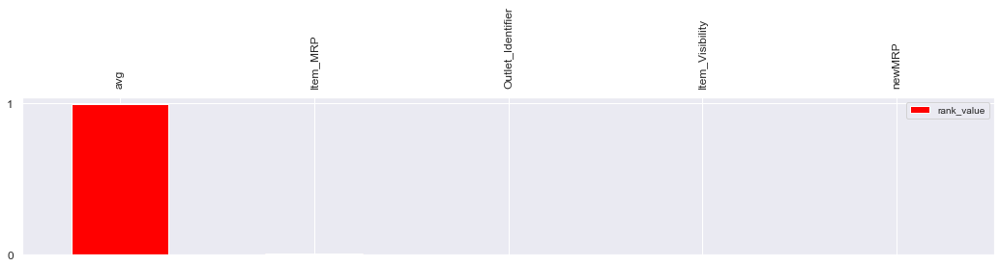

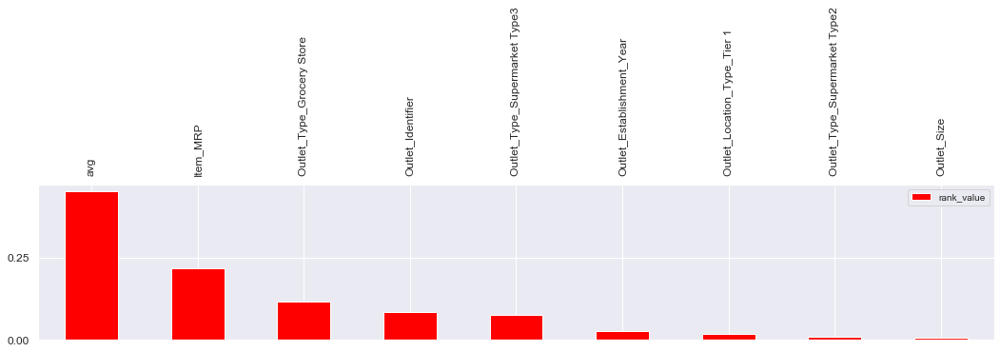

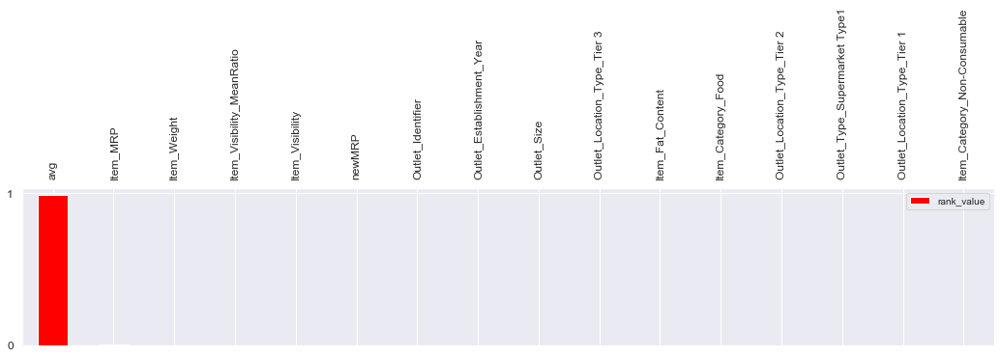

In [130]:
model_done=[]
best_mode_type_hyperTuned={}
training_scoreDF=pd.DataFrame()
test_predictionDF=pd.DataFrame()
train_predictionDF=pd.DataFrame()
# make prediction using different model on new dataset and storing these predictons 
generate_all_model_score_with_hyperparam_tuning(trainDF_4Avg,ytrainDF,testDF_4Avg,'plan_data_and_hyperParameter_tuning')

In [131]:
# lets copy the prediction of stacking version 1 dataset (avg+ orig dataset)
training_scoreDF_R2=training_scoreDF.copy()
test_predictionDF_R2=test_predictionDF.copy()
train_predictionDF_R2=train_predictionDF.copy()


In [132]:
# Lets create file for each model created on test prediction for final submittion
for i in test_predictionDF_R2.columns:
    file = i +'_Stacked_Prediction.csv'
    print(file)
    generate_submission_file_avg(file,test,test_predictionDF_R2[i])

decision_tree_regressor_plan_data_and_hyperParameter_tuning_Stacked_Prediction.csv
gradient_boosting_regressor_plan_data_and_hyperParameter_tuning_Stacked_Prediction.csv
Ada_boost_regressor_plan_data_and_hyperParameter_tuning_Stacked_Prediction.csv
random_forest_regressor_plan_data_and_hyperParameter_tuning_Stacked_Prediction.csv
linear_regression_plan_data_and_hyperParameter_tuning_Stacked_Prediction.csv
stochastic_gradientDescent_regressor_plan_data_and_hyperParameter_tuning_Stacked_Prediction.csv
ridge_regularization_plan_data_and_hyperParameter_tuning_Stacked_Prediction.csv
lasso_regularization_plan_data_and_hyperParameter_tuning_Stacked_Prediction.csv
elasticNet_regularization_plan_data_and_hyperParameter_tuning_Stacked_Prediction.csv


In [ ]:
training_scoreDF_R2

In [134]:
best_score_columns=list(training_scoreDF_R2.columns)
best_score_columns.remove('Ada_boost_regressor_plan_data_and_hyperParameter_tuning')
best_score_columns.remove('stochastic_gradientDescent_regressor_plan_data_and_hyperParameter_tuning')

In [135]:

best_score_columns2=['avg'
                     #'gradient_boosting_regressor_plan_data_and_hyperParameter_tuning',
                     #'random_forest_regressor_plan_data_and_hyperParameter_tuning'
                     #'decision_tree_regressor_plan_data_and_hyperParameter_tuning'
                     #,'linear_regression_plan_data_and_hyperParameter_tuning'
                     #,'ridge_regularization_plan_data_and_hyperParameter_tuning'
                     #,'lasso_regularization_plan_data_and_hyperParameter_tuning'
                     #,'elasticNet_regularization_plan_data_and_hyperParameter_tuning'
                    ]
#training_scoreDF_R2[best_score_columns2]

In [136]:
test_predictionDF_R2['avg_best']=test_predictionDF_R2[best_score_columns2].mean(1)


KeyError: "None of [Index(['avg'], dtype='object')] are in the [columns]"

In [ ]:
#test_predictionDF_R2[best_score_columns2+ ['avg_beast']].round()

In [ ]:
generate_submission_file_avg('avg_Plan_predictionDF1_AVGing_StackedPrediction.csv',test,test_predictionDF_R2['avg_best']).head(2)

# Stacking Version 2 ( use combined multiple predictations as test/train dataset)
### ( Tuning  method 3)

##### we have  multiple model predictions are taken ( that these are selected best hyper tuned model )
##### and Considering these predictions as train and test dataset
##### We have used this new train and test dataset to tried different regressors to  generate test prediction
##### 1452 is the mse score is obtained ( bad score)
##### Here a last step we tried to Again Avg the predictions from different model over new test and train dataset
##### But NO luck

In [ ]:
r1_test=test_predictionDF_R1[good_scores_col]
r1_train=train_predictionDF_R1[good_scores_col]

In [ ]:
r1_train.shape,r1_test.shape

dict_keys(['base_score', 'booster', 'colsample_bylevel', 'colsample_bytree', 'gamma', 'learning_rate', 'max_delta_step', 'max_depth', 'min_child_weight', 'missing', 'n_estimators', 'n_jobs', 'nthread', 'objective', 'random_state', 'reg_alpha', 'reg_lambda', 'scale_pos_weight', 'seed', 'silent', 'subsample'])

 
 
 Best: 1084.487468 using {'subsample': 0.30000000000000004, 'silent': 1, 'reg_lambda': 34.35, 'reg_alpha': 13.14, 'objective': 'reg:gamma', 'n_estimators': 100, 'min_child_weight': 1, 'max_depth': 13, 'learning_rate': 0.2117241379310345, 'gamma': 0.31931034482758625, 'colsample_bytree': 0.5}
Total Columns= 8523
Number_of_good_columns= 15
------------      gradient_boosting_regressor_plan_data_and_hyperParameter_tuning     ------------
fit_time =0.14
score_time =0.01
test_r2 =0.60
train_r2 =0.61
test_neg_mean_absolute_error =27.36
train_neg_mean_absolute_error =27.26
test_neg_mean_squared_error =1074.26
train_neg_mean_squared_error =1066.46
gradient_boosting_regressorcompleted


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:   37.2s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:   52.5s finished


------------      Ada_boost_regressor_plan_data_and_hyperParameter_tuning     ------------
fit_time =0.22
score_time =0.03
test_r2 =0.46
train_r2 =0.47
test_neg_mean_absolute_error =31.51
train_neg_mean_absolute_error =31.40
test_neg_mean_squared_error =1253.31
train_neg_mean_squared_error =1243.44
Ada_boost_regressorcompleted
Fitting 8 folds for each of 50 candidates, totalling 400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   42.1s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 400 out of 400 | elapsed: 10.3min finished



Random Forest Best score: 1081.613595 using following param

 {'n_estimators': 681, 'min_samples_split': 78, 'min_samples_leaf': 61, 'max_leaf_nodes': 73, 'max_features': 'auto', 'max_depth': 52}
Total Columns= 35
Number_of_good_columns= 24
------------      random_forest_regressor_plan_data_and_hyperParameter_tuning     ------------
fit_time =4.92
score_time =0.46
test_r2 =0.62
train_r2 =0.65
test_neg_mean_absolute_error =27.06
train_neg_mean_absolute_error =26.64
test_neg_mean_squared_error =1045.38
train_neg_mean_squared_error =1015.53
random_forest_regressorcompleted
Fitting 5 folds for each of 4 candidates, totalling 20 fits
------------      linear_regression_plan_data_and_hyperParameter_tuning     ------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:    0.1s finished


fit_time =0.00
score_time =0.01
test_r2 =0.63
train_r2 =0.63
test_neg_mean_absolute_error =26.99
train_neg_mean_absolute_error =26.97
test_neg_mean_squared_error =1038.48
train_neg_mean_squared_error =1036.48
linear_regressioncompleted
Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 283 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:   13.5s finished
/Users/keeratjohar2305/anaconda2/lib/python3.6/site-packages/sklearn/model_selection/_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


------------      stochastic_gradientDescent_regressor_plan_data_and_hyperParameter_tuning     ------------
fit_time =0.51
score_time =0.00
test_r2 =-1.61
train_r2 =-1.61
test_neg_mean_absolute_error =46.53
train_neg_mean_absolute_error =46.53
test_neg_mean_squared_error =2756.66
train_neg_mean_squared_error =2756.67
stochastic_gradientDescent_regressorcompleted
Fitting 5 folds for each of 76 candidates, totalling 380 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 380 out of 380 | elapsed:    2.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


------------      ridge_regularization_plan_data_and_hyperParameter_tuning     ------------
fit_time =0.00
score_time =0.01
test_r2 =0.63
train_r2 =0.63
test_neg_mean_absolute_error =26.98
train_neg_mean_absolute_error =26.96
test_neg_mean_squared_error =1038.59
train_neg_mean_squared_error =1036.41
ridge_regularizationcompleted
Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Done 358 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:    4.9s finished


------------      lasso_regularization_plan_data_and_hyperParameter_tuning     ------------
fit_time =0.03
score_time =0.00
test_r2 =0.63
train_r2 =0.63
test_neg_mean_absolute_error =26.98
train_neg_mean_absolute_error =26.96
test_neg_mean_squared_error =1038.59
train_neg_mean_squared_error =1036.41
lasso_regularizationcompleted
Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:    3.8s finished


------------      elasticNet_regularization_plan_data_and_hyperParameter_tuning     ------------
fit_time =0.04
score_time =0.00
test_r2 =0.63
train_r2 =0.63
test_neg_mean_absolute_error =26.98
train_neg_mean_absolute_error =26.96
test_neg_mean_squared_error =1038.59
train_neg_mean_squared_error =1036.41
elasticNet_regularizationcompleted
DT

Decision Tree Best Score: 1090.000211 using following param

 {'min_samples_split': 189, 'min_samples_leaf': 20, 'max_leaf_nodes': 103, 'max_features': 34, 'max_depth': 5, 'criterion': 'mse'}
Total Columns= 35
Number_of_good_columns= 9
------------      decision_tree_regressor_plan_data_and_hyperParameter_tuning     ------------


ValueError: max_features must be in (0, n_features]

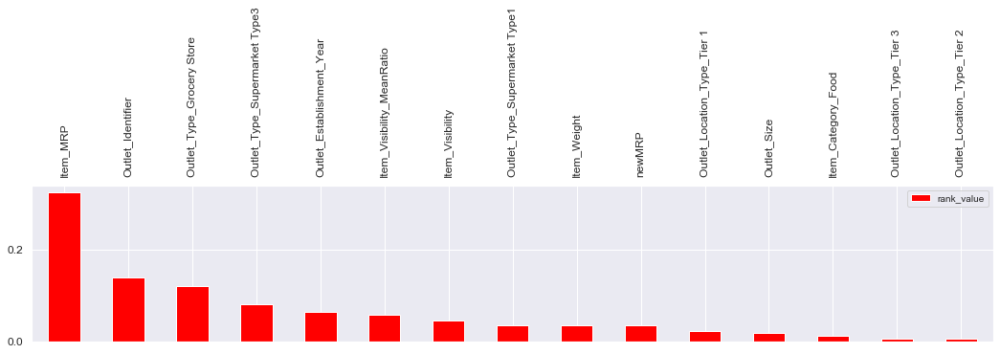

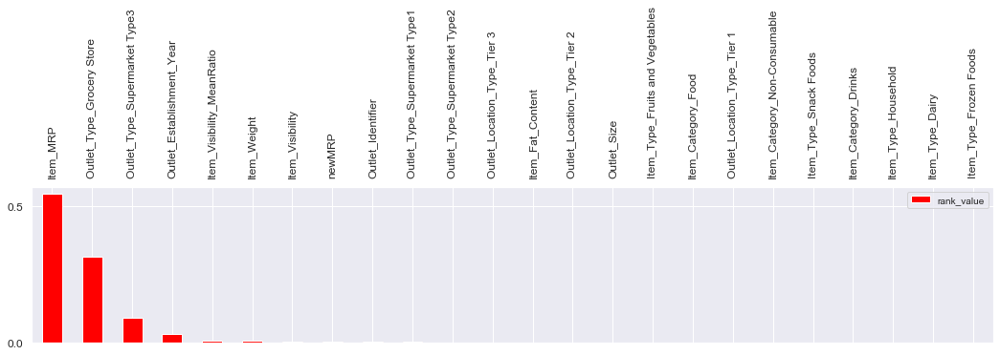

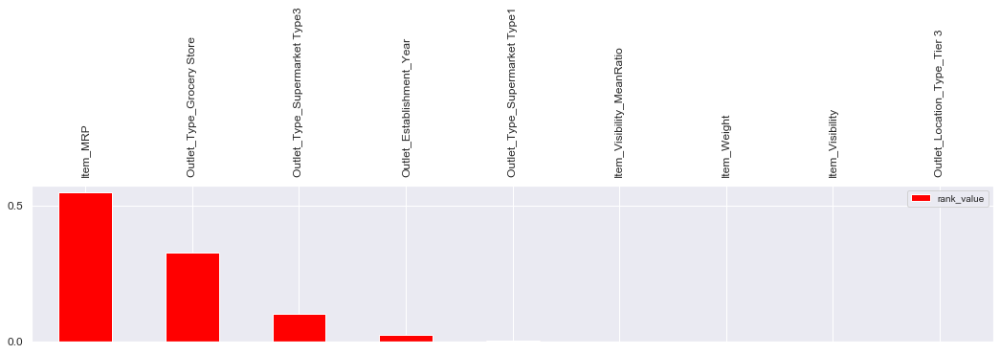

In [299]:
# model_estimator,goodcols_dt,orig_cols=getDT_and_RF_Score(good_scores_col,r1_train,ytrainDF,'RF')
# ptest=model_estimator.best_estimator_.predict(r1_test)
# generate_submission_file_avg('prediction_stacking_Using_LiReg.csv',test,ptest)
model_done=[]
best_mode_type_hyperTuned={}
training_scoreDF=pd.DataFrame()
test_predictionDF=pd.DataFrame()
train_predictionDF=pd.DataFrame()


In [ ]:
generate_all_model_score_with_hyperparam_tuning(r1_train,ytrainDF,r1_test,'plan_data_and_hyperParameter_tuning')

In [ ]:
training_scoreDF_R3=training_scoreDF.copy()
test_predictionDF_R3=test_predictionDF.copy()
train_predictionDF_R3=train_predictionDF.copy()
training_scoreDF_R3

In [ ]:
good_cols_R3=[
              ,
              ,
              ,
              ,
              ,
              ,
              ,
              ,
              ,
              ,
                
]

In [ ]:
test_predictionDF_R3['Avg_of_SimpleStacked_PlainPrediction']=test_predictionDF_R3[good_scores_col].mean(1)
train_predictionDF_R3['Avg_of_SimpleStacked_PlainPrediction']=train_predictionDF_R3[good_scores_col].mean(1)
test_predictionDF_R3[['Avg_of_SimpleStacked_PlainPrediction']+good_scores_col].head(10)

In [ ]:
for i in good_cols_R3:
    test_predictionDF_R3[i]
    generate_submission_file_avg(i+'SimpleStackingCV.csv',test,ptest)
    

In [297]:
generate_submission_file_avg('prediction_stacking_Using_rf_v3.csv',test,ptest)

array([1434.95449622, 1523.4563101 ,  594.7331725 , ..., 1575.15871351,
       3204.94061053, 1318.81674841])

In [298]:
# model_estimator,goodcols_dt,orig_cols=ScoringSGB(best_score_columns2,train_predictionDF_R2[best_score_columns2],ytrainDF)
# ptest=model_estimator.best_estimator_.predict(test_predictionDF_R2[best_score_columns2])
# generate_submission_file_avg('prediction_stacking_Using_rf_cv.csv',test,ptest)

In [310]:
# import xgboost as xgb
# import xgboost as xgb
# lr=xgb.XGBRegressor()
# lr.fit(train_predictionDF_R2[best_score_columns2],ytrainDF)
# ptrainlr=lr.predict(train_predictionDF_R2[best_score_columns2])
# from sklearn.metrics import mean_squared_error
# print(np.sqrt(mean_squared_error(ptrainlr,ytrainDF)))
# ptestlr=lr.predict(test_predictionDF_R2[best_score_columns2])
# generate_submission_file_avg('prediction_stacking_Using_linR.csv',test,ptestlr)

In [431]:
def generate_all_model_score(_xtraningData1,_ytraniningData1,_xtestingData1,tagName):
    model_dict=createModelDict(4,1,46,)
    for key,val in dict(itertools.islice(model_dict.items(), 0, 10)).items():
        model_name=key+'_' + tagName
        model_type=val
        if model_name == 'stochastic_gradientDescent_regressor' + '_' + tagName:
            scaler = StandardScaler()
            scaler.fit(_xtraningData1)  # Don't cheat - fit only on training data
            _xtraningData1 = pd.DataFrame(scaler.transform(_xtraningData1),columns=_xtraningData1.columns)
            
#             scaler = StandardScaler()
#             scaler.fit(_ytraniningData1)  # Don't cheat - fit only on training data
#             _ytraniningData1 = pd.DataFrame(scaler.transform(pd.Series(_ytraniningData1)),columns=_ytraniningData1.columns).columns
            
        training_scoreDF[model_name]=regressionModelfit_CV(model_type,_xtraningData1.columns,_xtraningData1,_ytraniningData1,model_name)
        train_predictionDF[model_name]=model_type.predict(_xtraningData1)
        test_predictionDF[model_name]=model_type.predict(_xtestingData1)
#generate_all_model_score(Train_feature_data,ytrainDF,Test_feature_data,'with_feature_tools')
#

# Stacking Version 3 ( basic model predictions are stacked)
### ( Tuning  method 4)
##### Here we obtain multiple predictions from the base models
##### All the multiple prediction are used to generated new test and train dataset
##### this new dataset is finally used to generated final test predicton

In [432]:
import itertools
training_scoreDF=pd.DataFrame()
test_predictionDF=pd.DataFrame()
train_predictionDF=pd.DataFrame()
print(trainDF.shape,ytrainDF.shape,testDF.shape)
generate_all_model_score(trainDF,ytrainDF,testDF,'plan_data')
training_scoreDF_baseRegressor=training_scoreDF.copy()
test_predictionDF_baseRegressor=test_predictionDF.copy()
train_predictionDF_baseRegressor=train_predictionDF.copy()
training_scoreDF_baseRegressor

(8523, 35) (8523,) (5681, 35)
------------      Ada_boost_regressor_plan_data     ------------
fit_time =0.04
score_time =0.01
test_r2 =0.27
train_r2 =0.27
test_neg_mean_absolute_error =33.68
train_neg_mean_absolute_error =33.68
test_neg_mean_squared_error =1460.54
train_neg_mean_squared_error =1459.24
------------      random_forest_regressor_plan_data     ------------
fit_time =0.07
score_time =0.32
test_r2 =0.59
train_r2 =0.62
test_neg_mean_absolute_error =27.59
train_neg_mean_absolute_error =27.16
test_neg_mean_squared_error =1089.08
train_neg_mean_squared_error =1052.57
------------      decision_tree_regressor_plan_data     ------------
fit_time =0.05
score_time =0.01
test_r2 =0.58
train_r2 =0.63
test_neg_mean_absolute_error =27.73
train_neg_mean_absolute_error =27.03
test_neg_mean_squared_error =1098.40
train_neg_mean_squared_error =1043.58
------------      linear_regression_plan_data     ------------
fit_time =0.01
score_time =0.01
test_r2 =0.56
train_r2 =0.56
test_neg_mean_ab

,Ada_boost_regressor_plan_data,random_forest_regressor_plan_data,decision_tree_regressor_plan_data,linear_regression_plan_data,stochastic_gradientDescent_regressor_plan_data,ridge_regularization_plan_data,lasso_regularization_plan_data,elasticNet_regularization_plan_data,gradient_boosting_regressor_plan_data
fit_time,0.039778,0.072336,0.047750,0.010990,0.070665,0.006099,0.087622,0.011404,0.083932
score_time,0.009719,0.319902,0.009469,0.007305,0.011843,0.004727,0.006513,0.005661,0.006028
test_r2,0.267162,0.591920,0.584721,0.556434,0.554474,0.556437,0.556719,0.503269,0.576688
train_r2,0.268689,0.619433,0.625910,0.563876,0.560956,0.563876,0.563807,0.507856,0.633902
test_neg_mean_absolute_error,33.684807,27.592207,27.732251,29.009587,29.051171,29.009434,29.001835,29.854229,27.874166
train_neg_mean_absolute_error,33.679498,27.158249,27.030888,28.905421,28.967208,28.905302,28.903590,29.792724,26.995304
test_neg_mean_squared_error,1460.539033,1089.083182,1098.404361,1135.383023,1137.990447,1135.380183,1135.042460,1202.276868,1109.381015
train_neg_mean_squared_error,1459.240372,1052.570275,1043.580368,1126.799501,1130.565840,1126.799537,1126.887648,1196.991974,1032.424123


In [451]:
training_scoreDF_baseRegressor.loc[['train_neg_mean_squared_error']].sort_values('train_neg_mean_squared_error',1)

,gradient_boosting_regressor_plan_data,decision_tree_regressor_plan_data,random_forest_regressor_plan_data,linear_regression_plan_data,ridge_regularization_plan_data,lasso_regularization_plan_data,stochastic_gradientDescent_regressor_plan_data,elasticNet_regularization_plan_data,Ada_boost_regressor_plan_data
train_neg_mean_squared_error,1032.424123,1043.580368,1052.570275,1126.799501,1126.799537,1126.887648,1130.56584,1196.991974,1459.240372


In [740]:
def getWieght(Number_of_models_to_be_stacked):
    n= Number_of_models_to_be_stacked #number of model
    def is_even(num):
       return num % 2 == 0
    if is_even(n):
        l1=np.full((n), float(1/n))
        l2=[i/100 for i in range(1,int(n/2)+1)] + [-i/100 for i in range(1,int(n/2)+1)]
        w=(np.sort((l1 - l2)))
        return [i for i in w]
    else:
        n=n-1
        l1=np.full((n), float(1/n))
        l2=[i/100 for i in range(1,int(n/2)+1)] + [-i/100 for i in range(1,int(n/2)+1)]
        w= [float(i) for i in np.sort((l1 - l2))]
        _vv=[float(np.mean([w[int(n/2)-1],w[int(n/2)]]))]
        return [i for i in np.sort(w + _vv)]

In [751]:
_cols=training_scoreDF_baseRegressor.loc[['train_neg_mean_squared_error']].sort_values('train_neg_mean_squared_error',1).columns
weight_dict=dict(zip(list(_cols),getWieght(len(_cols))))

In [769]:
_cols

Index(['gradient_boosting_regressor_plan_data',
       'decision_tree_regressor_plan_data',
       'random_forest_regressor_plan_data', 'linear_regression_plan_data',
       'ridge_regularization_plan_data', 'lasso_regularization_plan_data',
       'stochastic_gradientDescent_regressor_plan_data',
       'elasticNet_regularization_plan_data', 'Ada_boost_regressor_plan_data'],
      dtype='object')

In [780]:
_cols=training_scoreDF_baseRegressor.loc[['train_neg_mean_squared_error']].sort_values('train_neg_mean_squared_error',1).columns
w=getWieght(len(_cols))
newMean=pd.DataFrame()
j=0
_nn=pd.DataFrame()
for i in _cols:
    #print(i)
    _nn[i]=train_predictionDF_baseRegressor[i]*w[j]
    #j=j+1
#train_predictionDF_R1
_nn.sum(1)
np.sqrt(mean_squared_error(_nn.sum(1),ytrainDF))

1270.9726326650466

In [782]:
_cols=training_scoreDF_baseRegressor.loc[['train_neg_mean_squared_error']].sort_values('train_neg_mean_squared_error',1).columns
w=[1,1,1,1,1,1,1,1]
newMean=pd.DataFrame()
j=0
_nn=pd.DataFrame()
for i in _cols:
    #print(i)
    _nn[i]=train_predictionDF_baseRegressor[i]*w[j]
    #j=j+1
#train_predictionDF_R1
_nn.sum(1)
np.sqrt(mean_squared_error(_nn.sum(1),ytrainDF))

19703.03950038102

In [317]:
training_scoreDF=pd.DataFrame()
test_predictionDF=pd.DataFrame()
train_predictionDF=pd.DataFrame()

print(train_predictionDF_baseRegressor.shape,ytrainDF.shape,test_predictionDF_baseRegressor.shape)

generate_all_model_score(train_predictionDF_baseRegressor,ytrainDF,test_predictionDF_baseRegressor,'plan_data')
training_scoreDF_stackedRegressor1=training_scoreDF.copy()
test_predictionDF_stackedRegressor1=test_predictionDF.copy()
train_predictionDF_stackedRegressor1=train_predictionDF.copy()
training_scoreDF_stackedRegressor1

(8523, 9) (8523,) (5681, 9)
------------      Ada_boost_regressor_plan_data     ------------
fit_time =0.09
score_time =0.02
test_r2 =0.46
train_r2 =0.47
test_neg_mean_absolute_error =31.52
train_neg_mean_absolute_error =31.38
test_neg_mean_squared_error =1257.99
train_neg_mean_squared_error =1245.56
------------      random_forest_regressor_plan_data     ------------
fit_time =0.10
score_time =0.33
test_r2 =0.62
train_r2 =0.65
test_neg_mean_absolute_error =27.06
train_neg_mean_absolute_error =26.59
test_neg_mean_squared_error =1048.13
train_neg_mean_squared_error =1013.43
------------      decision_tree_regressor_plan_data     ------------
fit_time =0.06
score_time =0.01
test_r2 =0.61
train_r2 =0.65
test_neg_mean_absolute_error =27.23
train_neg_mean_absolute_error =26.49
test_neg_mean_squared_error =1060.44
train_neg_mean_squared_error =1004.46
------------      linear_regression_plan_data     ------------
fit_time =0.01
score_time =0.01
test_r2 =0.63
train_r2 =0.64
test_neg_mean_abso

,Ada_boost_regressor_plan_data,random_forest_regressor_plan_data,decision_tree_regressor_plan_data,linear_regression_plan_data,stochastic_gradientDescent_regressor_plan_data,ridge_regularization_plan_data,lasso_regularization_plan_data,elasticNet_regularization_plan_data,gradient_boosting_regressor_plan_data
fit_time,0.086871,0.095780,0.058354,0.007074,0.052979,0.006593,0.051135,0.053080,0.088134
score_time,0.023058,0.325556,0.009966,0.008380,0.011808,0.007806,0.007922,0.011801,0.011231
test_r2,0.456213,0.621873,0.613124,0.632934,0.631711,0.632951,0.633079,0.611552,0.612439
train_r2,0.467019,0.647212,0.653430,0.635428,0.634359,0.635412,0.635362,0.612968,0.660531
test_neg_mean_absolute_error,31.520987,27.060033,27.228969,26.928200,27.001329,26.925738,26.913859,27.647153,27.214696
train_neg_mean_absolute_error,31.375306,26.588432,26.490532,26.899182,26.978470,26.897760,26.889726,27.637842,26.455816
test_neg_mean_squared_error,1257.992961,1048.126376,1060.436848,1032.744152,1034.493612,1032.720515,1032.542871,1062.698304,1061.503015
train_neg_mean_squared_error,1245.564559,1013.433895,1004.458066,1030.212254,1031.716416,1030.234991,1030.305882,1061.478640,994.199187


In [320]:
for i in test_predictionDF_stackedRegressor1.columns:
    file = i +'_BaseRegressor.csv'
    print(file)
    generate_submission_file_avg(file,test,test_predictionDF_stackedRegressor1[i])

Ada_boost_regressor_plan_data_BaseRegressor.csv
random_forest_regressor_plan_data_BaseRegressor.csv
decision_tree_regressor_plan_data_BaseRegressor.csv
linear_regression_plan_data_BaseRegressor.csv
stochastic_gradientDescent_regressor_plan_data_BaseRegressor.csv
ridge_regularization_plan_data_BaseRegressor.csv
lasso_regularization_plan_data_BaseRegressor.csv
elasticNet_regularization_plan_data_BaseRegressor.csv
gradient_boosting_regressor_plan_data_BaseRegressor.csv


# Stacking Regressor Scikit

In [397]:
from sklearn.linear_model import RidgeCV, LassoCV
from sklearn.svm import SVR
# estimators = [    #('ridge', RidgeCV()),
# ...               #('lasso', LassoCV(random_state=42)),
# ...               #('svr', SVR(C=1, gamma=1e-6)),
#                   #('Ada_boost_regressor',model_dict['Ada_boost_regressor']),
#                   #('random_forest_regressor',model_dict['random_forest_regressor']),
#                   #('decision_tree_regressor',model_dict['decision_tree_regressor']),
#                   #('gradient_boosting_regressor',model_dict['gradient_boosting_regressor']),
#                   #('linear_regression',model_dict['linear_regression']),
#                   #('stochastic_gradientDescent_regressor',model_dict['stochastic_gradientDescent_regressor']),
#                   #('elasticNet_regularization',model_dict['elasticNet_regularization'])
#                   ]
from sklearn.utils import shuffle
x,y=shuffle(trainDF,ytrainDF,random_state=30)

offset=int(trainDF.shape[0]*0.1/100)

xxtrain=x[:offset]
xytrain=y[:offset]

xxtest=x[offset:]
xytest=y[offset:]
xxtrain=trainDF
xytrain=ytrainDF
#from sklearn.ensemble import StackingRegressor
from mlxtend.regressor import StackingRegressor ,StackingCVRegressor
regB = StackingRegressor(tuned_estimators[0:],
                        meta_regressor=DecisionTreeRegressor(random_state=46))
regA = StackingRegressor(tuned_estimators[0:],
                        meta_regressor=RandomForestRegressor(random_state=46))
reg = StackingRegressor([regA,regB],
                        meta_regressor=xgb.XGBRegressor(random_state=46))
                          
                         
#LinearRegression(**list(best_mode_type_hyperTuned.values())[4].get_params()),
#),
#Ridge(**list(best_mode_type_hyperTuned.values())[6].get_params()),


reg.fit(xxtrain, xytrain) 
#ptest=reg.predict(testDF)
#xptrain=reg.predict(xxtrain)
#from sklearn.metrics import mean_squared_error
#print(np.sqrt(mean_squared_error(xptrain,xytrain)))
#print(np.sqrt(mean_squared_error(xptest,xytest)))
generate_submission_file('stackRegressorLIB_typerTuned.csv',reg,test,testDF)

array([1807.0812, 1285.0076,  481.8023, ..., 2329.46  , 2724.9124,
       1105.5671], dtype=float32)

In [359]:
list(model_dict.keys())

['Ada_boost_regressor',
 'random_forest_regressor',
 'decision_tree_regressor',
 'linear_regression',
 'stochastic_gradientDescent_regressor',
 'ridge_regularization',
 'lasso_regularization',
 'elasticNet_regularization',
 'gradient_boosting_regressor']

In [392]:
import xgboost as xgb
ada={'base_estimator': DecisionTreeRegressor(criterion='mse', max_depth=1, max_features=None,
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=500,
                       min_samples_split=500, min_weight_fraction_leaf=0.0,
                       presort=False, random_state=None, splitter='best'),
 'learning_rate': 0.13333338777777776,
 'loss': 'linear',
 'n_estimators': 50,
 'random_state': 46}
#AdaBoostRegressor(**ada)
dtpar={'criterion': 'mse',
 'max_depth': 50,
 'max_leaf_nodes': 199,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 158,
 'min_samples_split': 6,
 'min_weight_fraction_leaf': 0.0,
 'presort': False,
 'random_state': 46,
 'splitter': 'best'}

tuned_estimators=[
# DecisionTreeRegressor(**list(best_mode_type_hyperTuned.values())[0].get_params()),
# xgb.XGBRegressor(**list(best_mode_type_hyperTuned.values())[1].get_params()),
# RandomForestRegressor(**list(best_mode_type_hyperTuned.values())[3].get_params())
AdaBoostRegressor(**ada),
LinearRegression(**list(best_mode_type_hyperTuned.values())[4].get_params()),
SGDRegressor(**list(best_mode_type_hyperTuned.values())[5].get_params()),
Ridge(**list(best_mode_type_hyperTuned.values())[6].get_params()),
Lasso(**list(best_mode_type_hyperTuned.values())[7].get_params()),
ElasticNet(**list(best_mode_type_hyperTuned.values())[8].get_params())
]

#list(best_mode_type_hyperTuned.values())[2].get_params()

len(trainDF.columns)
list(best_mode_type_hyperTuned.values())[0].get_params()

{'criterion': 'mse',
 'max_depth': 50,
 'max_features': 32,
 'max_leaf_nodes': 199,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 158,
 'min_samples_split': 6,
 'min_weight_fraction_leaf': 0.0,
 'presort': False,
 'random_state': 46,
 'splitter': 'best'}

In [318]:
for i in list(best_mode_type_hyperTuned.values()):
    print(str(i).split("(")[0])

DecisionTreeRegressor
XGBRegressor
AdaBoostRegressor
RandomForestRegressor
LinearRegression
SGDRegressor
Ridge
Lasso
ElasticNet


In [173]:

def generate_all_model_score_with_hyperparam_tuning(_xtraningData1,_ytraniningData1,_xtestingData1,tagName):
    import itertools
    model_dict=createModelDict(5,1.2,46,500,500)
    RandomSearchCVDict=createRandomSearchCV_iterDict()
    for key,val in dict(itertools.islice(model_type_wise_hyperParams_grid_dict.items(), 0, 10)).items():
        
        if key in model_done:
            pass
        else:
            #print(key)
            model_name=key+'_' + tagName

            model_param_grid=val
            basic_model_type=model_dict[key]
            nIter=RandomSearchCVDict[key]
            if key == 'gradient_boosting_regressor':
                model_estimator,_goodcols1,_orig_cols1=ScoringSGB(_xtraningData1.columns,_xtraningData1,_ytraniningData1)
            elif  key == 'random_forest_regressor':
                model_estimator,goodcols_dt,orig_cols=getDT_and_RF_Score(_xtraningData1.columns,_xtraningData1,_ytraniningData1,'RF')
            elif  key == 'decision_tree_regressor':
                print('DT')
                model_estimator,goodcols_dt,orig_cols=getDT_and_RF_Score(_xtraningData1.columns,_xtraningData1,_ytraniningData1,'DT')
            else:
                model_estimator=RandomizedSearchCV(estimator=basic_model_type, param_distributions=model_param_grid,cv=5,n_jobs=-1,verbose=2,n_iter=nIter)
                model_estimator.fit(_xtraningData1,_ytraniningData1)
            model_type=model_estimator.best_estimator_
            best_mode_type_hyperTuned[key]=model_type
            if model_name == 'stochastic_gradientDescent_regressor' + '_' + tagName:
                scaler = StandardScaler()
                scaler.fit(_xtraningData1)  # Don't cheat - fit only on training data
                _xtraningData1 = pd.DataFrame(scaler.transform(_xtraningData1),columns=_xtraningData1.columns)

#                 scaler = StandardScaler()
#                 scaler.fit(_xtestingData1)  # Don't cheat - fit only on training data
#                 _xtestingData1 = pd.DataFrame(scaler.transform(_xtestingData1),columns=_xtestingData1.columns)

            training_scoreDF[model_name]=regressionModelfit_CV(model_type,_xtraningData1.columns,_xtraningData1,_ytraniningData1,model_name)
            train_predictionDF[model_name]=model_type.predict(_xtraningData1)
            test_predictionDF[model_name]=model_type.predict(_xtestingData1)
            model_done.append(key)
            print(key + "completed")
#generate_all_model_score_with_hyperparam_tuning(Train_feature_data,ytrainDF,Test_feature_data,'with_feature_tools_and_hyperParameter_Tuning')


In [208]:

#reg.score(xxtrain, xytrain)

1317.2336295992882

# ranking AVG 
cat_cols

In [ ]:
for j =1 
for i in training_scoreDF_baseRegressor.loc['train_neg_mean_squared_error'].sort_values().index:
    train_predictionDF_baseRegressor
    test_predictionDF_baseRegressor

In [263]:
#test_predictionDF_R2['decision_tree_regressor_plan_data_and_hyperParameter_tuning']

In [139]:
def generate_all_bagging_model_score(_xtraningData1,_ytraniningData1,_xtestingData1,tagName):
    for key,val in dict(itertools.islice(best_mode_type_hyperTuned.items(), 0, 10)).items():
        model_name=key+'_' + tagName
        base_model_type=val
        
        
        if model_name == 'random_forest_regressor' + '_' + tagName:
            continue
        
        
        
        if model_name == 'stochastic_gradientDescent_regressor' + '_' + tagName:
            scaler = StandardScaler()
            scaler.fit(_xtraningData1)  # Don't cheat - fit only on training data
            _xtraningData1 = pd.DataFrame(scaler.transform(_xtraningData1),columns=_xtraningData1.columns)
            
            scaler = StandardScaler()
            scaler.fit(_xtestingData1)  # Don't cheat - fit only on training data
            _xtestingData1 = pd.DataFrame(scaler.transform(_xtestingData1),columns=_xtestingData1.columns)

        model_type = BaggingRegressor(base_estimator= base_model_type ,n_estimators=200,
                                bootstrap=True,
                                random_state=0,
                                verbose=0,n_jobs=-1)#.fit( X_train1, ytrainDF)
        
        training_scoreDF[model_name]=regressionModelfit_CV(model_type,_xtraningData1.columns,_xtraningData1,_ytraniningData1,model_name)
        train_predictionDF[model_name]=model_type.predict(_xtraningData1)
        test_predictionDF[model_name]=model_type.predict(_xtestingData1)
generate_all_model_score(Train_feature_data,ytrainDF,Test_feature_data,'with_feature_tools_hyperTuned_and_bagged')
generate_all_model_score(xtrainDF,ytrainDF,testDF,'plan_data_hyperTuned_and_bagged')

NameError: name 'itertools' is not defined

In [721]:
model_names=list(model_types.keys())

def basic_model():
    model_names=['simple_'+i for i in list(model_types.keys())]
    model_types=['simple_'+i for i in list(model_types.values())]
    return model_names,model_types

def hyperparameter_tuned_model():
    return ['hyperparameter_tuned_'+i for i in model_types]

def bagged_with_hyper_mtr_tuned_model():
    return ['bagged_with_hyper_mtr_tuned_'+i for i in model_types.difference({'Random_forest'})]

def basic_model_with_featureTool():
    return ['simple_featureTool_'+i+'_with_featureTool' for i in model_types]

def hyperparameter_tuned_model_featureTool():
    return ['hyperparameter_tuned_'+i+'_with_featureTool' for i in model_types]

def bagged_with_hyper_mtr_tuned_model_featureTool():
    return ['bagged_with_hyper_mtr_tuned_featureTool_'+i+'_with_featureTool' for i in model_types.difference({'Random_forest'})]

models=\
basic_model() + \
hyperparameter_tuned_model() + \
bagged_with_hyper_mtr_tuned_model() + \
basic_model_with_featureTool() + \
hyperparameter_tuned_model_featureTool() + \
bagged_with_hyper_mtr_tuned_model_featureTool()

models

TypeError: must be str, not GradientBoostingRegressor

In [690]:
model_types.remove('Random_forest')

# 1.1 Linear Regression
# 1.2 Linear Regression GridSearch
# 1.3 Linear Regression Bagging

In [579]:
# Without cross validation
linear_model= LinearRegression()
def getLinearModelScore(_model, xTrainingData,yTrainingData,columnlist):
    xTrainingData=xTrainingData[columnlist]
    ydata=pd.DataFrame(ytrainDF)
    x_train, x_test, y_train, y_test = train_test_split(xTrainingData,yTrainingData, test_size =0.3,random_state=42)
    _model.fit(x_train, y_train)
    ptrain = _model.predict(x_train)
    ptest = _model.predict(x_test)
    from sklearn.metrics import mean_squared_error
    print("train MSE=",(mean_squared_error(ptrain,y_train)))
    print("test MSE=",(mean_squared_error(ptest,y_test)))
    

getLinearModelScore(linear_model,Train_feature_data,ytrainDF,Train_feature_data.columns)

train MSE= 1253559.1328031027
test MSE= 1186753.544782685


# DataFrame to Collect scores from all models

In [652]:
scoreDF=pd.DataFrame()

In [653]:
#Train_feature_data.shape,test_feature_data.shape

In [663]:

from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
linear_model= LinearRegression()
modelname='basic_linear_model'
scoreDF[modelname]=regressionModelfit_CV(linear_model,xtrainDF.columns, xtrainDF, ytrainDF,modelname)
pred_all[modelname]=linear_model.predict(xtrainDF)
pred_all_test[modelname]=linear_model.predict(testDF)
scoreDF
#pd.Series(linear_model.coef_, xtrainDF.columns).sort_values().plot.bar()


fit_time =0.01
score_time =0.01
test_r2 =0.56
train_r2 =0.56
test_neg_mean_absolute_error =29.01
train_neg_mean_absolute_error =28.91
test_neg_mean_squared_error =1135.38
train_neg_mean_squared_error =1126.80


ValueError: could not convert string to float: 'Low Fat'

# 1.1

In [658]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
linear_model= LinearRegression()
modelname='linear_model_featureTool'
scoreDF[modelname]=regressionModelfit_CV(linear_model,Train_feature_data.columns, Train_feature_data, ytrainDF,modelname)
#generate_submission_file('SampleSubmission_LR1.csv',linear_model,test,Test_feature_data)
pred_all[modelname]=linear_model.predict(Train_feature_data)
pred_all_test[modelname]=linear_model.predict(Test_feature_data)
scoreDF

#pd.Series(linear_model.coef_, xtrainDF.columns).sort_values().plot.bar()


fit_time =0.05
score_time =0.01
test_r2 =0.57
train_r2 =0.58
test_neg_mean_absolute_error =28.64
train_neg_mean_absolute_error =28.53
test_neg_mean_squared_error =1118.41
train_neg_mean_squared_error =1107.60


,basic_linear_model,linear_model_featureTool
fit_time,0.011417,0.046852
score_time,0.005603,0.007693
test_r2,0.556434,0.569680
train_r2,0.563876,0.578623
test_neg_mean_absolute_error,29.009587,28.644631
train_neg_mean_absolute_error,28.905421,28.525488
test_neg_mean_squared_error,1135.383023,1118.408124
train_neg_mean_squared_error,1126.799501,1107.595238


# 1.2

In [586]:
# Grid search - this will take about 1 minute.
param_grid = {
    'fit_intercept': [True,False],
    'normalize': [True,False],

}
lr_clf = GridSearchCV(linear_model, param_grid,verbose=1,n_jobs=-1).fit(Train_feature_data, ytrainDF)
#regressionModelfit_CV(SGD,xtrainDF.columns, X_train1, ytrainDF)

Fitting 3 folds for each of 4 candidates, totalling 12 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  12 out of  12 | elapsed:    8.9s finished


In [588]:
print(lr_clf.best_score_)
print(lr_clf.best_estimator_)
regressionModelfit_CV(lr_clf.best_estimator_,Train_feature_data.columns, Train_feature_data, ytrainDF)

0.5710936632254249
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
fit_time =0.05
score_time =0.01
test_r2 =0.57
train_r2 =0.58
test_neg_mean_absolute_error =28.64
train_neg_mean_absolute_error =28.53
test_neg_mean_squared_error =1118.41
train_neg_mean_squared_error =1107.60


In [589]:
generate_submission_file('SampleSubmission_LR2.csv',linear_model,test,Test_feature_data)


array([2331.23960295, 1537.23407538, 1447.05982358, ..., 1847.75562789,
       3491.8208754 , 1392.02363535])

# 1.3

In [590]:
from sklearn.ensemble import BaggingRegressor
linear_model= LinearRegression()
ensembleLR = BaggingRegressor(base_estimator=linear_model,                            
                                bootstrap=True,
                                random_state=0,
                                verbose=0)#.fit( xtrainDF, ytrainDF)
regressionModelfit_CV(ensembleLR,Train_feature_data.columns, Train_feature_data, ytrainDF)

In [592]:
regressionModelfit_CV(ensembleLR,Train_feature_data.columns, Train_feature_data, ytrainDF)

fit_time =0.67
score_time =0.05
test_r2 =0.57
train_r2 =0.58
test_neg_mean_absolute_error =28.65
train_neg_mean_absolute_error =28.53
test_neg_mean_squared_error =1118.91
train_neg_mean_squared_error =1107.98


In [99]:
linear_model.get_params()

{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'normalize': False}

# 2.1 Stochastic Gradient Descent Regressor
# 2.2 Stochastic Gradient Descent Regressor with Hyper parameter tuning
# 2.3 Stochastic Gradient Descent Regressor with Bagging

# 2.1

In [317]:

# Note: Stochastic Gradient Descent is sensitive to feature scaling, so it is highly recommended to scale your data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(xtrainDF)  # Don't cheat - fit only on training data
X_train1 = pd.DataFrame(scaler.transform(xtrainDF),columns=xtrainDF.columns)
from sklearn.linear_model import SGDRegressor #, penalty=None,loss="squared_loss"
SGD=SGDRegressor(alpha=0.5)
regressionModelfit_CV(SGD,xtrainDF.columns, X_train1, ytrainDF)

fit_time =0.03
score_time =0.00
test_r2 =0.50
train_r2 =0.51
test_neg_mean_absolute_error =29.87
train_neg_mean_absolute_error =29.83
test_neg_mean_squared_error =1202.25
train_neg_mean_squared_error =1200.49


In [389]:

generate_submission_file('SampleSubmission_LR2.csv',SGD,test,testDF)


array([ 71742.57645358,  57572.75999529, 155293.51056519, ...,
        78252.47145553, 138616.61468783,  53488.24702636])

# 2.2

In [101]:
# Grid search - this will take about 1 minute.
param_grid = {
    'alpha': [0.5,1,5,10],
    'loss': ['squared_loss', 'huber', 'epsilon_insensitive'],
    'penalty': ['l2', 'l1', 'elasticnet'],
    'learning_rate': ['constant', 'optimal', 'invscaling'],
}
SGD=SGDRegressor(alpha=0.5)
sgd_clf = GridSearchCV(SGD, param_grid,verbose=1,n_jobs=-1).fit(X_train1, ytrainDF)
#regressionModelfit_CV(SGD,xtrainDF.columns, X_train1, ytrainDF)

Fitting 3 folds for each of 108 candidates, totalling 324 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:   32.3s
[Parallel(n_jobs=-1)]: Done 222 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 324 out of 324 | elapsed:  2.5min finished


In [103]:
print(sgd_clf.best_score_)
print(sgd_clf.best_estimator_)
regressionModelfit_CV(sgd_clf.best_estimator_,xtrainDF.columns, X_train1, ytrainDF)

0.5601819165724533
SGDRegressor(alpha=10, average=False, early_stopping=False, epsilon=0.1,
             eta0=0.01, fit_intercept=True, l1_ratio=0.15,
             learning_rate='invscaling', loss='squared_loss', max_iter=1000,
             n_iter_no_change=5, penalty='l1', power_t=0.25, random_state=None,
             shuffle=True, tol=0.001, validation_fraction=0.1, verbose=0,
             warm_start=False)
fit_time =0.06
score_time =0.00
test_r2 =0.56
train_r2 =0.56
test_neg_mean_absolute_error =28.94
train_neg_mean_absolute_error =28.91
test_neg_mean_squared_error =1131.53
train_neg_mean_squared_error =1129.59


In [411]:
pred_all['SGD']=sgd_clf.best_estimator_.predict(xtrainDF)
pred_all_test['SGD']=sgd_clf.best_estimator_.predict(testDF)

# 2.3

In [106]:
ensembleSGDR = BaggingRegressor(base_estimator=sgd_clf.best_estimator_,n_estimators=250,
                                bootstrap=True,
                                random_state=0,
                                verbose=1)#.fit( X_train1, ytrainDF)
regressionModelfit_CV(ensembleSGDR,xtrainDF.columns, X_train1, ytrainDF)

fit_time =11.89
score_time =0.08
test_r2 =0.56
train_r2 =0.56
test_neg_mean_absolute_error =28.93
train_neg_mean_absolute_error =28.90
test_neg_mean_squared_error =1131.22
train_neg_mean_squared_error =1128.80


# 3.1 Ridge Regularization 
# 3.2 Ridge Regularization with hyperparameter tuning
# 3.3 Ridge Regularization with baggingReggressor
# 3.4 Lasso Regularization
# 3.5 Lasso Regularization with hyperparameter tuning
# 3.6 Lasso Regularization with baggingReggressor
# 3.7 ElasticNet Regularization
# 3.8 ElasticNet Regularization with hyperparameter tuning
# 3.9 ElasticNet Regularization with baggingReggressor

# 3.1

In [156]:
#predictors = [x for x in train.columns if x not in [target]+IDcol]
RigReg = Ridge(random_state=30,alpha=3)
print(RigReg)
regressionModelfit_CV(RigReg,xtrainDF.columns, xtrainDF, ytrainDF)
#pd.Series(alg2.coef_, xtrainDF.columns).sort_values().plot.bar()
#generate_submission_file('SampleSubmission_RIG2.csv',alg2,test,testDF)

Ridge(alpha=3, copy_X=True, fit_intercept=True, max_iter=None, normalize=False,
      random_state=30, solver='auto', tol=0.001)
fit_time =0.01
score_time =0.01
test_r2 =0.56
train_r2 =0.56
test_neg_mean_absolute_error =28.97
train_neg_mean_absolute_error =28.91
test_neg_mean_squared_error =1132.31
train_neg_mean_squared_error =1127.79


In [412]:
pred_all['RigReg']=RigReg.predict(xtrainDF)
pred_all_test['RigReg']=RigReg.predict(testDF)
generate_submission_file('SampleSubmission_LR2.csv',RigReg,test,testDF)

array([1854.81296635, 1535.21317393, 1888.25926751, ..., 1903.71256584,
       3579.92095013, 1368.83683421])

In [122]:
3.2

3.2

In [157]:
param_dist = {"alpha": [1,0.8,0.5,0.1,0.01,0.001,0.0001,3,5,10,11,12,15,20,20, 25,26, 35, 50],
              'fit_intercept': [True,False],
              'normalize': [True,False]
              }



In [158]:
rig_estimators = GridSearchCV(estimator=RigReg, param_grid=param_dist).fit(xtrainDF,ytrainDF)
print(rig_estimators.best_score_)
print(rig_estimators.best_estimator_)

0.5579864785646013
Ridge(alpha=11, copy_X=True, fit_intercept=False, max_iter=None, normalize=True,
      random_state=30, solver='auto', tol=0.001)


In [159]:
regressionModelfit_CV(rig_estimators.best_estimator_,xtrainDF.columns, xtrainDF, ytrainDF)

fit_time =0.01
score_time =0.01
test_r2 =0.56
train_r2 =0.56
test_neg_mean_absolute_error =28.96
train_neg_mean_absolute_error =28.91
test_neg_mean_squared_error =1132.28
train_neg_mean_squared_error =1127.90


In [123]:
3.3

3.3

In [165]:
ensembleSGDR = BaggingRegressor(base_estimator=rig_estimators.best_estimator_ ,n_estimators=200,
                                bootstrap=True,
                                random_state=0,
                                verbose=0,n_jobs=-1)#.fit( X_train1, ytrainDF)
regressionModelfit_CV(ensembleSGDR,xtrainDF.columns, X_train1, ytrainDF)

fit_time =0.84
score_time =0.15
test_r2 =-1.10
train_r2 =-1.07
test_neg_mean_absolute_error =46.97
train_neg_mean_absolute_error =46.90
test_neg_mean_squared_error =2463.53
train_neg_mean_squared_error =2455.49


# Lasso regresssion Regularisation  
3.4

In [115]:
#predictors = [x for x in train.columns if x not in [target]+IDcol]
LassoReg = Lasso(random_state=30)
regressionModelfit_CV(LassoReg,xtrainDF.columns, xtrainDF, ytrainDF)
#pd.Series(alg2.coef_, xtrainDF.columns).sort_values().plot.bar()
#generate_submission_file('SampleSubmission_RIG2.csv',alg2,test,testDF)
#predictors = [x for x in train.columns if x not in [target]+IDcol]


fit_time =0.03
score_time =0.00
test_r2 =0.56
train_r2 =0.56
test_neg_mean_absolute_error =28.95
train_neg_mean_absolute_error =28.91
test_neg_mean_squared_error =1131.13
train_neg_mean_squared_error =1128.01


In [413]:
pred_all['LassoReg']=LassoReg.predict(xtrainDF)
pred_all_test['LassoReg']=LassoReg.predict(testDF)
generate_submission_file('SampleSubmission_LR2.csv',LassoReg,test,testDF)

array([1842.15002367, 1535.54305955, 1901.42087882, ..., 1917.10653384,
       3544.58819574, 1371.57484655])

In [127]:
3.5

3.5

In [168]:
param_dist = {"alpha": [1,0.8,0.5,0.1,0.01,0.001,0.0001,3,5,10,11,12,15],
              'fit_intercept': [True,False],
              'normalize': [True,False],
              #'tol':[.001,.002,.005,.008],
              'max_iter':[500,1000],
              'selection':['cyclic','random']
              
              }
lasso_estimators = GridSearchCV(estimator=LassoReg, param_grid=param_dist).fit(xtrainDF,ytrainDF)
print(lasso_estimators.best_score_)
print(lasso_estimators.best_estimator_)
regressionModelfit_CV(lasso_estimators.best_estimator_,xtrainDF.columns, xtrainDF, ytrainDF)

0.5605607288147397
Lasso(alpha=5, copy_X=True, fit_intercept=True, max_iter=500, normalize=False,
      positive=False, precompute=False, random_state=30, selection='cyclic',
      tol=0.0001, warm_start=False)
fit_time =0.02
score_time =0.01
test_r2 =0.56
train_r2 =0.56
test_neg_mean_absolute_error =28.93
train_neg_mean_absolute_error =28.91
test_neg_mean_squared_error =1130.97
train_neg_mean_squared_error =1129.24


In [128]:
3.6

3.6

In [169]:
ensembleSGDR = BaggingRegressor(base_estimator=lasso_estimators.best_estimator_ ,n_estimators=200,
                                bootstrap=True,
                                random_state=0,
                                verbose=0,n_jobs=-1)#.fit( X_train1, ytrainDF)
regressionModelfit_CV(ensembleSGDR,xtrainDF.columns, X_train1, ytrainDF)

fit_time =3.12
score_time =0.20
test_r2 =0.56
train_r2 =0.56
test_neg_mean_absolute_error =28.95
train_neg_mean_absolute_error =28.91
test_neg_mean_squared_error =1131.71
train_neg_mean_squared_error =1128.31


# Elastic Net Linear Regularisation
3.7

In [171]:
ElasticeNetReg = ElasticNet(random_state=30)
regressionModelfit_CV(ElasticeNetReg,xtrainDF.columns, xtrainDF, ytrainDF)

fit_time =0.01
score_time =0.00
test_r2 =0.45
train_r2 =0.46
test_neg_mean_absolute_error =30.45
train_neg_mean_absolute_error =30.44
test_neg_mean_squared_error =1259.12
train_neg_mean_squared_error =1257.69


In [362]:
generate_submission_file('SampleSubmission_LR2.csv',ElasticeNetReg,test,testDF)

array([2119.21911881,  989.75071719, 2828.56838554, ..., 2035.99122169,
       2930.23874313, 1449.0248997 ])

In [170]:
3.8

3.8

In [172]:
param_dist = {"alpha": [1,0.8,0.5,0.1,0.01,0.001,0.0001,3,5,10,11,12,15],
              'fit_intercept': [True,False],
              'normalize': [True,False],
              #'tol':[.001,.002,.005,.008],
              'max_iter':[500,1000],
              'selection':['cyclic','random']
              
              }
ElasticeNetReg_estimators = GridSearchCV(estimator=ElasticeNetReg, param_grid=param_dist).fit(xtrainDF,ytrainDF)
print(ElasticeNetReg_estimators.best_score_)
print(ElasticeNetReg_estimators.best_estimator_)
regressionModelfit_CV(ElasticeNetReg_estimators.best_estimator_,xtrainDF.columns, xtrainDF, ytrainDF)

0.5578827904777665
ElasticNet(alpha=0.001, copy_X=True, fit_intercept=False, l1_ratio=0.5,
           max_iter=500, normalize=True, positive=False, precompute=False,
           random_state=30, selection='random', tol=0.0001, warm_start=False)
fit_time =0.15
score_time =0.00
test_r2 =0.56
train_r2 =0.56
test_neg_mean_absolute_error =28.97
train_neg_mean_absolute_error =28.91
test_neg_mean_squared_error =1132.29
train_neg_mean_squared_error =1127.80


In [414]:
pred_all['ElasticeNetReg']=ElasticeNetReg.predict(xtrainDF)
pred_all_test['ElasticeNetReg']=ElasticeNetReg.predict(testDF)

In [173]:
3.9

3.9

In [174]:
ensembleSGDR = BaggingRegressor(base_estimator=ElasticeNetReg_estimators.best_estimator_ ,n_estimators=200,
                                bootstrap=True,
                                random_state=0,
                                verbose=0,n_jobs=-1)#.fit( X_train1, ytrainDF)
regressionModelfit_CV(ensembleSGDR,xtrainDF.columns, X_train1, ytrainDF)

fit_time =26.86
score_time =0.18
test_r2 =-1.10
train_r2 =-1.07
test_neg_mean_absolute_error =46.97
train_neg_mean_absolute_error =46.90
test_neg_mean_squared_error =2463.54
train_neg_mean_squared_error =2455.49


In [225]:
regressionModelfit_CV(rf_random.best_estimator_,xtrainDF.columns, xtrainDF, ytrainDF)

fit_time =11.56
score_time =0.95
test_r2 =0.60
train_r2 =0.63
test_neg_mean_absolute_error =27.51
train_neg_mean_absolute_error =26.98
test_neg_mean_squared_error =1081.33
train_neg_mean_squared_error =1040.32


In [1088]:
#from sklearn import tree
#tree.export_graphviz(alg3, out_file='tree.dot',feature_names=xtrainDF.columns,filled=True,max_depth=15)
#!dot -Tpng tree.dot -o tree.png


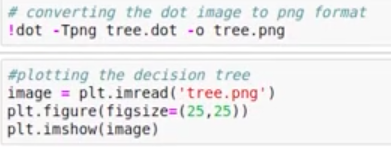

# Gradient Boost Regressor

In [229]:
 from sklearn.ensemble import GradientBoostingRegressor

In [741]:
params = {'n_estimators': 500, 'max_depth': 4, 'min_samples_split': 2,
          'learning_rate': 0.01, 'loss': 'ls'}
GBR=GradientBoostingRegressor(**params)

In [576]:
regressionModelfit_CV(GBR,xtrainDF.columns, xtrainDF, ytrainDF)

fit_time =7.19
score_time =0.06
test_r2 =0.60
train_r2 =0.64
test_neg_mean_absolute_error =27.55
train_neg_mean_absolute_error =26.95
test_neg_mean_squared_error =1083.88
train_neg_mean_squared_error =1029.16
